In [4]:
import uproot

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import scipy.stats as sts
from sklearn.neighbors import KernelDensity
import seaborn as sns
from scipy.optimize import curve_fit, minimize
from copy import deepcopy
from itertools import combinations,permutations


In [3]:
!pip install SciencePlots

Defaulting to user installation because normal site-packages is not writeable


In [4]:
plt.style.use(['notebook', 'science'])
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.title_fontsize'] = 20
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['text.usetex'] = False
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.framealpha'] = 1

plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.titleweight'] = 'bold'

# plt.rcParams.keys()

In [5]:
import ROOT

Welcome to JupyROOT 6.26/08


In [6]:
from parametrize import fff, ffm

In [7]:
def expo1(x, pars):
    return ROOT.TMath.Exp(x[0]*pars[0]+pars[1])+pars[2]
    
def expo1_np(x, pars):
    return np.exp(x*pars[0]+pars[1])+pars[2]


def expo2(x, pars):
    return ROOT.TMath.Exp(pars[0]*x[0] + pars[1]) + ROOT.TMath.Exp(pars[2]*x[0] + pars[3]) + pars[4]

def expo2_np(x, pars):
    return np.exp(pars[0]*x + pars[1]) + np.exp(pars[2]*x + pars[3]) + pars[4]

def pol2(x, a, b, c):
    return a*(x-b)*(x-b)+c

In [8]:
cc_sat = ROOT.TCanvas('sat_fit','', 1000, 800)
def sat_fit(xpar, ypar, expar, eypar, iistart=0, iistop=None, xl=0.02, xu=0.5, pars=None):
#     iistart, iistop = 0, None
    cc_sat.cd(0)
    grcci = ROOT.TGraphErrors(len(xpar[iistart:iistop]), xpar[iistart:iistop], ypar[iistart:iistop], expar[iistart:iistop], eypar[iistart:iistop])
    grcci.SetNameTitle('grcci', ' ;Charge [pC];SAT [ps]')


    fffi = ROOT.TF1('ffsat', expo2, xl, xu, 5)
    wFiti = ROOT.Math.WrappedMultiTF1(fffi, 1);
    fopt =  ROOT.Fit.DataOptions()
    fopt.fCoordErrors = False
    rangeB = ROOT.Fit.DataRange()
    if iistop == None:
        rangeB.SetRange(xpar[iistart], xpar[-1])
    else:
        rangeB.SetRange(xpar[iistart], xpar[iistop])
    dataB = ROOT.Fit.BinData(fopt, rangeB);
    ROOT.Fit.FillData(dataB, grcci);
    chi2f = ROOT.Fit.Chi2Function(dataB, wFiti)

    fitter = ROOT.Fit.Fitter()

    par0 = np.array([-1.19593947e+01,  1.52272605e+01, -5.23861833e-01,  5.09975903e+00, 100])
    if pars != None:
        par0 = np.array(pars)
        
    fitter.Config().SetParamsSettings(5, par0)
    fitter.Config().MinimizerOptions().SetPrintLevel(1)
    fitter.Config().MinimizerOptions().SetMaxFunctionCalls(100000) # for Minuit/Minuit2
    fitter.Config().MinimizerOptions().SetMaxIterations(10000) # for GSL
    fitter.Config().SetMinimizer("Minuit2", "Migrad")

    fitter.FitFCN(chi2f)
    result = fitter.Result()

    parsi = np.zeros(5)
    for i in range(5):
        parsi[i] = fffi.GetParameter(i)
#     print(parsi)


    grcci.GetListOfFunctions().Add(fffi)
    grcci.DrawClone('ap')

    cc_sat.Draw()
    return parsi

In [9]:
NPADS = 6

In [5]:
scan_files = {'/eos/home-i/iangelis/RD51/code/quadpad/runs/October2022/run148.root':'Pico'}

In [6]:
vall = uproot.concatenate(scan_files,['mcp1_v', 'mcp1_q', 'mcp1_t', \
'mcp2_v', 'mcp2_q', 'mcp2_t', \
'mcp3_v', 'mcp3_q', 'mcp3_t', \
'mm1_v', 'mm1_qe', 'mm1_qall', 'mm1_qfit', 'mm1_t', \
'mm2_v', 'mm2_qe', 'mm2_qall', 'mm2_qfit', 'mm2_t', \
'mm3_v', 'mm3_qe', 'mm3_qall', 'mm3_qfit', 'mm3_t', \
'mm4_v', 'mm4_qe', 'mm4_qall', 'mm4_qfit', 'mm4_t', \
'mm5_v', 'mm5_qe', 'mm5_qall', 'mm5_qfit', 'mm5_t', \
'mm6_v', 'mm6_qe', 'mm6_qall', 'mm6_qfit', 'mm6_t', \
'xy', 'chi2', 'ntracks', 'track_flag'], library='np')



PermissionError: [Errno 1] Operation not permitted: '/eos/home-i/iangelis/RD51/code/quadpad/runs/October2022/run148.root'

In [12]:
track_flag  = vall['track_flag']
valid_tracks = track_flag == 1

In [13]:
mcp1_v   = vall['mcp1_v'][valid_tracks]
mcp1_q   = vall['mcp1_q'][valid_tracks]
mcp1_t   = vall['mcp1_t'][valid_tracks]
mcp2_v   = vall['mcp2_v'][valid_tracks]
mcp2_q   = vall['mcp2_q'][valid_tracks]
mcp2_t   = vall['mcp2_t'][valid_tracks]
mcp3_v   = vall['mcp3_v'][valid_tracks]
mcp3_q   = vall['mcp3_q'][valid_tracks]
mcp3_t   = vall['mcp3_t'][valid_tracks]
mm1_v    = vall['mm1_v'][valid_tracks]
mm1_t    = vall['mm1_t'][valid_tracks]
mm1_qe   = vall['mm1_qe'][valid_tracks]
mm1_qall = vall['mm1_qall'][valid_tracks]
mm1_qfit = vall['mm1_qfit'][valid_tracks]
mm2_v    = vall['mm2_v'][valid_tracks]
mm2_t    = vall['mm2_t'][valid_tracks]
mm2_qe   = vall['mm2_qe'][valid_tracks]
mm2_qall = vall['mm2_qall'][valid_tracks]
mm2_qfit = vall['mm2_qfit'][valid_tracks]
mm3_v    = vall['mm3_v'][valid_tracks]
mm3_t    = vall['mm3_t'][valid_tracks]
mm3_qe   = vall['mm3_qe'][valid_tracks]
mm3_qall = vall['mm3_qall'][valid_tracks]
mm3_qfit = vall['mm3_qfit'][valid_tracks]
mm4_v    = vall['mm4_v'][valid_tracks]
mm4_t    = vall['mm4_t'][valid_tracks]
mm4_qe   = vall['mm4_qe'][valid_tracks]
mm4_qall = vall['mm4_qall'][valid_tracks]
mm4_qfit = vall['mm4_qfit'][valid_tracks]
mm5_v    = vall['mm5_v'][valid_tracks]
mm5_t    = vall['mm5_t'][valid_tracks]
mm5_qe   = vall['mm5_qe'][valid_tracks]
mm5_qall = vall['mm5_qall'][valid_tracks]
mm5_qfit = vall['mm5_qfit'][valid_tracks]
mm6_v    = vall['mm6_v'][valid_tracks]
mm6_t    = vall['mm6_t'][valid_tracks]
mm6_qe   = vall['mm6_qe'][valid_tracks]
mm6_qall = vall['mm6_qall'][valid_tracks]
mm6_qfit = vall['mm6_qfit'][valid_tracks]

xy       = vall['xy'][valid_tracks]
chi2     = vall['chi2'][valid_tracks]
ntracks  = vall['ntracks'][valid_tracks]


In [1]:
xy       = vall['xy'][valid_tracks]

NameError: name 'vall' is not defined

In [14]:
mm_vs = [ mm1_v, mm2_v, mm3_v, mm4_v, mm5_v, mm6_v ]
mm_qes = [ mm1_qe, mm2_qe, mm3_qe, mm4_qe, mm5_qe, mm6_qe ]
mm_qalls = [ mm1_qall, mm2_qall, mm3_qall, mm4_qall, mm5_qall, mm6_qall ]
mm_qfits = [ mm1_qfit, mm2_qfit, mm3_qfit, mm4_qfit, mm5_qfit, mm6_qfit ]

In [15]:
dt1 = mm1_t - mcp1_t
dt2 = mm2_t - mcp1_t
dt3 = mm3_t - mcp2_t
dt4 = mm4_t - mcp2_t
dt5 = mm5_t - mcp3_t
dt6 = mm6_t - mcp3_t

In [16]:
mm_dts = [ dt1, dt2, dt3, dt4, dt5, dt6 ]

In [17]:
def sym_to_beam(xy , theta):
    x,y = xy
    return (x*np.cos(theta)+y*np.sin(theta), -x*np.sin(theta)+y*np.cos(theta))

In [18]:
colors = ['red', 'blue', 'magenta', 'green', 'orange', 'cyan']
pnames = ['Pad 27', 'Pad 37', 'Pad 28', 'Pad 38', 'Pad 29', 'Pad 39']

In [19]:
N = len(mcp1_v)
print(N)

518803


In [20]:
pad_order = [4,2,0,5,3,1]

In [21]:
# PAD: 1, name: 27, center coords (x,y) = (55.1422224110843, 57.34553425762093)
# PAD: 2, name: 37, center coords (x,y) = (55.19817009953217, 47.32569045364089)
# PAD: 3, name: 28, center coords (x,y) = (45.12237860710425, 57.28958656917306)
# PAD: 4, name: 38, center coords (x,y) = (45.178326295552125, 47.269742765193016)
# PAD: 5, name: 29, center coords (x,y) = (35.1025348031242, 57.23363888072518)
# PAD: 6, name: 39, center coords (x,y) = (35.15848249157207, 47.213795076745136)
# Angle theta of x_local with respect to x_beam : 0.0055836 rads
# Cross 1 (left) coords in beam frame: (x_cross1, y_cross1) = (40.1408732879686, 52.25194393206103)
# Cross 2 (right) coords in beam frame: (x_cross2, y_cross2) = (50.160717093663706, 52.30789131335189)

In [22]:
fxs = np.array([55.1422224110843,55.19817009953217,45.12237860710425,45.178326295552125,35.1025348031242,35.15848249157207])
fys = np.array([57.34553425762093,47.32569045364089,57.28958656917306,47.269742765193016,57.23363888072518,47.213795076745136])

centers = np.stack((fxs,fys), axis=0)
cross2 = np.array([[40.1408732879686, 52.25194393206103],[50.160717093663706, 52.30789131335189]])
theta = 0.0055836

# center = np.array([45.075, 52.27945])
center = np.array([45.150795190816154, 52.27991762270646])

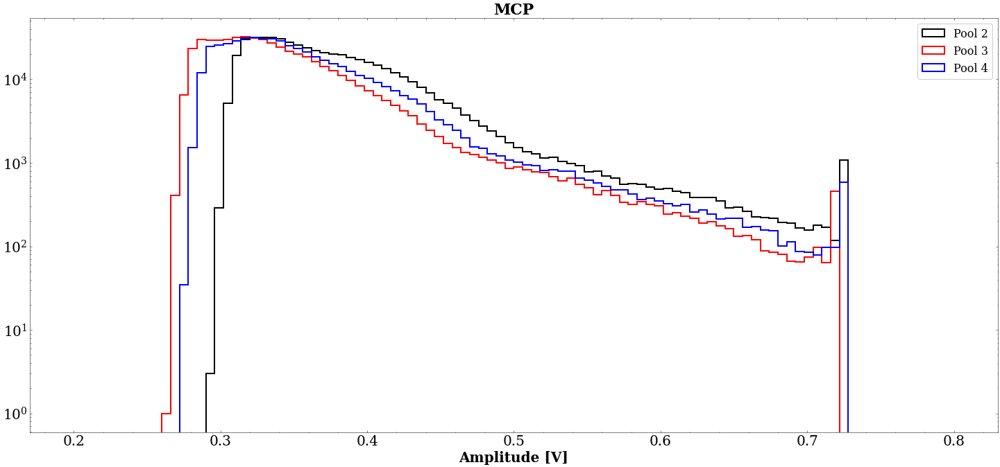

In [23]:
fig, axs = plt.subplots(figsize=(25, 11))
axs.hist(mcp1_v, bins=100, range=(0.2, 0.8), histtype='step', color='black', lw=2, label='Pool 2')
axs.hist(mcp2_v, bins=100, range=(0.2, 0.8), histtype='step', color='red', lw=2, label='Pool 3')
axs.hist(mcp3_v, bins=100, range=(0.2, 0.8), histtype='step', color='blue', lw=2, label='Pool 4')
axs.set_yscale('log')
axs.set_xlabel('Amplitude [V]')
axs.set_title('MCP')
axs.legend()
plt.show()

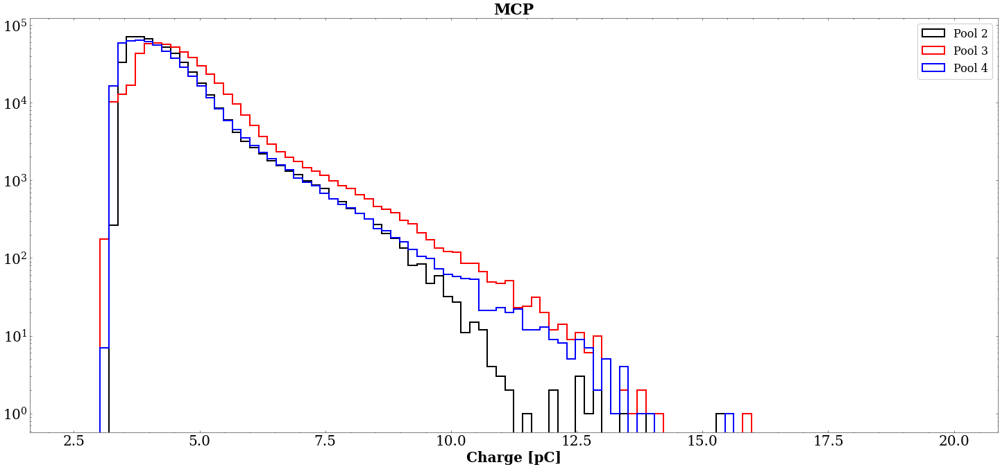

In [24]:
fig, axs = plt.subplots(figsize=(25, 11))
axs.hist(mcp1_q, bins=100, range=(2.5, 20), histtype='step', color='black', lw=2, label='Pool 2')
axs.hist(mcp2_q, bins=100, range=(2.5, 20), histtype='step', color='red', lw=2, label='Pool 3')
axs.hist(mcp3_q, bins=100, range=(2.5, 20), histtype='step', color='blue', lw=2, label='Pool 4')
axs.set_yscale('log')
axs.set_xlabel('Charge [pC]')
axs.set_title('MCP')
axs.legend()
plt.show()

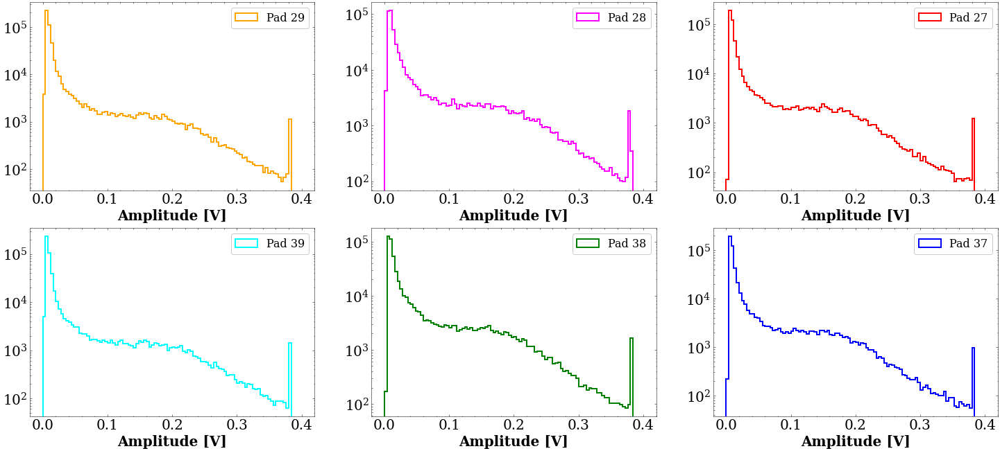

In [25]:
fig, axs = plt.subplots(2, 3, figsize=(25, 11))
axs = axs.ravel()

for i,j in enumerate(pad_order):
    axs[i].hist(mm_vs[j], bins=100, range=(0, .4), histtype='step', color=colors[j], lw=2, label=pnames[j])
    
# axs[0].hist(mm1_v, bins=100, range=(0, .4), histtype='step', color=colors[0], lw=2, label=pnames[0])
# axs[1].hist(mm2_v, bins=100, range=(0, .4), histtype='step', color=colors[1], lw=2, label=pnames[1])
# axs[2].hist(mm3_v, bins=100, range=(0, .4), histtype='step', color=colors[2], lw=2, label=pnames[2])
# axs[3].hist(mm4_v, bins=100, range=(0, .4), histtype='step', color=colors[3], lw=2, label=pnames[3])
# axs[4].hist(mm5_v, bins=100, range=(0, .4), histtype='step', color=colors[4], lw=2, label=pnames[4])
# axs[5].hist(mm6_v, bins=100, range=(0, .4), histtype='step', color=colors[5], lw=2, label=pnames[5])

for i in range(6):
    axs[i].set_yscale('log')
    axs[i].set_xlabel('Amplitude [V]') 
    axs[i].legend()

plt.show()

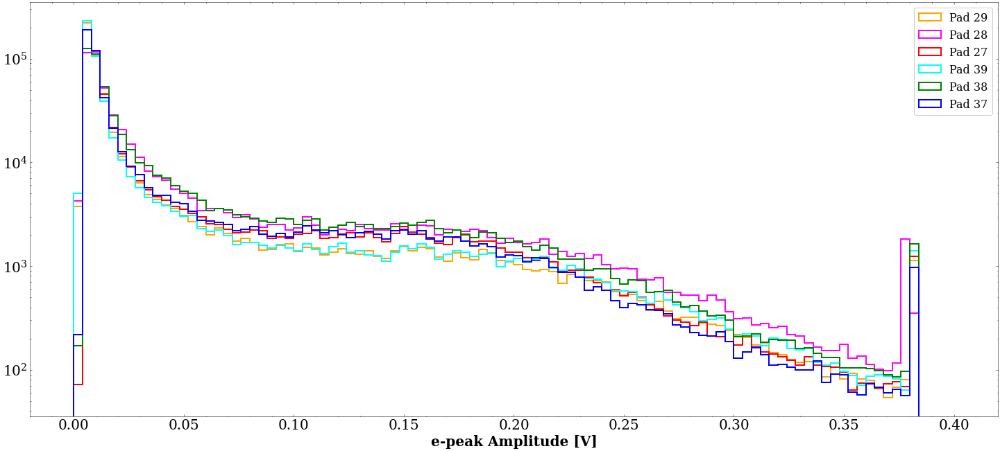

In [26]:
fig, axs = plt.subplots(figsize=(25, 11))
for i,j in enumerate(pad_order):
    axs.hist(mm_vs[j], bins=100, range=(0, .4), histtype='step', color=colors[j], lw=2, label=pnames[j])
# axs.hist(mm1_v, bins=100, range=(0, .4), histtype='step', color=colors[0], lw=2, label=pnames[0])
# axs.hist(mm2_v, bins=100, range=(0, .4), histtype='step', color=colors[1], lw=2, label=pnames[1])
# axs.hist(mm3_v, bins=100, range=(0, .4), histtype='step', color=colors[2], lw=2, label=pnames[2])
# axs.hist(mm4_v, bins=100, range=(0, .4), histtype='step', color=colors[3], lw=2, label=pnames[3])
# axs.hist(mm5_v, bins=100, range=(0, .4), histtype='step', color=colors[4], lw=2, label=pnames[4])
# axs.hist(mm6_v, bins=100, range=(0, .4), histtype='step', color=colors[5], lw=2, label=pnames[5])
axs.legend()
axs.set_yscale('log')
axs.set_xlabel("e-peak Amplitude [V]")
plt.show()

In [27]:
mcp1_cut = np.logical_and((mcp1_v > 0.3),(mcp1_v < 0.7))
mcp2_cut = np.logical_and((mcp2_v > 0.3),(mcp2_v < 0.7))
mcp3_cut = np.logical_and((mcp3_v > 0.3),(mcp3_v < 0.7))

mm1_cut = np.logical_and((mm1_v > 0.02),(mm1_v < 0.37))
mm2_cut = np.logical_and((mm2_v > 0.02),(mm2_v < 0.37))
mm3_cut = np.logical_and((mm3_v > 0.02),(mm3_v < 0.37))
mm4_cut = np.logical_and((mm4_v > 0.02),(mm4_v < 0.37))
mm5_cut = np.logical_and((mm5_v > 0.02),(mm5_v < 0.37))
mm6_cut = np.logical_and((mm6_v > 0.02),(mm6_v < 0.37))

cc1 = np.logical_and(mcp1_cut, mm1_cut)
cc2 = np.logical_and(mcp1_cut, mm2_cut)
cc3 = np.logical_and(mcp2_cut, mm3_cut)
cc4 = np.logical_and(mcp2_cut, mm4_cut)
cc5 = np.logical_and(mcp3_cut, mm5_cut)
cc6 = np.logical_and(mcp3_cut, mm6_cut)

In [28]:
mm_mcp_cuts = [cc1,cc2,cc3,cc4,cc5,cc6]

In [29]:
mm_cuts = [mm1_cut,mm2_cut,mm3_cut,mm4_cut,mm5_cut,mm6_cut]

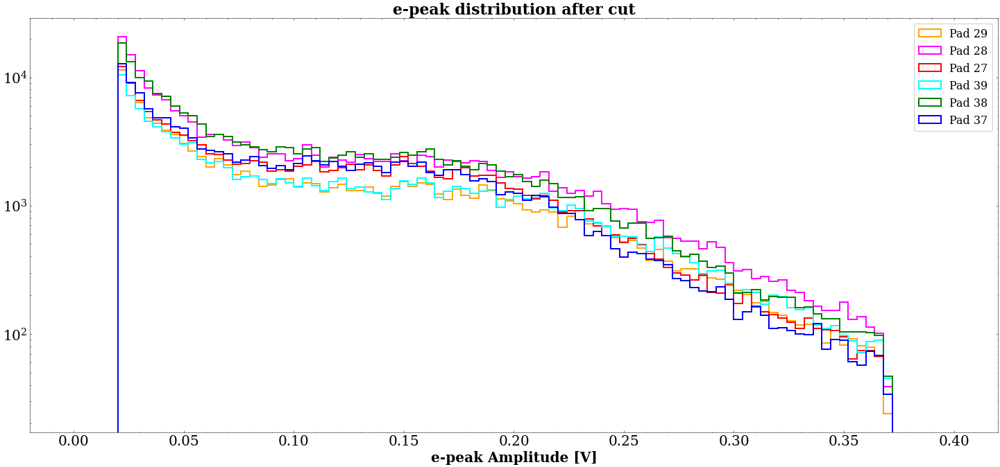

In [30]:
fig, axs = plt.subplots(figsize=(25, 11))
for i,j in enumerate(pad_order):
    axs.hist(mm_vs[j][mm_cuts[j]], bins=100, range=(0, .4), histtype='step', color=colors[j], lw=2, label=pnames[j])


axs.legend()
axs.set_yscale('log')
axs.set_xlabel("e-peak Amplitude [V]")
axs.set_title("e-peak distribution after cut")

plt.show()

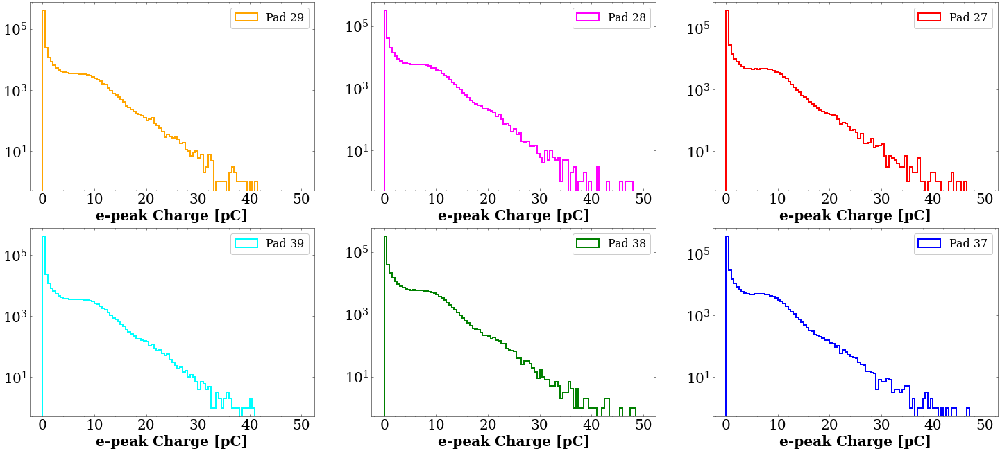

In [31]:
fig, axs = plt.subplots(2, 3, figsize=(25, 11))
axs = axs.ravel()
for i,j in enumerate(pad_order):
    axs[i].hist(mm_qes[j], bins=100, range=(0, 50), histtype='step', color=colors[j], lw=2, label=pnames[j])


for i in range(6):
    axs[i].set_yscale('log')
    axs[i].set_xlabel('e-peak Charge [pC]')
    axs[i].legend()

plt.show()

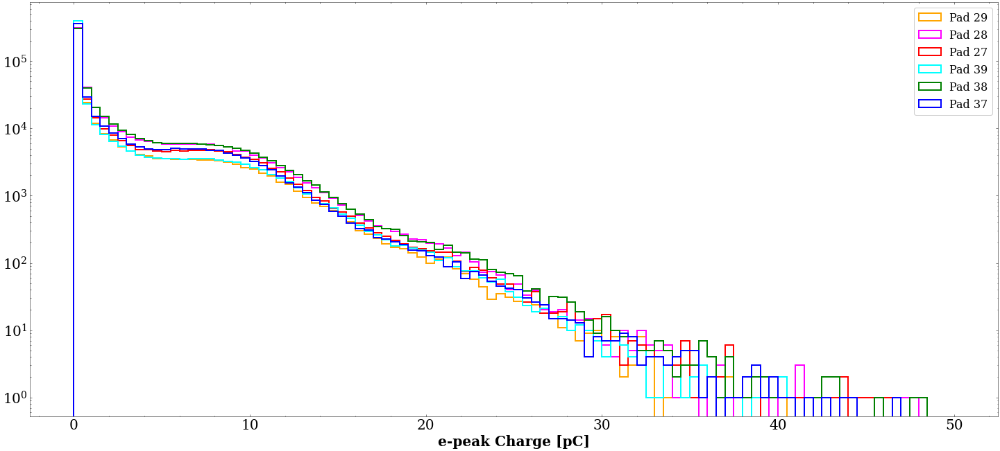

In [32]:
fig, axs = plt.subplots(figsize=(25, 11))
for i,j in enumerate(pad_order):
    axs.hist(mm_qes[j], bins=100, range=(0, 50), histtype='step', color=colors[j], lw=2, label=pnames[j])


# axs.hist(mm1_qe, bins=100, range=(0, 50), histtype='step', color=colors[0], lw=2, label=pnames[0])
# axs.hist(mm2_qe, bins=100, range=(0, 50), histtype='step', color=colors[1], lw=2, label=pnames[1])
# axs.hist(mm3_qe, bins=100, range=(0, 50), histtype='step', color=colors[2], lw=2, label=pnames[2])
# axs.hist(mm4_qe, bins=100, range=(0, 50), histtype='step', color=colors[3], lw=2, label=pnames[3])
# axs.hist(mm5_qe, bins=100, range=(0, 50), histtype='step', color=colors[4], lw=2, label=pnames[4])
# axs.hist(mm6_qe, bins=100, range=(0, 50), histtype='step', color=colors[5], lw=2, label=pnames[5])
axs.legend()
axs.set_yscale('log')
axs.set_xlabel("e-peak Charge [pC]")
plt.show()

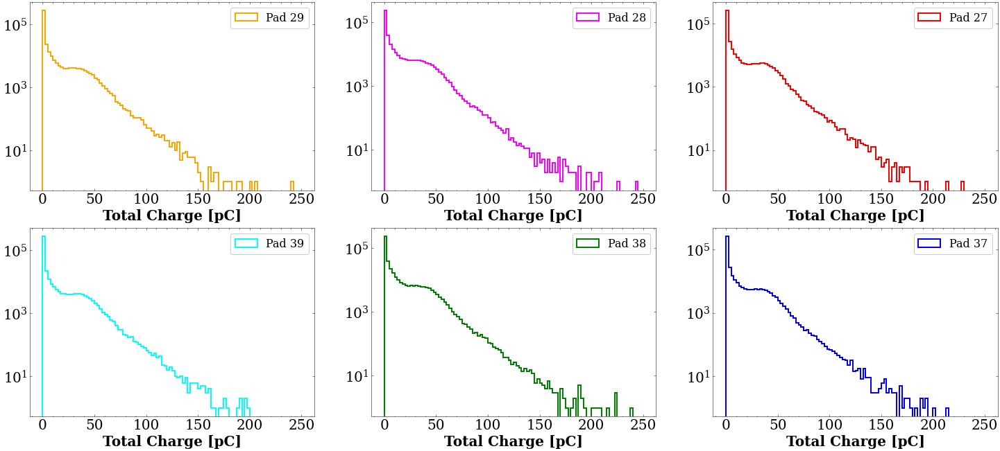

In [33]:
fig, axs = plt.subplots(2,3,figsize=(25, 11))

axs=axs.ravel()

qrange = 250
for i,j in enumerate(pad_order):
    axs[i].hist(mm_qalls[j], bins=100, range=(0, qrange), histtype='step', color=colors[j], lw=2, label=pnames[j])


for i in range(NPADS):
    axs[i].set_yscale('log')
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].legend()

plt.show()

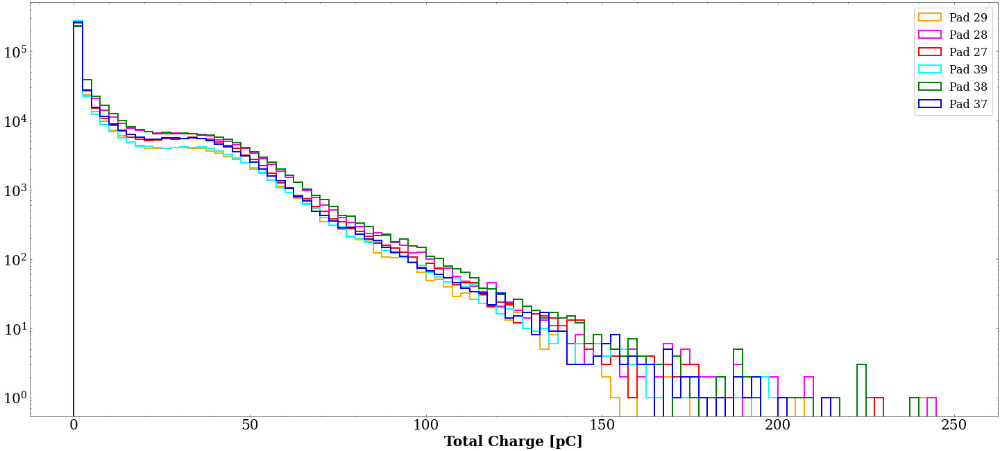

In [34]:
fig, axs = plt.subplots(figsize=(25, 11))
# ov1 = np.logical_and((mm1_v > 0.01),(mm1_v < 0.38))
# ov2 = np.logical_and((mm2_v > 0.01),(mm2_v < 0.38))
# ov3 = np.logical_and((mm3_v > 0.01),(mm3_v < 0.38))
# ov4 = np.logical_and((mm4_v > 0.01),(mm4_v < 0.38))
# axs.hist(mm1_qall[ov1], bins=100, range=(0, 100), histtype='step', color=colors[0], lw=2, label=pnames[0])
# axs.hist(mm2_qall[ov2], bins=100, range=(0, 100), histtype='step', color=colors[1], lw=2, label=pnames[1])
# axs.hist(mm3_qall[ov3], bins=100, range=(0, 100), histtype='step', color=colors[2], lw=2, label=pnames[2])
# axs.hist(mm4_qall[ov4], bins=100, range=(0, 100), histtype='step', color=colors[3], lw=2, label=pnames[3])


qrange = 250
for i,j in enumerate(pad_order):
    axs.hist(mm_qalls[j], bins=100, range=(0, qrange), histtype='step', color=colors[j], lw=2, label=pnames[j])

# axs.hist(mm1_qall, bins=100, range=(0, qrange), histtype='step', color=colors[0], lw=2, label=pnames[0])
# axs.hist(mm2_qall, bins=100, range=(0, qrange), histtype='step', color=colors[1], lw=2, label=pnames[1])
# axs.hist(mm3_qall, bins=100, range=(0, qrange), histtype='step', color=colors[2], lw=2, label=pnames[2])
# axs.hist(mm4_qall, bins=100, range=(0, qrange), histtype='step', color=colors[3], lw=2, label=pnames[3])
# axs.hist(mm5_qall, bins=100, range=(0, qrange), histtype='step', color=colors[4], lw=2, label=pnames[4])
# axs.hist(mm6_qall, bins=100, range=(0, qrange), histtype='step', color=colors[5], lw=2, label=pnames[5])



axs.legend()
axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

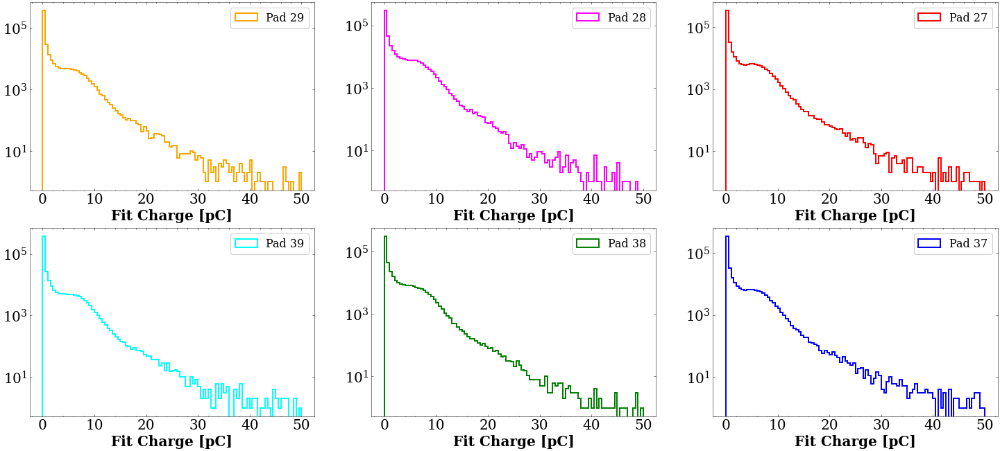

In [35]:
fig, axs = plt.subplots(2,3,figsize=(25, 11))

axs=axs.ravel()

for i,j in enumerate(pad_order):
    axs[i].hist(mm_qfits[j], bins=100, range=(0, 50), histtype='step', color=colors[j], lw=2, label=pnames[j])


for i in range(NPADS):
    axs[i].set_yscale('log')
    axs[i].set_xlabel('Fit Charge [pC]')
    axs[i].legend()

plt.show()

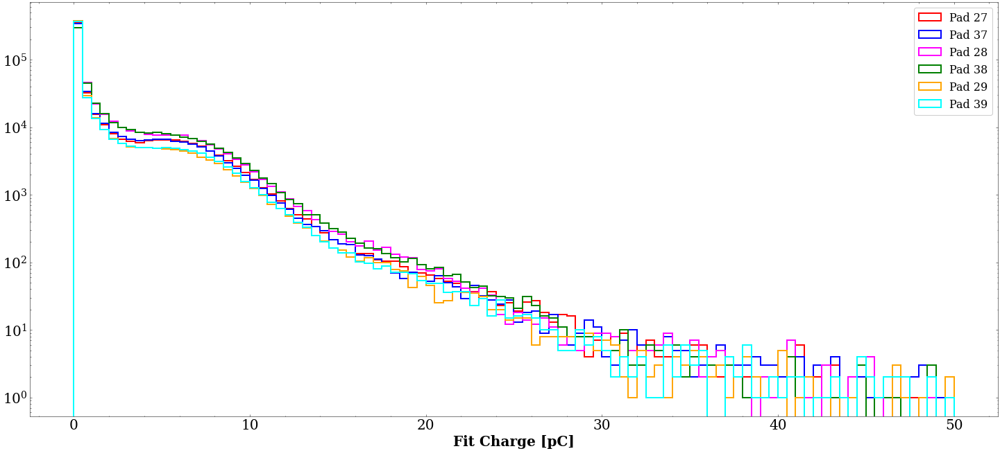

In [36]:
fig, axs = plt.subplots(figsize=(25, 11))
axs.hist(mm1_qfit, bins=100, range=(0, 50), histtype='step', color=colors[0], lw=2, label=pnames[0])
axs.hist(mm2_qfit, bins=100, range=(0, 50), histtype='step', color=colors[1], lw=2, label=pnames[1])
axs.hist(mm3_qfit, bins=100, range=(0, 50), histtype='step', color=colors[2], lw=2, label=pnames[2])
axs.hist(mm4_qfit, bins=100, range=(0, 50), histtype='step', color=colors[3], lw=2, label=pnames[3])
axs.hist(mm5_qfit, bins=100, range=(0, 50), histtype='step', color=colors[4], lw=2, label=pnames[4])
axs.hist(mm6_qfit, bins=100, range=(0, 50), histtype='step', color=colors[5], lw=2, label=pnames[5])
axs.legend()
axs.set_yscale('log')
axs.set_xlabel("Fit Charge [pC]")
plt.show()

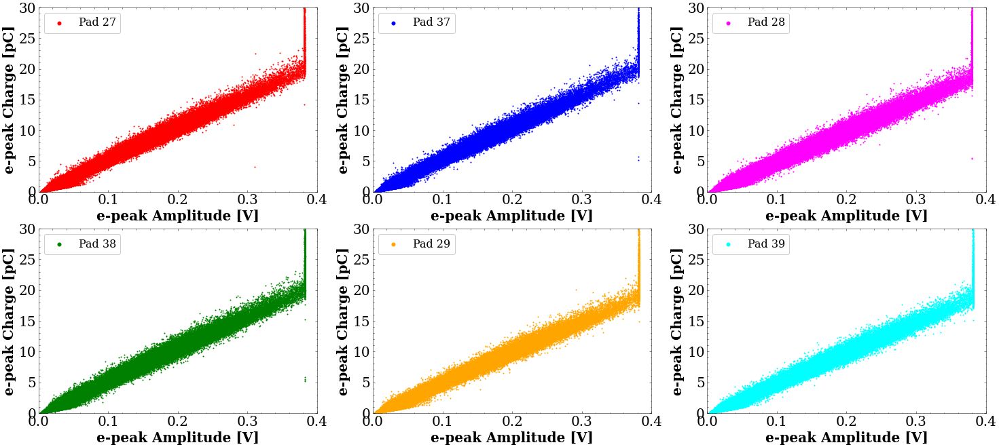

In [37]:
fig, axs = plt.subplots(2, 3, figsize=(25, 11))
axs = axs.ravel()
axs[0].scatter(mm1_v, mm1_qe, s=1, color=colors[0], label=pnames[0])
axs[1].scatter(mm2_v, mm2_qe, s=1, color=colors[1], label=pnames[1])
axs[2].scatter(mm3_v, mm3_qe, s=1, color=colors[2], label=pnames[2])
axs[3].scatter(mm4_v, mm4_qe, s=1, color=colors[3], label=pnames[3])
axs[4].scatter(mm5_v, mm5_qe, s=1, color=colors[4], label=pnames[4])
axs[5].scatter(mm6_v, mm6_qe, s=1, color=colors[5], label=pnames[5])

for i in range(6):
    axs[i].set_xlabel('e-peak Amplitude [V]')
    axs[i].set_ylabel('e-peak Charge [pC]')
    axs[i].set_xlim(0, 0.4)
    axs[i].set_ylim(0, 30)
    axs[i].legend(loc=2, markerscale=5)

plt.show()

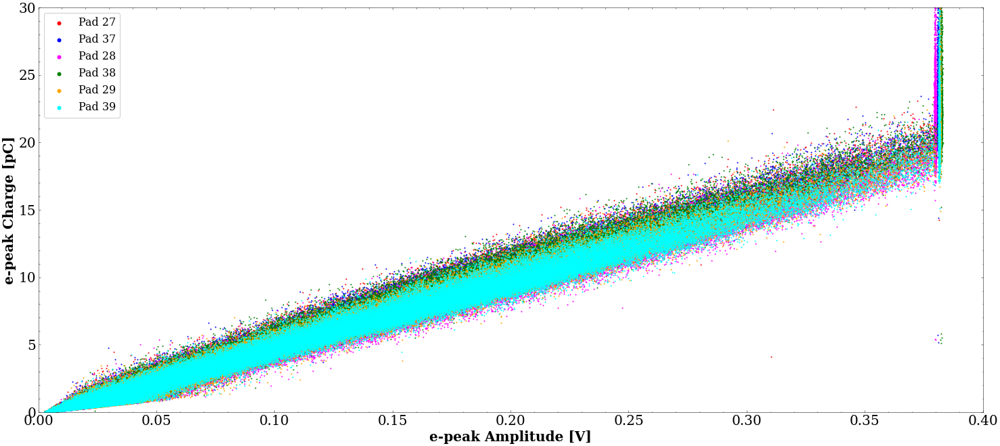

In [38]:
fig, axs = plt.subplots(figsize=(25, 11))

axs.scatter(mm1_v, mm1_qe, s=1, color=colors[0], label=pnames[0])
axs.scatter(mm2_v, mm2_qe, s=1, color=colors[1], label=pnames[1])
axs.scatter(mm3_v, mm3_qe, s=1, color=colors[2], label=pnames[2])
axs.scatter(mm4_v, mm4_qe, s=1, color=colors[3], label=pnames[3])
axs.scatter(mm5_v, mm5_qe, s=1, color=colors[4], label=pnames[4])
axs.scatter(mm6_v, mm6_qe, s=1, color=colors[5], label=pnames[5])

axs.set_xlabel('e-peak Amplitude [V]')
axs.set_ylabel('e-peak Charge [pC]')
axs.set_xlim(0, 0.4)
axs.set_ylim(0, 30)
axs.legend(loc=2, markerscale=5)

plt.show()

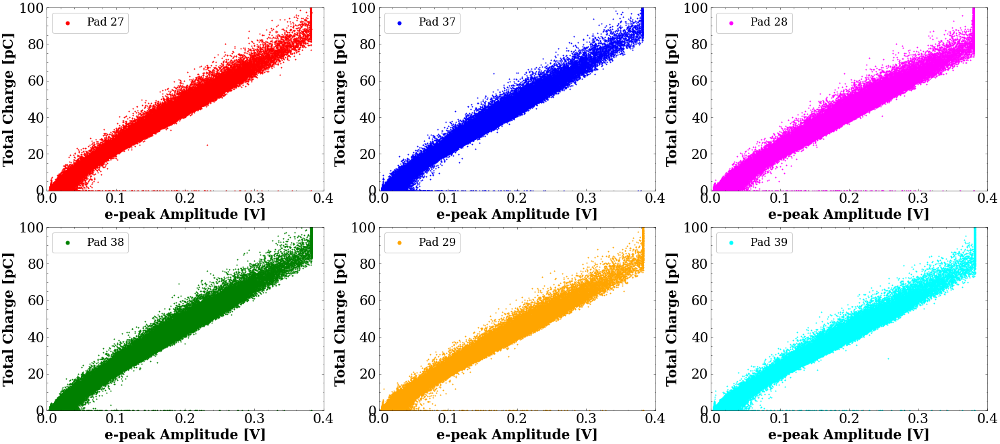

In [39]:
fig, axs = plt.subplots(2, 3, figsize=(25, 11))
axs = axs.ravel()
axs[0].scatter(mm1_v, mm1_qall, s=1, color=colors[0], label=pnames[0])
axs[1].scatter(mm2_v, mm2_qall, s=1, color=colors[1], label=pnames[1])
axs[2].scatter(mm3_v, mm3_qall, s=1, color=colors[2], label=pnames[2])
axs[3].scatter(mm4_v, mm4_qall, s=1, color=colors[3], label=pnames[3])
axs[4].scatter(mm5_v, mm5_qall, s=1, color=colors[4], label=pnames[4])
axs[5].scatter(mm6_v, mm6_qall, s=1, color=colors[5], label=pnames[5])

for i in range(6):
    axs[i].set_xlabel('e-peak Amplitude [V]')
    axs[i].set_ylabel('Total Charge [pC]')
    axs[i].set_xlim(0, 0.4)
    axs[i].set_ylim(0, 100)
    axs[i].legend(loc=2, markerscale=5)

plt.show()

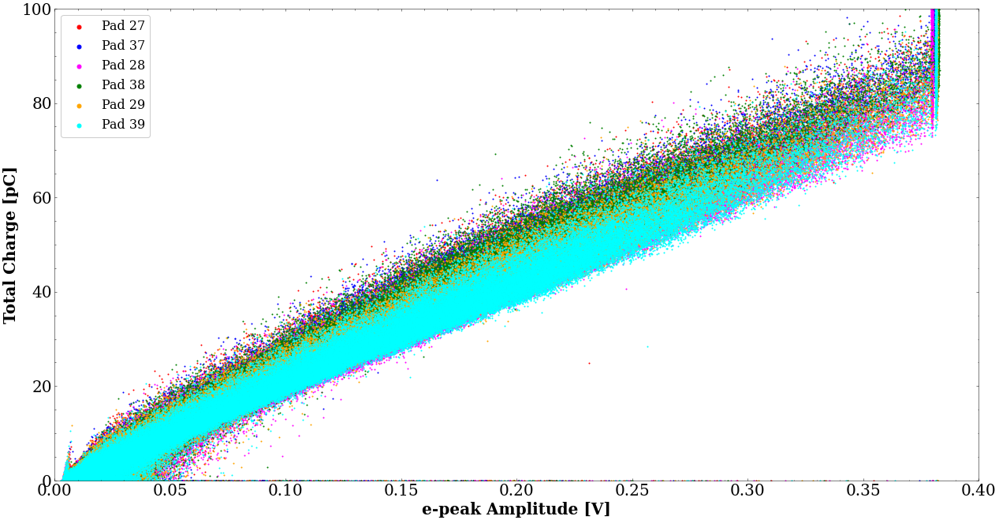

In [40]:
fig, axs = plt.subplots(figsize=(21, 11))
axs.scatter(mm1_v, mm1_qall, s=1, color=colors[0], label=pnames[0])
axs.scatter(mm2_v, mm2_qall, s=1, color=colors[1], label=pnames[1])
axs.scatter(mm3_v, mm3_qall, s=1, color=colors[2], label=pnames[2])
axs.scatter(mm4_v, mm4_qall, s=1, color=colors[3], label=pnames[3])
axs.scatter(mm5_v, mm5_qall, s=1, color=colors[4], label=pnames[4])
axs.scatter(mm6_v, mm6_qall, s=1, color=colors[5], label=pnames[5])

axs.set_xlabel('e-peak Amplitude [V]')
axs.set_ylabel('Total Charge [pC]')

axs.set_xlim(0, 0.4)
axs.set_ylim(0, 100)
axs.legend(loc=2, markerscale=5)
plt.show()

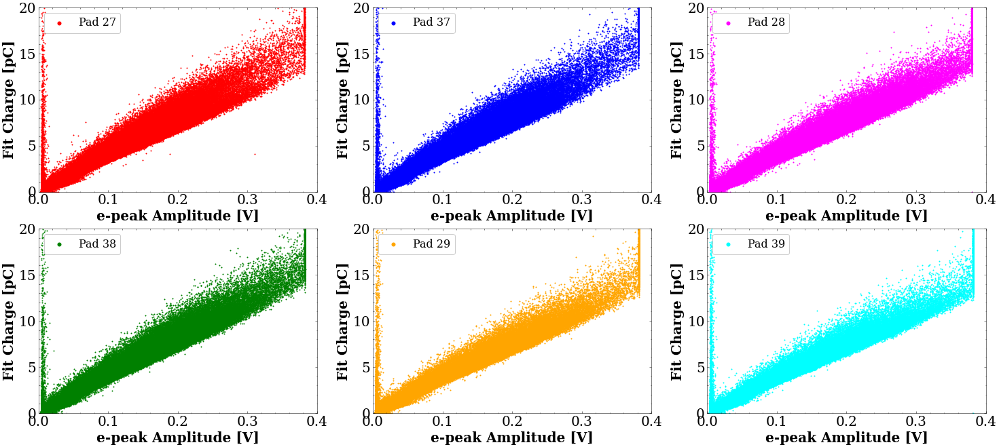

In [41]:
fig, axs = plt.subplots(2, 3, figsize=(25, 11))
axs = axs.ravel()
axs[0].scatter(mm1_v, mm1_qfit, s=1, color=colors[0], label=pnames[0])
axs[1].scatter(mm2_v, mm2_qfit, s=1, color=colors[1], label=pnames[1])
axs[2].scatter(mm3_v, mm3_qfit, s=1, color=colors[2], label=pnames[2])
axs[3].scatter(mm4_v, mm4_qfit, s=1, color=colors[3], label=pnames[3])
axs[4].scatter(mm5_v, mm5_qfit, s=1, color=colors[4], label=pnames[4])
axs[5].scatter(mm6_v, mm6_qfit, s=1, color=colors[5], label=pnames[5])

for i in range(6):
    axs[i].set_xlabel('e-peak Amplitude [V]')
    axs[i].set_ylabel('Fit Charge [pC]')
    axs[i].set_xlim(0, 0.4)
    axs[i].set_ylim(0, 20)
    axs[i].legend(loc=2, markerscale=5)

plt.show()

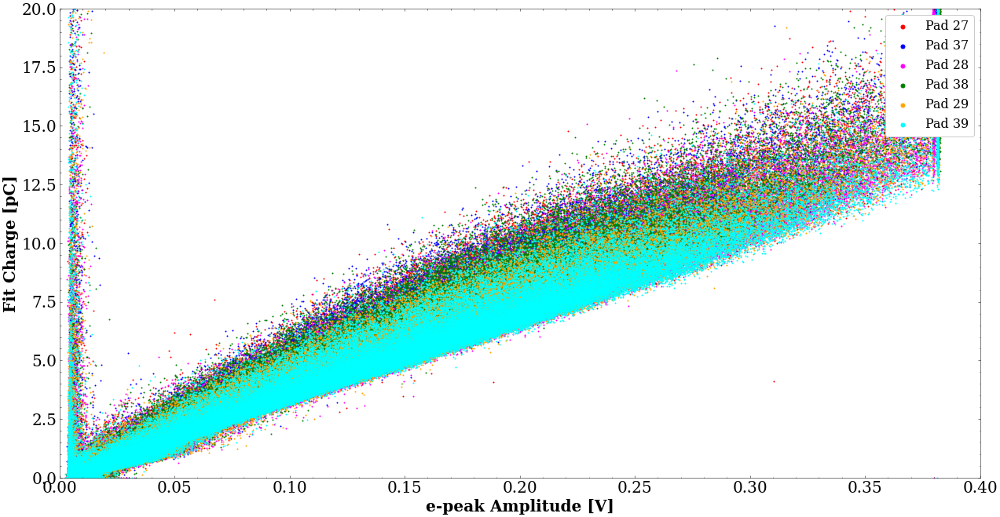

In [42]:
fig, axs = plt.subplots(figsize=(21, 11))
axs.scatter(mm1_v, mm1_qfit, s=1, color=colors[0], label=pnames[0])
axs.scatter(mm2_v, mm2_qfit, s=1, color=colors[1], label=pnames[1])
axs.scatter(mm3_v, mm3_qfit, s=1, color=colors[2], label=pnames[2])
axs.scatter(mm4_v, mm4_qfit, s=1, color=colors[3], label=pnames[3])
axs.scatter(mm5_v, mm5_qfit, s=1, color=colors[4], label=pnames[4])
axs.scatter(mm6_v, mm6_qfit, s=1, color=colors[5], label=pnames[5])

axs.set_xlabel('e-peak Amplitude [V]')
axs.set_ylabel('Fit Charge [pC]')

axs.set_xlim(0, 0.4)
axs.set_ylim(0, 20)
axs.legend(loc=1, markerscale=5)
plt.show()

# Tracks

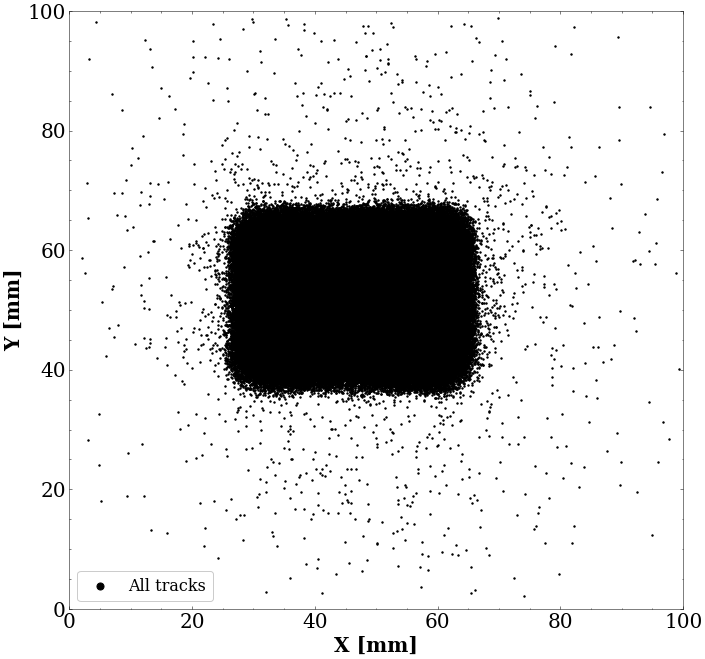

In [43]:
fig, axs = plt.subplots(figsize=(11, 11))
axs.scatter(xy[:, 0], xy[:, 1], s=2, color='black', label='All tracks')
axs.set_xlim(0, 100)
axs.set_ylim(0, 100)
axs.legend(loc=3, markerscale=5)
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
plt.show()

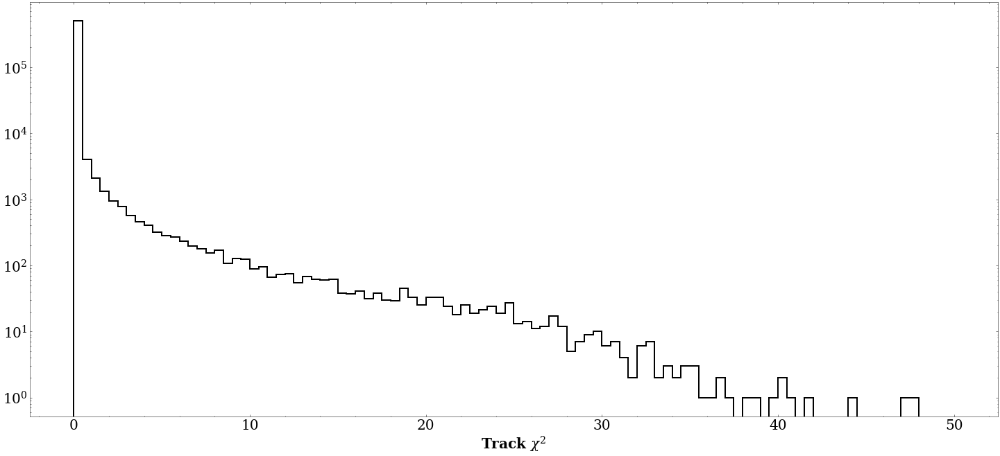

In [44]:
fig, axs = plt.subplots(figsize=(25, 11))
axs.hist(chi2, bins=100, range=(0, 50), histtype='step', color='black', lw=2)


axs.set_yscale('log')
axs.set_xlabel(r'Track $\chi^2$')
plt.show()

In [45]:
vv_thr = 0.01

xyc1 = np.where(np.logical_and(mm1_cut, mm1_v > vv_thr)*(mm1_qall < 250))
xyc2 = np.where(np.logical_and(mm2_cut, mm2_v > vv_thr)*(mm2_qall < 250))
xyc3 = np.where(np.logical_and(mm3_cut, mm3_v > vv_thr)*(mm3_qall < 250))
xyc4 = np.where(np.logical_and(mm4_cut, mm4_v > vv_thr)*(mm4_qall < 250))
xyc5 = np.where(np.logical_and(mm5_cut, mm5_v > vv_thr)*(mm5_qall < 250))
xyc6 = np.where(np.logical_and(mm6_cut, mm6_v > vv_thr)*(mm6_qall < 250))

qq_thr = 5

xyq1 = np.where(np.logical_and(mm1_cut, mm1_qall > qq_thr))
xyq2 = np.where(np.logical_and(mm2_cut, mm2_qall > qq_thr))
xyq3 = np.where(np.logical_and(mm3_cut, mm3_qall > qq_thr))
xyq4 = np.where(np.logical_and(mm4_cut, mm4_qall > qq_thr))
xyq5 = np.where(np.logical_and(mm5_cut, mm5_qall > qq_thr))
xyq6 = np.where(np.logical_and(mm6_cut, mm6_qall > qq_thr))

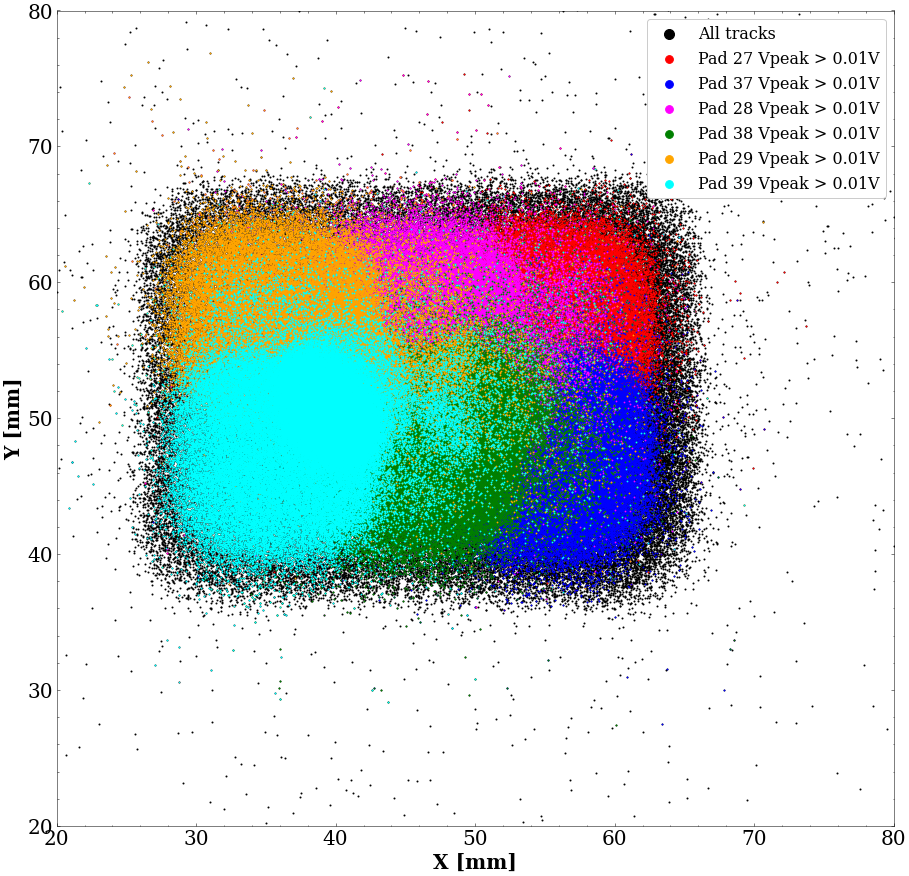

In [46]:
fig, axs = plt.subplots(figsize=(15, 15))
axs.scatter(xy[:, 0], xy[:, 1], s=1, color='black', label='All tracks')
axs.scatter(xy[:, 0][xyc1], xy[:, 1][xyc1], s=0.6, color=colors[0], label=f'{pnames[0]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc2], xy[:, 1][xyc2], s=0.6, color=colors[1], label=f'{pnames[1]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc3], xy[:, 1][xyc3], s=0.6, color=colors[2], label=f'{pnames[2]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc4], xy[:, 1][xyc4], s=0.6, color=colors[3], label=f'{pnames[3]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc5], xy[:, 1][xyc5], s=0.6, color=colors[4], label=f'{pnames[4]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc6], xy[:, 1][xyc6], s=0.6, color=colors[5], label=f'{pnames[5]} Vpeak > {vv_thr}V')
axs.set_xlim(20, 80)
axs.set_ylim(20, 80)
axs.legend(loc=1, markerscale=10)
# axs.set_title(f"Run{rr}")
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
plt.show()

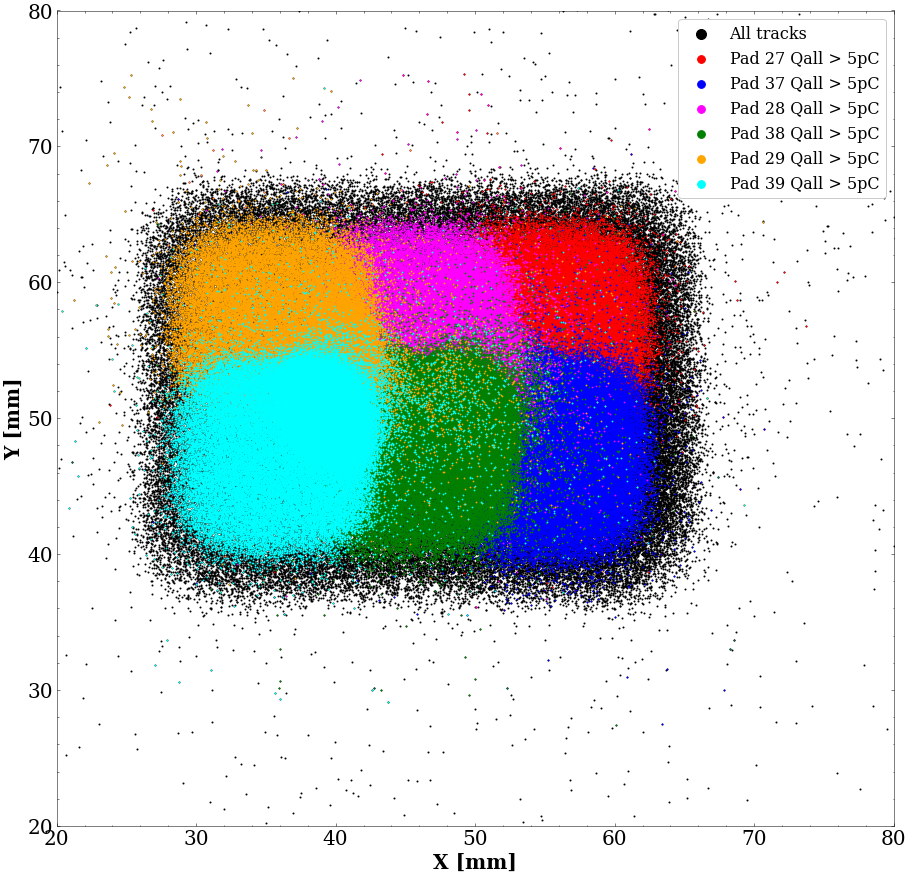

In [47]:
fig, axs = plt.subplots(figsize=(15, 15))
axs.scatter(xy[:, 0], xy[:, 1], s=1, color='black', label='All tracks')
axs.scatter(xy[:, 0][xyq1], xy[:, 1][xyq1], s=0.6, color=colors[0], label=f'{pnames[0]} Qall > {qq_thr}pC')
axs.scatter(xy[:, 0][xyq2], xy[:, 1][xyq2], s=0.6, color=colors[1], label=f'{pnames[1]} Qall > {qq_thr}pC')
axs.scatter(xy[:, 0][xyq3], xy[:, 1][xyq3], s=0.6, color=colors[2], label=f'{pnames[2]} Qall > {qq_thr}pC')
axs.scatter(xy[:, 0][xyq4], xy[:, 1][xyq4], s=0.6, color=colors[3], label=f'{pnames[3]} Qall > {qq_thr}pC')
axs.scatter(xy[:, 0][xyq5], xy[:, 1][xyq5], s=0.6, color=colors[4], label=f'{pnames[4]} Qall > {qq_thr}pC')
axs.scatter(xy[:, 0][xyq6], xy[:, 1][xyq6], s=0.6, color=colors[5], label=f'{pnames[5]} Qall > {qq_thr}pC')
axs.set_xlim(20, 80)
axs.set_ylim(20, 80)
axs.legend(loc=1, markerscale=10)
# axs.set_title(f"Run{rr}")
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
plt.show()

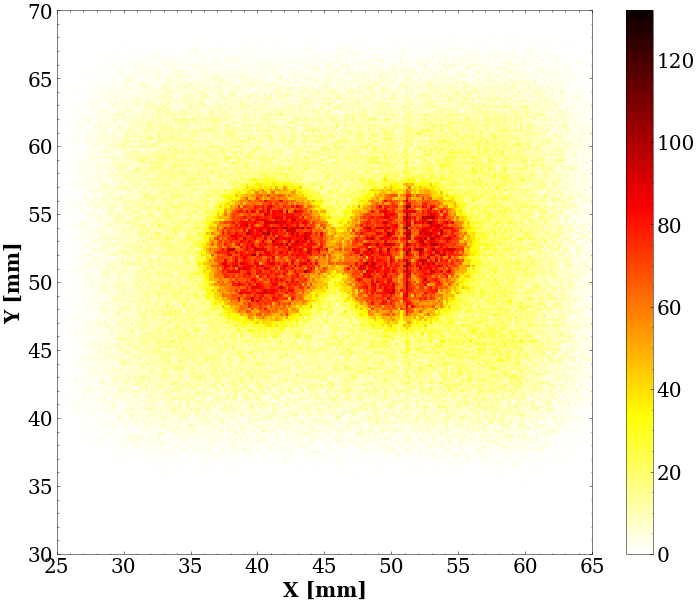

In [48]:
heatmap, yedges, xedges = np.histogram2d(xy[:, 1], xy[:, 0], range=[[30,70],[25,65]], bins=(201, 201))

fig, axs = plt.subplots(figsize=(12, 10))
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
c = axs.pcolormesh(xedges, yedges, heatmap, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs)
plt.show()

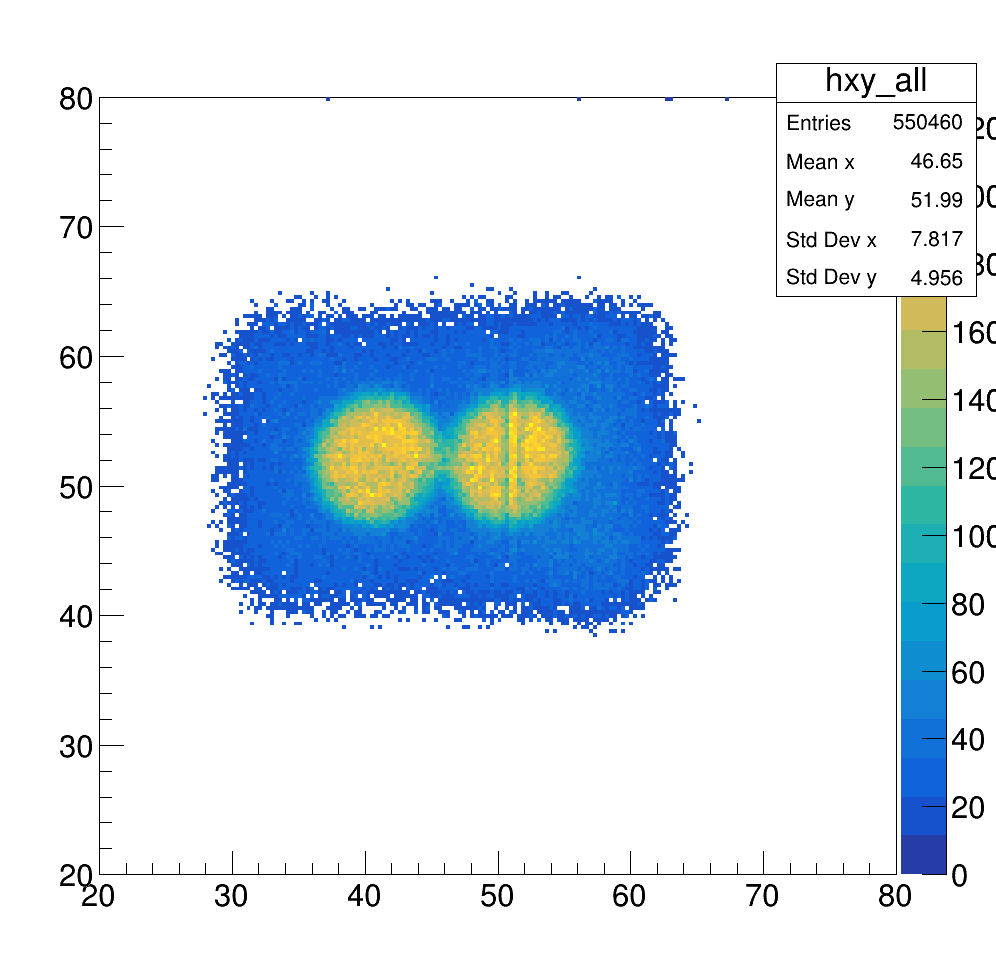

In [49]:
%jsroot off
c = ROOT.TCanvas('c1', '', 1000, 1000)

hxy = ROOT.TH2D("hxy_all", '', 200, 20, 80, 200, 20, 80)
hxy.FillN(xy[:,0].size, np.array(xy[:, 0]), np.array(xy[:, 1]), 0, 1)
# hxy.FillN(len(xy[:,0]), xy[:, 0], xy[:, 1], 0, 1)

for i in range(201*201):
    if hxy.GetBinContent(i) < 15:
        hxy.SetBinContent(i, 0)

hxy.Draw('colz')
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


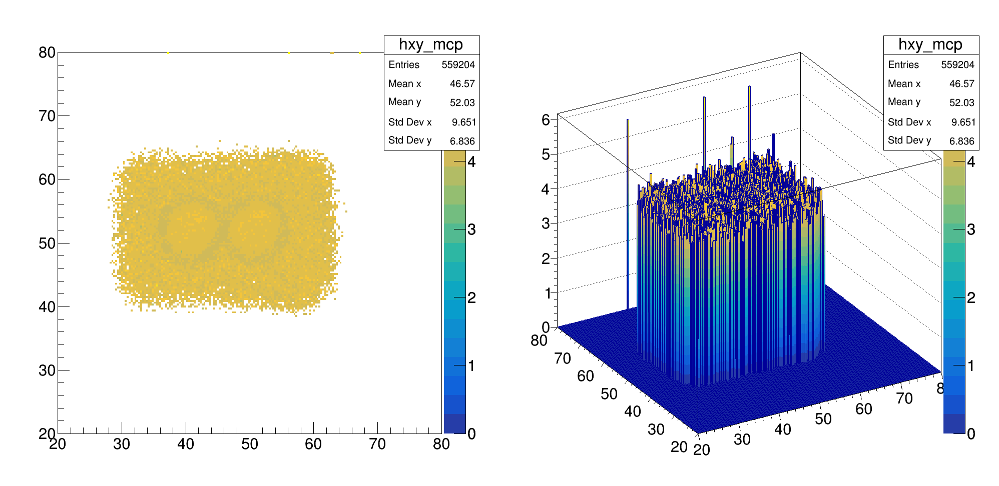

In [50]:
%jsroot off
c = ROOT.TCanvas('c1', '', 2000, 1000)
c.Divide(2, 1)

hxy_mcp = ROOT.TH2D("hxy_mcp", '', 200, 20, 80, 200, 20, 80)
hxy_mcp.FillN(mcp1_q.size, np.array(xy[:, 0]), np.array(xy[:, 1]), mcp1_q, 1)


for i in range(201*201):
    if hxy.GetBinContent(i) < 15 or hxy_mcp.GetBinContent(i) < 0:
        hxy_mcp.SetBinContent(i, 0)
    else:
        hxy_mcp.SetBinContent(i, hxy_mcp.GetBinContent(i)/hxy.GetBinContent(i))


c.cd(1)
hxy_mcp.Draw('colz')
c.cd(2)
hxy_mcp.Draw('lego2z')
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1
Warning in <TROOT::Append>: Replacing existing TH1: hxy_mcp (Potential memory leak).


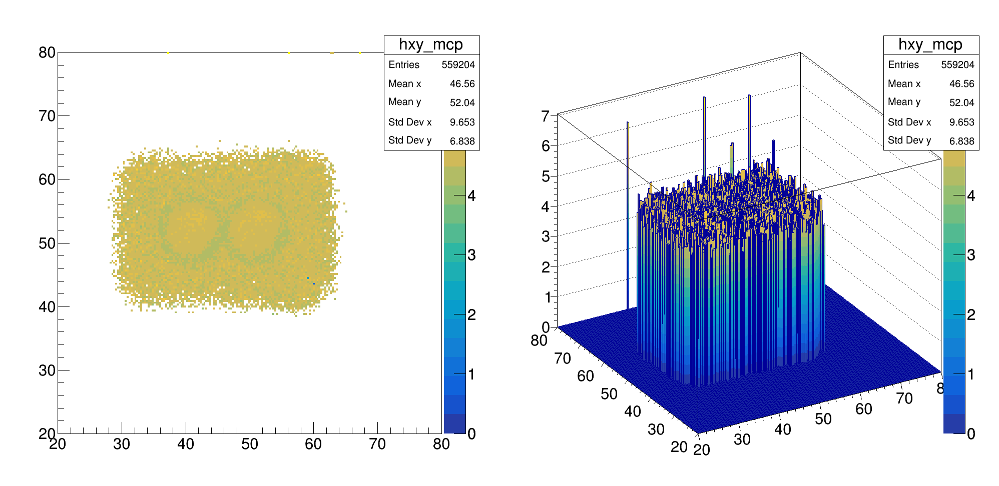

In [51]:
%jsroot off
c = ROOT.TCanvas('c1', '', 2000, 1000)
c.Divide(2, 1)

hxy_mcp = ROOT.TH2D("hxy_mcp", '', 200, 20, 80, 200, 20, 80)
# hxy_mcp.FillN(mcp1_q.size, np.array(xy[:, 0]), np.array(xy[:, 1]), mcp1_q, 1)
hxy_mcp.FillN(mcp1_q.size, np.array(xy[:, 0]), np.array(xy[:, 1]), mcp2_q, 1)
# hxy_mcp.FillN(mcp1_q.size, np.array(xy[:, 0]), np.array(xy[:, 1]), mcp3_q, 1)
# hxy_mcp.FillN(np.count_nonzero(mcp1_cut), xy[:, 0][mcp1_cut], xy[:, 1][mcp1_cut], mcp1_q[mcp1_cut], 1)


for i in range(201*201):
    if hxy.GetBinContent(i) < 15:
        hxy_mcp.SetBinContent(i, 0)
    else:
        hxy_mcp.SetBinContent(i, hxy_mcp.GetBinContent(i)/hxy.GetBinContent(i))


c.cd(1)
hxy_mcp.Draw('colz')
c.cd(2)
hxy_mcp.Draw('lego2z')
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


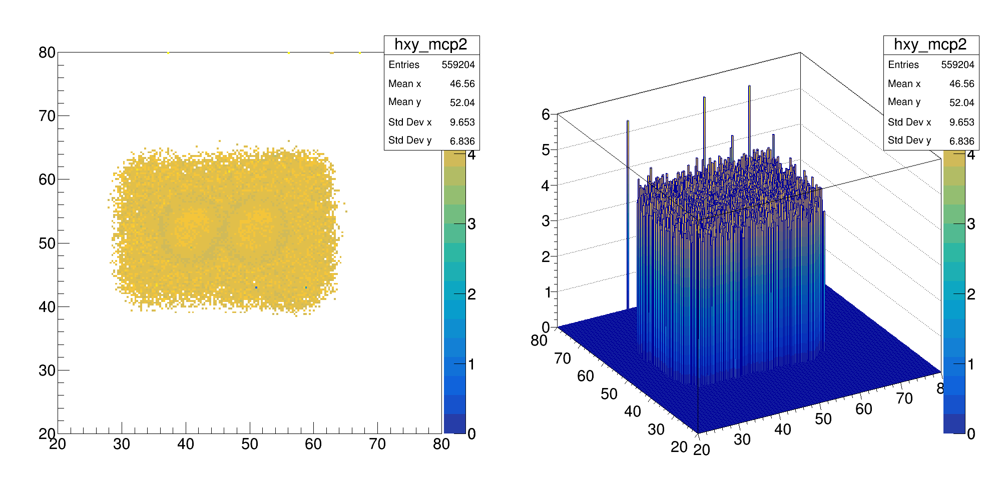

In [52]:
%jsroot off
c = ROOT.TCanvas('c1', '', 2000, 1000)
c.Divide(2, 1)

for i in range(201*201):
    if hxy.GetBinContent(i) < 15:
        hxy.SetBinContent(i, 0)

hxy_mcp = ROOT.TH2D("hxy_mcp2", '', 200, 20, 80, 200, 20, 80)
# hxy_mcp.FillN(mcp2_q.size, np.array(xy[:, 0]), np.array(xy[:, 1]), mcp2_q, 1)
hxy_mcp.FillN(mcp3_q.size, np.array(xy[:, 0]), np.array(xy[:, 1]), mcp3_q, 1)


for i in range(201*201):
    if hxy.GetBinContent(i) < 15 or  hxy_mcp.GetBinContent(i) < 0 :
        hxy_mcp.SetBinContent(i, 0)
    else:
        hxy_mcp.SetBinContent(i, hxy_mcp.GetBinContent(i)/hxy.GetBinContent(i))


c.cd(1)
hxy_mcp.Draw('colz')
c.cd(2)
hxy_mcp.Draw('lego2z')
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


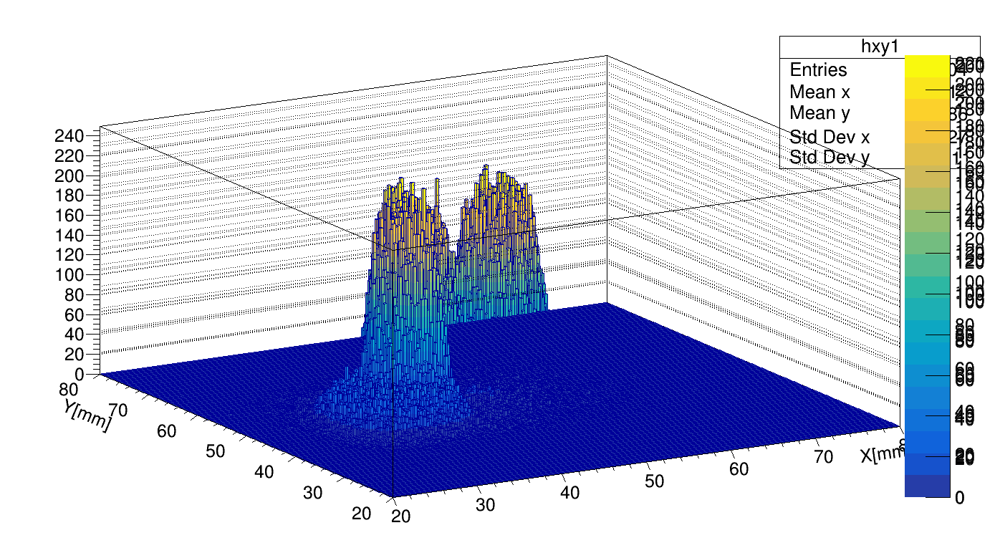

In [53]:
%jsroot off
c = ROOT.TCanvas('c1', '', 1400, 800)

hxy1 = ROOT.TH2D("hxy1", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
hxy1.FillN(len(xyc1[0]), xy[:, 0][xyc1], xy[:, 1][xyc1], 0, 1)

hxy2 = ROOT.TH2D("hxy2", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
hxy2.FillN(len(xyc2[0]), xy[:, 0][xyc2], xy[:, 1][xyc2], 0, 1)

hxy3 = ROOT.TH2D("hxy3", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
hxy3.FillN(len(xyc3[0]), xy[:, 0][xyc3], xy[:, 1][xyc3], 0, 1)

hxy4 = ROOT.TH2D("hxy4", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
hxy4.FillN(len(xyc4[0]), xy[:, 0][xyc4], xy[:, 1][xyc4], 0, 1)

hxy5 = ROOT.TH2D("hxy5", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
hxy5.FillN(len(xyc5[0]), xy[:, 0][xyc5], xy[:, 1][xyc5], 0, 1)

hxy6 = ROOT.TH2D("hxy6", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
hxy6.FillN(len(xyc6[0]), xy[:, 0][xyc6], xy[:, 1][xyc6], 0, 1)

hxy1.Draw('lego2z')
hxy2.Draw('lego2z same')
hxy3.Draw('lego2z same')
hxy4.Draw('lego2z same')
hxy5.Draw('lego2z same')
hxy6.Draw('lego2z same')
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


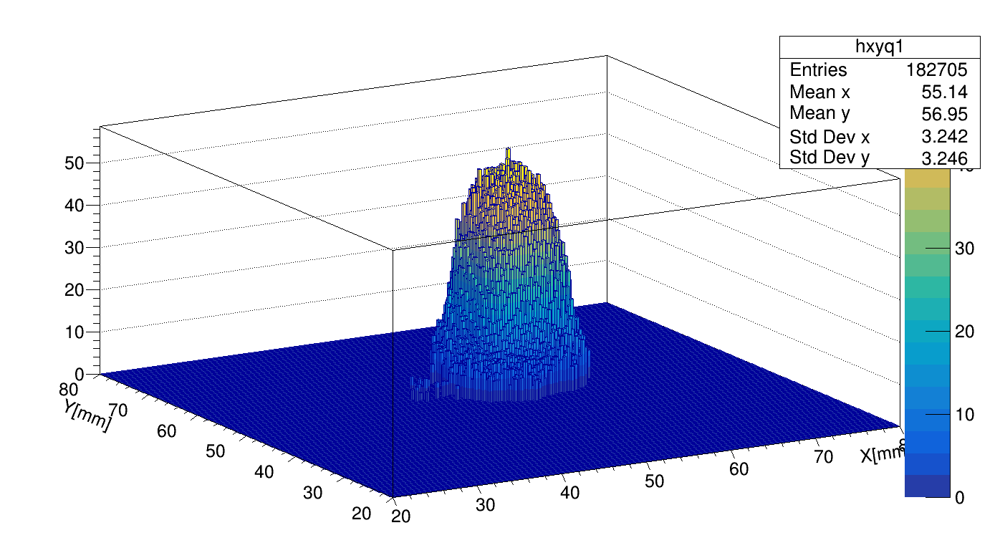

In [54]:
%jsroot off
c = ROOT.TCanvas('c1', '', 1400, 800)

hxyq1 = ROOT.TH2D("hxyq1", '; X[mm]; Y[mm]', 200, 20, 80, 200, 20, 80)
# hxyq1.FillN(len(xyc1[0]), xy[:, 0][xyc1], xy[:, 1][xyc1], mm1_qe[xyc1], 1)
hxyq1.FillN(len(xyc1[0]), xy[:, 0][xyc1], xy[:, 1][xyc1], mm1_qall[xyc1], 1)

hxyq2 = ROOT.TH2D("hxyq2", '', 200, 20, 80, 200, 20, 80)
# hxyq2.FillN(len(xyc2[0]), xy[:, 0][xyc2], xy[:, 1][xyc2], mm2_qe[xyc2], 1)
hxyq2.FillN(len(xyc2[0]), xy[:, 0][xyc2], xy[:, 1][xyc2], mm2_qall[xyc2], 1)

hxyq3 = ROOT.TH2D("hxyq3", '', 200, 20, 80, 200, 20, 80)
# hxyq3.FillN(len(xyc3[0]), xy[:, 0][xyc3], xy[:, 1][xyc3], mm3_qe[xyc3], 1)
hxyq3.FillN(len(xyc3[0]), xy[:, 0][xyc3], xy[:, 1][xyc3], mm3_qall[xyc3], 1)

hxyq4 = ROOT.TH2D("hxyq4", '', 200, 20, 80, 200, 20, 80)
# hxyq4.FillN(len(xyc4[0]), xy[:, 0][xyc4], xy[:, 1][xyc4], mm4_qe[xyc4], 1)
hxyq4.FillN(len(xyc4[0]), xy[:, 0][xyc4], xy[:, 1][xyc4], mm4_qall[xyc4], 1)

hxyq5 = ROOT.TH2D("hxyq5", '', 200, 20, 80, 200, 20, 80)
# hxyq5.FillN(len(xyc5[0]), xy[:, 0][xyc5], xy[:, 1][xyc5], mm5_qe[xyc5], 1)
hxyq5.FillN(len(xyc5[0]), xy[:, 0][xyc5], xy[:, 1][xyc5], mm5_qall[xyc5], 1)

hxyq6 = ROOT.TH2D("hxyq6", '', 200, 20, 80, 200, 20, 80)
# hxyq6.FillN(len(xyc6[0]), xy[:, 0][xyc6], xy[:, 1][xyc6], mm6_qe[xyc6], 1)
hxyq6.FillN(len(xyc6[0]), xy[:, 0][xyc6], xy[:, 1][xyc6], mm6_qall[xyc6], 1)

xbins, ybins = 201, 201

for i in range(xbins*ybins):
    if hxy1.GetBinContent(i) > 15:
        hxyq1.SetBinContent(i, hxyq1.GetBinContent(i)/hxy1.GetBinContent(i))
    else:
        hxyq1.SetBinContent(i, 0)
for i in range(xbins*ybins):
    if hxy2.GetBinContent(i) > 15:
        hxyq2.SetBinContent(i, hxyq2.GetBinContent(i)/hxy2.GetBinContent(i))
    else:
        hxyq2.SetBinContent(i, 0)
for i in range(xbins*ybins):
    if hxy3.GetBinContent(i) > 15:
        hxyq3.SetBinContent(i, hxyq3.GetBinContent(i)/hxy3.GetBinContent(i))
    else:
        hxyq3.SetBinContent(i, 0)
for i in range(xbins*ybins):
    if hxy4.GetBinContent(i) > 15:
        hxyq4.SetBinContent(i, hxyq4.GetBinContent(i)/hxy4.GetBinContent(i))
    else:
        hxyq4.SetBinContent(i, 0)
for i in range(xbins*ybins):
    if hxy5.GetBinContent(i) > 15:
        hxyq5.SetBinContent(i, hxyq5.GetBinContent(i)/hxy5.GetBinContent(i))
    else:
        hxyq5.SetBinContent(i, 0)
for i in range(xbins*ybins):
    if hxy6.GetBinContent(i) > 15:
        hxyq6.SetBinContent(i, hxyq6.GetBinContent(i)/hxy6.GetBinContent(i))
    else:
        hxyq6.SetBinContent(i, 0)

hxyq1.Draw('lego2z')
# hxyq2.Draw('lego2 same')
# hxyq3.Draw('lego2z same')
# hxyq4.Draw('lego2z same')
# hxyq5.Draw('lego2z same')
# hxyq6.Draw('lego2z same')
c.Draw()

In [55]:
%jsroot on
c = ROOT.TCanvas('c1', '', 1400, 800)

# c.cd(1)
hxyq1.Draw('lego2z')

c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


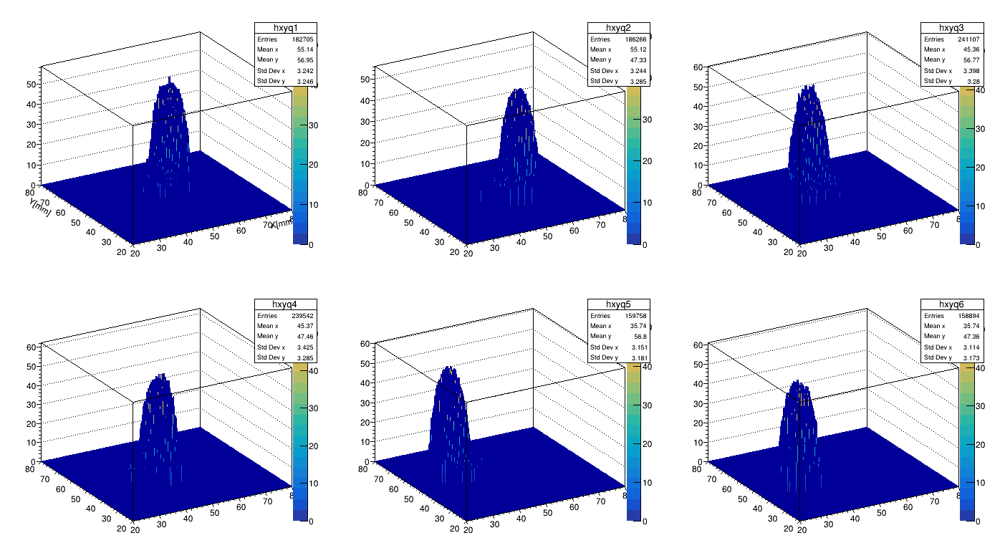

In [56]:
%jsroot off
c = ROOT.TCanvas('c1', '', 1400, 800)
c.Divide(3, 2)

c.cd(1)
hxyq1.Draw('lego2z')
c.cd(2)
hxyq2.Draw('lego2z')
c.cd(3)
hxyq3.Draw('lego2z')
c.cd(4)
hxyq4.Draw('lego2z')
c.cd(5)
hxyq5.Draw('lego2z')
c.cd(6)
hxyq6.Draw('lego2z')
c.Draw()

In [57]:
fxs2 = np.zeros(6)
fys2 = np.zeros(6)

In [58]:
xlims = [[45,65], [40,70], [30,60], [30,60], [20,50], [20,50]]
ylims = [[45,65], [30,60], [45,65], [30,60], [40,70], [30,60]]

xtemps = [ xy[:, 0][xyc1],xy[:, 0][xyc2],xy[:, 0][xyc3],xy[:, 0][xyc4],xy[:, 0][xyc5],xy[:, 0][xyc6] ]
ytemps = [ xy[:, 1][xyc1],xy[:, 1][xyc2],xy[:, 1][xyc3],xy[:, 1][xyc4],xy[:, 1][xyc5],xy[:, 1][xyc6] ]
qtemps = [ mm1_qall[xyc1],mm2_qall[xyc2],mm3_qall[xyc3],mm4_qall[xyc4],mm5_qall[xyc5],mm6_qall[xyc6] ]

In [59]:
#define the cuts
mm_basic_cut = []

mcp_overflow = np.logical_and(np.logical_and((mcp1_v>0)*(mcp1_v<=0.74), (mcp2_v>0)*(mcp2_v<=0.74)), (mcp3_v>0)*(mcp3_v<=0.74))
chi2_cut = (chi2<=40)
mcp_basic_cut = mcp_overflow*chi2_cut

for i in range(NPADS):       
    mm_overflow = (mm_vs[i] > 0.)*(mm_vs[i] < 0.36)*(mm_qalls[i] > 0)*(mm_qalls[i] < 250)
    qall_line = (mm_qalls[i] > 1. * mm_vs[i])
    cut = np.logical_and(mm_overflow * mcp_basic_cut, qall_line)
    mm_basic_cut.append(cut)


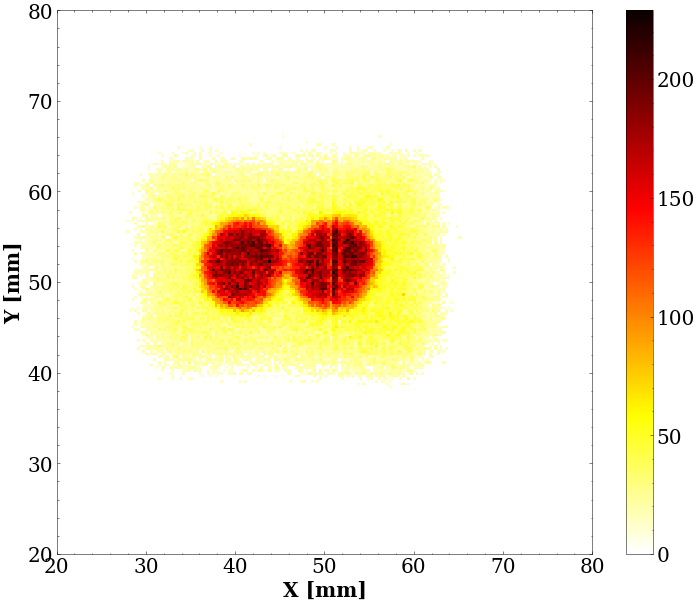

In [60]:
hist_tracks, yedges, xedges = np.histogram2d(xy[:,1][mcp_basic_cut], xy[:,0][mcp_basic_cut], range=[[20,80],[20,80]], bins=200)

hist_tracks = np.where(hist_tracks<15, 0, hist_tracks)

fig, axs = plt.subplots(figsize=(12, 10))
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
c = axs.pcolormesh(xedges, yedges, hist_tracks, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs)
plt.show()

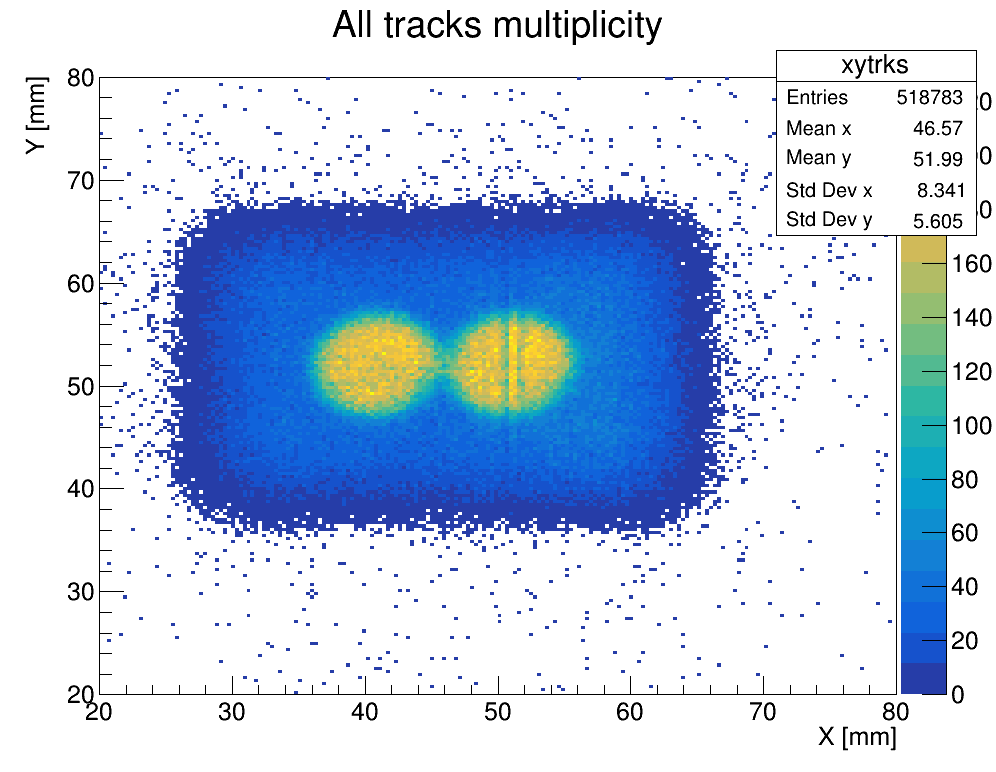

In [61]:
c = ROOT.TCanvas('cc', '', 1000, 800)
xytrks = ROOT.TH2D("xytrks",'All tracks multiplicity',200,20,80,200,20,80)

xytrks.GetXaxis().SetTitle("X [mm]")
xytrks.GetYaxis().SetTitle("Y [mm]")

n = len(xy[:,1][mcp_basic_cut])
xytrks.FillN(n,xy[:,0][mcp_basic_cut],xy[:,1][mcp_basic_cut], 0, 1)
xytrks.Draw('colz')
c.Draw()

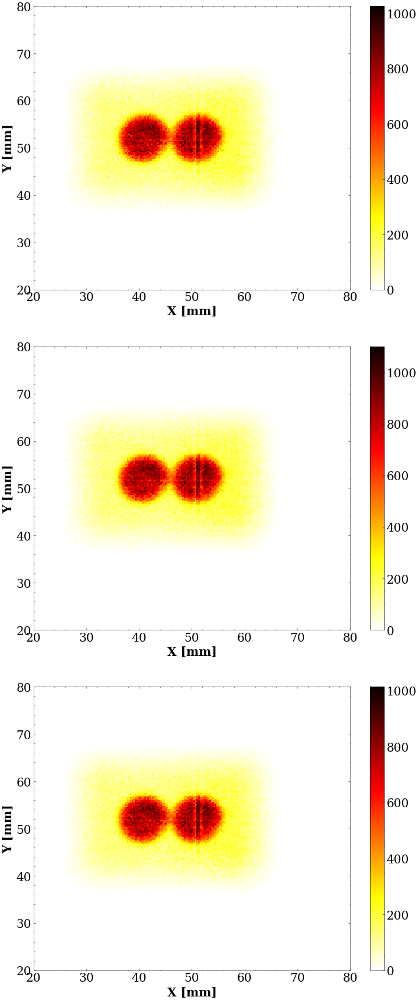

In [62]:
hist_mcp1, yedges, xedges = np.histogram2d(xy[:,1][mcp_basic_cut], xy[:,0][mcp_basic_cut], weights=mcp1_q[mcp_basic_cut], range=[[20,80],[20,80]], bins=200)
hist_mcp2, yedges, xedges = np.histogram2d(xy[:,1][mcp_basic_cut], xy[:,0][mcp_basic_cut], weights=mcp2_q[mcp_basic_cut], range=[[20,80],[20,80]], bins=200)
hist_mcp3, yedges, xedges = np.histogram2d(xy[:,1][mcp_basic_cut], xy[:,0][mcp_basic_cut], weights=mcp3_q[mcp_basic_cut], range=[[20,80],[20,80]], bins=200)


fig, axs = plt.subplots(3, 1, figsize=(12, 3*10))

c = axs[0].pcolormesh(xedges, yedges, hist_mcp1, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs[0])
c = axs[1].pcolormesh(xedges, yedges, hist_mcp2, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs[1])
c = axs[2].pcolormesh(xedges, yedges, hist_mcp3, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs[2])
for i in range(3):
    axs[i].set_xlabel('X [mm]')
    axs[i].set_ylabel('Y [mm]')
plt.show()

In [63]:
xytrksW_mm = []
pad_hists  = []
xytrksW_mm_np = []
pad_hists_np  = []

for i in range(NPADS):
    n = len(mcp1_v[mm_basic_cut[i]])
    x = xy[:,0][mm_basic_cut[i]]
    y = xy[:,1][mm_basic_cut[i]]
    w = mm_qalls[i][mm_basic_cut[i]]

    h1 = ROOT.TH2D(f'xytrksW{i}',f': xy tracks weighted by {pnames[i]} total charge', 200,20,80,200,20,80)
    h1.GetXaxis().SetTitle("X [mm]")
    h1.GetYaxis().SetTitle("Y [mm]")

    h1.FillN(n,x,y,w)
    h1.Divide(xytrks)
    xytrksW_mm.append(h1)
    
    
    hist_pad, yedges, xedges = np.histogram2d(y, x, weights=w, range=[[20,80],[20,80]], bins=200)
    hist_pad = np.where(hist_tracks < 1, 0, hist_pad / hist_tracks)
    xytrksW_mm_np.append(hist_pad)
    
    hist_pad_copy = deepcopy(hist_pad)
    hist_pad_copy = np.where(hist_pad_copy < 2, 0, hist_pad_copy)
    pad_hists_np.append(hist_pad_copy)
        
    
    h2 = h1.Clone()
    h2.SetName(f'pad{pnames[i]}_hist')
    h2.SetTitle(f'{pnames[i]}')
    for j in range(h2.GetNbinsX()+1):
        for k in range(h2.GetNbinsY()+1):
            if h2.GetBinContent(j,k)<2.:
                h2.SetBinContent(j,k,0)
    
    pad_hists.append(h2)


/tmp/ipykernel_519/1870860162.py:22: RuntimeWarning: divide by zero encountered in true_divide
  hist_pad = np.where(hist_tracks < 1, 0, hist_pad / hist_tracks)
/tmp/ipykernel_519/1870860162.py:22: RuntimeWarning: invalid value encountered in true_divide
  hist_pad = np.where(hist_tracks < 1, 0, hist_pad / hist_tracks)


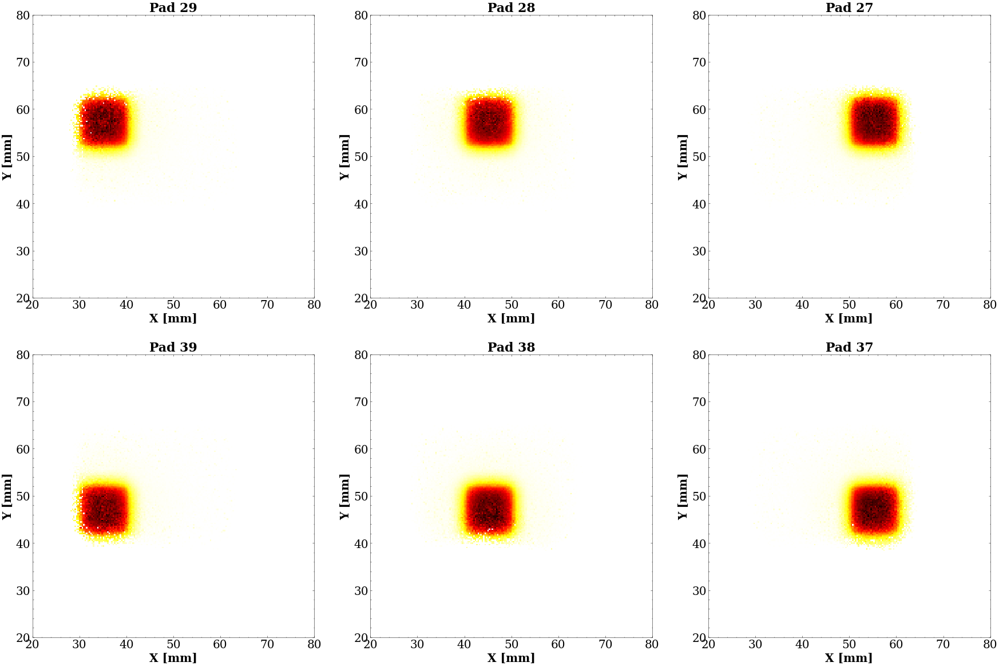

In [64]:
fig, axs = plt.subplots(2, 3, figsize=(30, 20))

axs = axs.ravel()

for i,j in enumerate(pad_order):
    axs[i].pcolormesh(xedges, yedges, xytrksW_mm_np[j], cmap='hot_r', rasterized=True)
    axs[i].set_xlim(20, 80)
    axs[i].set_ylim(20, 80)
    axs[i].set_title(f'{pnames[j]}')
    axs[i].set_xlabel('X [mm]')
    axs[i].set_ylabel('Y [mm]')
plt.show()

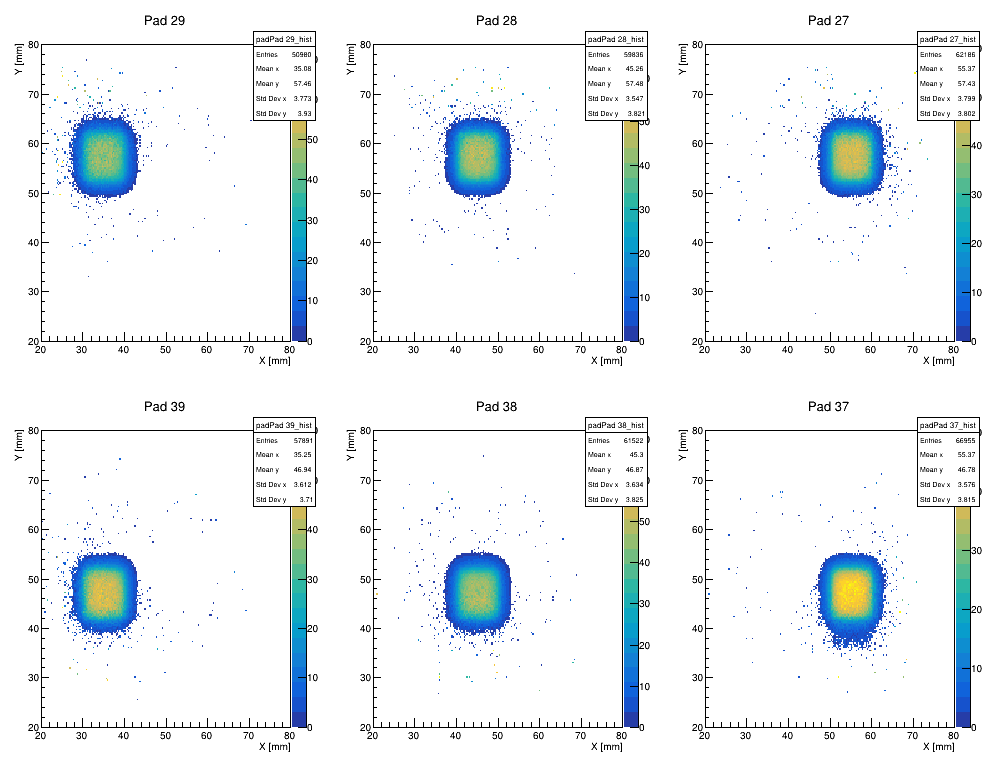

In [65]:
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(3,2)

for i,j in enumerate(pad_order):
    c.cd(i+1)
    pad_hists[j].Draw('colz')
#     xytrksW_mm[i].Draw('colz')
c.Draw()

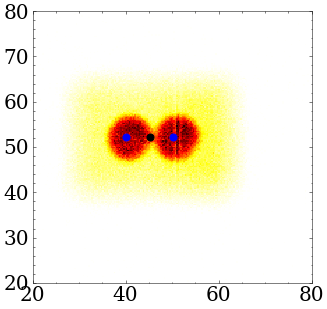

In [66]:
fig, axs = plt.subplots(figsize=(5, 5))
axs.pcolormesh(xedges, yedges, hist_mcp1, cmap='hot_r', rasterized=True)
axs.scatter(cross2[0,0], cross2[0,1], color='blue', s=50)
axs.scatter(cross2[1,0], cross2[1,1], color='blue', s=50)
axs.scatter(center[0], center[1], color='black', s=50)

axs.set_xlim(20, 80)
axs.set_ylim(20, 80)
plt.show()

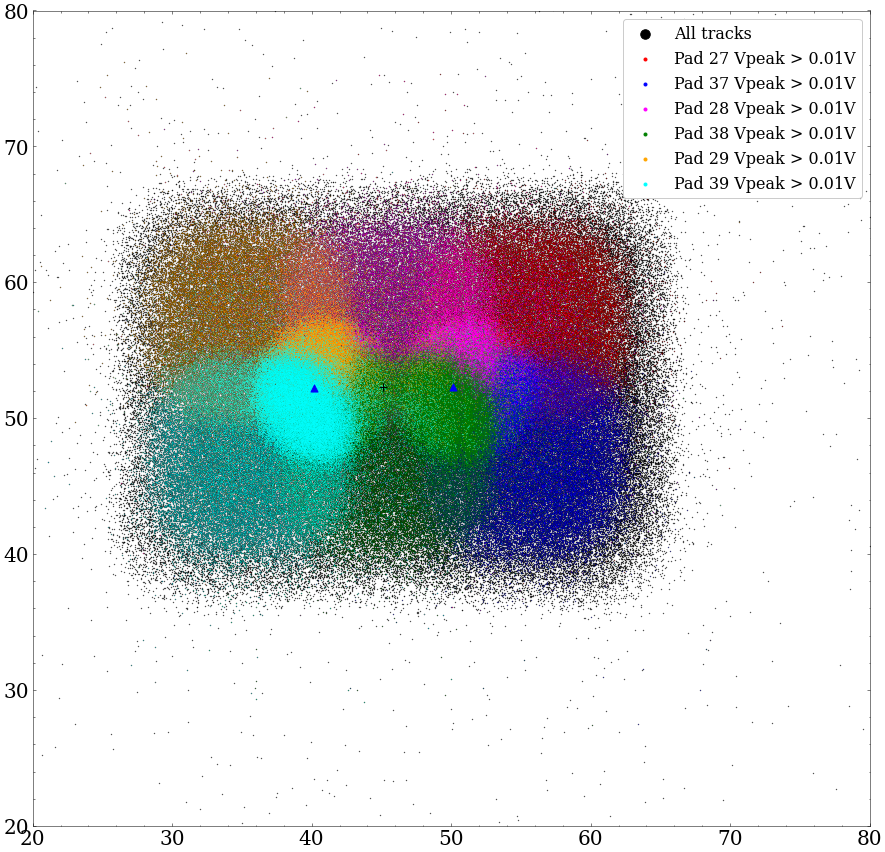

In [67]:
fig, axs = plt.subplots(figsize=(15, 15))
axs.scatter(xy[:, 0], xy[:, 1], s=0.1, color='black', label='All tracks')

axs.scatter(xy[:, 0][xyc1], xy[:, 1][xyc1], s=0.01, color=colors[0], label=f'{pnames[0]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc2], xy[:, 1][xyc2], s=0.01, color=colors[1], label=f'{pnames[1]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc3], xy[:, 1][xyc3], s=0.01, color=colors[2], label=f'{pnames[2]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc4], xy[:, 1][xyc4], s=0.01, color=colors[3], label=f'{pnames[3]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc5], xy[:, 1][xyc5], s=0.01, color=colors[4], label=f'{pnames[4]} Vpeak > {vv_thr}V')
axs.scatter(xy[:, 0][xyc6], xy[:, 1][xyc6], s=0.01, color=colors[5], label=f'{pnames[5]} Vpeak > {vv_thr}V')

axs.scatter(cross2[0,0], cross2[0,1], color='blue', s=50, marker='^')
axs.scatter(cross2[1,0], cross2[1,1], color='blue', s=50, marker='^')
axs.scatter(center[0], center[1], color='black', s=50, marker='+')

axs.set_xlim(20, 80)
axs.set_ylim(20, 80)

axs.legend(loc=1, markerscale=30)
plt.show()

In [68]:
distance_xy = 9.82/2
# xy_pad_cuts = []
# for i in range(NPADS):
#     temp_cut = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,i]) < distance_xy, np.abs(xy[:, 1]-centers[1,i]) < distance_xy), mm_cuts[i])
#     xy_pad_cuts.append(temp_cut)
# xy_pad1 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,0]) < distance_xy, np.abs(xy[:, 1]-centers[1,0]) < distance_xy), mm1_cut)
# xy_pad2 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,1]) < distance_xy, np.abs(xy[:, 1]-centers[1,1]) < distance_xy), mm2_cut)
# xy_pad3 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,2]) < distance_xy, np.abs(xy[:, 1]-centers[1,2]) < distance_xy), mm3_cut)
# xy_pad4 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,3]) < distance_xy, np.abs(xy[:, 1]-centers[1,3]) < distance_xy), mm4_cut)
# xy_pad5 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,4]) < distance_xy, np.abs(xy[:, 1]-centers[1,4]) < distance_xy), mm5_cut)
# xy_pad6 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-centers[0,5]) < distance_xy, np.abs(xy[:, 1]-centers[1,5]) < distance_xy), mm6_cut)

centers_s = sym_to_beam((centers[0,:] - center[0],centers[1,:] - center[1]), theta)
x_s, y_s = sym_to_beam((xy[:, 0] - center[0],xy[:, 1] - center[1]), theta)

cross2_s = np.array(sym_to_beam((cross2[:,0] - center[0],cross2[:,1] -center[1]), theta)).T

In [69]:
cross2_s[0]

array([-5.01000000e+00, -2.96637714e-15])

In [70]:
centers_s[0]

array([ 1.00195557e+01,  1.00195560e+01, -4.44298562e-04, -4.43991401e-04,
       -1.00204443e+01, -1.00204440e+01])

In [71]:
def transfo(x,y,x0,y0, theta):
    dx=x-x0
    dy=y-y0
    return (dx*np.cos(theta)+dy*np.sin(theta), -dx*np.sin(theta)+dy*np.cos(theta))
xy_pad_cuts = []
for i in range(NPADS):
    temp_cut = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][i]) < distance_xy, np.abs(y_s-centers_s[1][i]) < distance_xy), mm_cuts[i])
    xy_pad_cuts.append(temp_cut)
# a1,a2 = transfo(xy[:,0],xy[:,1],center[0],center[1],theta)

# square1 = np.logical_and(np.abs(a1-centers[0,i]) < distance_xy, np.abs(xy[:, 1]-centers[1,i]) < distance_xy)

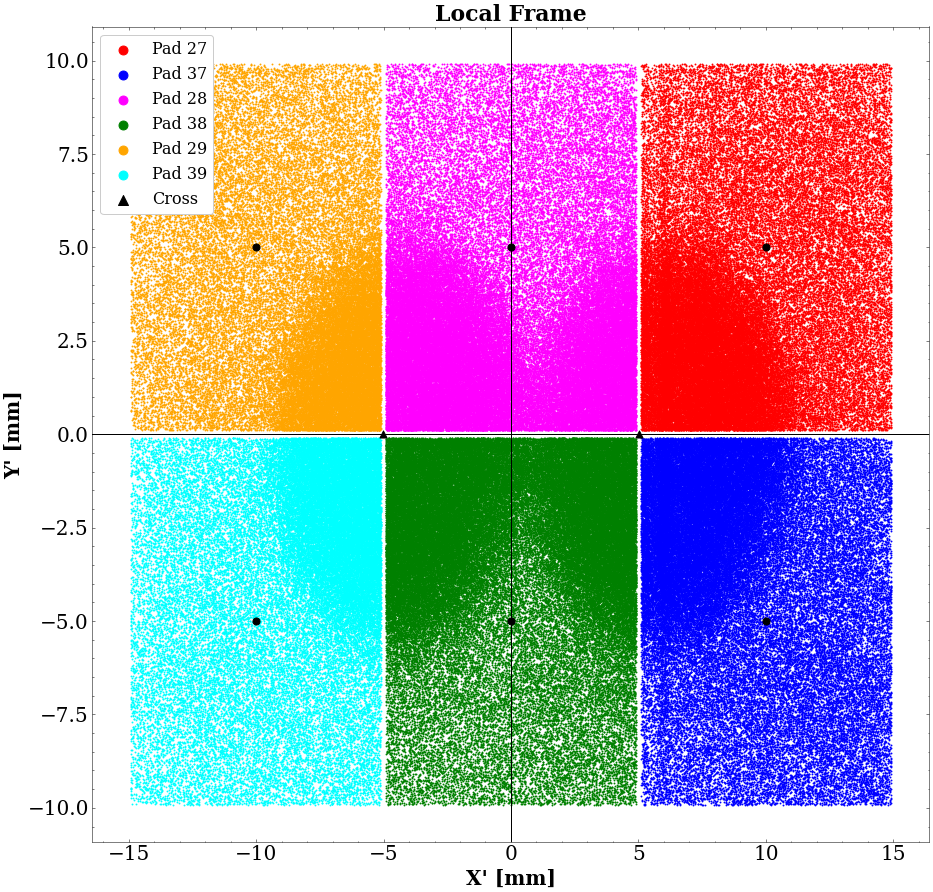

In [72]:
fig, axs = plt.subplots(figsize=(15, 15))

axs.set_title('Local Frame')
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')

axs.axhline(0, lw=1, color='black')
axs.axvline(0, lw=1, color='black')

for i in range(NPADS):
    axs.scatter(x_s[xy_pad_cuts[i]], y_s[xy_pad_cuts[i]], s=0.8, color=colors[i], label=f'{pnames[i]}')

for i in range(NPADS):
    axs.scatter(centers_s[0][i], centers_s[1][i], color='black', s=50)
axs.scatter(0, 0, color='black', s=100, marker='+')

axs.scatter(cross2_s[0,0], cross2_s[0,1], color='black', s=50, marker='^', label='Cross')
axs.scatter(cross2_s[1,0], cross2_s[1,1], color='black', s=50, marker='^')



box2 = np.array([[centers_s[0][0],centers_s[1][0]],
                 [centers_s[0][1],centers_s[1][1]],
                 [centers_s[0][3],centers_s[1][3]],
                 [centers_s[0][2],centers_s[1][2]],
                 [centers_s[0][0],centers_s[1][0]],
                ])
box1 = np.array([[centers_s[0][2],centers_s[1][2]],
                 [centers_s[0][3],centers_s[1][3]],
                 [centers_s[0][5],centers_s[1][5]],
                 [centers_s[0][4],centers_s[1][4]],
                 [centers_s[0][2],centers_s[1][2]],
                ])

# axs.plot(box1[:,0], box1[:,1], '--o', lw=5, ms=10, color='black')
# axs.plot(box2[:,0], box2[:,1], '-o', lw=5, ms=10, color='black')
# axs.set_xlim(-15, 15)
# axs.set_ylim(-10, 10)

leg = axs.legend(loc=2, markerscale=10)

leg.legendHandles[6].set_sizes([100])

plt.show()

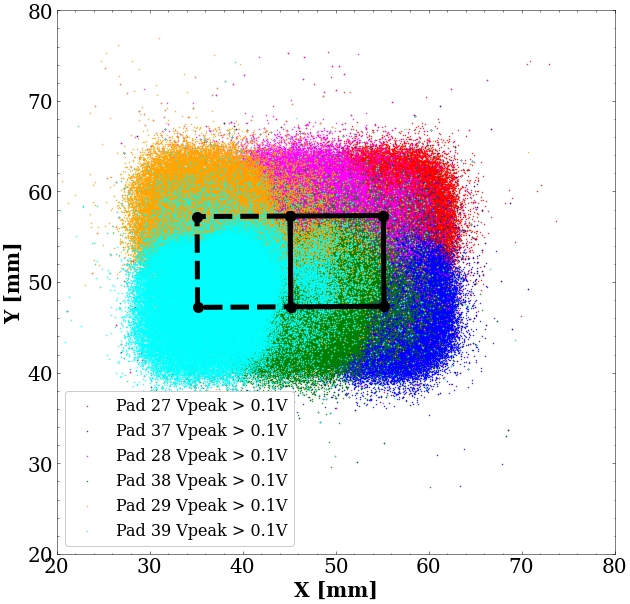

In [73]:
fig, axs = plt.subplots(figsize=(10, 10))

# axs.scatter(xy[:, 0], xy[:, 1], s=0.2, color='black', label=f'All Tracks')
axs.scatter(xy[:, 0][xyc1], xy[:, 1][xyc1], s=0.2, color=colors[0], label=f'{pnames[0]} Vpeak > 0.1V')
axs.scatter(xy[:, 0][xyc2], xy[:, 1][xyc2], s=0.2, color=colors[1], label=f'{pnames[1]} Vpeak > 0.1V')
axs.scatter(xy[:, 0][xyc3], xy[:, 1][xyc3], s=0.2, color=colors[2], label=f'{pnames[2]} Vpeak > 0.1V')
axs.scatter(xy[:, 0][xyc4], xy[:, 1][xyc4], s=0.2, color=colors[3], label=f'{pnames[3]} Vpeak > 0.1V')
axs.scatter(xy[:, 0][xyc5], xy[:, 1][xyc5], s=0.2, color=colors[4], label=f'{pnames[4]} Vpeak > 0.1V')
axs.scatter(xy[:, 0][xyc6], xy[:, 1][xyc6], s=0.2, color=colors[5], label=f'{pnames[5]} Vpeak > 0.1V')


box2 = np.array([[fxs[0],fys[0]],
                 [fxs[1],fys[1]],
                 [fxs[3],fys[3]],
                 [fxs[2],fys[2]],
                 [fxs[0],fys[0]],
                ])
box1 = np.array([[fxs[2],fys[2]],
                 [fxs[3],fys[3]],
                 [fxs[5],fys[5]],
                 [fxs[4],fys[4]],
                 [fxs[2],fys[2]],
                ])

axs.plot(box1[:,0], box1[:,1], '--o', lw=5, ms=10, color='black')
axs.plot(box2[:,0], box2[:,1], '-o', lw=5, ms=10, color='black')



axs.set_xlim(20, 80)
axs.set_ylim(20, 80)
axs.legend(loc=3)
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
# plt.savefig('dump/tracks_with_box.png')
plt.show()

In [74]:
distance_xy = 2.5
# xy_pad1 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-fxs2[0]) < distance_xy, np.abs(xy[:, 1]-fys2[0]) < distance_xy), mm1_cut)
# xy_pad2 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-fxs2[1]) < distance_xy, np.abs(xy[:, 1]-fys2[1]) < distance_xy), mm2_cut)
# xy_pad3 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-fxs2[2]) < distance_xy, np.abs(xy[:, 1]-fys2[2]) < distance_xy), mm3_cut)
# xy_pad4 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-fxs2[3]) < distance_xy, np.abs(xy[:, 1]-fys2[3]) < distance_xy), mm4_cut)
# xy_pad5 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-fxs2[4]) < distance_xy, np.abs(xy[:, 1]-fys2[4]) < distance_xy), mm5_cut)
# xy_pad6 = np.logical_and(np.logical_and(np.abs(xy[:, 0]-fxs2[5]) < distance_xy, np.abs(xy[:, 1]-fys2[5]) < distance_xy), mm6_cut)

xy_pad1 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][0]) < distance_xy, np.abs(y_s-centers_s[1][0]) < distance_xy), mm_cuts[0])
xy_pad2 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][1]) < distance_xy, np.abs(y_s-centers_s[1][1]) < distance_xy), mm_cuts[1])
xy_pad3 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][2]) < distance_xy, np.abs(y_s-centers_s[1][2]) < distance_xy), mm_cuts[2])
xy_pad4 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][3]) < distance_xy, np.abs(y_s-centers_s[1][3]) < distance_xy), mm_cuts[3])
xy_pad5 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][4]) < distance_xy, np.abs(y_s-centers_s[1][4]) < distance_xy), mm_cuts[4])
xy_pad6 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][5]) < distance_xy, np.abs(y_s-centers_s[1][5]) < distance_xy), mm_cuts[5])

xy_pads = [ xy_pad1, xy_pad2, xy_pad3, xy_pad4, xy_pad5, xy_pad6 ]

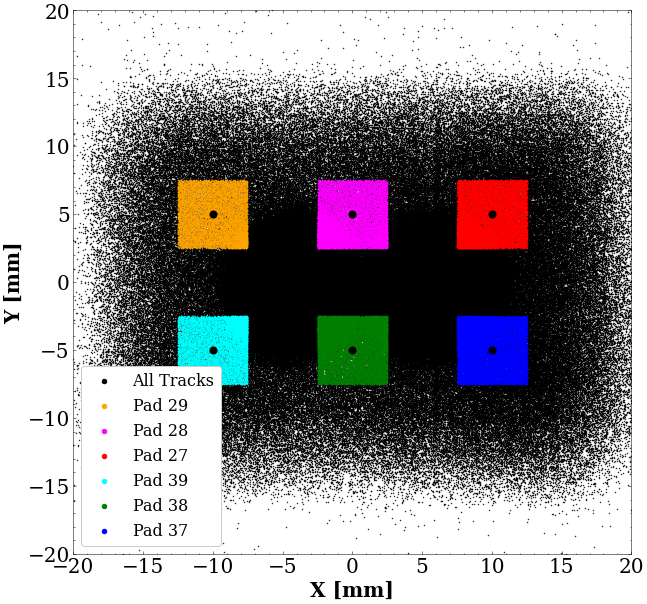

In [75]:
fig, axs = plt.subplots(figsize=(10, 10))

axs.scatter(x_s, y_s, s=0.2, color='black', label=f'All Tracks')
for i,j in enumerate(pad_order):
    axs.scatter(x_s[xy_pads[j]], y_s[xy_pads[j]], s=0.2, color=colors[j], label=f'{pnames[j]}')
for i in range(NPADS):
    axs.scatter(centers_s[0][i], centers_s[1][i], color='black', s=50)


axs.set_xlim(-20, 20)
axs.set_ylim(-20, 20)
axs.legend(loc=3, markerscale=10)
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
plt.show()

In [76]:
# tranges = [
#     [-8100, -7900],
#     [-3350, -3150],
#     [-16350, -16150],
#     [-16350, -16150],
#     [-13650, -13500],
#     [-12850, -12650]
# ]

tranges = [
 [-8500, -7500],
 [-5000, -2000],
 [-16500, -15000],
 [-16500, -15000],
 [-13700, -12500],
 [-13000, -12000]
    
]


 FCN=158.591 FROM MIGRAD    STATUS=CONVERGED      66 CALLS          67 TOTAL
                     EDM=6.05253e-07    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     7.15633e+02   7.44845e+00   3.59656e-02   1.57661e-05
   2  Mean        -8.00842e+03   1.37145e-01   3.81871e-03   3.68487e-03
   3  Sigma        1.67971e+01   1.08792e-01   1.01323e-05  -4.44234e-01
 FCN=153.138 FROM MIGRAD    STATUS=CONVERGED      58 CALLS          59 TOTAL
                     EDM=9.37038e-08    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     7.55734e+02   7.70320e+00   3.64079e-02  -6.58048e-05
   2  Mean        -3.24434e+03   1.33125e-01   1.54702e-03   4.95440e-04
   3  Sigma        1.67181e+01   

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cc


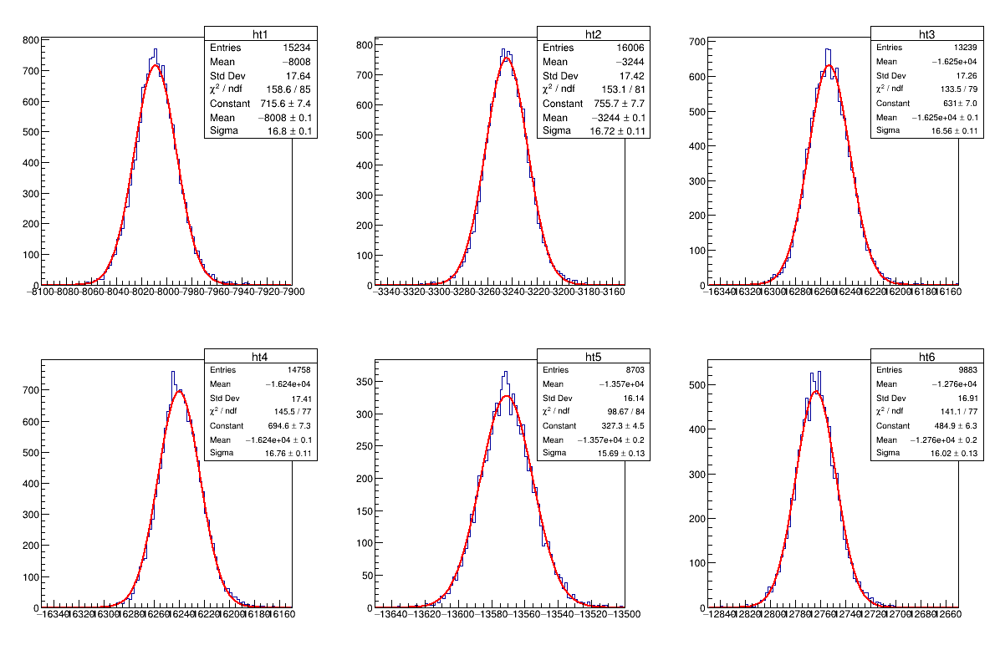

In [77]:
ROOT.gStyle.SetOptFit(111)
c = ROOT.TCanvas("cc", '', 1200, 800)
c.Divide(3, 2)

ht1 = ROOT.TH1D('ht1', '', 100, -8100, -7900)
ht1.FillN(np.count_nonzero(xy_pad1), 1e3*dt1[xy_pad1], 0, 1)

ht2 = ROOT.TH1D('ht2', '', 100, -3350, -3150)
ht2.FillN(np.count_nonzero(xy_pad2), 1e3*dt2[xy_pad2], 0, 1)

ht3 = ROOT.TH1D('ht3', '', 100, -16350, -16150)
ht3.FillN(np.count_nonzero(xy_pad3), 1e3*dt3[xy_pad3], 0, 1)

ht4 = ROOT.TH1D('ht4', '', 100, -16350, -16150)
ht4.FillN(np.count_nonzero(xy_pad4), 1e3*dt4[xy_pad4], 0, 1)

ht5 = ROOT.TH1D('ht5', '', 100, -13650, -13500)
ht5.FillN(np.count_nonzero(xy_pad5), 1e3*dt5[xy_pad5], 0, 1)

ht6 = ROOT.TH1D('ht6', '', 100, -12850, -12650)
ht6.FillN(np.count_nonzero(xy_pad6), 1e3*dt6[xy_pad6], 0, 1)


# ff = ROOT.TF1("ff2", '')

c.cd(1)
ht1.Draw()
ht1.Fit('gaus')

c.cd(2)
ht2.Draw()
ht2.Fit('gaus')

c.cd(3)
ht3.Draw()
ht3.Fit('gaus')

c.cd(4)
ht4.Draw()
ht4.Fit('gaus')

c.cd(5)
ht5.Draw()
ht5.Fit('gaus')

c.cd(6)
ht6.Draw()
ht6.Fit('gaus')

c.Draw()

In [78]:
# cmap = plt.get_cmap('viridis')
cmap = plt.get_cmap('plasma')
pcolors = [cmap(i) for i in np.linspace(0, 1, 5)]

In [79]:
def gaus2(x, pars):
    a = pars[0]
    mu = pars[1]
    sigma1 = pars[2]
    b = pars[3]
    sigma2 = pars[4]
    return a*ROOT.TMath.Gaus(x[0], mu, sigma1) + b*ROOT.TMath.Gaus(x[0],mu,sigma2)

# Crosses

In [80]:
c1_order = np.array([4,2,5,3], dtype=np.int32)
c2_order = np.array([2,0,3,1], dtype=np.int32)
print([pnames[i] for i in c1_order])

['Pad 29', 'Pad 28', 'Pad 39', 'Pad 38']


In [81]:
distance_xy = 5
xy_pad1c = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][0]) < distance_xy, np.abs(y_s-centers_s[1][0]) < distance_xy), mm_cuts[0])
xy_pad2c = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][1]) < distance_xy, np.abs(y_s-centers_s[1][1]) < distance_xy), mm_cuts[1])
xy_pad3c = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][2]) < distance_xy, np.abs(y_s-centers_s[1][2]) < distance_xy), mm_cuts[2])
xy_pad4c = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][3]) < distance_xy, np.abs(y_s-centers_s[1][3]) < distance_xy), mm_cuts[3])
xy_pad5c = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][4]) < distance_xy, np.abs(y_s-centers_s[1][4]) < distance_xy), mm_cuts[4])
xy_pad6c = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][5]) < distance_xy, np.abs(y_s-centers_s[1][5]) < distance_xy), mm_cuts[5])


cross1_cut = np.logical_and(np.abs(x_s-cross2_s[0,0]) < 2, np.abs(y_s-cross2_s[0,1]) < 2)
cross2_cut = np.logical_and(np.abs(x_s-cross2_s[1,0]) < 2, np.abs(y_s-cross2_s[1,1]) < 2)

xyc1_inpad1 = np.logical_and(cross1_cut, xy_pad1c)
xyc1_inpad2 = np.logical_and(cross1_cut, xy_pad2c)
xyc1_inpad3 = np.logical_and(cross1_cut, xy_pad3c)
xyc1_inpad4 = np.logical_and(cross1_cut, xy_pad4c)
xyc1_inpad5 = np.logical_and(cross1_cut, xy_pad5c)
xyc1_inpad6 = np.logical_and(cross1_cut, xy_pad6c)

xyc2_inpad1 = np.logical_and(cross2_cut, xy_pad1c)
xyc2_inpad2 = np.logical_and(cross2_cut, xy_pad2c)
xyc2_inpad3 = np.logical_and(cross2_cut, xy_pad3c)
xyc2_inpad4 = np.logical_and(cross2_cut, xy_pad4c)
xyc2_inpad5 = np.logical_and(cross2_cut, xy_pad5c)
xyc2_inpad6 = np.logical_and(cross2_cut, xy_pad6c)


xyc1_inpads = [xyc1_inpad1,xyc1_inpad2,xyc1_inpad3,xyc1_inpad4,xyc1_inpad5,xyc1_inpad6]
xyc2_inpads = [xyc2_inpad1,xyc2_inpad2,xyc2_inpad3,xyc2_inpad4,xyc2_inpad5,xyc2_inpad6]

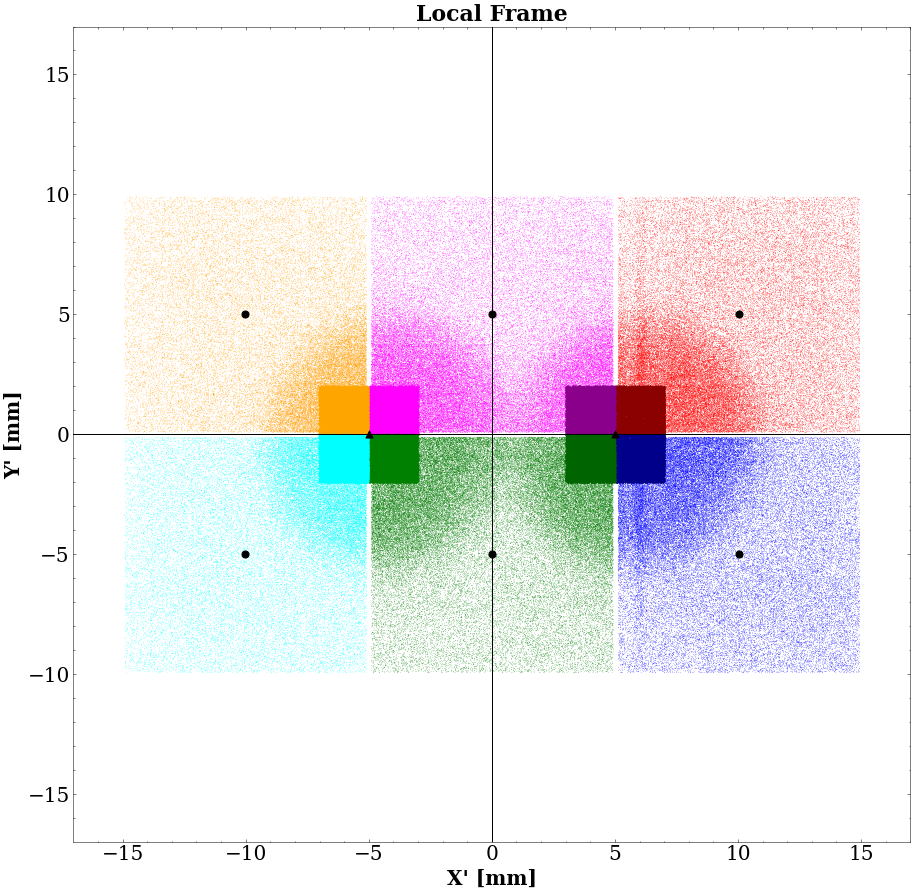

In [82]:
fig, axs = plt.subplots(figsize=(15, 15))



axs.axhline(0, lw=1, color='black')
axs.axvline(0, lw=1, color='black')

for i in range(NPADS):
    axs.scatter(x_s[xy_pad_cuts[i]], y_s[xy_pad_cuts[i]], s=0.005, color=colors[i], label=f'{pnames[i]}')
for i in range(NPADS):
    axs.scatter(x_s[xyc1_inpads[i]], y_s[xyc1_inpads[i]], s=0.8, color=colors[i], label=f'{pnames[i]}')
    
for i in range(NPADS):
    axs.scatter(x_s[xyc2_inpads[i]], y_s[xyc2_inpads[i]], s=0.8, color=f'dark{colors[i]}', label=f'{pnames[i]}')
# axs.scatter(x_s[xy_pad1c], y_s[xy_pad1c], s=0.8)
# axs.scatter(x_s[cross1_cut], y_s[cross1_cut], s=0.8)
# axs.scatter(x_s[cross2_cut], y_s[cross2_cut], s=0.8)

for i in range(NPADS):
    axs.scatter(centers_s[0][i], centers_s[1][i], color='black', s=50)
axs.scatter(0, 0, color='black', s=100, marker='+')

axs.scatter(cross2_s[0,0], cross2_s[0,1], color='black', s=50, marker='^', label='Cross')
axs.scatter(cross2_s[1,0], cross2_s[1,1], color='black', s=50, marker='^')

# leg = axs.legend(loc=2, markerscale=10)

# leg.legendHandles[6].set_sizes([100])

axs.set_title('Local Frame')
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
axs.set_xlim(-17, 17)
axs.set_ylim(-17, 17)
plt.show()

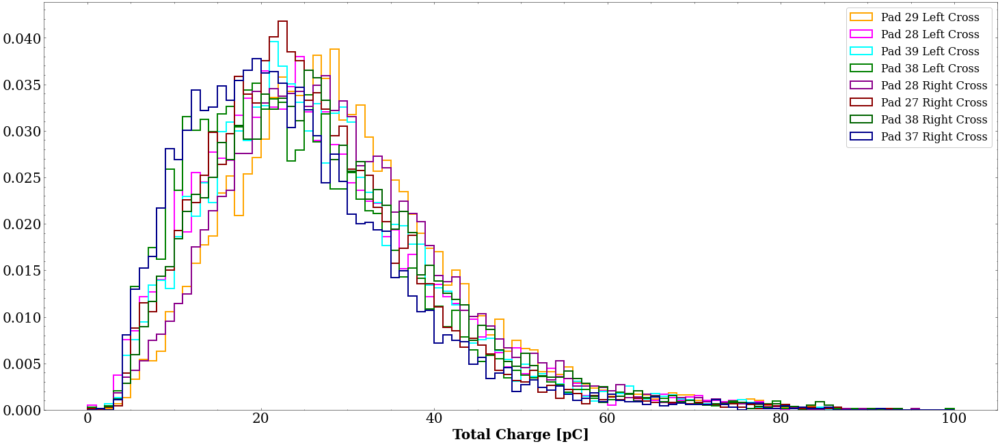

In [83]:
fig, axs = plt.subplots(figsize=(25, 11))
qrange = 100
nbins = 100

for i,j in enumerate(c1_order):
    axs.hist(mm_qalls[j][xyc1_inpads[j]], bins=nbins, range=(0, qrange), histtype='step', color=colors[j], lw=2, label=f'{pnames[j]} Left Cross', density=True)

for i,j in enumerate(c2_order):
    axs.hist(mm_qalls[j][xyc2_inpads[j]], bins=nbins, range=(0, qrange), histtype='step', color=f'dark{colors[j]}', lw=2, label=f'{pnames[j]} Right Cross', density=True)

axs.legend()
# axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

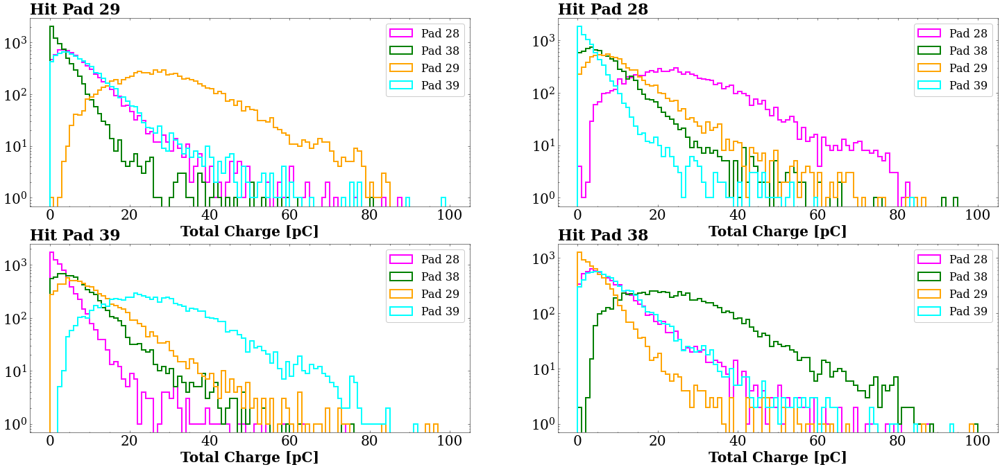

In [84]:
fig, axs = plt.subplots(2,2, figsize=(25, 11))
axs=axs.ravel()
qrange = 100

for i,j in enumerate(c1_order):
    axs[i].set_title(f'Hit {pnames[j]}', loc='left')
    axs[i].hist(mm3_qall[xyc1_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[2], lw=2, label=pnames[2])
    axs[i].hist(mm4_qall[xyc1_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[3], lw=2, label=pnames[3])
    axs[i].hist(mm5_qall[xyc1_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[4], lw=2, label=pnames[4])
    axs[i].hist(mm6_qall[xyc1_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[5], lw=2, label=pnames[5])




for i in range(4):
    axs[i].legend()
    axs[i].set_yscale('log')
    axs[i].set_xlabel("Total Charge [pC]")
plt.show()

In [85]:





qlow = 0.5
qup = 80

nppe = 500


vl1in1c1, vu1in1c1, mdt1in1c1, sdt1in1c1, emdt1in1c1, esdt1in1c1 = fff(mm1_qall[xyc1_inpad1], dt1[xyc1_inpad1], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in1c1, vu2in1c1, mdt2in1c1, sdt2in1c1, emdt2in1c1, esdt2in1c1 = fff(mm2_qall[xyc1_inpad1], dt2[xyc1_inpad1], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in1c1, vu3in1c1, mdt3in1c1, sdt3in1c1, emdt3in1c1, esdt3in1c1 = fff(mm3_qall[xyc1_inpad1], dt3[xyc1_inpad1], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in1c1, vu4in1c1, mdt4in1c1, sdt4in1c1, emdt4in1c1, esdt4in1c1 = fff(mm4_qall[xyc1_inpad1], dt4[xyc1_inpad1], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in1c1, vu5in1c1, mdt5in1c1, sdt5in1c1, emdt5in1c1, esdt5in1c1 = fff(mm5_qall[xyc1_inpad1], dt5[xyc1_inpad1], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in1c1, vu6in1c1, mdt6in1c1, sdt6in1c1, emdt6in1c1, esdt6in1c1 = fff(mm6_qall[xyc1_inpad1], dt6[xyc1_inpad1], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in2c1, vu1in2c1, mdt1in2c1, sdt1in2c1, emdt1in2c1, esdt1in2c1 = fff(mm1_qall[xyc1_inpad2], dt1[xyc1_inpad2], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in2c1, vu2in2c1, mdt2in2c1, sdt2in2c1, emdt2in2c1, esdt2in2c1 = fff(mm2_qall[xyc1_inpad2], dt2[xyc1_inpad2], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in2c1, vu3in2c1, mdt3in2c1, sdt3in2c1, emdt3in2c1, esdt3in2c1 = fff(mm3_qall[xyc1_inpad2], dt3[xyc1_inpad2], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in2c1, vu4in2c1, mdt4in2c1, sdt4in2c1, emdt4in2c1, esdt4in2c1 = fff(mm4_qall[xyc1_inpad2], dt4[xyc1_inpad2], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in2c1, vu5in2c1, mdt5in2c1, sdt5in2c1, emdt5in2c1, esdt5in2c1 = fff(mm5_qall[xyc1_inpad2], dt5[xyc1_inpad2], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in2c1, vu6in2c1, mdt6in2c1, sdt6in2c1, emdt6in2c1, esdt6in2c1 = fff(mm6_qall[xyc1_inpad2], dt6[xyc1_inpad2], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in3c1, vu1in3c1, mdt1in3c1, sdt1in3c1, emdt1in3c1, esdt1in3c1 = fff(mm1_qall[xyc1_inpad3], dt1[xyc1_inpad3], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in3c1, vu2in3c1, mdt2in3c1, sdt2in3c1, emdt2in3c1, esdt2in3c1 = fff(mm2_qall[xyc1_inpad3], dt2[xyc1_inpad3], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in3c1, vu3in3c1, mdt3in3c1, sdt3in3c1, emdt3in3c1, esdt3in3c1 = fff(mm3_qall[xyc1_inpad3], dt3[xyc1_inpad3], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in3c1, vu4in3c1, mdt4in3c1, sdt4in3c1, emdt4in3c1, esdt4in3c1 = fff(mm4_qall[xyc1_inpad3], dt4[xyc1_inpad3], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in3c1, vu5in3c1, mdt5in3c1, sdt5in3c1, emdt5in3c1, esdt5in3c1 = fff(mm5_qall[xyc1_inpad3], dt5[xyc1_inpad3], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in3c1, vu6in3c1, mdt6in3c1, sdt6in3c1, emdt6in3c1, esdt6in3c1 = fff(mm6_qall[xyc1_inpad3], dt6[xyc1_inpad3], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in4c1, vu1in4c1, mdt1in4c1, sdt1in4c1, emdt1in4c1, esdt1in4c1 = fff(mm1_qall[xyc1_inpad4], dt1[xyc1_inpad4], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in4c1, vu2in4c1, mdt2in4c1, sdt2in4c1, emdt2in4c1, esdt2in4c1 = fff(mm2_qall[xyc1_inpad4], dt2[xyc1_inpad4], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in4c1, vu3in4c1, mdt3in4c1, sdt3in4c1, emdt3in4c1, esdt3in4c1 = fff(mm3_qall[xyc1_inpad4], dt3[xyc1_inpad4], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in4c1, vu4in4c1, mdt4in4c1, sdt4in4c1, emdt4in4c1, esdt4in4c1 = fff(mm4_qall[xyc1_inpad4], dt4[xyc1_inpad4], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in4c1, vu5in4c1, mdt5in4c1, sdt5in4c1, emdt5in4c1, esdt5in4c1 = fff(mm5_qall[xyc1_inpad4], dt5[xyc1_inpad4], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in4c1, vu6in4c1, mdt6in4c1, sdt6in4c1, emdt6in4c1, esdt6in4c1 = fff(mm6_qall[xyc1_inpad4], dt6[xyc1_inpad4], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])

vl1in5c1, vu1in5c1, mdt1in5c1, sdt1in5c1, emdt1in5c1, esdt1in5c1 = fff(mm1_qall[xyc1_inpad5], dt1[xyc1_inpad5], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in5c1, vu2in5c1, mdt2in5c1, sdt2in5c1, emdt2in5c1, esdt2in5c1 = fff(mm2_qall[xyc1_inpad5], dt2[xyc1_inpad5], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in5c1, vu3in5c1, mdt3in5c1, sdt3in5c1, emdt3in5c1, esdt3in5c1 = fff(mm3_qall[xyc1_inpad5], dt3[xyc1_inpad5], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in5c1, vu4in5c1, mdt4in5c1, sdt4in5c1, emdt4in5c1, esdt4in5c1 = fff(mm4_qall[xyc1_inpad5], dt4[xyc1_inpad5], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in5c1, vu5in5c1, mdt5in5c1, sdt5in5c1, emdt5in5c1, esdt5in5c1 = fff(mm5_qall[xyc1_inpad5], dt5[xyc1_inpad5], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in5c1, vu6in5c1, mdt6in5c1, sdt6in5c1, emdt6in5c1, esdt6in5c1 = fff(mm6_qall[xyc1_inpad5], dt6[xyc1_inpad5], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in6c1, vu1in6c1, mdt1in6c1, sdt1in6c1, emdt1in6c1, esdt1in6c1 = fff(mm1_qall[xyc1_inpad6], dt1[xyc1_inpad6], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in6c1, vu2in6c1, mdt2in6c1, sdt2in6c1, emdt2in6c1, esdt2in6c1 = fff(mm2_qall[xyc1_inpad6], dt2[xyc1_inpad6], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in6c1, vu3in6c1, mdt3in6c1, sdt3in6c1, emdt3in6c1, esdt3in6c1 = fff(mm3_qall[xyc1_inpad6], dt3[xyc1_inpad6], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in6c1, vu4in6c1, mdt4in6c1, sdt4in6c1, emdt4in6c1, esdt4in6c1 = fff(mm4_qall[xyc1_inpad6], dt4[xyc1_inpad6], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in6c1, vu5in6c1, mdt5in6c1, sdt5in6c1, emdt5in6c1, esdt5in6c1 = fff(mm5_qall[xyc1_inpad6], dt5[xyc1_inpad6], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in6c1, vu6in6c1, mdt6in6c1, sdt6in6c1, emdt6in6c1, esdt6in6c1 = fff(mm6_qall[xyc1_inpad6], dt6[xyc1_inpad6], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


np.min(idt)=-181274.41754433597, np.max(idt)=706.9639207958289, r1=0.0, mm=0.0, r2=0.0
640.9918483938814, -9149.835539470423, 2920.53323806902, 
##################################################
np.min(idt)=-169296.54969610868, np.max(idt)=81961.99582199276, r1=-7534.897674697448, mm=-7534.897674697448, r2=-7534.897674697448
491.4763754947806, -2991.8916489739404, 3413.4817161935007, 
##################################################
np.min(idt)=-210242.18828417716, np.max(idt)=-6565.767132744952, r1=-8085.319616366646, mm=-7605.652760515316, r2=-7125.985904663986
22644.527208268624, -4599.546344150481, 650.848577401596, 
##################################################
np.min(idt)=-335004.3165860186, np.max(idt)=-5800.304224899292, r1=-8390.126017595163, mm=-7724.695423663068, r2=-7059.264829730974
5.12511193688864, -7439.6478966727755, 254.7041803475437, 
##################################################
np.min(idt)=-184997.75769432707, np.max(idt)=12169.190430802246, r1=-2462.3

Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 
Warning in <Fit>: Fit data is empty 


In [86]:
xxs11c1 = (vl1in1c1+vu1in1c1)*0.5
exs11c1 = (vl1in1c1-vu1in1c1)*0.5

xxs21c1 = (vl2in1c1+vu2in1c1)*0.5
exs21c1 = (vl2in1c1-vu2in1c1)*0.5

xxs31c1 = (vl3in1c1+vu3in1c1)*0.5
exs31c1 = (vl3in1c1-vu3in1c1)*0.5

xxs41c1 = (vl4in1c1+vu4in1c1)*0.5
exs41c1 = (vl4in1c1-vu4in1c1)*0.5

xxs51c1 = (vl5in1c1+vu5in1c1)*0.5
exs51c1 = (vl5in1c1-vu5in1c1)*0.5

xxs61c1 = (vl6in1c1+vu6in1c1)*0.5
exs61c1 = (vl6in1c1-vu6in1c1)*0.5



xxs12c1 = (vl1in2c1+vu1in2c1)*0.5
exs12c1 = (vl1in2c1-vu1in2c1)*0.5

xxs22c1 = (vl2in2c1+vu2in2c1)*0.5
exs22c1 = (vl2in2c1-vu2in2c1)*0.5

xxs32c1 = (vl3in2c1+vu3in2c1)*0.5
exs32c1 = (vl3in2c1-vu3in2c1)*0.5

xxs42c1 = (vl4in2c1+vu4in2c1)*0.5
exs42c1 = (vl4in2c1-vu4in2c1)*0.5

xxs52c1 = (vl5in2c1+vu5in2c1)*0.5
exs52c1 = (vl5in2c1-vu5in2c1)*0.5

xxs62c1 = (vl6in2c1+vu6in2c1)*0.5
exs62c1 = (vl6in2c1-vu6in2c1)*0.5



xxs13c1 = (vl1in3c1+vu1in3c1)*0.5
exs13c1 = (vl1in3c1-vu1in3c1)*0.5

xxs23c1 = (vl2in3c1+vu2in3c1)*0.5
exs23c1 = (vl2in3c1-vu2in3c1)*0.5

xxs33c1 = (vl3in3c1+vu3in3c1)*0.5
exs33c1 = (vl3in3c1-vu3in3c1)*0.5

xxs43c1 = (vl4in3c1+vu4in3c1)*0.5
exs43c1 = (vl4in3c1-vu4in3c1)*0.5

xxs53c1 = (vl5in3c1+vu5in3c1)*0.5
exs53c1 = (vl5in3c1-vu5in3c1)*0.5

xxs63c1 = (vl6in3c1+vu6in3c1)*0.5
exs63c1 = (vl6in3c1-vu6in3c1)*0.5

xxs14c1 = (vl1in4c1+vu1in4c1)*0.5
exs14c1 = (vl1in4c1-vu1in4c1)*0.5

xxs24c1 = (vl2in4c1+vu2in4c1)*0.5
exs24c1 = (vl2in4c1-vu2in4c1)*0.5

xxs34c1 = (vl3in4c1+vu3in4c1)*0.5
exs34c1 = (vl3in4c1-vu3in4c1)*0.5

xxs44c1 = (vl4in4c1+vu4in4c1)*0.5
exs44c1 = (vl4in4c1-vu4in4c1)*0.5

xxs54c1 = (vl5in4c1+vu5in4c1)*0.5
exs54c1 = (vl5in4c1-vu5in4c1)*0.5

xxs64c1 = (vl6in4c1+vu6in4c1)*0.5
exs64c1 = (vl6in4c1-vu6in4c1)*0.5



xxs15c1 = (vl1in5c1+vu1in5c1)*0.5
exs15c1 = (vl1in5c1-vu1in5c1)*0.5

xxs25c1 = (vl2in5c1+vu2in5c1)*0.5
exs25c1 = (vl2in5c1-vu2in5c1)*0.5

xxs35c1 = (vl3in5c1+vu3in5c1)*0.5
exs35c1 = (vl3in5c1-vu3in5c1)*0.5

xxs45c1 = (vl4in5c1+vu4in5c1)*0.5
exs45c1 = (vl4in5c1-vu4in5c1)*0.5

xxs55c1 = (vl5in5c1+vu5in5c1)*0.5
exs55c1 = (vl5in5c1-vu5in5c1)*0.5

xxs65c1 = (vl6in5c1+vu6in5c1)*0.5
exs65c1 = (vl6in5c1-vu6in5c1)*0.5



xxs16c1 = (vl1in6c1+vu1in6c1)*0.5
exs16c1 = (vl1in6c1-vu1in6c1)*0.5

xxs26c1 = (vl2in6c1+vu2in6c1)*0.5
exs26c1 = (vl2in6c1-vu2in6c1)*0.5

xxs36c1 = (vl3in6c1+vu3in6c1)*0.5
exs36c1 = (vl3in6c1-vu3in6c1)*0.5

xxs46c1 = (vl4in6c1+vu4in6c1)*0.5
exs46c1 = (vl4in6c1-vu4in6c1)*0.5

xxs56c1 = (vl5in6c1+vu5in6c1)*0.5
exs56c1 = (vl5in6c1-vu5in6c1)*0.5

xxs66c1 = (vl6in6c1+vu6in6c1)*0.5
exs66c1 = (vl6in6c1-vu6in6c1)*0.5


In [87]:
show_ranges = [
    [-14000, -12000],
    [-16500, -14000],
    [-13000, -12000],
    [-16400, -14000],
]

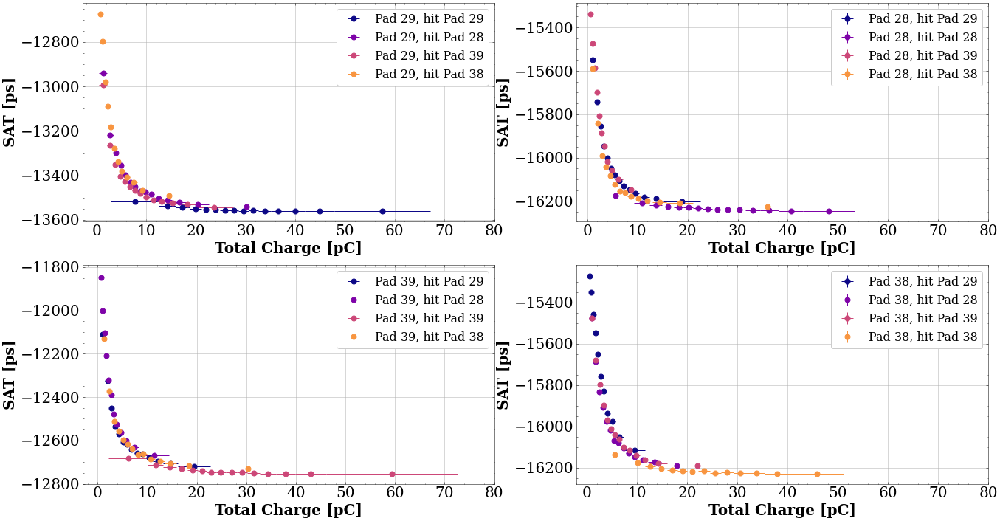

In [88]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()
axs[0].errorbar(xxs55c1[iistart:iistop], mdt5in5c1[iistart:iistop], xerr=exs55c1[iistart:iistop], yerr=emdt5in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].errorbar(xxs53c1[iistart:iistop], mdt5in3c1[iistart:iistop], xerr=exs53c1[iistart:iistop], yerr=emdt5in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].errorbar(xxs56c1[iistart:iistop], mdt5in6c1[iistart:iistop], xerr=exs56c1[iistart:iistop], yerr=emdt5in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[0].errorbar(xxs54c1[iistart:iistop], mdt5in4c1[iistart:iistop], xerr=exs54c1[iistart:iistop], yerr=emdt5in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')

axs[1].errorbar(xxs35c1[iistart:iistop], mdt3in5c1[iistart:iistop], xerr=exs35c1[iistart:iistop], yerr=emdt3in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].errorbar(xxs33c1[iistart:iistop], mdt3in3c1[iistart:iistop], xerr=exs33c1[iistart:iistop], yerr=emdt3in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].errorbar(xxs36c1[iistart:iistop], mdt3in6c1[iistart:iistop], xerr=exs36c1[iistart:iistop], yerr=emdt3in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[1].errorbar(xxs34c1[iistart:iistop], mdt3in4c1[iistart:iistop], xerr=exs34c1[iistart:iistop], yerr=emdt3in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')

axs[2].errorbar(xxs65c1[iistart:iistop], mdt6in5c1[iistart:iistop], xerr=exs65c1[iistart:iistop], yerr=emdt6in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].errorbar(xxs63c1[iistart:iistop], mdt6in3c1[iistart:iistop], xerr=exs63c1[iistart:iistop], yerr=emdt6in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].errorbar(xxs66c1[iistart:iistop], mdt6in6c1[iistart:iistop], xerr=exs66c1[iistart:iistop], yerr=emdt6in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[2].errorbar(xxs64c1[iistart:iistop], mdt6in4c1[iistart:iistop], xerr=exs64c1[iistart:iistop], yerr=emdt6in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')

axs[3].errorbar(xxs45c1[iistart:iistop], mdt4in5c1[iistart:iistop], xerr=exs45c1[iistart:iistop], yerr=emdt4in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].errorbar(xxs43c1[iistart:iistop], mdt4in3c1[iistart:iistop], xerr=exs43c1[iistart:iistop], yerr=emdt4in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].errorbar(xxs46c1[iistart:iistop], mdt4in6c1[iistart:iistop], xerr=exs46c1[iistart:iistop], yerr=emdt4in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')
axs[3].errorbar(xxs44c1[iistart:iistop], mdt4in4c1[iistart:iistop], xerr=exs44c1[iistart:iistop], yerr=emdt4in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


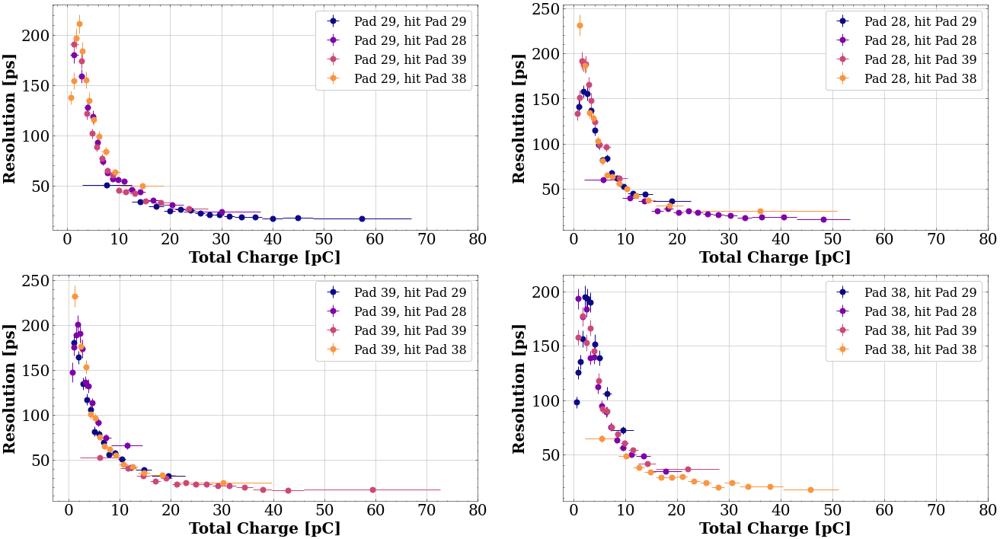

In [89]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()
axs[0].errorbar(xxs55c1[iistart:iistop], sdt5in5c1[iistart:iistop], xerr=exs55c1[iistart:iistop], yerr=esdt5in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].errorbar(xxs53c1[iistart:iistop], sdt5in3c1[iistart:iistop], xerr=exs53c1[iistart:iistop], yerr=esdt5in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].errorbar(xxs56c1[iistart:iistop], sdt5in6c1[iistart:iistop], xerr=exs56c1[iistart:iistop], yerr=esdt5in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[0].errorbar(xxs54c1[iistart:iistop], sdt5in4c1[iistart:iistop], xerr=exs54c1[iistart:iistop], yerr=esdt5in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')

axs[1].errorbar(xxs35c1[iistart:iistop], sdt3in5c1[iistart:iistop], xerr=exs35c1[iistart:iistop], yerr=esdt3in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].errorbar(xxs33c1[iistart:iistop], sdt3in3c1[iistart:iistop], xerr=exs33c1[iistart:iistop], yerr=esdt3in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].errorbar(xxs36c1[iistart:iistop], sdt3in6c1[iistart:iistop], xerr=exs36c1[iistart:iistop], yerr=esdt3in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[1].errorbar(xxs34c1[iistart:iistop], sdt3in4c1[iistart:iistop], xerr=exs34c1[iistart:iistop], yerr=esdt3in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')

axs[2].errorbar(xxs65c1[iistart:iistop], sdt6in5c1[iistart:iistop], xerr=exs65c1[iistart:iistop], yerr=esdt6in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].errorbar(xxs63c1[iistart:iistop], sdt6in3c1[iistart:iistop], xerr=exs63c1[iistart:iistop], yerr=esdt6in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].errorbar(xxs66c1[iistart:iistop], sdt6in6c1[iistart:iistop], xerr=exs66c1[iistart:iistop], yerr=esdt6in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[2].errorbar(xxs64c1[iistart:iistop], sdt6in4c1[iistart:iistop], xerr=exs64c1[iistart:iistop], yerr=esdt6in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')

axs[3].errorbar(xxs45c1[iistart:iistop], sdt4in5c1[iistart:iistop], xerr=exs45c1[iistart:iistop], yerr=esdt4in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].errorbar(xxs43c1[iistart:iistop], sdt4in3c1[iistart:iistop], xerr=exs43c1[iistart:iistop], yerr=esdt4in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].errorbar(xxs46c1[iistart:iistop], sdt4in6c1[iistart:iistop], xerr=exs46c1[iistart:iistop], yerr=esdt4in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')
axs[3].errorbar(xxs44c1[iistart:iistop], sdt4in4c1[iistart:iistop], xerr=exs44c1[iistart:iistop], yerr=esdt4in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(0, 200)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 12.0426909866083616
Edm   = 5.668291132095071e-06
Nfcn  = 4402
Par_0	  = -0.108359	 +/-  0.0099693
Par_1	  = 4.71055	 +/-  0.0860811
Par_2	  = 0.000877158	 +/-  0.00100111
Par_3	  = 3.89255	 +/-  0.0672531
Par_4	  = -13612.5	 +/-  3.34579
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 25.5440873751181812
Edm   = 2.22055256939113924e-06
Nfcn  = 1079
Par_0	  = -0.133002	 +/-  0.0169048
Par_1	  = 5.44055	 +/-  0.182319
Par_2	  = -0.523278	 +/-  0.0479607
Par_3	  = 6.7089	 +/-  0.0410322
Par_4	  = -13545.1	 +/-  2.2376
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 266.118886214863949
Edm   = 2.93767721861622494e-06
Nfcn  = 294
Par_0	  = -0.193624	 +/-  0.00110158
Pa

Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 40.909 > 0
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 0 ] = -0.000237211
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 1 ] = -0.78291
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 2 ] = -0.0208549
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 3 ] = -3.22085
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 4 ] = -0.277759
Warning in <Minuit2>: MnPosDef Added to diagonal of Error matrix a value 3.72085
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.621516
Warning in <Minuit2>: VariableMetricBuilder gdel = -52996.5
Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along sear

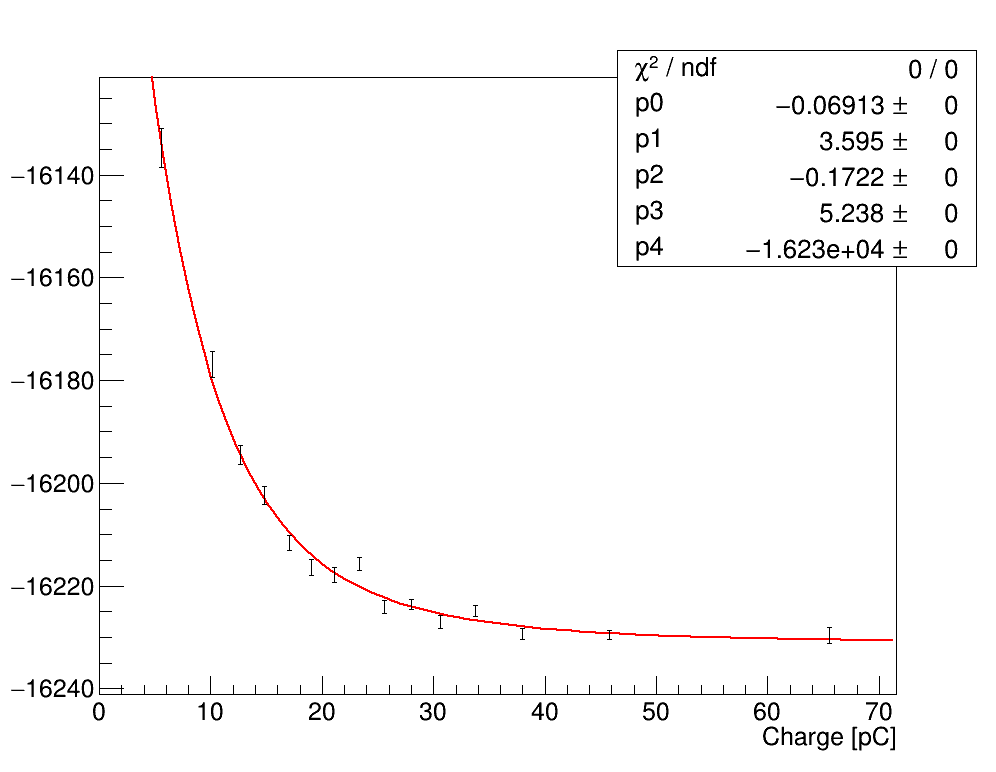

In [90]:
pars5in5c1 = sat_fit(xxs55c1, mdt5in5c1, exs55c1, emdt5in5c1, iistart=0, iistop=None, xl=0.5, xu=80, pars=[-0.1, 1.0, -1, 0.5, 13500.0])
pars5in3c1 = sat_fit(xxs53c1, mdt5in3c1, exs53c1, emdt5in3c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars5in6c1 = sat_fit(xxs56c1, mdt5in6c1, exs56c1, emdt5in6c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars5in4c1 = sat_fit(xxs54c1, mdt5in4c1, exs54c1, emdt5in4c1, iistart=0, iistop=-1, xl=0.5, xu=15, pars=[-0.1,10.0,-1,0.5,40])

pars3in5c1 = sat_fit(xxs35c1, mdt3in5c1, exs35c1, emdt3in5c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars3in3c1 = sat_fit(xxs33c1, mdt3in3c1, exs33c1, emdt3in3c1, iistart=0, iistop=None, xl=0.5, xu=80, pars=[-0.1,1.0,-1,0.5,16000])
pars3in6c1 = sat_fit(xxs36c1, mdt3in6c1, exs36c1, emdt3in6c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,10.0,-1,0.5,40])
pars3in4c1 = sat_fit(xxs34c1, mdt3in4c1, exs34c1, emdt3in4c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])

pars6in5c1 = sat_fit(xxs65c1, mdt6in5c1, exs65c1, emdt6in5c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars6in3c1 = sat_fit(xxs63c1, mdt6in3c1, exs63c1, emdt6in3c1, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
pars6in6c1 = sat_fit(xxs66c1, mdt6in6c1, exs66c1, emdt6in6c1, iistart=0, iistop=None, xl=0.5, xu=80, pars=[-0.1,1.0,-1,0.5,40])
pars6in4c1 = sat_fit(xxs64c1, mdt6in4c1, exs64c1, emdt6in4c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])

pars4in5c1 = sat_fit(xxs45c1, mdt4in5c1, exs45c1, emdt4in5c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,10.0,-1,0.5,40])
pars4in3c1 = sat_fit(xxs43c1, mdt4in3c1, exs43c1, emdt4in3c1, iistart=0, iistop=None, xl=0.5, xu=50, pars=[-0.1,2.0,-1,0.5,40])
pars4in6c1 = sat_fit(xxs46c1, mdt4in6c1, exs46c1, emdt4in6c1, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars4in4c1 = sat_fit(xxs44c1, mdt4in4c1, exs44c1, emdt4in4c1, iistart=0, iistop=None, xl=0.5, xu=80, pars=[-0.1,1.0,-1,0.5,40])

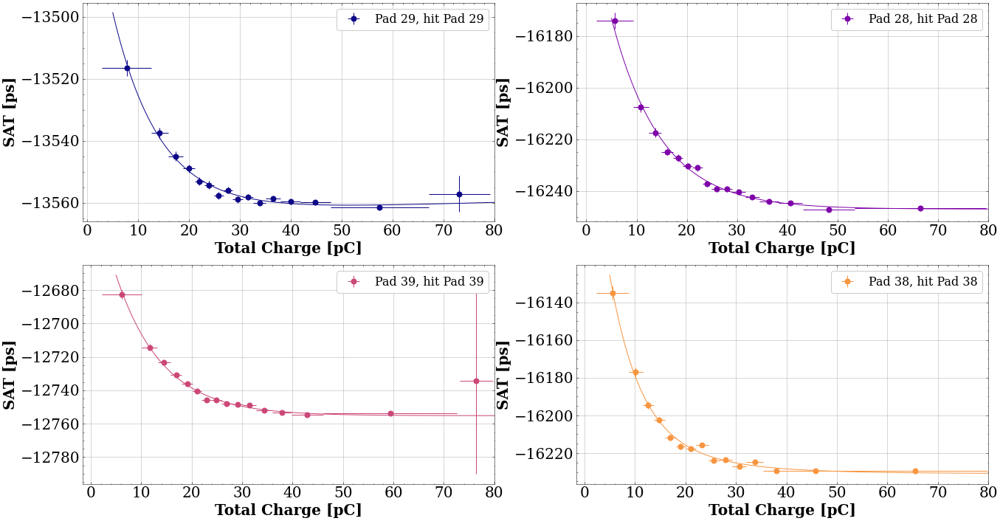

In [91]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(5, 80, 300)


axs[0].errorbar(xxs55c1[iistart:iistop], mdt5in5c1[iistart:iistop], xerr=exs55c1[iistart:iistop], yerr=emdt5in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].plot(a, expo2_np(a, pars5in5c1), color=pcolors[0])

axs[1].errorbar(xxs33c1[iistart:iistop], mdt3in3c1[iistart:iistop], xerr=exs33c1[iistart:iistop], yerr=emdt3in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].plot(a, expo2_np(a, pars3in3c1), color=pcolors[1])

axs[2].errorbar(xxs66c1[iistart:iistop], mdt6in6c1[iistart:iistop], xerr=exs66c1[iistart:iistop], yerr=emdt6in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[2].plot(a, expo2_np(a, pars6in6c1), color=pcolors[2])

axs[3].errorbar(xxs44c1[iistart:iistop], mdt4in4c1[iistart:iistop], xerr=exs44c1[iistart:iistop], yerr=emdt4in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs[3].plot(a, expo2_np(a, pars4in4c1), color=pcolors[3])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


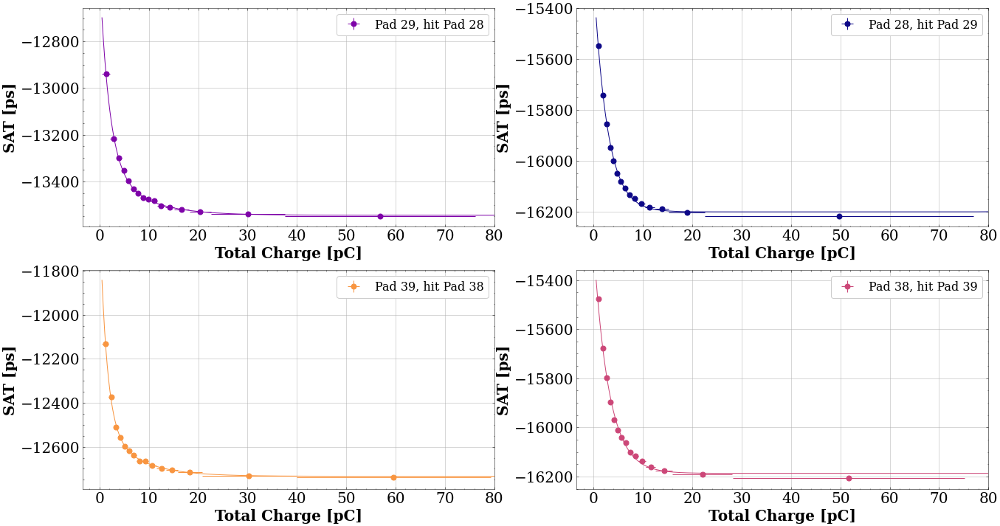

In [92]:
# left-right
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(.5, 80, 300)

axs[0].errorbar(xxs53c1[iistart:iistop], mdt5in3c1[iistart:iistop], xerr=exs53c1[iistart:iistop], yerr=emdt5in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].plot(a, expo2_np(a, pars5in3c1), color=pcolors[1])

axs[1].errorbar(xxs35c1[iistart:iistop], mdt3in5c1[iistart:iistop], xerr=exs35c1[iistart:iistop], yerr=emdt3in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].plot(a, expo2_np(a, pars3in5c1), color=pcolors[0])

axs[2].errorbar(xxs64c1[iistart:iistop], mdt6in4c1[iistart:iistop], xerr=exs64c1[iistart:iistop], yerr=emdt6in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, pars6in4c1), color=pcolors[3])

axs[3].errorbar(xxs46c1[iistart:iistop], mdt4in6c1[iistart:iistop], xerr=exs46c1[iistart:iistop], yerr=emdt4in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')
axs[3].plot(a, expo2_np(a, pars4in6c1), color=pcolors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


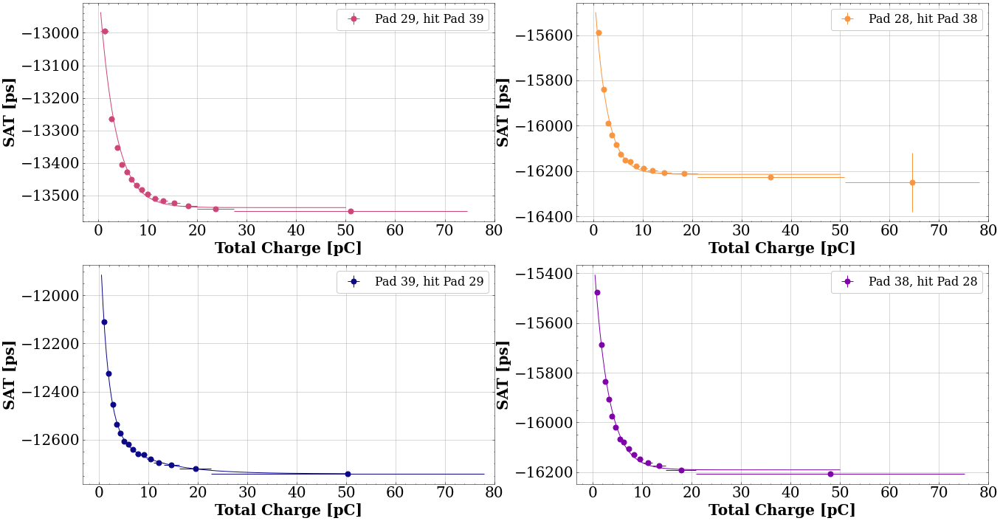

In [93]:
# up-down
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)
axs[0].errorbar(xxs56c1[iistart:iistop], mdt5in6c1[iistart:iistop], xerr=exs56c1[iistart:iistop], yerr=emdt5in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[0].plot(a, expo2_np(a, pars5in6c1), color=pcolors[2])

axs[1].errorbar(xxs34c1[iistart:iistop], mdt3in4c1[iistart:iistop], xerr=exs34c1[iistart:iistop], yerr=emdt3in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[1].plot(a, expo2_np(a, pars3in4c1), color=pcolors[3])

axs[2].errorbar(xxs65c1[iistart:iistop], mdt6in5c1[iistart:iistop], xerr=exs65c1[iistart:iistop], yerr=emdt6in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].plot(a, expo2_np(a, pars6in5c1), color=pcolors[0])

axs[3].errorbar(xxs43c1[iistart:iistop], mdt4in3c1[iistart:iistop], xerr=exs43c1[iistart:iistop], yerr=emdt4in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, pars4in3c1), color=pcolors[1])


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


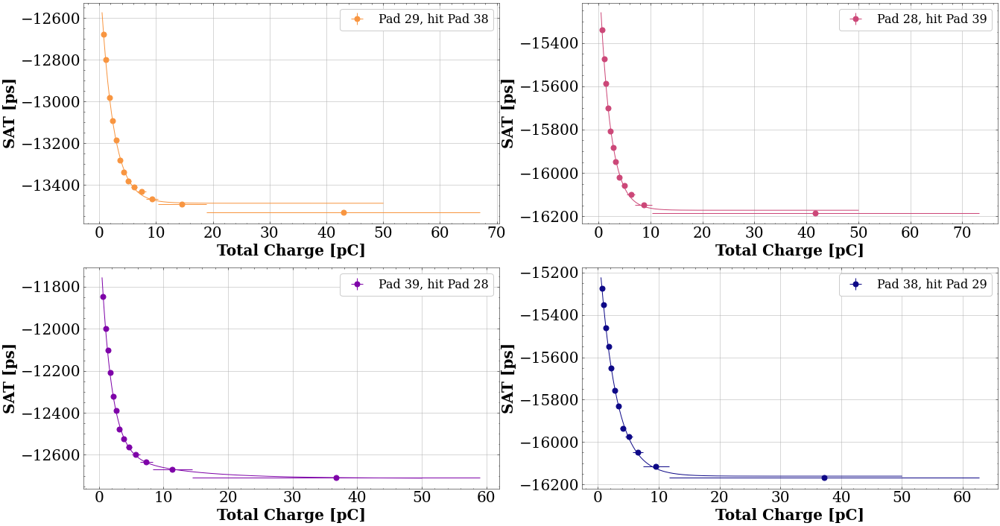

In [94]:
# diagonal
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)

axs[0].errorbar(xxs54c1[iistart:iistop], mdt5in4c1[iistart:iistop], xerr=exs54c1[iistart:iistop], yerr=emdt5in4c1[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs[0].plot(a, expo2_np(a, pars5in4c1), color=pcolors[3])

axs[1].errorbar(xxs36c1[iistart:iistop], mdt3in6c1[iistart:iistop], xerr=exs36c1[iistart:iistop], yerr=emdt3in6c1[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[1].plot(a, expo2_np(a, pars3in6c1), color=pcolors[2])

axs[2].errorbar(xxs63c1[iistart:iistop], mdt6in3c1[iistart:iistop], xerr=exs63c1[iistart:iistop], yerr=emdt6in3c1[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].plot(a, expo2_np(a, pars6in3c1), color=pcolors[1])

axs[3].errorbar(xxs45c1[iistart:iistop], mdt4in5c1[iistart:iistop], xerr=exs45c1[iistart:iistop], yerr=emdt4in5c1[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].plot(a, expo2_np(a, pars4in5c1), color=pcolors[0])

for i in range(4):
    axs[i].grid()
#     axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


In [95]:
qlow = 0.5
qup = 80

nppe = 500


_,_, mdt3in3c1_cor, sdt3in3c1_cor, emdt3in3c1_cor, esdt3in3c1_cor = fff(mm3_qall[xyc1_inpad3], dt3[xyc1_inpad3]-expo2_np(mm3_qall[xyc1_inpad3], pars3in3c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in3c1_cor, sdt4in3c1_cor, emdt4in3c1_cor, esdt4in3c1_cor = fff(mm4_qall[xyc1_inpad3], dt4[xyc1_inpad3]-expo2_np(mm4_qall[xyc1_inpad3], pars4in3c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in3c1_cor, sdt5in3c1_cor, emdt5in3c1_cor, esdt5in3c1_cor = fff(mm5_qall[xyc1_inpad3], dt5[xyc1_inpad3]-expo2_np(mm5_qall[xyc1_inpad3], pars5in3c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in3c1_cor, sdt6in3c1_cor, emdt6in3c1_cor, esdt6in3c1_cor = fff(mm6_qall[xyc1_inpad3], dt6[xyc1_inpad3]-expo2_np(mm6_qall[xyc1_inpad3], pars6in3c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt3in4c1_cor, sdt3in4c1_cor, emdt3in4c1_cor, esdt3in4c1_cor = fff(mm3_qall[xyc1_inpad4], dt3[xyc1_inpad4]-expo2_np(mm3_qall[xyc1_inpad4], pars3in4c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in4c1_cor, sdt4in4c1_cor, emdt4in4c1_cor, esdt4in4c1_cor = fff(mm4_qall[xyc1_inpad4], dt4[xyc1_inpad4]-expo2_np(mm4_qall[xyc1_inpad4], pars4in4c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in4c1_cor, sdt5in4c1_cor, emdt5in4c1_cor, esdt5in4c1_cor = fff(mm5_qall[xyc1_inpad4], dt5[xyc1_inpad4]-expo2_np(mm5_qall[xyc1_inpad4], pars5in4c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in4c1_cor, sdt6in4c1_cor, emdt6in4c1_cor, esdt6in4c1_cor = fff(mm6_qall[xyc1_inpad4], dt6[xyc1_inpad4]-expo2_np(mm6_qall[xyc1_inpad4], pars6in4c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt3in5c1_cor, sdt3in5c1_cor, emdt3in5c1_cor, esdt3in5c1_cor = fff(mm3_qall[xyc1_inpad5], dt3[xyc1_inpad5]-expo2_np(mm3_qall[xyc1_inpad5], pars3in5c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in5c1_cor, sdt4in5c1_cor, emdt4in5c1_cor, esdt4in5c1_cor = fff(mm4_qall[xyc1_inpad5], dt4[xyc1_inpad5]-expo2_np(mm4_qall[xyc1_inpad5], pars4in5c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in5c1_cor, sdt5in5c1_cor, emdt5in5c1_cor, esdt5in5c1_cor = fff(mm5_qall[xyc1_inpad5], dt5[xyc1_inpad5]-expo2_np(mm5_qall[xyc1_inpad5], pars5in5c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in5c1_cor, sdt6in5c1_cor, emdt6in5c1_cor, esdt6in5c1_cor = fff(mm6_qall[xyc1_inpad5], dt6[xyc1_inpad5]-expo2_np(mm6_qall[xyc1_inpad5], pars6in5c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt3in6c1_cor, sdt3in6c1_cor, emdt3in6c1_cor, esdt3in6c1_cor = fff(mm3_qall[xyc1_inpad6], dt3[xyc1_inpad6]-expo2_np(mm3_qall[xyc1_inpad6], pars3in6c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in6c1_cor, sdt4in6c1_cor, emdt4in6c1_cor, esdt4in6c1_cor = fff(mm4_qall[xyc1_inpad6], dt4[xyc1_inpad6]-expo2_np(mm4_qall[xyc1_inpad6], pars4in6c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in6c1_cor, sdt5in6c1_cor, emdt5in6c1_cor, esdt5in6c1_cor = fff(mm5_qall[xyc1_inpad6], dt5[xyc1_inpad6]-expo2_np(mm5_qall[xyc1_inpad6], pars5in6c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in6c1_cor, sdt6in6c1_cor, emdt6in6c1_cor, esdt6in6c1_cor = fff(mm6_qall[xyc1_inpad6], dt6[xyc1_inpad6]-expo2_np(mm6_qall[xyc1_inpad6], pars6in6c1)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])


np.min(idt)=-5.267443309371471e+92, np.max(idt)=509.9608335872041, r1=-619.7904705993099, mm=25.018458377594023, r2=669.8273873544979
40.49745876369211, 12.714288846784436, 51.84651477334621, 
##################################################
np.min(idt)=-181.7579568909231, np.max(idt)=243.26293279903766, r1=-189.85283779150654, mm=4.91347278752299, r2=199.6797833665525
16.588603804679703, 5.2507642980649125, 39.290321945358045, 
##################################################
np.min(idt)=-96.94867195849, np.max(idt)=175.11557541645573, r1=-160.58741343739013, mm=0.7612518281282805, r2=162.1099170936467
15.730446468464521, -1.4784281284746623, 37.50098764387098, 
##################################################
np.min(idt)=-92.30289642886902, np.max(idt)=153.77321176254455, r1=-127.17636457587133, mm=0.5313091074435214, r2=128.23898279075837
17.70174209547198, -1.8946065818064022, 25.703634707323467, 
##################################################
np.min(idt)=-74.652994724232

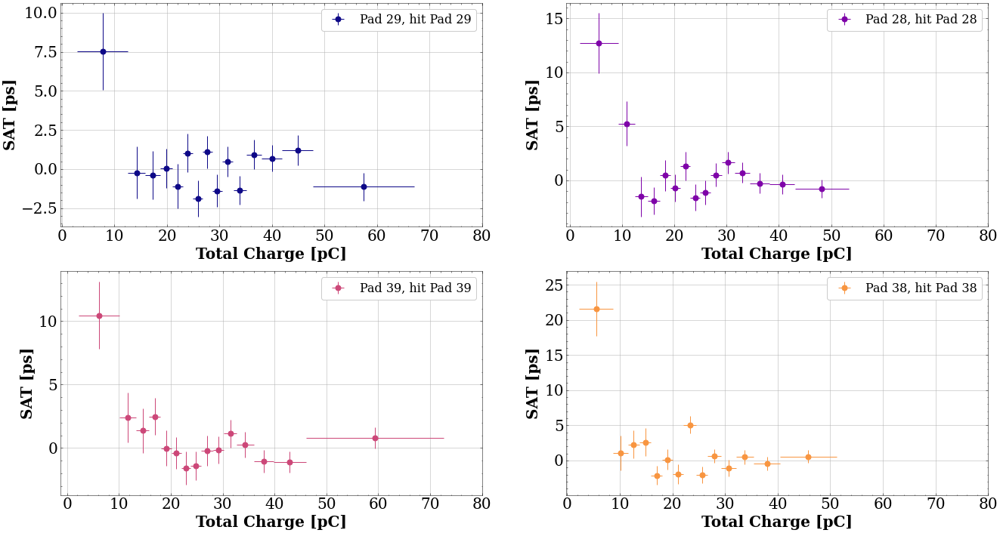

In [96]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()

axs[0].errorbar(xxs55c1[iistart:iistop], mdt5in5c1_cor[iistart:iistop], xerr=exs55c1[iistart:iistop], yerr=emdt5in5c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[1].errorbar(xxs33c1[iistart:iistop], mdt3in3c1_cor[iistart:iistop], xerr=exs33c1[iistart:iistop], yerr=emdt3in3c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[2].errorbar(xxs66c1[iistart:iistop], mdt6in6c1_cor[iistart:iistop], xerr=exs66c1[iistart:iistop], yerr=emdt6in6c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[3].errorbar(xxs44c1[iistart:iistop], mdt4in4c1_cor[iistart:iistop], xerr=exs44c1[iistart:iistop], yerr=emdt4in4c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


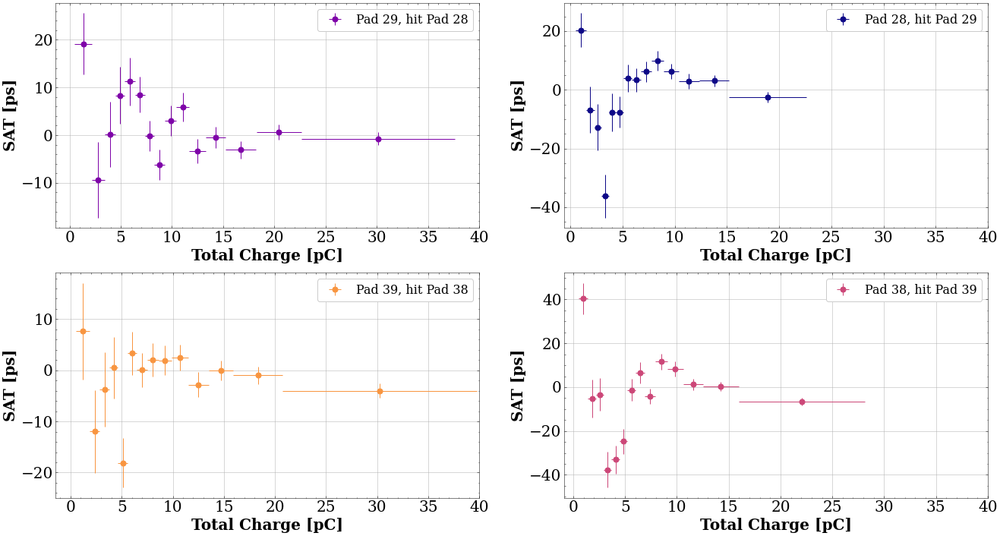

In [97]:
# left-right
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()


axs[0].errorbar(xxs53c1[iistart:iistop], mdt5in3c1_cor[iistart:iistop], xerr=exs53c1[iistart:iistop], yerr=emdt5in3c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[1].errorbar(xxs35c1[iistart:iistop], mdt3in5c1_cor[iistart:iistop], xerr=exs35c1[iistart:iistop], yerr=emdt3in5c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[2].errorbar(xxs64c1[iistart:iistop], mdt6in4c1_cor[iistart:iistop], xerr=exs64c1[iistart:iistop], yerr=emdt6in4c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs[3].errorbar(xxs46c1[iistart:iistop], mdt4in6c1_cor[iistart:iistop], xerr=exs46c1[iistart:iistop], yerr=emdt4in6c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 40)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


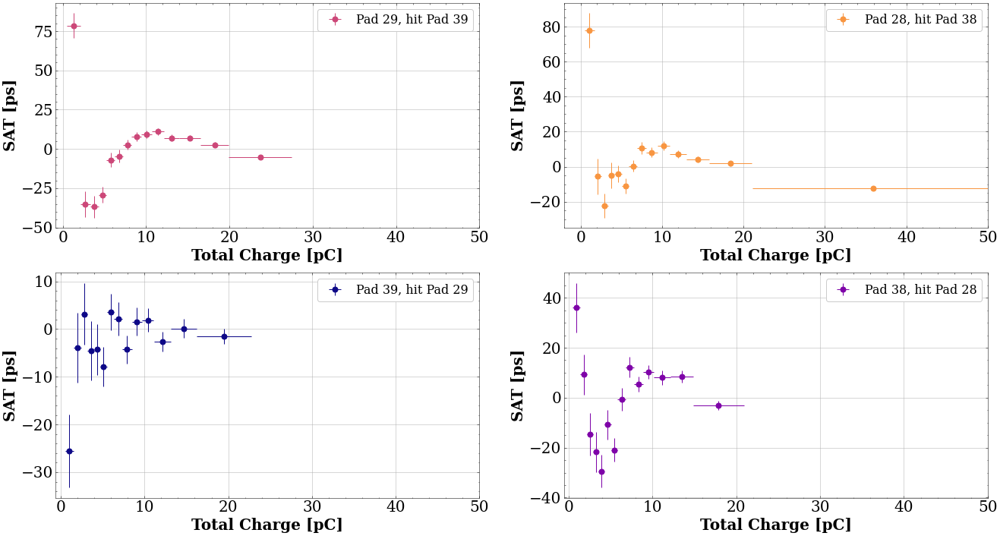

In [98]:
# up-down
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()

axs[0].errorbar(xxs56c1[iistart:iistop], mdt5in6c1_cor[iistart:iistop], xerr=exs56c1[iistart:iistop], yerr=emdt5in6c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[1].errorbar(xxs34c1[iistart:iistop], mdt3in4c1_cor[iistart:iistop], xerr=exs34c1[iistart:iistop], yerr=emdt3in4c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[2].errorbar(xxs65c1[iistart:iistop], mdt6in5c1_cor[iistart:iistop], xerr=exs65c1[iistart:iistop], yerr=emdt6in5c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[3].errorbar(xxs43c1[iistart:iistop], mdt4in3c1_cor[iistart:iistop], xerr=exs43c1[iistart:iistop], yerr=emdt4in3c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 50)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


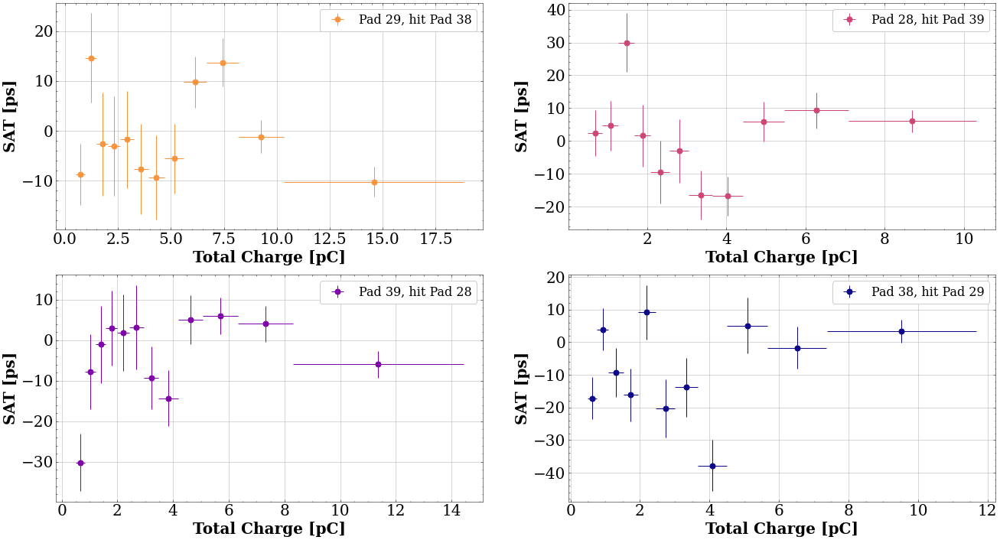

In [99]:
# diagonal
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()


axs[0].errorbar(xxs54c1[iistart:iistop], mdt5in4c1_cor[iistart:iistop], xerr=exs54c1[iistart:iistop], yerr=emdt5in4c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs[1].errorbar(xxs36c1[iistart:iistop], mdt3in6c1_cor[iistart:iistop], xerr=exs36c1[iistart:iistop], yerr=emdt3in6c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[2].errorbar(xxs63c1[iistart:iistop], mdt6in3c1_cor[iistart:iistop], xerr=exs63c1[iistart:iistop], yerr=emdt6in3c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[3].errorbar(xxs45c1[iistart:iistop], mdt4in5c1_cor[iistart:iistop], xerr=exs45c1[iistart:iistop], yerr=emdt4in5c1_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')

for i in range(4):
    axs[i].grid()
#     axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


## Cross 2

In [100]:




qlow = 0.5
qup = 80
nppe = 500
vl1in1c2, vu1in1c2, mdt1in1c2, sdt1in1c2, emdt1in1c2, esdt1in1c2 = fff(mm1_qall[xyc2_inpad1], dt1[xyc2_inpad1], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in1c2, vu2in1c2, mdt2in1c2, sdt2in1c2, emdt2in1c2, esdt2in1c2 = fff(mm2_qall[xyc2_inpad1], dt2[xyc2_inpad1], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in1c2, vu3in1c2, mdt3in1c2, sdt3in1c2, emdt3in1c2, esdt3in1c2 = fff(mm3_qall[xyc2_inpad1], dt3[xyc2_inpad1], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in1c2, vu4in1c2, mdt4in1c2, sdt4in1c2, emdt4in1c2, esdt4in1c2 = fff(mm4_qall[xyc2_inpad1], dt4[xyc2_inpad1], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in1c2, vu5in1c2, mdt5in1c2, sdt5in1c2, emdt5in1c2, esdt5in1c2 = fff(mm5_qall[xyc2_inpad1], dt5[xyc2_inpad1], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in1c2, vu6in1c2, mdt6in1c2, sdt6in1c2, emdt6in1c2, esdt6in1c2 = fff(mm6_qall[xyc2_inpad1], dt6[xyc2_inpad1], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in2c2, vu1in2c2, mdt1in2c2, sdt1in2c2, emdt1in2c2, esdt1in2c2 = fff(mm1_qall[xyc2_inpad2], dt1[xyc2_inpad2], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in2c2, vu2in2c2, mdt2in2c2, sdt2in2c2, emdt2in2c2, esdt2in2c2 = fff(mm2_qall[xyc2_inpad2], dt2[xyc2_inpad2], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in2c2, vu3in2c2, mdt3in2c2, sdt3in2c2, emdt3in2c2, esdt3in2c2 = fff(mm3_qall[xyc2_inpad2], dt3[xyc2_inpad2], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in2c2, vu4in2c2, mdt4in2c2, sdt4in2c2, emdt4in2c2, esdt4in2c2 = fff(mm4_qall[xyc2_inpad2], dt4[xyc2_inpad2], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in2c2, vu5in2c2, mdt5in2c2, sdt5in2c2, emdt5in2c2, esdt5in2c2 = fff(mm5_qall[xyc2_inpad2], dt5[xyc2_inpad2], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in2c2, vu6in2c2, mdt6in2c2, sdt6in2c2, emdt6in2c2, esdt6in2c2 = fff(mm6_qall[xyc2_inpad2], dt6[xyc2_inpad2], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in3c2, vu1in3c2, mdt1in3c2, sdt1in3c2, emdt1in3c2, esdt1in3c2 = fff(mm1_qall[xyc2_inpad3], dt1[xyc2_inpad3], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in3c2, vu2in3c2, mdt2in3c2, sdt2in3c2, emdt2in3c2, esdt2in3c2 = fff(mm2_qall[xyc2_inpad3], dt2[xyc2_inpad3], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in3c2, vu3in3c2, mdt3in3c2, sdt3in3c2, emdt3in3c2, esdt3in3c2 = fff(mm3_qall[xyc2_inpad3], dt3[xyc2_inpad3], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in3c2, vu4in3c2, mdt4in3c2, sdt4in3c2, emdt4in3c2, esdt4in3c2 = fff(mm4_qall[xyc2_inpad3], dt4[xyc2_inpad3], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in3c2, vu5in3c2, mdt5in3c2, sdt5in3c2, emdt5in3c2, esdt5in3c2 = fff(mm5_qall[xyc2_inpad3], dt5[xyc2_inpad3], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in3c2, vu6in3c2, mdt6in3c2, sdt6in3c2, emdt6in3c2, esdt6in3c2 = fff(mm6_qall[xyc2_inpad3], dt6[xyc2_inpad3], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in4c2, vu1in4c2, mdt1in4c2, sdt1in4c2, emdt1in4c2, esdt1in4c2 = fff(mm1_qall[xyc2_inpad4], dt1[xyc2_inpad4], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in4c2, vu2in4c2, mdt2in4c2, sdt2in4c2, emdt2in4c2, esdt2in4c2 = fff(mm2_qall[xyc2_inpad4], dt2[xyc2_inpad4], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in4c2, vu3in4c2, mdt3in4c2, sdt3in4c2, emdt3in4c2, esdt3in4c2 = fff(mm3_qall[xyc2_inpad4], dt3[xyc2_inpad4], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in4c2, vu4in4c2, mdt4in4c2, sdt4in4c2, emdt4in4c2, esdt4in4c2 = fff(mm4_qall[xyc2_inpad4], dt4[xyc2_inpad4], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in4c2, vu5in4c2, mdt5in4c2, sdt5in4c2, emdt5in4c2, esdt5in4c2 = fff(mm5_qall[xyc2_inpad4], dt5[xyc2_inpad4], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in4c2, vu6in4c2, mdt6in4c2, sdt6in4c2, emdt6in4c2, esdt6in4c2 = fff(mm6_qall[xyc2_inpad4], dt6[xyc2_inpad4], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])

vl1in5c2, vu1in5c2, mdt1in5c2, sdt1in5c2, emdt1in5c2, esdt1in5c2 = fff(mm1_qall[xyc2_inpad5], dt1[xyc2_inpad5], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in5c2, vu2in5c2, mdt2in5c2, sdt2in5c2, emdt2in5c2, esdt2in5c2 = fff(mm2_qall[xyc2_inpad5], dt2[xyc2_inpad5], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in5c2, vu3in5c2, mdt3in5c2, sdt3in5c2, emdt3in5c2, esdt3in5c2 = fff(mm3_qall[xyc2_inpad5], dt3[xyc2_inpad5], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in5c2, vu4in5c2, mdt4in5c2, sdt4in5c2, emdt4in5c2, esdt4in5c2 = fff(mm4_qall[xyc2_inpad5], dt4[xyc2_inpad5], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in5c2, vu5in5c2, mdt5in5c2, sdt5in5c2, emdt5in5c2, esdt5in5c2 = fff(mm5_qall[xyc2_inpad5], dt5[xyc2_inpad5], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in5c2, vu6in5c2, mdt6in5c2, sdt6in5c2, emdt6in5c2, esdt6in5c2 = fff(mm6_qall[xyc2_inpad5], dt6[xyc2_inpad5], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


vl1in6c2, vu1in6c2, mdt1in6c2, sdt1in6c2, emdt1in6c2, esdt1in6c2 = fff(mm1_qall[xyc2_inpad6], dt1[xyc2_inpad6], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2in6c2, vu2in6c2, mdt2in6c2, sdt2in6c2, emdt2in6c2, esdt2in6c2 = fff(mm2_qall[xyc2_inpad6], dt2[xyc2_inpad6], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3in6c2, vu3in6c2, mdt3in6c2, sdt3in6c2, emdt3in6c2, esdt3in6c2 = fff(mm3_qall[xyc2_inpad6], dt3[xyc2_inpad6], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4in6c2, vu4in6c2, mdt4in6c2, sdt4in6c2, emdt4in6c2, esdt4in6c2 = fff(mm4_qall[xyc2_inpad6], dt4[xyc2_inpad6], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5in6c2, vu5in6c2, mdt5in6c2, sdt5in6c2, emdt5in6c2, esdt5in6c2 = fff(mm5_qall[xyc2_inpad6], dt5[xyc2_inpad6], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6in6c2, vu6in6c2, mdt6in6c2, sdt6in6c2, emdt6in6c2, esdt6in6c2 = fff(mm6_qall[xyc2_inpad6], dt6[xyc2_inpad6], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


np.min(idt)=-8160.32371471664, np.max(idt)=-7162.355999006394, r1=-8261.544220725433, mm=-7912.824198260257, r2=-7564.104175795082
18.368193322378026, -7923.996313866054, 64.24774455110733, 
##################################################
np.min(idt)=-8095.163782437481, np.max(idt)=-7719.17173023391, r1=-8153.919948224228, mm=-7951.741395442937, r2=-7749.562842661645
15.905521186328352, -7953.543325446483, 45.72620897290456, 
##################################################
np.min(idt)=-8090.860332884887, np.max(idt)=-7777.055225845601, r1=-8139.523799840041, mm=-7967.189170264432, r2=-7794.854540688822
16.612663455891795, -7970.535133019484, 37.506149139375594, 
##################################################
np.min(idt)=-8068.380983787733, np.max(idt)=-7687.081008914618, r1=-8118.174124399539, mm=-7975.878886278084, r2=-7833.583648156628
17.16375819849249, -7980.071941026619, 29.48702205730504, 
##################################################
np.min(idt)=-8099.896811555453

In [101]:

xxs11c2 = (vl1in1c2+vu1in1c2)*0.5
exs11c2 = (vl1in1c2-vu1in1c2)*0.5

xxs21c2 = (vl2in1c2+vu2in1c2)*0.5
exs21c2 = (vl2in1c2-vu2in1c2)*0.5

xxs31c2 = (vl3in1c2+vu3in1c2)*0.5
exs31c2 = (vl3in1c2-vu3in1c2)*0.5

xxs41c2 = (vl4in1c2+vu4in1c2)*0.5
exs41c2 = (vl4in1c2-vu4in1c2)*0.5

xxs51c2 = (vl5in1c2+vu5in1c2)*0.5
exs51c2 = (vl5in1c2-vu5in1c2)*0.5

xxs61c2 = (vl6in1c2+vu6in1c2)*0.5
exs61c2 = (vl6in1c2-vu6in1c2)*0.5



xxs12c2 = (vl1in2c2+vu1in2c2)*0.5
exs12c2 = (vl1in2c2-vu1in2c2)*0.5

xxs22c2 = (vl2in2c2+vu2in2c2)*0.5
exs22c2 = (vl2in2c2-vu2in2c2)*0.5

xxs32c2 = (vl3in2c2+vu3in2c2)*0.5
exs32c2 = (vl3in2c2-vu3in2c2)*0.5

xxs42c2 = (vl4in2c2+vu4in2c2)*0.5
exs42c2 = (vl4in2c2-vu4in2c2)*0.5

xxs52c2 = (vl5in2c2+vu5in2c2)*0.5
exs52c2 = (vl5in2c2-vu5in2c2)*0.5

xxs62c2 = (vl6in2c2+vu6in2c2)*0.5
exs62c2 = (vl6in2c2-vu6in2c2)*0.5



xxs13c2 = (vl1in3c2+vu1in3c2)*0.5
exs13c2 = (vl1in3c2-vu1in3c2)*0.5

xxs23c2 = (vl2in3c2+vu2in3c2)*0.5
exs23c2 = (vl2in3c2-vu2in3c2)*0.5

xxs33c2 = (vl3in3c2+vu3in3c2)*0.5
exs33c2 = (vl3in3c2-vu3in3c2)*0.5

xxs43c2 = (vl4in3c2+vu4in3c2)*0.5
exs43c2 = (vl4in3c2-vu4in3c2)*0.5

xxs53c2 = (vl5in3c2+vu5in3c2)*0.5
exs53c2 = (vl5in3c2-vu5in3c2)*0.5

xxs63c2 = (vl6in3c2+vu6in3c2)*0.5
exs63c2 = (vl6in3c2-vu6in3c2)*0.5

xxs14c2 = (vl1in4c2+vu1in4c2)*0.5
exs14c2 = (vl1in4c2-vu1in4c2)*0.5

xxs24c2 = (vl2in4c2+vu2in4c2)*0.5
exs24c2 = (vl2in4c2-vu2in4c2)*0.5

xxs34c2 = (vl3in4c2+vu3in4c2)*0.5
exs34c2 = (vl3in4c2-vu3in4c2)*0.5

xxs44c2 = (vl4in4c2+vu4in4c2)*0.5
exs44c2 = (vl4in4c2-vu4in4c2)*0.5

xxs54c2 = (vl5in4c2+vu5in4c2)*0.5
exs54c2 = (vl5in4c2-vu5in4c2)*0.5

xxs64c2 = (vl6in4c2+vu6in4c2)*0.5
exs64c2 = (vl6in4c2-vu6in4c2)*0.5



xxs15c2 = (vl1in5c2+vu1in5c2)*0.5
exs15c2 = (vl1in5c2-vu1in5c2)*0.5

xxs25c2 = (vl2in5c2+vu2in5c2)*0.5
exs25c2 = (vl2in5c2-vu2in5c2)*0.5

xxs35c2 = (vl3in5c2+vu3in5c2)*0.5
exs35c2 = (vl3in5c2-vu3in5c2)*0.5

xxs45c2 = (vl4in5c2+vu4in5c2)*0.5
exs45c2 = (vl4in5c2-vu4in5c2)*0.5

xxs55c2 = (vl5in5c2+vu5in5c2)*0.5
exs55c2 = (vl5in5c2-vu5in5c2)*0.5

xxs65c2 = (vl6in5c2+vu6in5c2)*0.5
exs65c2 = (vl6in5c2-vu6in5c2)*0.5



xxs16c2 = (vl1in6c2+vu1in6c2)*0.5
exs16c2 = (vl1in6c2-vu1in6c2)*0.5

xxs26c2 = (vl2in6c2+vu2in6c2)*0.5
exs26c2 = (vl2in6c2-vu2in6c2)*0.5

xxs36c2 = (vl3in6c2+vu3in6c2)*0.5
exs36c2 = (vl3in6c2-vu3in6c2)*0.5

xxs46c2 = (vl4in6c2+vu4in6c2)*0.5
exs46c2 = (vl4in6c2-vu4in6c2)*0.5

xxs56c2 = (vl5in6c2+vu5in6c2)*0.5
exs56c2 = (vl5in6c2-vu5in6c2)*0.5

xxs66c2 = (vl6in6c2+vu6in6c2)*0.5
exs66c2 = (vl6in6c2-vu6in6c2)*0.5


In [102]:
print(c2_order)
print([pnames[i] for i in c2_order])

[2 0 3 1]
['Pad 28', 'Pad 27', 'Pad 38', 'Pad 37']


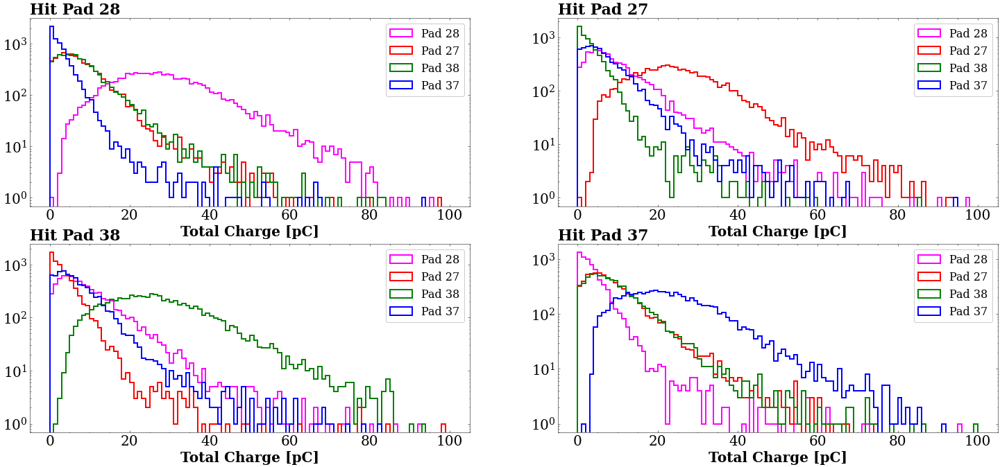

In [103]:
fig, axs = plt.subplots(2,2, figsize=(25, 11))
axs=axs.ravel()
qrange = 100

for i,j in enumerate(c2_order):
    axs[i].set_title(f'Hit {pnames[j]}', loc='left')
    axs[i].hist(mm3_qall[xyc2_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[2], lw=2, label=pnames[2])
    axs[i].hist(mm1_qall[xyc2_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[0], lw=2, label=pnames[0])
    axs[i].hist(mm4_qall[xyc2_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[3], lw=2, label=pnames[3])
    axs[i].hist(mm2_qall[xyc2_inpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[1], lw=2, label=pnames[1])




for i in range(4):
    axs[i].legend()
    axs[i].set_yscale('log')
    axs[i].set_xlabel("Total Charge [pC]")
plt.show()

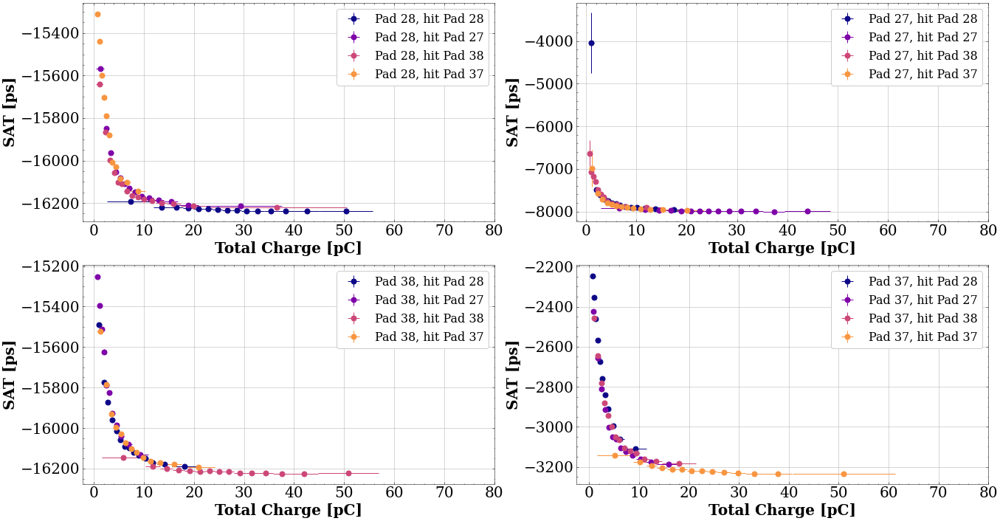

In [104]:

fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()
axs[0].errorbar(xxs33c2[iistart:iistop], mdt3in3c2[iistart:iistop], xerr=exs33c2[iistart:iistop], yerr=emdt3in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[2]}')
axs[0].errorbar(xxs31c2[iistart:iistop], mdt3in1c2[iistart:iistop], xerr=exs31c2[iistart:iistop], yerr=emdt3in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[0]}')
axs[0].errorbar(xxs34c2[iistart:iistop], mdt3in4c2[iistart:iistop], xerr=exs34c2[iistart:iistop], yerr=emdt3in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[3]}')
axs[0].errorbar(xxs32c2[iistart:iistop], mdt3in2c2[iistart:iistop], xerr=exs32c2[iistart:iistop], yerr=emdt3in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[1]}')

axs[1].errorbar(xxs13c2[iistart:iistop], mdt1in3c2[iistart:iistop], xerr=exs13c2[iistart:iistop], yerr=emdt1in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[0]}, hit {pnames[2]}')
axs[1].errorbar(xxs11c2[iistart:iistop], mdt1in1c2[iistart:iistop], xerr=exs11c2[iistart:iistop], yerr=emdt1in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[0]}, hit {pnames[0]}')
axs[1].errorbar(xxs14c2[iistart:iistop], mdt1in4c2[iistart:iistop], xerr=exs14c2[iistart:iistop], yerr=emdt1in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[0]}, hit {pnames[3]}')
axs[1].errorbar(xxs12c2[iistart:iistop], mdt1in2c2[iistart:iistop], xerr=exs12c2[iistart:iistop], yerr=emdt1in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[0]}, hit {pnames[1]}')

axs[2].errorbar(xxs43c2[iistart:iistop], mdt4in3c2[iistart:iistop], xerr=exs43c2[iistart:iistop], yerr=emdt4in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[2]}')
axs[2].errorbar(xxs41c2[iistart:iistop], mdt4in1c2[iistart:iistop], xerr=exs41c2[iistart:iistop], yerr=emdt4in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[0]}')
axs[2].errorbar(xxs44c2[iistart:iistop], mdt4in4c2[iistart:iistop], xerr=exs44c2[iistart:iistop], yerr=emdt4in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[3]}')
axs[2].errorbar(xxs42c2[iistart:iistop], mdt4in2c2[iistart:iistop], xerr=exs42c2[iistart:iistop], yerr=emdt4in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[1]}')

axs[3].errorbar(xxs23c2[iistart:iistop], mdt2in3c2[iistart:iistop], xerr=exs23c2[iistart:iistop], yerr=emdt2in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[1]}, hit {pnames[2]}')
axs[3].errorbar(xxs21c2[iistart:iistop], mdt2in1c2[iistart:iistop], xerr=exs21c2[iistart:iistop], yerr=emdt2in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[1]}, hit {pnames[0]}')
axs[3].errorbar(xxs24c2[iistart:iistop], mdt2in4c2[iistart:iistop], xerr=exs24c2[iistart:iistop], yerr=emdt2in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[1]}, hit {pnames[3]}')
axs[3].errorbar(xxs22c2[iistart:iistop], mdt2in2c2[iistart:iistop], xerr=exs22c2[iistart:iistop], yerr=emdt2in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[1]}, hit {pnames[1]}')


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

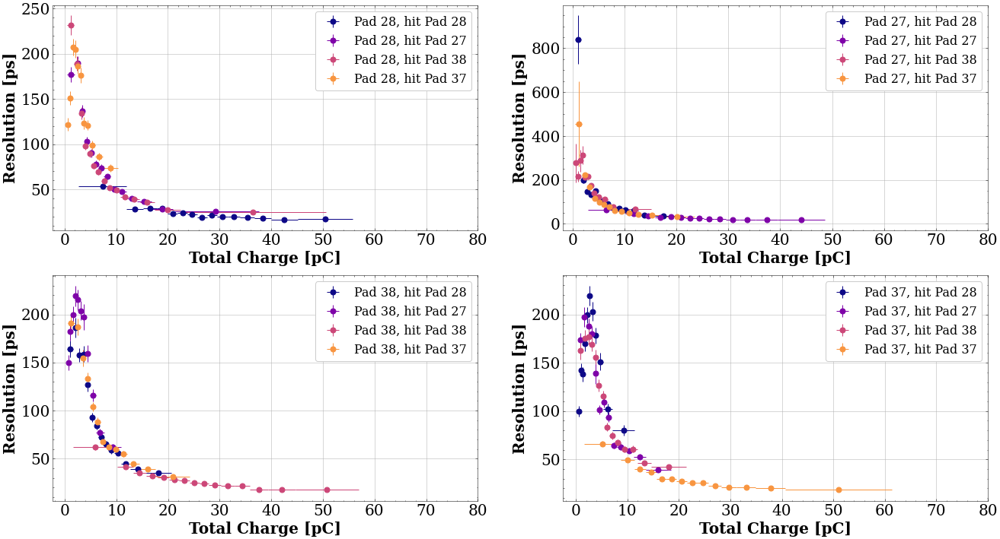

In [105]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()
axs[0].errorbar(xxs33c2[iistart:iistop], sdt3in3c2[iistart:iistop], xerr=exs33c2[iistart:iistop], yerr=esdt3in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[2]}')
axs[0].errorbar(xxs31c2[iistart:iistop], sdt3in1c2[iistart:iistop], xerr=exs31c2[iistart:iistop], yerr=esdt3in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[0]}')
axs[0].errorbar(xxs34c2[iistart:iistop], sdt3in4c2[iistart:iistop], xerr=exs34c2[iistart:iistop], yerr=esdt3in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[3]}')
axs[0].errorbar(xxs32c2[iistart:iistop], sdt3in2c2[iistart:iistop], xerr=exs32c2[iistart:iistop], yerr=esdt3in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[1]}')

axs[1].errorbar(xxs13c2[iistart:iistop], sdt1in3c2[iistart:iistop], xerr=exs13c2[iistart:iistop], yerr=esdt1in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[0]}, hit {pnames[2]}')
axs[1].errorbar(xxs11c2[iistart:iistop], sdt1in1c2[iistart:iistop], xerr=exs11c2[iistart:iistop], yerr=esdt1in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[0]}, hit {pnames[0]}')
axs[1].errorbar(xxs14c2[iistart:iistop], sdt1in4c2[iistart:iistop], xerr=exs14c2[iistart:iistop], yerr=esdt1in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[0]}, hit {pnames[3]}')
axs[1].errorbar(xxs12c2[iistart:iistop], sdt1in2c2[iistart:iistop], xerr=exs12c2[iistart:iistop], yerr=esdt1in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[0]}, hit {pnames[1]}')

axs[2].errorbar(xxs43c2[iistart:iistop], sdt4in3c2[iistart:iistop], xerr=exs43c2[iistart:iistop], yerr=esdt4in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[2]}')
axs[2].errorbar(xxs41c2[iistart:iistop], sdt4in1c2[iistart:iistop], xerr=exs41c2[iistart:iistop], yerr=esdt4in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[0]}')
axs[2].errorbar(xxs44c2[iistart:iistop], sdt4in4c2[iistart:iistop], xerr=exs44c2[iistart:iistop], yerr=esdt4in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[3]}')
axs[2].errorbar(xxs42c2[iistart:iistop], sdt4in2c2[iistart:iistop], xerr=exs42c2[iistart:iistop], yerr=esdt4in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[1]}')

axs[3].errorbar(xxs23c2[iistart:iistop], sdt2in3c2[iistart:iistop], xerr=exs23c2[iistart:iistop], yerr=esdt2in3c2[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[1]}, hit {pnames[2]}')
axs[3].errorbar(xxs21c2[iistart:iistop], sdt2in1c2[iistart:iistop], xerr=exs21c2[iistart:iistop], yerr=esdt2in1c2[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[1]}, hit {pnames[0]}')
axs[3].errorbar(xxs24c2[iistart:iistop], sdt2in4c2[iistart:iistop], xerr=exs24c2[iistart:iistop], yerr=esdt2in4c2[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[1]}, hit {pnames[3]}')
axs[3].errorbar(xxs22c2[iistart:iistop], sdt2in2c2[iistart:iistop], xerr=exs22c2[iistart:iistop], yerr=esdt2in2c2[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[1]}, hit {pnames[1]}')


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()





# Qall hit track

## Left Cross

In [106]:
mm_v_vec = np.stack((mm1_v,mm2_v,mm3_v,mm4_v,mm5_v,mm6_v), axis=1)
mm_qall_vec = np.stack((mm1_qall,mm2_qall,mm3_qall,mm4_qall,mm5_qall,mm6_qall), axis=1)
max_q_c1 = np.argmax(mm_qall_vec,axis=1)

In [107]:
mmqall_in3 = max_q_c1 == 2
mmqall_in4 = max_q_c1 == 3
mmqall_in5 = max_q_c1 == 4
mmqall_in6 = max_q_c1 == 5



xyc1_pad3_qa = np.logical_and(np.logical_and(mmqall_in3, cross1_cut), cc3)
xyc1_pad4_qa = np.logical_and(np.logical_and(mmqall_in4, cross1_cut), cc4)
xyc1_pad5_qa = np.logical_and(np.logical_and(mmqall_in5, cross1_cut), cc5)
xyc1_pad6_qa = np.logical_and(np.logical_and(mmqall_in6, cross1_cut), cc6)

xyc1_pads_qa = [[],[],xyc1_pad3_qa,xyc1_pad4_qa,xyc1_pad5_qa,xyc1_pad6_qa]


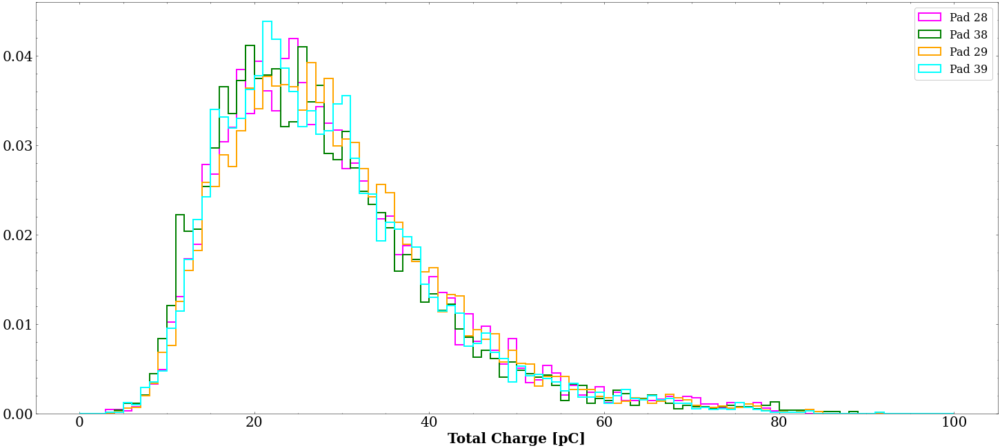

In [108]:
fig, axs = plt.subplots(figsize=(25, 11))

axs.hist(mm3_qall[xyc1_pad3_qa], bins=100, range=(0, 100), histtype='step', color=colors[2], lw=2, label=pnames[2], density=True)
axs.hist(mm4_qall[xyc1_pad4_qa], bins=100, range=(0, 100), histtype='step', color=colors[3], lw=2, label=pnames[3], density=True)
axs.hist(mm5_qall[xyc1_pad5_qa], bins=100, range=(0, 100), histtype='step', color=colors[4], lw=2, label=pnames[4], density=True)
axs.hist(mm6_qall[xyc1_pad6_qa], bins=100, range=(0, 100), histtype='step', color=colors[5], lw=2, label=pnames[5], density=True)

axs.legend()
# axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

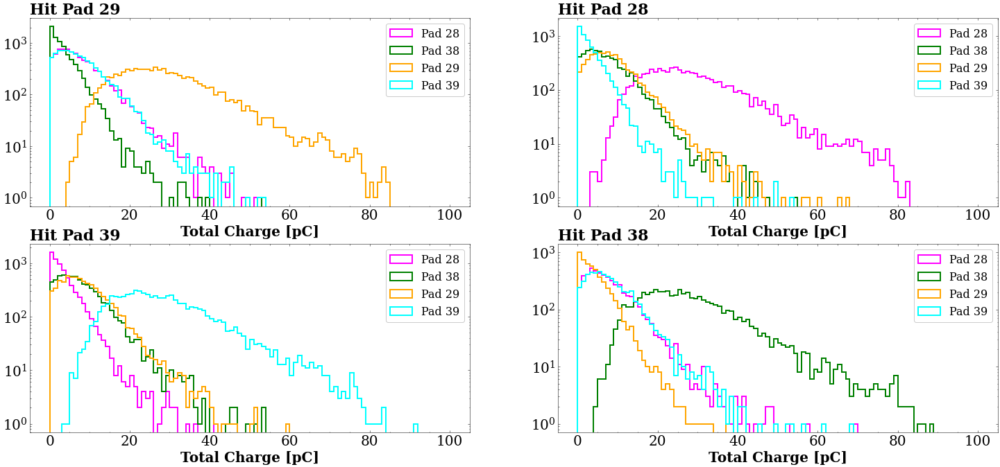

In [109]:
fig, axs = plt.subplots(2,2, figsize=(25, 11))
axs=axs.ravel()
qrange = 100

dens = False
for i,j in enumerate(c1_order):
    axs[i].set_title(f'Hit {pnames[j]}', loc='left')
    axs[i].hist(mm3_qall[xyc1_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[2], lw=2, label=pnames[2], density=dens)
    axs[i].hist(mm4_qall[xyc1_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[3], lw=2, label=pnames[3], density=dens)
    axs[i].hist(mm5_qall[xyc1_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[4], lw=2, label=pnames[4], density=dens)
    axs[i].hist(mm6_qall[xyc1_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[5], lw=2, label=pnames[5], density=dens)




for i in range(4):
    axs[i].legend()
    axs[i].set_yscale('log')
    axs[i].set_xlabel("Total Charge [pC]")
plt.show()

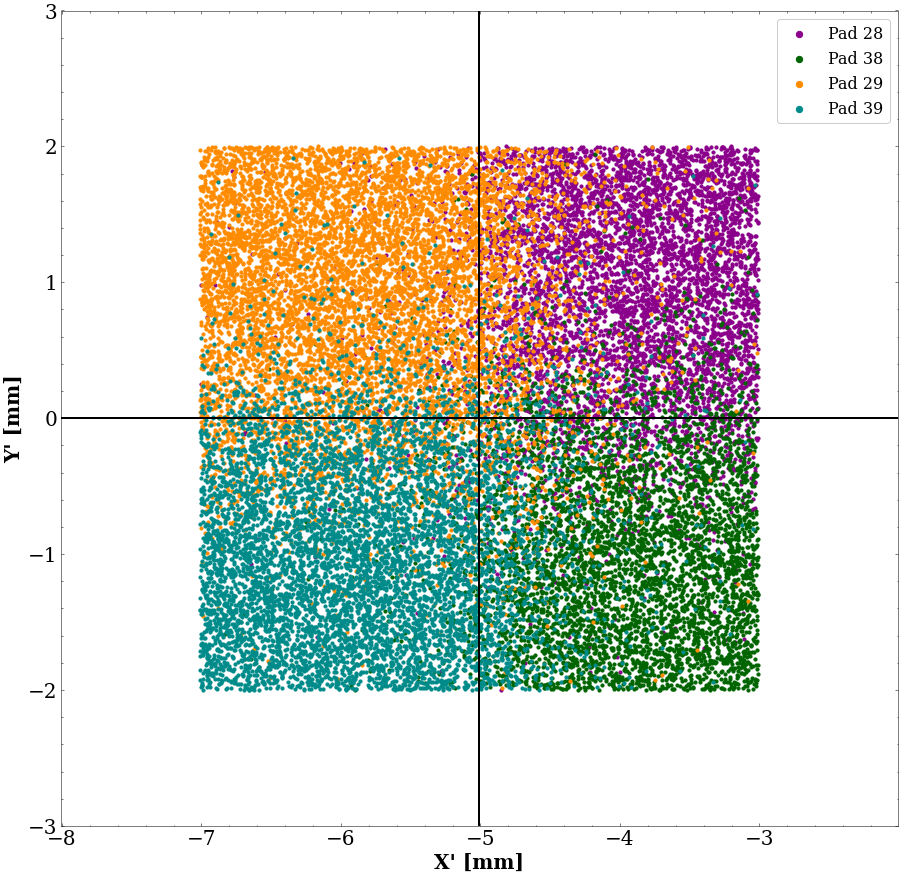

In [110]:
fig, axs = plt.subplots(figsize=(15, 15))

axs.scatter(x_s[xyc1_pad3_qa], y_s[xyc1_pad3_qa], s=10, color=f'dark{colors[2]}', label=f'{pnames[2]}')
axs.scatter(x_s[xyc1_pad4_qa], y_s[xyc1_pad4_qa], s=10, color=f'dark{colors[3]}', label=f'{pnames[3]}')
axs.scatter(x_s[xyc1_pad5_qa], y_s[xyc1_pad5_qa], s=10, color=f'dark{colors[4]}', label=f'{pnames[4]}')
axs.scatter(x_s[xyc1_pad6_qa], y_s[xyc1_pad6_qa], s=10, color=f'dark{colors[5]}', label=f'{pnames[5]}')

axs.scatter(cross2_s[0,0], cross2_s[0,1], s=1, color='black', marker='+')
axs.axvline(cross2_s[0,0], lw=2, color='black')
axs.axhline(cross2_s[0,1], lw=2, color='black')
# axs.axvline(0, lw=2, color='black')
# axs.axhline(0, lw=2, color='black')


axs.legend(loc=1, markerscale=2)
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
axs.set_xlim(cross2_s[0,0]-3,cross2_s[0,0]+3)
axs.set_ylim(cross2_s[0,1]-3,cross2_s[0,1]+3)
plt.show()

In [111]:
# tranges_c1 = [
#  [-8500, -7500],
#  [-5000, -2000],
#  [-16500, -15000],
#  [-16500, -15000],
#  [-13700, -12500],
#  [-13000, -12000]
    
# ]

tranges_c1 = [
 [-10000, -6000],
 [-7000, -1000],
 [-18000, -14000],
 [-18000, -14000],
 [-15000, -11000],
 [-15000, -11000]
    
]

print(tranges)

[[-8500, -7500], [-5000, -2000], [-16500, -15000], [-16500, -15000], [-13700, -12500], [-13000, -12000]]


In [112]:

qlow = 0.5
qup = 60

nppe = 500


vl3in3c1_qa, vu3in3c1_qa, mdt3in3c1_qa, sdt3in3c1_qa, emdt3in3c1_qa, esdt3in3c1_qa = fff(mm3_qall[xyc1_pad3_qa], dt3[xyc1_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c1[2][0], tranges_c1[2][1]])
vl4in3c1_qa, vu4in3c1_qa, mdt4in3c1_qa, sdt4in3c1_qa, emdt4in3c1_qa, esdt4in3c1_qa = fff(mm4_qall[xyc1_pad3_qa], dt4[xyc1_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c1[3][0], tranges_c1[3][1]])
vl5in3c1_qa, vu5in3c1_qa, mdt5in3c1_qa, sdt5in3c1_qa, emdt5in3c1_qa, esdt5in3c1_qa = fff(mm5_qall[xyc1_pad3_qa], dt5[xyc1_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c1[4][0], tranges_c1[4][1]])
vl6in3c1_qa, vu6in3c1_qa, mdt6in3c1_qa, sdt6in3c1_qa, emdt6in3c1_qa, esdt6in3c1_qa = fff(mm6_qall[xyc1_pad3_qa], dt6[xyc1_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c1[5][0], tranges_c1[5][1]])

vl3in4c1_qa, vu3in4c1_qa, mdt3in4c1_qa, sdt3in4c1_qa, emdt3in4c1_qa, esdt3in4c1_qa = fff(mm3_qall[xyc1_pad4_qa], dt3[xyc1_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c1[2][0], tranges_c1[2][1]])
vl4in4c1_qa, vu4in4c1_qa, mdt4in4c1_qa, sdt4in4c1_qa, emdt4in4c1_qa, esdt4in4c1_qa = fff(mm4_qall[xyc1_pad4_qa], dt4[xyc1_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c1[3][0], tranges_c1[3][1]])
vl5in4c1_qa, vu5in4c1_qa, mdt5in4c1_qa, sdt5in4c1_qa, emdt5in4c1_qa, esdt5in4c1_qa = fff(mm5_qall[xyc1_pad4_qa], dt5[xyc1_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c1[4][0], tranges_c1[4][1]])
vl6in4c1_qa, vu6in4c1_qa, mdt6in4c1_qa, sdt6in4c1_qa, emdt6in4c1_qa, esdt6in4c1_qa = fff(mm6_qall[xyc1_pad4_qa], dt6[xyc1_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c1[5][0], tranges_c1[5][1]])

vl3in5c1_qa, vu3in5c1_qa, mdt3in5c1_qa, sdt3in5c1_qa, emdt3in5c1_qa, esdt3in5c1_qa = fff(mm3_qall[xyc1_pad5_qa], dt3[xyc1_pad5_qa], qlow, qup, nppe, False, trange=[tranges_c1[2][0], tranges_c1[2][1]])
vl4in5c1_qa, vu4in5c1_qa, mdt4in5c1_qa, sdt4in5c1_qa, emdt4in5c1_qa, esdt4in5c1_qa = fff(mm4_qall[xyc1_pad5_qa], dt4[xyc1_pad5_qa], qlow, qup, nppe, False, trange=[tranges_c1[3][0], tranges_c1[3][1]])
vl5in5c1_qa, vu5in5c1_qa, mdt5in5c1_qa, sdt5in5c1_qa, emdt5in5c1_qa, esdt5in5c1_qa = fff(mm5_qall[xyc1_pad5_qa], dt5[xyc1_pad5_qa], qlow, qup, nppe, False, trange=[tranges_c1[4][0], tranges_c1[4][1]])
vl6in5c1_qa, vu6in5c1_qa, mdt6in5c1_qa, sdt6in5c1_qa, emdt6in5c1_qa, esdt6in5c1_qa = fff(mm6_qall[xyc1_pad5_qa], dt6[xyc1_pad5_qa], qlow, qup, nppe, False, trange=[tranges_c1[5][0], tranges_c1[5][1]])

vl3in6c1_qa, vu3in6c1_qa, mdt3in6c1_qa, sdt3in6c1_qa, emdt3in6c1_qa, esdt3in6c1_qa = fff(mm3_qall[xyc1_pad6_qa], dt3[xyc1_pad6_qa], qlow, qup, nppe, False, trange=[tranges_c1[2][0], tranges_c1[2][1]])
vl4in6c1_qa, vu4in6c1_qa, mdt4in6c1_qa, sdt4in6c1_qa, emdt4in6c1_qa, esdt4in6c1_qa = fff(mm4_qall[xyc1_pad6_qa], dt4[xyc1_pad6_qa], qlow, qup, nppe, False, trange=[tranges_c1[3][0], tranges_c1[3][1]])
vl5in6c1_qa, vu5in6c1_qa, mdt5in6c1_qa, sdt5in6c1_qa, emdt5in6c1_qa, esdt5in6c1_qa = fff(mm5_qall[xyc1_pad6_qa], dt5[xyc1_pad6_qa], qlow, qup, nppe, False, trange=[tranges_c1[4][0], tranges_c1[4][1]])
vl6in6c1_qa, vu6in6c1_qa, mdt6in6c1_qa, sdt6in6c1_qa, emdt6in6c1_qa, esdt6in6c1_qa = fff(mm6_qall[xyc1_pad6_qa], dt6[xyc1_pad6_qa], qlow, qup, nppe, False, trange=[tranges_c1[5][0], tranges_c1[5][1]])

xxsc33c1_qa = (vl3in3c1_qa + vu3in3c1_qa)*0.5 
exsc33c1_qa = (vl3in3c1_qa - vu3in3c1_qa)*0.5 
xxsc43c1_qa = (vl4in3c1_qa + vu4in3c1_qa)*0.5 
exsc43c1_qa = (vl4in3c1_qa - vu4in3c1_qa)*0.5 
xxsc53c1_qa = (vl5in3c1_qa + vu5in3c1_qa)*0.5 
exsc53c1_qa = (vl5in3c1_qa - vu5in3c1_qa)*0.5 
xxsc63c1_qa = (vl6in3c1_qa + vu6in3c1_qa)*0.5 
exsc63c1_qa = (vl6in3c1_qa - vu6in3c1_qa)*0.5 


xxsc34c1_qa = (vl3in4c1_qa + vu3in4c1_qa)*0.5 
exsc34c1_qa = (vl3in4c1_qa - vu3in4c1_qa)*0.5 
xxsc44c1_qa = (vl4in4c1_qa + vu4in4c1_qa)*0.5 
exsc44c1_qa = (vl4in4c1_qa - vu4in4c1_qa)*0.5 
xxsc54c1_qa = (vl5in4c1_qa + vu5in4c1_qa)*0.5 
exsc54c1_qa = (vl5in4c1_qa - vu5in4c1_qa)*0.5 
xxsc64c1_qa = (vl6in4c1_qa + vu6in4c1_qa)*0.5 
exsc64c1_qa = (vl6in4c1_qa - vu6in4c1_qa)*0.5 


xxsc35c1_qa = (vl3in5c1_qa + vu3in5c1_qa)*0.5 
exsc35c1_qa = (vl3in5c1_qa - vu3in5c1_qa)*0.5 
xxsc45c1_qa = (vl4in5c1_qa + vu4in5c1_qa)*0.5 
exsc45c1_qa = (vl4in5c1_qa - vu4in5c1_qa)*0.5 
xxsc55c1_qa = (vl5in5c1_qa + vu5in5c1_qa)*0.5 
exsc55c1_qa = (vl5in5c1_qa - vu5in5c1_qa)*0.5 
xxsc65c1_qa = (vl6in5c1_qa + vu6in5c1_qa)*0.5 
exsc65c1_qa = (vl6in5c1_qa - vu6in5c1_qa)*0.5 


xxsc36c1_qa = (vl3in6c1_qa + vu3in6c1_qa)*0.5 
exsc36c1_qa = (vl3in6c1_qa - vu3in6c1_qa)*0.5 
xxsc46c1_qa = (vl4in6c1_qa + vu4in6c1_qa)*0.5 
exsc46c1_qa = (vl4in6c1_qa - vu4in6c1_qa)*0.5 
xxsc56c1_qa = (vl5in6c1_qa + vu5in6c1_qa)*0.5 
exsc56c1_qa = (vl5in6c1_qa - vu5in6c1_qa)*0.5 
xxsc66c1_qa = (vl6in6c1_qa + vu6in6c1_qa)*0.5 
exsc66c1_qa = (vl6in6c1_qa - vu6in6c1_qa)*0.5 


np.min(idt)=-16388.481081430455, np.max(idt)=-16061.862494033192, r1=-16381.19320196995, mm=-16217.828827114185, r2=-16054.464452258419
15.396495537862052, -16220.814013420675, 37.52238391959181, 
##################################################
np.min(idt)=-16313.861154200255, np.max(idt)=-16067.959828671093, r1=-16351.384669329225, mm=-16223.033228130573, r2=-16094.68178693192
15.74916525500519, -16223.90019685992, 29.032305597972947, 
##################################################
np.min(idt)=-16297.50126501574, np.max(idt)=-16141.7194058902, r1=-16337.515429818144, mm=-16227.105146334803, r2=-16116.694862851462
14.463161823068658, -16228.4356049564, 28.32880282430705, 
##################################################
np.min(idt)=-16335.448100429034, np.max(idt)=-16126.884440289587, r1=-16343.222984602768, mm=-16231.314734945887, r2=-16119.406485289006
14.846216079982087, -16234.612774164534, 25.130888544454976, 
##################################################
np.min(idt)

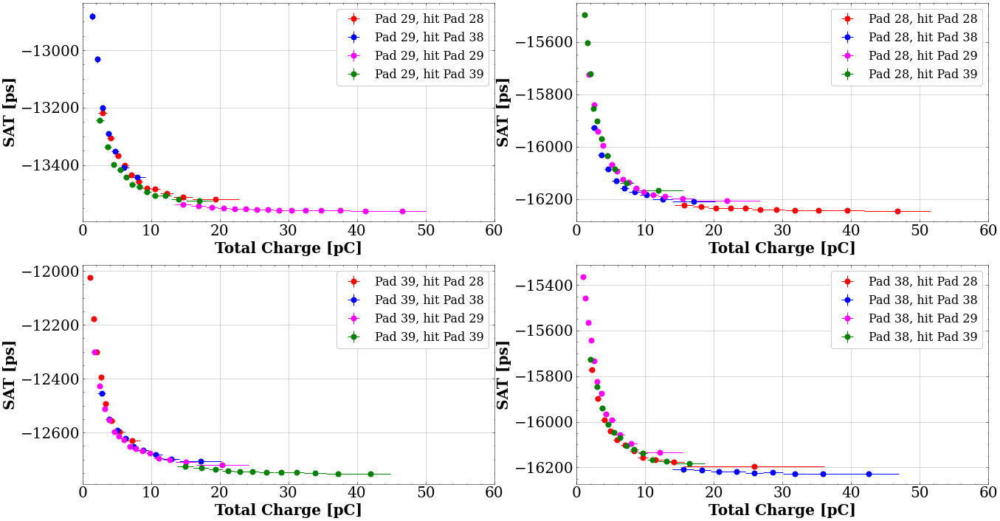

In [113]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxsc53c1_qa[iistart:iistop], mdt5in3c1_qa[iistart:iistop], xerr=exsc53c1_qa[iistart:iistop], yerr=emdt5in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].errorbar(xxsc54c1_qa[iistart:iistop], mdt5in4c1_qa[iistart:iistop], xerr=exsc54c1_qa[iistart:iistop], yerr=emdt5in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[4]}, hit {pnames[3]}')
axs[0].errorbar(xxsc55c1_qa[iistart:iistop], mdt5in5c1_qa[iistart:iistop], xerr=exsc55c1_qa[iistart:iistop], yerr=emdt5in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].errorbar(xxsc56c1_qa[iistart:iistop], mdt5in6c1_qa[iistart:iistop], xerr=exsc56c1_qa[iistart:iistop], yerr=emdt5in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[4]}, hit {pnames[5]}')

axs[1].errorbar(xxsc33c1_qa[iistart:iistop], mdt3in3c1_qa[iistart:iistop], xerr=exsc33c1_qa[iistart:iistop], yerr=emdt3in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].errorbar(xxsc34c1_qa[iistart:iistop], mdt3in4c1_qa[iistart:iistop], xerr=exsc34c1_qa[iistart:iistop], yerr=emdt3in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[3]}')
axs[1].errorbar(xxsc35c1_qa[iistart:iistop], mdt3in5c1_qa[iistart:iistop], xerr=exsc35c1_qa[iistart:iistop], yerr=emdt3in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].errorbar(xxsc36c1_qa[iistart:iistop], mdt3in6c1_qa[iistart:iistop], xerr=exsc36c1_qa[iistart:iistop], yerr=emdt3in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[5]}')

axs[2].errorbar(xxsc63c1_qa[iistart:iistop], mdt6in3c1_qa[iistart:iistop], xerr=exsc63c1_qa[iistart:iistop], yerr=emdt6in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].errorbar(xxsc64c1_qa[iistart:iistop], mdt6in4c1_qa[iistart:iistop], xerr=exsc64c1_qa[iistart:iistop], yerr=emdt6in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[5]}, hit {pnames[3]}')
axs[2].errorbar(xxsc65c1_qa[iistart:iistop], mdt6in5c1_qa[iistart:iistop], xerr=exsc65c1_qa[iistart:iistop], yerr=emdt6in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].errorbar(xxsc66c1_qa[iistart:iistop], mdt6in6c1_qa[iistart:iistop], xerr=exsc66c1_qa[iistart:iistop], yerr=emdt6in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[5]}, hit {pnames[5]}')

axs[3].errorbar(xxsc43c1_qa[iistart:iistop], mdt4in3c1_qa[iistart:iistop], xerr=exsc43c1_qa[iistart:iistop], yerr=emdt4in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].errorbar(xxsc44c1_qa[iistart:iistop], mdt4in4c1_qa[iistart:iistop], xerr=exsc44c1_qa[iistart:iistop], yerr=emdt4in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[3]}')
axs[3].errorbar(xxsc45c1_qa[iistart:iistop], mdt4in5c1_qa[iistart:iistop], xerr=exsc45c1_qa[iistart:iistop], yerr=emdt4in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].errorbar(xxsc46c1_qa[iistart:iistop], mdt4in6c1_qa[iistart:iistop], xerr=exsc46c1_qa[iistart:iistop], yerr=emdt4in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[5]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, qup)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


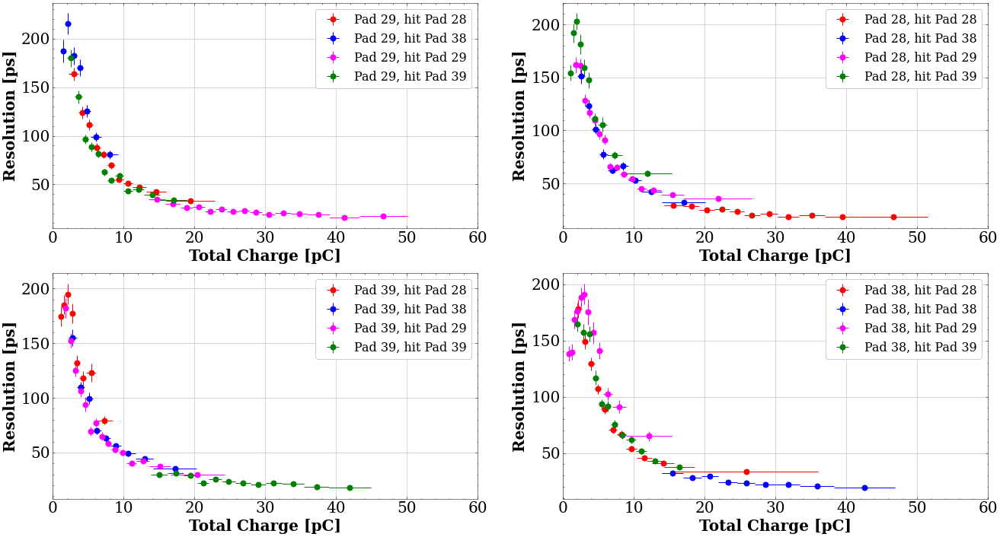

In [114]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxsc53c1_qa[iistart:iistop], sdt5in3c1_qa[iistart:iistop], xerr=exsc53c1_qa[iistart:iistop], yerr=esdt5in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].errorbar(xxsc54c1_qa[iistart:iistop], sdt5in4c1_qa[iistart:iistop], xerr=exsc54c1_qa[iistart:iistop], yerr=esdt5in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[4]}, hit {pnames[3]}')
axs[0].errorbar(xxsc55c1_qa[iistart:iistop], sdt5in5c1_qa[iistart:iistop], xerr=exsc55c1_qa[iistart:iistop], yerr=esdt5in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].errorbar(xxsc56c1_qa[iistart:iistop], sdt5in6c1_qa[iistart:iistop], xerr=exsc56c1_qa[iistart:iistop], yerr=esdt5in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[4]}, hit {pnames[5]}')

axs[1].errorbar(xxsc33c1_qa[iistart:iistop], sdt3in3c1_qa[iistart:iistop], xerr=exsc33c1_qa[iistart:iistop], yerr=esdt3in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].errorbar(xxsc34c1_qa[iistart:iistop], sdt3in4c1_qa[iistart:iistop], xerr=exsc34c1_qa[iistart:iistop], yerr=esdt3in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[3]}')
axs[1].errorbar(xxsc35c1_qa[iistart:iistop], sdt3in5c1_qa[iistart:iistop], xerr=exsc35c1_qa[iistart:iistop], yerr=esdt3in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].errorbar(xxsc36c1_qa[iistart:iistop], sdt3in6c1_qa[iistart:iistop], xerr=exsc36c1_qa[iistart:iistop], yerr=esdt3in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[5]}')

axs[2].errorbar(xxsc63c1_qa[iistart:iistop], sdt6in3c1_qa[iistart:iistop], xerr=exsc63c1_qa[iistart:iistop], yerr=esdt6in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].errorbar(xxsc64c1_qa[iistart:iistop], sdt6in4c1_qa[iistart:iistop], xerr=exsc64c1_qa[iistart:iistop], yerr=esdt6in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[5]}, hit {pnames[3]}')
axs[2].errorbar(xxsc65c1_qa[iistart:iistop], sdt6in5c1_qa[iistart:iistop], xerr=exsc65c1_qa[iistart:iistop], yerr=esdt6in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].errorbar(xxsc66c1_qa[iistart:iistop], sdt6in6c1_qa[iistart:iistop], xerr=exsc66c1_qa[iistart:iistop], yerr=esdt6in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[5]}, hit {pnames[5]}')

axs[3].errorbar(xxsc43c1_qa[iistart:iistop], sdt4in3c1_qa[iistart:iistop], xerr=exsc43c1_qa[iistart:iistop], yerr=esdt4in3c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].errorbar(xxsc44c1_qa[iistart:iistop], sdt4in4c1_qa[iistart:iistop], xerr=exsc44c1_qa[iistart:iistop], yerr=esdt4in4c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[3]}')
axs[3].errorbar(xxsc45c1_qa[iistart:iistop], sdt4in5c1_qa[iistart:iistop], xerr=exsc45c1_qa[iistart:iistop], yerr=esdt4in5c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].errorbar(xxsc46c1_qa[iistart:iistop], sdt4in6c1_qa[iistart:iistop], xerr=exsc46c1_qa[iistart:iistop], yerr=esdt4in6c1_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[5]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, qup)
#     axs[i].set_ylim(0, 200)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


## Q-Active: Correction for left cross 

Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 19.0341157266885936
Edm   = 2.94627217328359407e-06
Nfcn  = 330
Par_0	  = -0.126431	 +/-  2.50202
Par_1	  = -0.277278	 +/-  90.6139
Par_2	  = -0.126203	 +/-  0.00839741
Par_3	  = 5.01868	 +/-  0.273345
Par_4	  = -13560.6	 +/-  0.633685
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 12.4999555311573278
Edm   = 2.31935250311898309e-06
Nfcn  = 710
Par_0	  = -0.273592	 +/-  0.0215279
Par_1	  = 6.45868	 +/-  0.146414
Par_2	  = -1.24625	 +/-  0.837035
Par_3	  = 6.61319	 +/-  0.806528
Par_4	  = -13522.8	 +/-  2.19474
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 122.878464150572825
Edm   = 4.29746917085827616e-06
Nfcn  = 307
Par_0	  = -0.299324	 +/-  2.00009
Par_1	  = 

Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 619.864 > 0
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.0261056
Warning in <Minuit2>: VariableMetricBuilder gdel = -69.3183
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.0148973
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.0307848
Warning in <Minuit2>: Minuit2Minimizer::Minimize Covar was made pos def
Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 7781.61 > 0
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 3 ] = -0.00339094
Warning in <Minuit2>: MnPosDef Added to diagonal of Error matrix a value 0.503392
Warning in <Minuit2>: VariableMetricBuilder gdel = -1.50117e

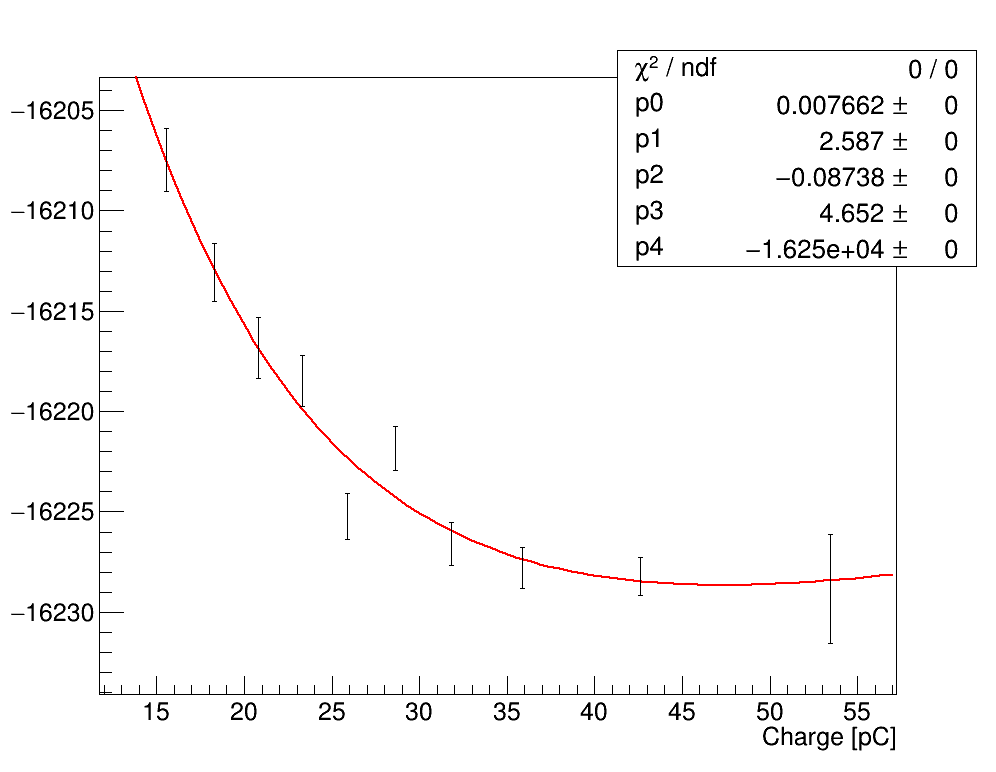

In [115]:
pars5in5c1_qa = sat_fit(xxsc55c1_qa, mdt5in5c1_qa, exsc55c1_qa, emdt5in5c1_qa, iistart=1, iistop=-1, xl=10., xu=60, pars=[-0.1, 1.0, -1, 0.5, 13500.0])
pars5in3c1_qa = sat_fit(xxsc53c1_qa, mdt5in3c1_qa, exsc53c1_qa, emdt5in3c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
pars5in6c1_qa = sat_fit(xxsc56c1_qa, mdt5in6c1_qa, exsc56c1_qa, emdt5in6c1_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars5in4c1_qa = sat_fit(xxsc54c1_qa, mdt5in4c1_qa, exsc54c1_qa, emdt5in4c1_qa, iistart=0, iistop=None, xl=0.5, xu=15, pars=[-0.1,1.0,-1,0.5,40])

pars3in5c1_qa = sat_fit(xxsc35c1_qa, mdt3in5c1_qa, exsc35c1_qa, emdt3in5c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
pars3in3c1_qa = sat_fit(xxsc33c1_qa, mdt3in3c1_qa, exsc33c1_qa, emdt3in3c1_qa, iistart=1, iistop=-1, xl=10., xu=60, pars=[-0.1,2.0,-1,0.5,16200])
pars3in6c1_qa = sat_fit(xxsc36c1_qa, mdt3in6c1_qa, exsc36c1_qa, emdt3in6c1_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,10.0,-1,0.5,40])
pars3in4c1_qa = sat_fit(xxsc34c1_qa, mdt3in4c1_qa, exsc34c1_qa, emdt3in4c1_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])

pars6in5c1_qa = sat_fit(xxsc65c1_qa, mdt6in5c1_qa, exsc65c1_qa, emdt6in5c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
pars6in3c1_qa = sat_fit(xxsc63c1_qa, mdt6in3c1_qa, exsc63c1_qa, emdt6in3c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
pars6in6c1_qa = sat_fit(xxsc66c1_qa, mdt6in6c1_qa, exsc66c1_qa, emdt6in6c1_qa, iistart=1, iistop=None, xl=10., xu=60, pars=[-0.1,1.0,-1,0.5,12500])
pars6in4c1_qa = sat_fit(xxsc64c1_qa, mdt6in4c1_qa, exsc64c1_qa, emdt6in4c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])

pars4in5c1_qa = sat_fit(xxsc45c1_qa, mdt4in5c1_qa, exsc45c1_qa, emdt4in5c1_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,10.0,-1,0.5,40])
pars4in3c1_qa = sat_fit(xxsc43c1_qa, mdt4in3c1_qa, exsc43c1_qa, emdt4in3c1_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars4in6c1_qa = sat_fit(xxsc46c1_qa, mdt4in6c1_qa, exsc46c1_qa, emdt4in6c1_qa, iistart=1, iistop=None, xl=1.5, xu=40, pars=[-0.1,10.0,-1,0.5,40])
pars4in4c1_qa = sat_fit(xxsc44c1_qa, mdt4in4c1_qa, exsc44c1_qa, emdt4in4c1_qa, iistart=1, iistop=None, xl=10., xu=60, pars=[-0.1,1.0,-1,0.5,40])


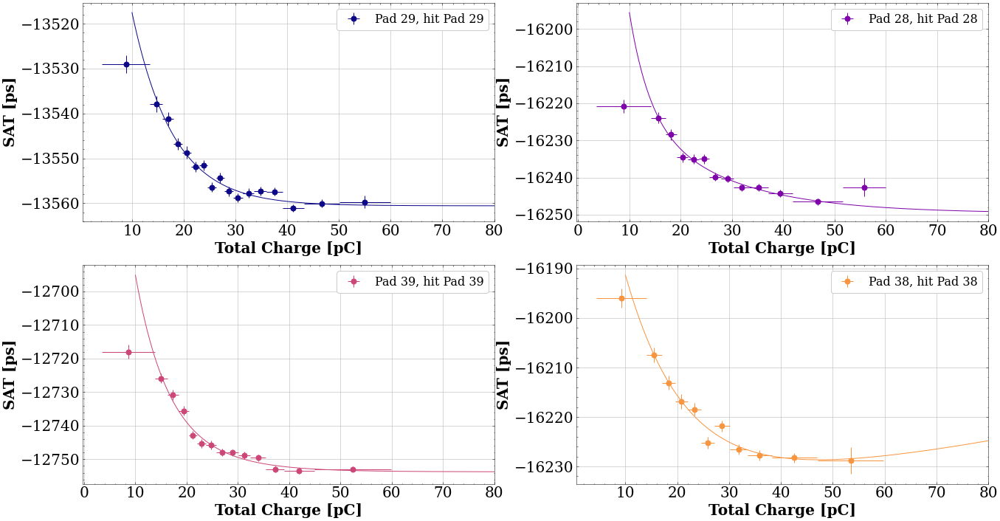

In [116]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(10, 80, 300)


axs[0].errorbar(xxsc55c1_qa[iistart:iistop], mdt5in5c1_qa[iistart:iistop], xerr=exsc55c1_qa[iistart:iistop], yerr=emdt5in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].plot(a, expo2_np(a, pars5in5c1_qa), color=pcolors[0])

axs[1].errorbar(xxsc33c1_qa[iistart:iistop], mdt3in3c1_qa[iistart:iistop], xerr=exsc33c1_qa[iistart:iistop], yerr=emdt3in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].plot(a, expo2_np(a, pars3in3c1_qa), color=pcolors[1])

axs[2].errorbar(xxsc66c1_qa[iistart:iistop], mdt6in6c1_qa[iistart:iistop], xerr=exsc66c1_qa[iistart:iistop], yerr=emdt6in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[2].plot(a, expo2_np(a, pars6in6c1_qa), color=pcolors[2])

axs[3].errorbar(xxsc44c1_qa[iistart:iistop], mdt4in4c1_qa[iistart:iistop], xerr=exsc44c1_qa[iistart:iistop], yerr=emdt4in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs[3].plot(a, expo2_np(a, pars4in4c1_qa), color=pcolors[3])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

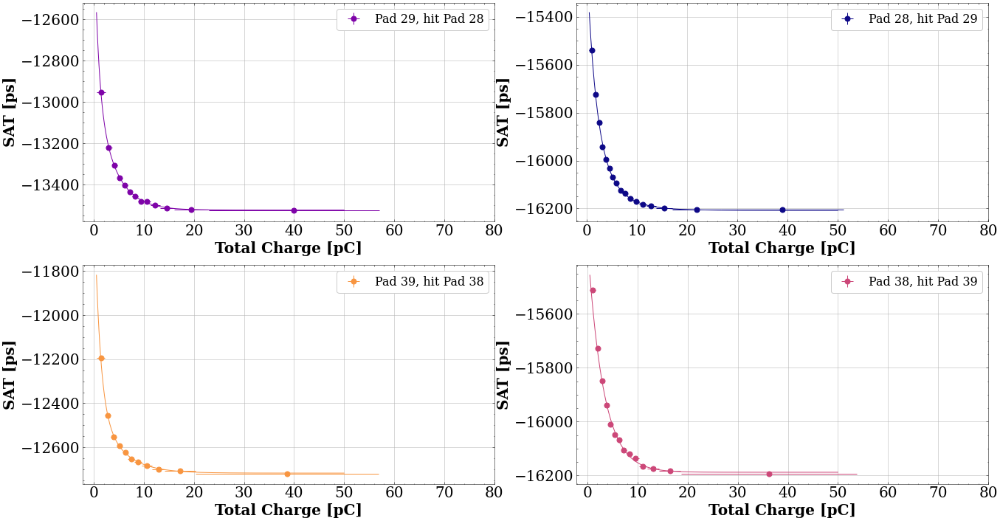

In [117]:
# left-right
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)

axs[0].errorbar(xxsc53c1_qa[iistart:iistop], mdt5in3c1_qa[iistart:iistop], xerr=exsc53c1_qa[iistart:iistop], yerr=emdt5in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].plot(a, expo2_np(a, pars5in3c1_qa), color=pcolors[1])

axs[1].errorbar(xxsc35c1_qa[iistart:iistop], mdt3in5c1_qa[iistart:iistop], xerr=exsc35c1_qa[iistart:iistop], yerr=emdt3in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].plot(a, expo2_np(a, pars3in5c1_qa), color=pcolors[0])

axs[2].errorbar(xxsc64c1_qa[iistart:iistop], mdt6in4c1_qa[iistart:iistop], xerr=exsc64c1_qa[iistart:iistop], yerr=emdt6in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, pars6in4c1_qa), color=pcolors[3])

axs[3].errorbar(xxsc46c1_qa[iistart:iistop], mdt4in6c1_qa[iistart:iistop], xerr=exsc46c1_qa[iistart:iistop], yerr=emdt4in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')
axs[3].plot(a, expo2_np(a, pars4in6c1_qa), color=pcolors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


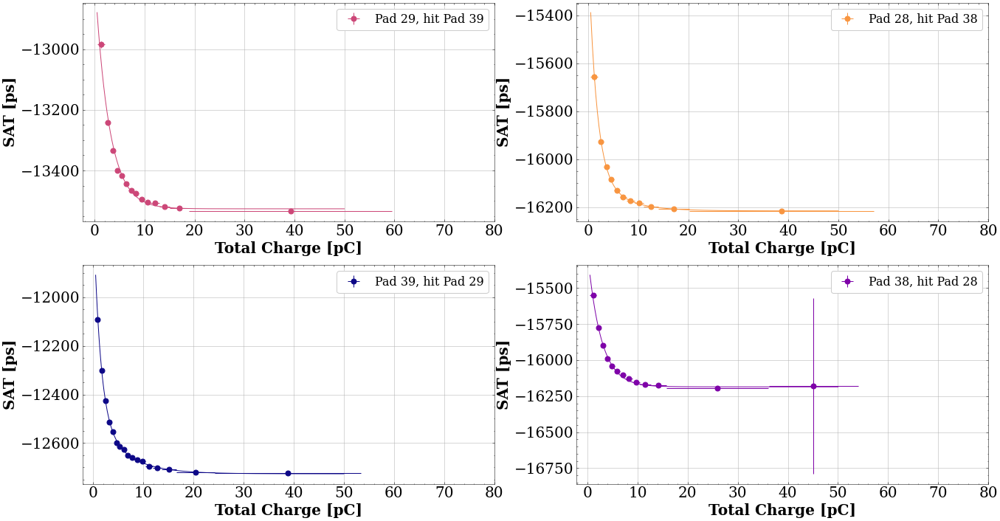

In [118]:
# up-down
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)
axs[0].errorbar(xxsc56c1_qa[iistart:iistop], mdt5in6c1_qa[iistart:iistop], xerr=exsc56c1_qa[iistart:iistop], yerr=emdt5in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[0].plot(a, expo2_np(a, pars5in6c1_qa), color=pcolors[2])

axs[1].errorbar(xxsc34c1_qa[iistart:iistop], mdt3in4c1_qa[iistart:iistop], xerr=exsc34c1_qa[iistart:iistop], yerr=emdt3in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[1].plot(a, expo2_np(a, pars3in4c1_qa), color=pcolors[3])

axs[2].errorbar(xxsc65c1_qa[iistart:iistop], mdt6in5c1_qa[iistart:iistop], xerr=exsc65c1_qa[iistart:iistop], yerr=emdt6in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].plot(a, expo2_np(a, pars6in5c1_qa), color=pcolors[0])

axs[3].errorbar(xxsc43c1_qa[iistart:iistop], mdt4in3c1_qa[iistart:iistop], xerr=exsc43c1_qa[iistart:iistop], yerr=emdt4in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, pars4in3c1_qa), color=pcolors[1])


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


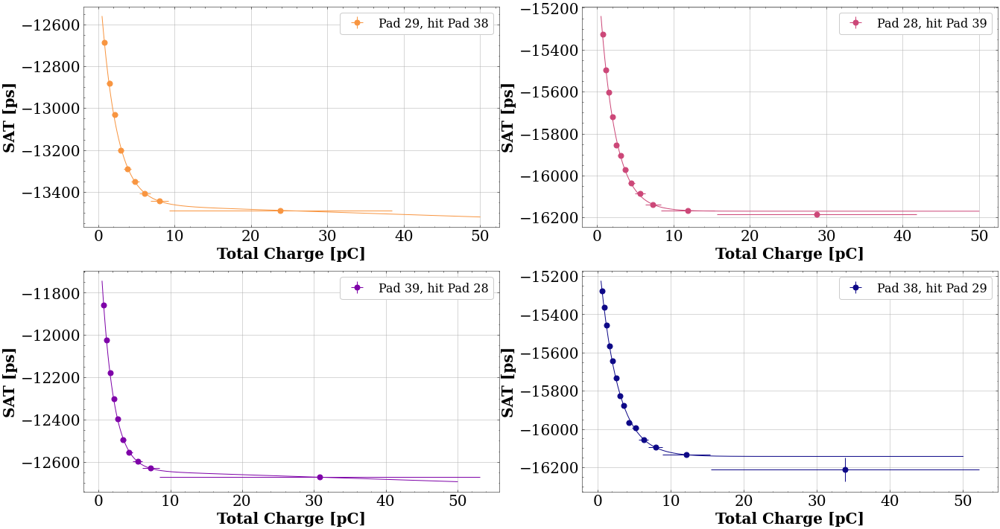

In [119]:
# diagonal
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)

axs[0].errorbar(xxsc54c1_qa[iistart:iistop], mdt5in4c1_qa[iistart:iistop], xerr=exsc54c1_qa[iistart:iistop], yerr=emdt5in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs[0].plot(a, expo2_np(a, pars5in4c1_qa), color=pcolors[3])

axs[1].errorbar(xxsc36c1_qa[iistart:iistop], mdt3in6c1_qa[iistart:iistop], xerr=exsc36c1_qa[iistart:iistop], yerr=emdt3in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[1].plot(a, expo2_np(a, pars3in6c1_qa), color=pcolors[2])

axs[2].errorbar(xxsc63c1_qa[iistart:iistop], mdt6in3c1_qa[iistart:iistop], xerr=exsc63c1_qa[iistart:iistop], yerr=emdt6in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].plot(a, expo2_np(a, pars6in3c1_qa), color=pcolors[1])

axs[3].errorbar(xxsc45c1_qa[iistart:iistop], mdt4in5c1_qa[iistart:iistop], xerr=exsc45c1_qa[iistart:iistop], yerr=emdt4in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].plot(a, expo2_np(a, pars4in5c1_qa), color=pcolors[0])

for i in range(4):
    axs[i].grid()
#     axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


In [120]:
qlow = 0.5
qup = 60

nppe = 500


_,_, mdt3in3c1_qa_cor, sdt3in3c1_qa_cor, emdt3in3c1_qa_cor, esdt3in3c1_qa_cor = fff(mm3_qall[xyc1_pad3_qa], dt3[xyc1_pad3_qa]-expo2_np(mm3_qall[xyc1_pad3_qa], pars3in3c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in3c1_qa_cor, sdt4in3c1_qa_cor, emdt4in3c1_qa_cor, esdt4in3c1_qa_cor = fff(mm4_qall[xyc1_pad3_qa], dt4[xyc1_pad3_qa]-expo2_np(mm4_qall[xyc1_pad3_qa], pars4in3c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in3c1_qa_cor, sdt5in3c1_qa_cor, emdt5in3c1_qa_cor, esdt5in3c1_qa_cor = fff(mm5_qall[xyc1_pad3_qa], dt5[xyc1_pad3_qa]-expo2_np(mm5_qall[xyc1_pad3_qa], pars5in3c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in3c1_qa_cor, sdt6in3c1_qa_cor, emdt6in3c1_qa_cor, esdt6in3c1_qa_cor = fff(mm6_qall[xyc1_pad3_qa], dt6[xyc1_pad3_qa]-expo2_np(mm6_qall[xyc1_pad3_qa], pars6in3c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt3in4c1_qa_cor, sdt3in4c1_qa_cor, emdt3in4c1_qa_cor, esdt3in4c1_qa_cor = fff(mm3_qall[xyc1_pad4_qa], dt3[xyc1_pad4_qa]-expo2_np(mm3_qall[xyc1_pad4_qa], pars3in4c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in4c1_qa_cor, sdt4in4c1_qa_cor, emdt4in4c1_qa_cor, esdt4in4c1_qa_cor = fff(mm4_qall[xyc1_pad4_qa], dt4[xyc1_pad4_qa]-expo2_np(mm4_qall[xyc1_pad4_qa], pars4in4c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in4c1_qa_cor, sdt5in4c1_qa_cor, emdt5in4c1_qa_cor, esdt5in4c1_qa_cor = fff(mm5_qall[xyc1_pad4_qa], dt5[xyc1_pad4_qa]-expo2_np(mm5_qall[xyc1_pad4_qa], pars5in4c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in4c1_qa_cor, sdt6in4c1_qa_cor, emdt6in4c1_qa_cor, esdt6in4c1_qa_cor = fff(mm6_qall[xyc1_pad4_qa], dt6[xyc1_pad4_qa]-expo2_np(mm6_qall[xyc1_pad4_qa], pars6in4c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt3in5c1_qa_cor, sdt3in5c1_qa_cor, emdt3in5c1_qa_cor, esdt3in5c1_qa_cor = fff(mm3_qall[xyc1_pad5_qa], dt3[xyc1_pad5_qa]-expo2_np(mm3_qall[xyc1_pad5_qa], pars3in5c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in5c1_qa_cor, sdt4in5c1_qa_cor, emdt4in5c1_qa_cor, esdt4in5c1_qa_cor = fff(mm4_qall[xyc1_pad5_qa], dt4[xyc1_pad5_qa]-expo2_np(mm4_qall[xyc1_pad5_qa], pars4in5c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in5c1_qa_cor, sdt5in5c1_qa_cor, emdt5in5c1_qa_cor, esdt5in5c1_qa_cor = fff(mm5_qall[xyc1_pad5_qa], dt5[xyc1_pad5_qa]-expo2_np(mm5_qall[xyc1_pad5_qa], pars5in5c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in5c1_qa_cor, sdt6in5c1_qa_cor, emdt6in5c1_qa_cor, esdt6in5c1_qa_cor = fff(mm6_qall[xyc1_pad5_qa], dt6[xyc1_pad5_qa]-expo2_np(mm6_qall[xyc1_pad5_qa], pars6in5c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt3in6c1_qa_cor, sdt3in6c1_qa_cor, emdt3in6c1_qa_cor, esdt3in6c1_qa_cor = fff(mm3_qall[xyc1_pad6_qa], dt3[xyc1_pad6_qa]-expo2_np(mm3_qall[xyc1_pad6_qa], pars3in6c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in6c1_qa_cor, sdt4in6c1_qa_cor, emdt4in6c1_qa_cor, esdt4in6c1_qa_cor = fff(mm4_qall[xyc1_pad6_qa], dt4[xyc1_pad6_qa]-expo2_np(mm4_qall[xyc1_pad6_qa], pars4in6c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt5in6c1_qa_cor, sdt5in6c1_qa_cor, emdt5in6c1_qa_cor, esdt5in6c1_qa_cor = fff(mm5_qall[xyc1_pad6_qa], dt5[xyc1_pad6_qa]-expo2_np(mm5_qall[xyc1_pad6_qa], pars5in6c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt6in6c1_qa_cor, sdt6in6c1_qa_cor, emdt6in6c1_qa_cor, esdt6in6c1_qa_cor = fff(mm6_qall[xyc1_pad6_qa], dt6[xyc1_pad6_qa]-expo2_np(mm6_qall[xyc1_pad6_qa], pars6in6c1_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])


np.min(idt)=-185.3318183211634, np.max(idt)=100.22546386398545, r1=-175.99854324074616, mm=-12.696042301966278, r2=150.60645863681358
15.302332423199358, -14.049657007090296, 38.023707962086036, 
##################################################
np.min(idt)=-90.41309449532875, np.max(idt)=155.6776275951144, r1=-127.20237025322493, mm=0.7140740419641102, r2=128.63051833715315
16.120145721389388, -1.147337569874521, 28.118094815078805, 
##################################################
np.min(idt)=-67.52111253285875, np.max(idt)=87.53591093701019, r1=-108.24946390644807, mm=2.2940370815599187, r2=112.83753806956791
14.600219636554897, 1.184688931733312, 27.928069023278066, 
##################################################
np.min(idt)=-103.09379632569815, np.max(idt)=106.0431204068486, r1=-110.3309703983033, mm=1.518532877299549, r2=113.36803615290239
14.9730978778772, 0.7324991279214168, 26.61269636641335, 
##################################################
np.min(idt)=-128.877098875

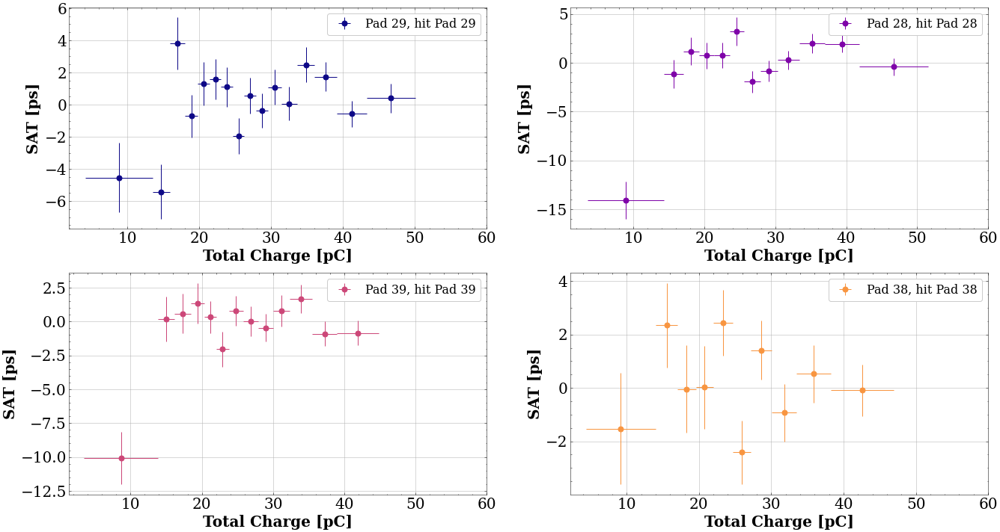

In [121]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()

axs[0].errorbar(xxsc55c1_qa[iistart:iistop], mdt5in5c1_qa_cor[iistart:iistop], xerr=exsc55c1_qa[iistart:iistop], yerr=emdt5in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[1].errorbar(xxsc33c1_qa[iistart:iistop], mdt3in3c1_qa_cor[iistart:iistop], xerr=exsc33c1_qa[iistart:iistop], yerr=emdt3in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[2].errorbar(xxsc66c1_qa[iistart:iistop], mdt6in6c1_qa_cor[iistart:iistop], xerr=exsc66c1_qa[iistart:iistop], yerr=emdt6in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[3].errorbar(xxsc44c1_qa[iistart:iistop], mdt4in4c1_qa_cor[iistart:iistop], xerr=exsc44c1_qa[iistart:iistop], yerr=emdt4in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 60)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


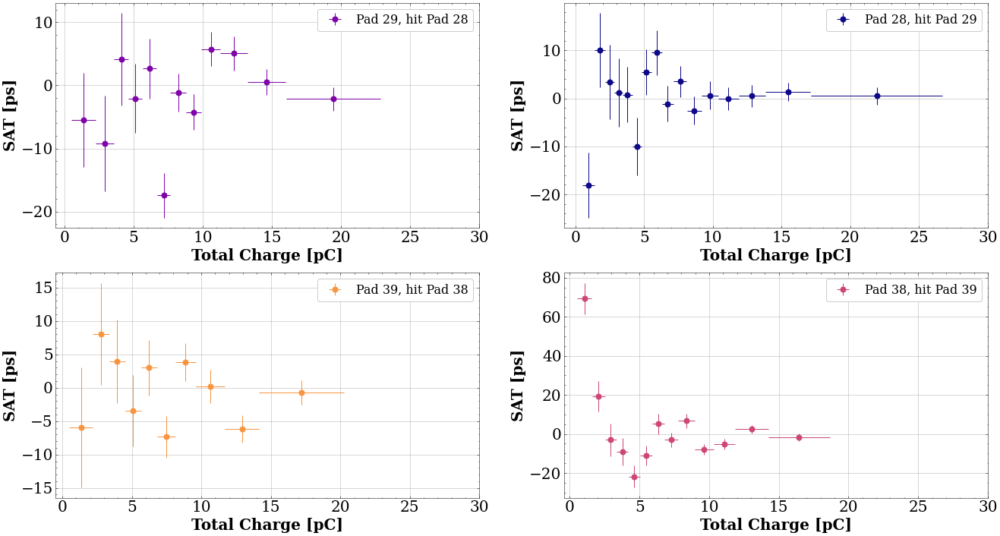

In [122]:
# left-right
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()


axs[0].errorbar(xxsc53c1_qa[iistart:iistop], mdt5in3c1_qa_cor[iistart:iistop], xerr=exsc53c1_qa[iistart:iistop], yerr=emdt5in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[1].errorbar(xxsc35c1_qa[iistart:iistop], mdt3in5c1_qa_cor[iistart:iistop], xerr=exsc35c1_qa[iistart:iistop], yerr=emdt3in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[2].errorbar(xxsc64c1_qa[iistart:iistop], mdt6in4c1_qa_cor[iistart:iistop], xerr=exsc64c1_qa[iistart:iistop], yerr=emdt6in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs[3].errorbar(xxsc46c1_qa[iistart:iistop], mdt4in6c1_qa_cor[iistart:iistop], xerr=exsc46c1_qa[iistart:iistop], yerr=emdt4in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 30)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


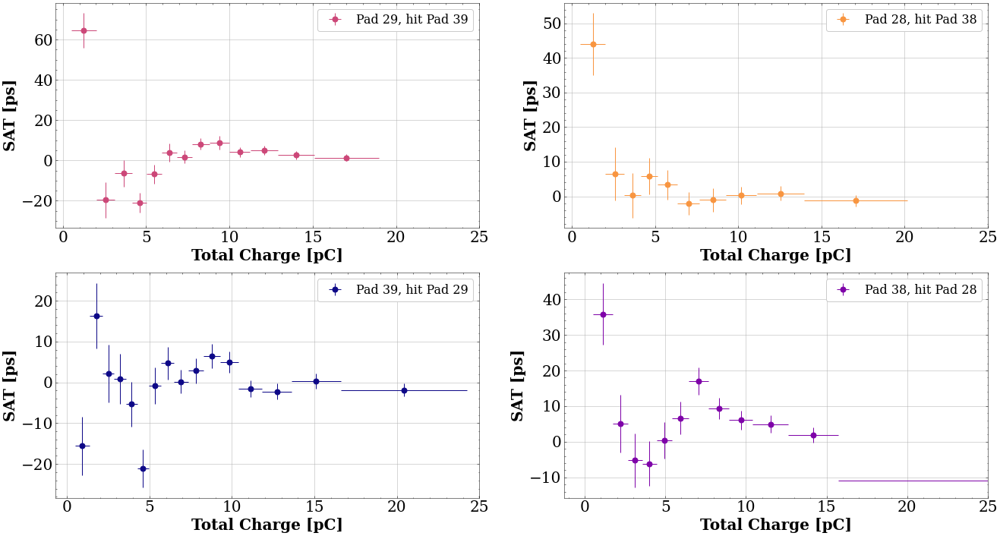

In [123]:
# up-down
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()

axs[0].errorbar(xxsc56c1_qa[iistart:iistop], mdt5in6c1_qa_cor[iistart:iistop], xerr=exsc56c1_qa[iistart:iistop], yerr=emdt5in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[1].errorbar(xxsc34c1_qa[iistart:iistop], mdt3in4c1_qa_cor[iistart:iistop], xerr=exsc34c1_qa[iistart:iistop], yerr=emdt3in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[2].errorbar(xxsc65c1_qa[iistart:iistop], mdt6in5c1_qa_cor[iistart:iistop], xerr=exsc65c1_qa[iistart:iistop], yerr=emdt6in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[3].errorbar(xxsc43c1_qa[iistart:iistop], mdt4in3c1_qa_cor[iistart:iistop], xerr=exsc43c1_qa[iistart:iistop], yerr=emdt4in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 25)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


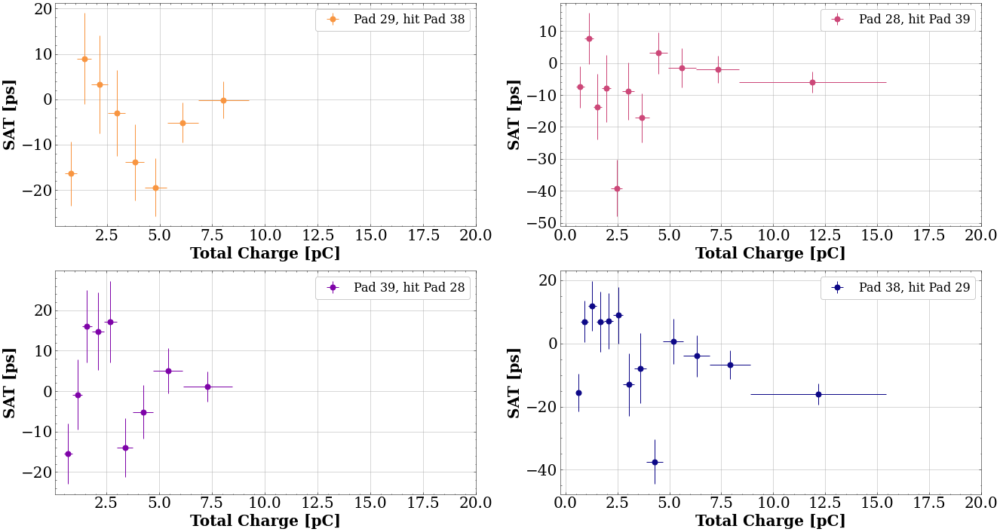

In [124]:
# diagonal
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, -1
axs = axs.ravel()


axs[0].errorbar(xxsc54c1_qa[iistart:iistop], mdt5in4c1_qa_cor[iistart:iistop], xerr=exsc54c1_qa[iistart:iistop], yerr=emdt5in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs[1].errorbar(xxsc36c1_qa[iistart:iistop], mdt3in6c1_qa_cor[iistart:iistop], xerr=exsc36c1_qa[iistart:iistop], yerr=emdt3in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[2].errorbar(xxsc63c1_qa[iistart:iistop], mdt6in3c1_qa_cor[iistart:iistop], xerr=exsc63c1_qa[iistart:iistop], yerr=emdt6in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[3].errorbar(xxsc45c1_qa[iistart:iistop], mdt4in5c1_qa_cor[iistart:iistop], xerr=exsc45c1_qa[iistart:iistop], yerr=emdt4in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 20)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


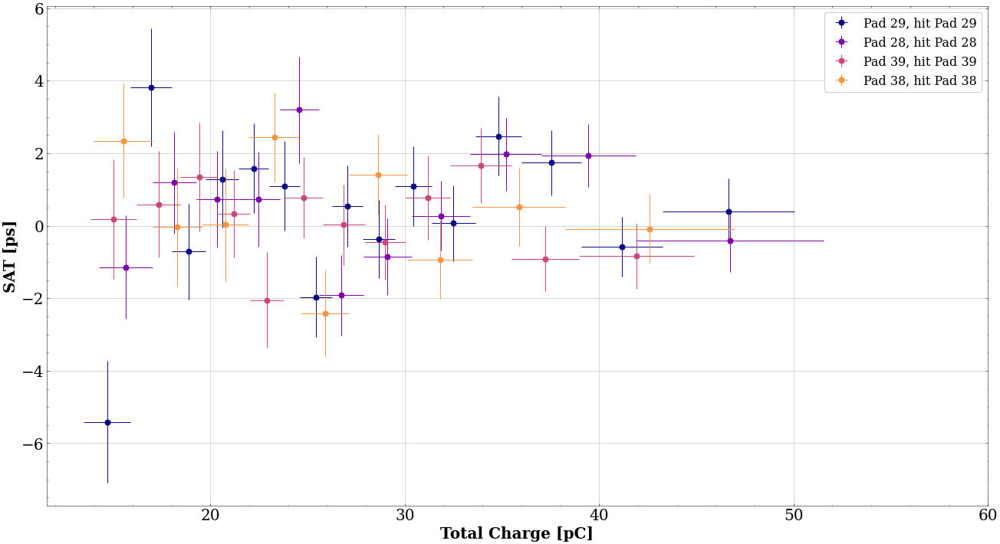

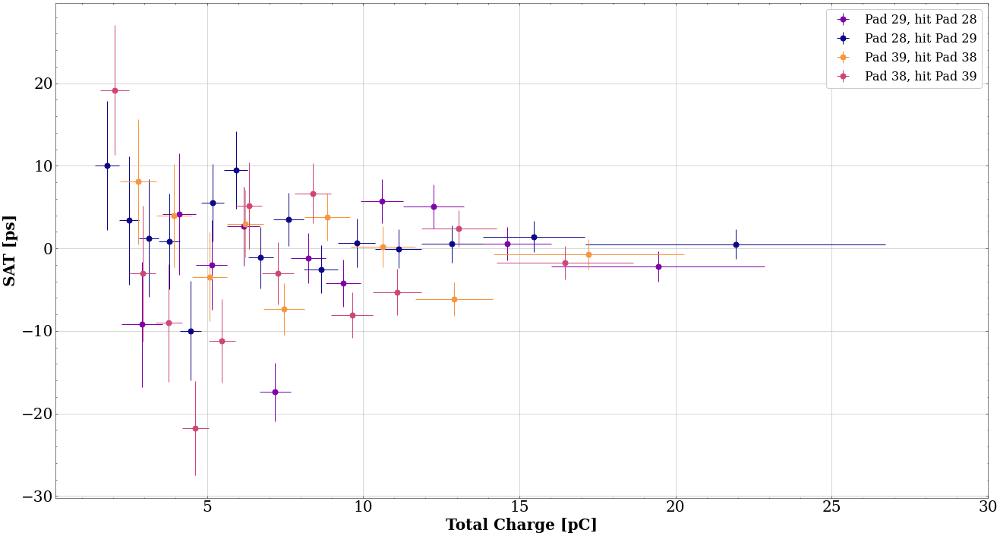

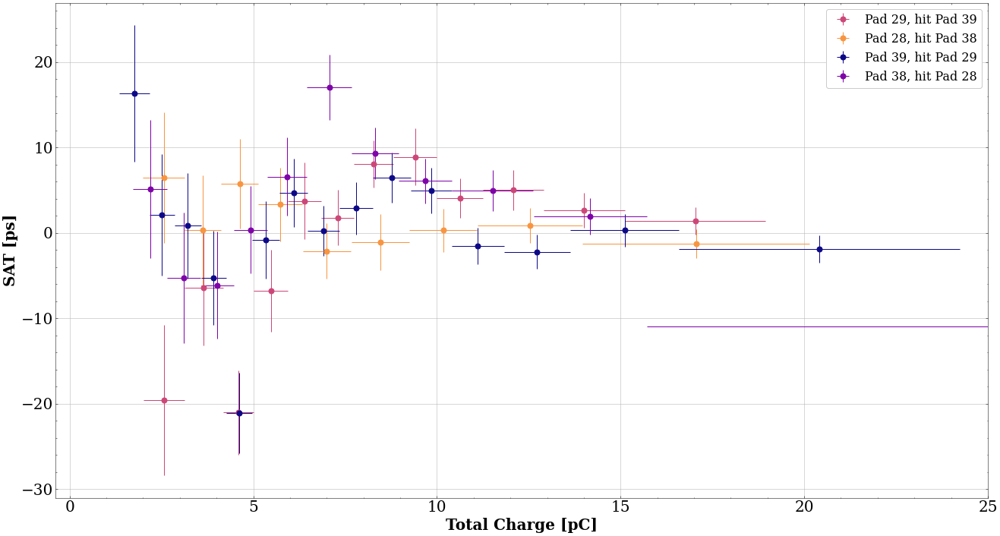

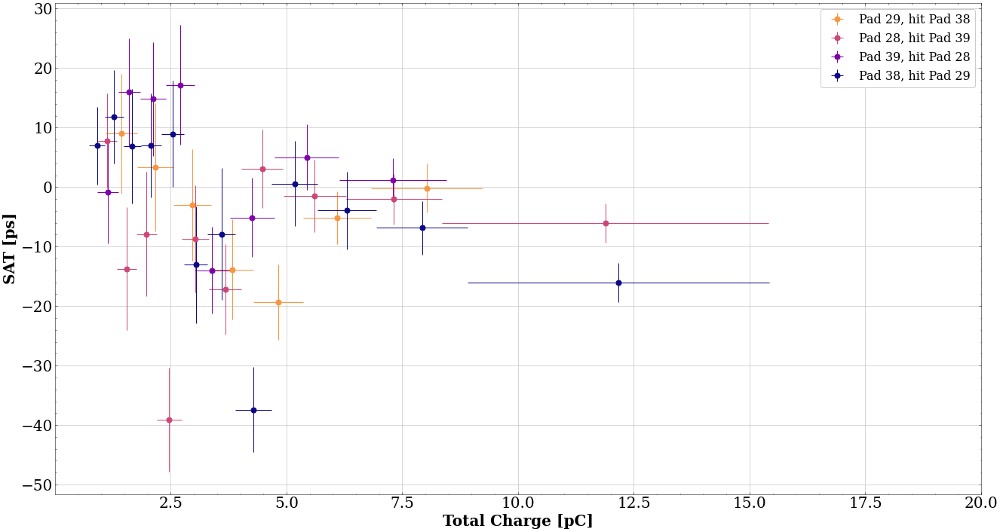

In [125]:

#same
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

axs.errorbar(xxsc55c1_qa[iistart:iistop], mdt5in5c1_qa_cor[iistart:iistop], xerr=exsc55c1_qa[iistart:iistop], yerr=emdt5in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs.errorbar(xxsc33c1_qa[iistart:iistop], mdt3in3c1_qa_cor[iistart:iistop], xerr=exsc33c1_qa[iistart:iistop], yerr=emdt3in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs.errorbar(xxsc66c1_qa[iistart:iistop], mdt6in6c1_qa_cor[iistart:iistop], xerr=exsc66c1_qa[iistart:iistop], yerr=emdt6in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs.errorbar(xxsc44c1_qa[iistart:iistop], mdt4in4c1_qa_cor[iistart:iistop], xerr=exsc44c1_qa[iistart:iistop], yerr=emdt4in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')

axs.grid()
axs.set_xlim(None, 60)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


# left-right
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc53c1_qa[iistart:iistop], mdt5in3c1_qa_cor[iistart:iistop], xerr=exsc53c1_qa[iistart:iistop], yerr=emdt5in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs.errorbar(xxsc35c1_qa[iistart:iistop], mdt3in5c1_qa_cor[iistart:iistop], xerr=exsc35c1_qa[iistart:iistop], yerr=emdt3in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs.errorbar(xxsc64c1_qa[iistart:iistop], mdt6in4c1_qa_cor[iistart:iistop], xerr=exsc64c1_qa[iistart:iistop], yerr=emdt6in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs.errorbar(xxsc46c1_qa[iistart:iistop], mdt4in6c1_qa_cor[iistart:iistop], xerr=exsc46c1_qa[iistart:iistop], yerr=emdt4in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')

axs.grid()
axs.set_xlim(None, 30)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


# up-down
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

axs.errorbar(xxsc56c1_qa[iistart:iistop], mdt5in6c1_qa_cor[iistart:iistop], xerr=exsc56c1_qa[iistart:iistop], yerr=emdt5in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs.errorbar(xxsc34c1_qa[iistart:iistop], mdt3in4c1_qa_cor[iistart:iistop], xerr=exsc34c1_qa[iistart:iistop], yerr=emdt3in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs.errorbar(xxsc65c1_qa[iistart:iistop], mdt6in5c1_qa_cor[iistart:iistop], xerr=exsc65c1_qa[iistart:iistop], yerr=emdt6in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs.errorbar(xxsc43c1_qa[iistart:iistop], mdt4in3c1_qa_cor[iistart:iistop], xerr=exsc43c1_qa[iistart:iistop], yerr=emdt4in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')


axs.grid()
axs.set_xlim(None, 25)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


# diagonal
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc54c1_qa[iistart:iistop], mdt5in4c1_qa_cor[iistart:iistop], xerr=exsc54c1_qa[iistart:iistop], yerr=emdt5in4c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs.errorbar(xxsc36c1_qa[iistart:iistop], mdt3in6c1_qa_cor[iistart:iistop], xerr=exsc36c1_qa[iistart:iistop], yerr=emdt3in6c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs.errorbar(xxsc63c1_qa[iistart:iistop], mdt6in3c1_qa_cor[iistart:iistop], xerr=exsc63c1_qa[iistart:iistop], yerr=emdt6in3c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs.errorbar(xxsc45c1_qa[iistart:iistop], mdt4in5c1_qa_cor[iistart:iistop], xerr=exsc45c1_qa[iistart:iistop], yerr=emdt4in5c1_qa_cor[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')

axs.grid()
axs.set_xlim(None, 20)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


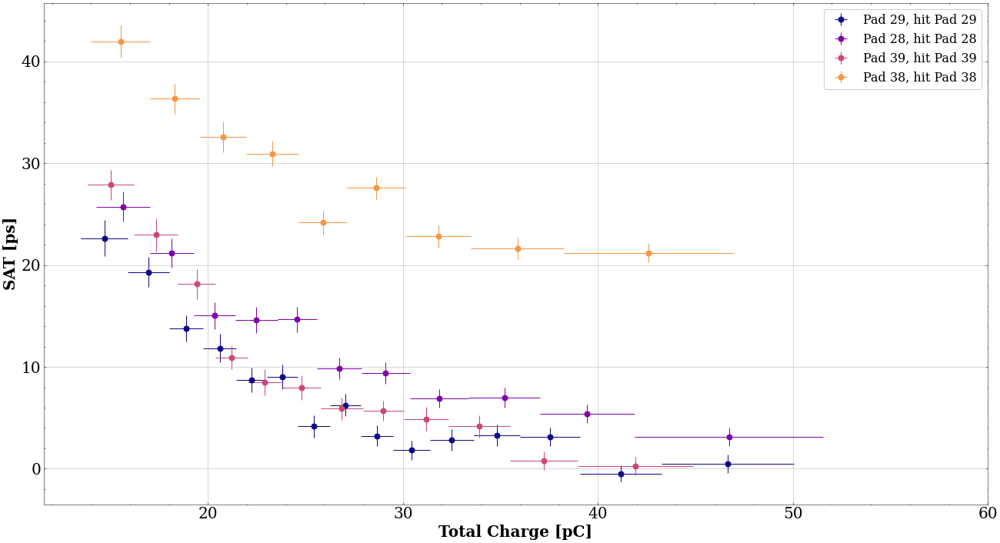

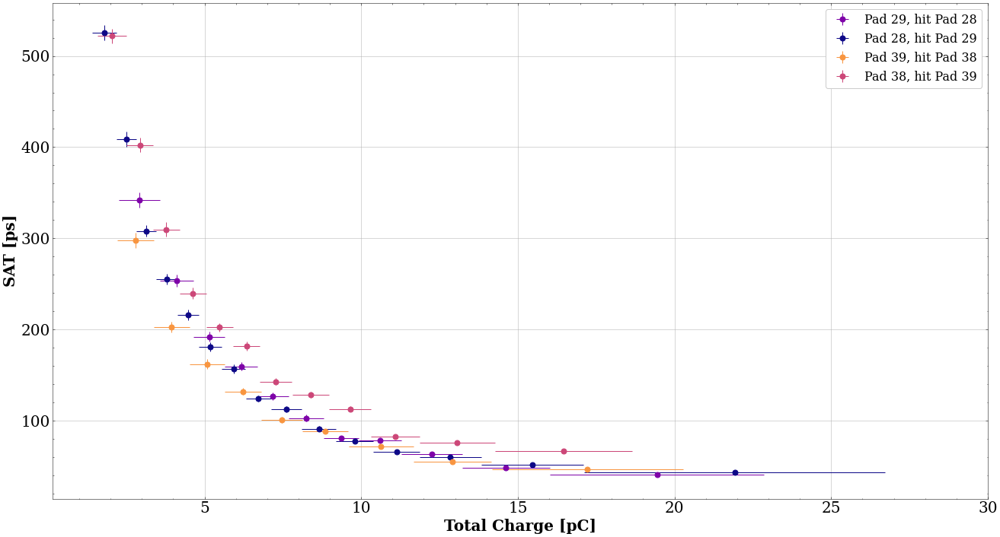

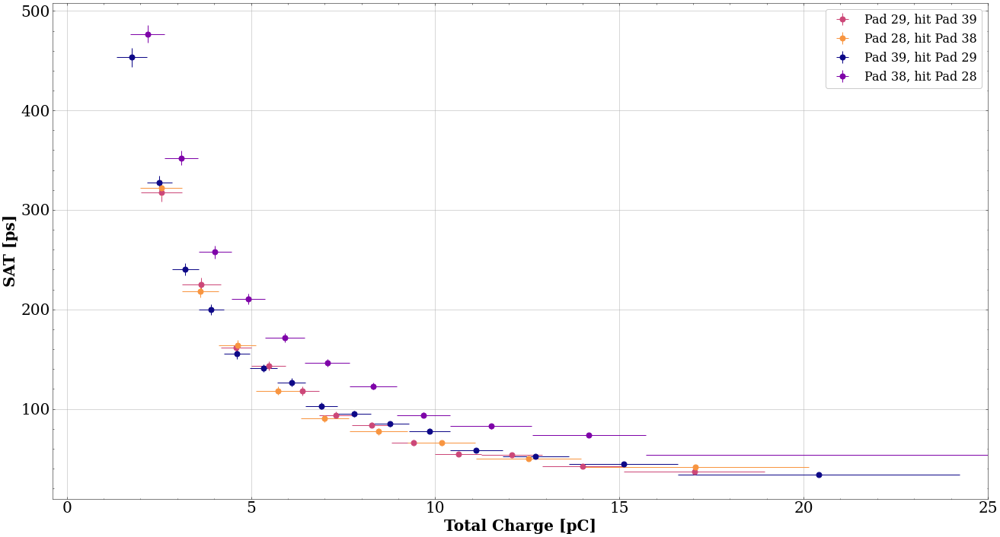

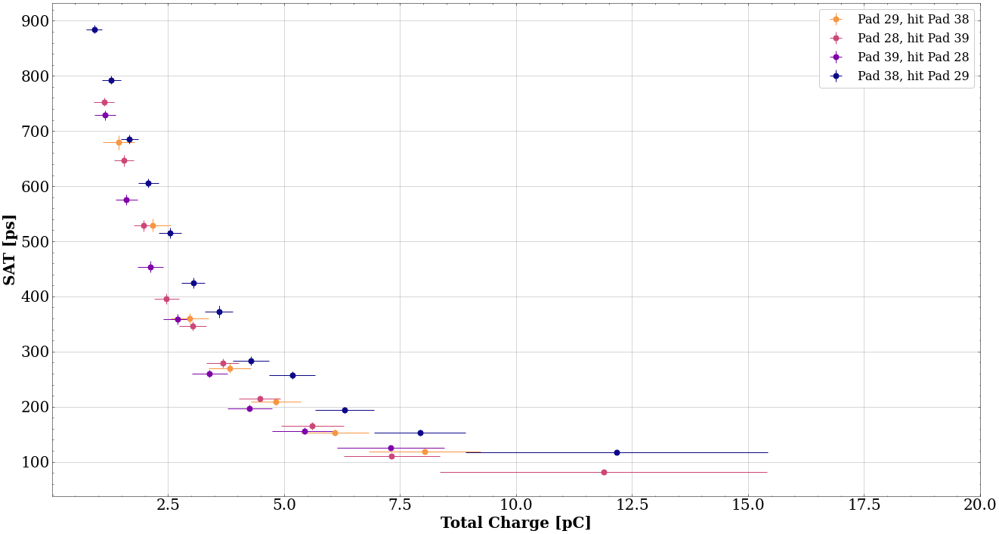

In [126]:

#same
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

axs.errorbar(xxsc55c1_qa[iistart:iistop], mdt5in5c1_qa[iistart:iistop]-pars5in5c1_qa[4], xerr=exsc55c1_qa[iistart:iistop], yerr=emdt5in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs.errorbar(xxsc33c1_qa[iistart:iistop], mdt3in3c1_qa[iistart:iistop]-pars3in3c1_qa[4], xerr=exsc33c1_qa[iistart:iistop], yerr=emdt3in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs.errorbar(xxsc66c1_qa[iistart:iistop], mdt6in6c1_qa[iistart:iistop]-pars6in6c1_qa[4], xerr=exsc66c1_qa[iistart:iistop], yerr=emdt6in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs.errorbar(xxsc44c1_qa[iistart:iistop], mdt4in4c1_qa[iistart:iistop]-pars4in4c1_qa[4], xerr=exsc44c1_qa[iistart:iistop], yerr=emdt4in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')

axs.grid()
axs.set_xlim(None, 60)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


# left-right
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

axs.errorbar(xxsc53c1_qa[iistart:iistop], mdt5in3c1_qa[iistart:iistop]-pars5in5c1_qa[4], xerr=exsc53c1_qa[iistart:iistop], yerr=emdt5in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs.errorbar(xxsc35c1_qa[iistart:iistop], mdt3in5c1_qa[iistart:iistop]-pars3in3c1_qa[4], xerr=exsc35c1_qa[iistart:iistop], yerr=emdt3in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs.errorbar(xxsc64c1_qa[iistart:iistop], mdt6in4c1_qa[iistart:iistop]-pars6in6c1_qa[4], xerr=exsc64c1_qa[iistart:iistop], yerr=emdt6in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs.errorbar(xxsc46c1_qa[iistart:iistop], mdt4in6c1_qa[iistart:iistop]-pars4in4c1_qa[4], xerr=exsc46c1_qa[iistart:iistop], yerr=emdt4in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')

axs.grid()
axs.set_xlim(None, 30)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


# up-down
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

axs.errorbar(xxsc56c1_qa[iistart:iistop], mdt5in6c1_qa[iistart:iistop]-pars5in5c1_qa[4], xerr=exsc56c1_qa[iistart:iistop], yerr=emdt5in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs.errorbar(xxsc34c1_qa[iistart:iistop], mdt3in4c1_qa[iistart:iistop]-pars3in3c1_qa[4], xerr=exsc34c1_qa[iistart:iistop], yerr=emdt3in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs.errorbar(xxsc65c1_qa[iistart:iistop], mdt6in5c1_qa[iistart:iistop]-pars6in6c1_qa[4], xerr=exsc65c1_qa[iistart:iistop], yerr=emdt6in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs.errorbar(xxsc43c1_qa[iistart:iistop], mdt4in3c1_qa[iistart:iistop]-pars4in4c1_qa[4], xerr=exsc43c1_qa[iistart:iistop], yerr=emdt4in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')


axs.grid()
axs.set_xlim(None, 25)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


# diagonal
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc54c1_qa[iistart:iistop], mdt5in4c1_qa[iistart:iistop]-pars5in5c1_qa[4], xerr=exsc54c1_qa[iistart:iistop], yerr=emdt5in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs.errorbar(xxsc36c1_qa[iistart:iistop], mdt3in6c1_qa[iistart:iistop]-pars3in3c1_qa[4], xerr=exsc36c1_qa[iistart:iistop], yerr=emdt3in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs.errorbar(xxsc63c1_qa[iistart:iistop], mdt6in3c1_qa[iistart:iistop]-pars6in6c1_qa[4], xerr=exsc63c1_qa[iistart:iistop], yerr=emdt6in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs.errorbar(xxsc45c1_qa[iistart:iistop], mdt4in5c1_qa[iistart:iistop]-pars4in4c1_qa[4], xerr=exsc45c1_qa[iistart:iistop], yerr=emdt4in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')

axs.grid()
axs.set_xlim(None, 20)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
# axs.set_xlim(0, 5)
plt.show()


Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 19.4295474490101796
Edm   = 9.34472697396477771e-07
Nfcn  = 533
Par_0	  = -0.0794492	 +/-  0.116692
Par_1	  = 1.48114	 +/-  4.13481
Par_2	  = -0.0795923	 +/-  0.0127333
Par_3	  = 3.86475	 +/-  0.378591
Par_4	  = 15.7406	 +/-  0.822068
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 21.2571896185052402
Edm   = 5.23180438287751814e-07
Nfcn  = 619
Par_0	  = -0.207283	 +/-  4.81895
Par_1	  = -2.87825	 +/-  1107.74
Par_2	  = -0.207179	 +/-  0.0109694
Par_3	  = 5.36825	 +/-  0.245206
Par_4	  = 29.9996	 +/-  1.36587
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 33.031007506911223
Edm   = 7.14953405477125397e-07
Nfcn  = 411
Par_0	  = -0.273664	 +/-  0.0893335
Par_1	  = 4

Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 10.1367 > 0
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 2 ] = -0.00144617
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 3 ] = -0.0980969
Warning in <Minuit2>: MnPosDef Added to diagonal of Error matrix a value 0.598098
Warning in <Minuit2>: VariableMetricBuilder gdel = -41672.5
Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def., try to make pos.def.
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 2 ] = -0.000284701
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matri

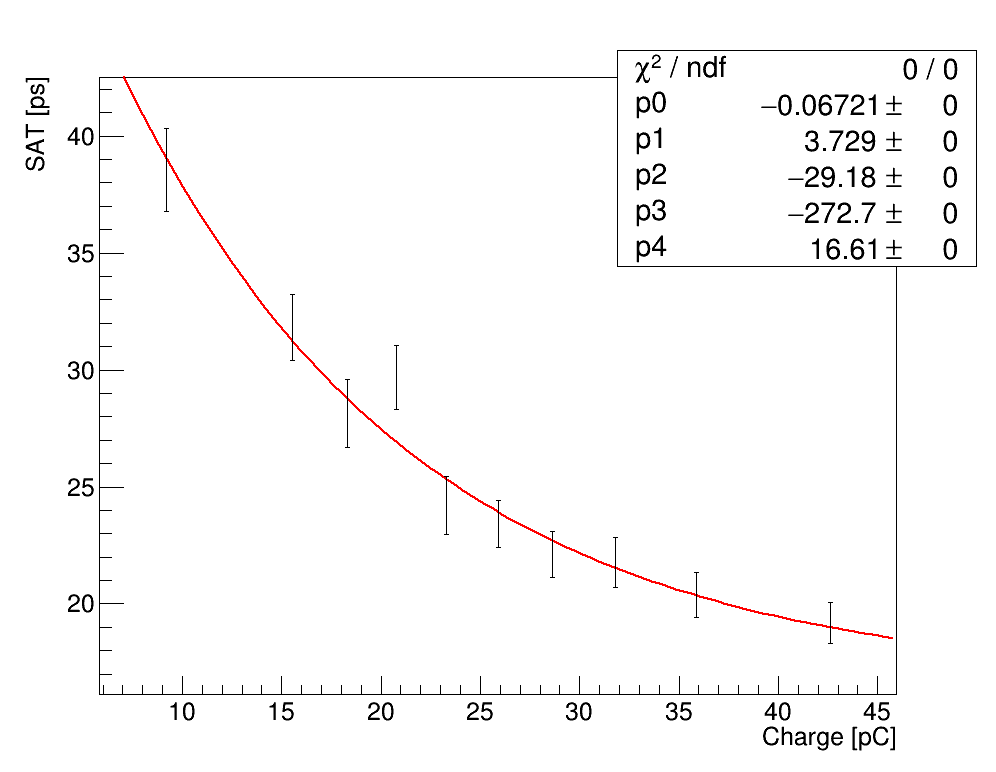

In [127]:
spars5in5c1_qa = sat_fit(xxsc55c1_qa, sdt5in5c1_qa, exsc55c1_qa, esdt5in5c1_qa, iistart=0, iistop=-1, xl=5., xu=60, pars=[-0.1,2.0,-1, 1.5, 40.0])
spars5in3c1_qa = sat_fit(xxsc53c1_qa, sdt5in3c1_qa, exsc53c1_qa, esdt5in3c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
spars5in6c1_qa = sat_fit(xxsc56c1_qa, sdt5in6c1_qa, exsc56c1_qa, esdt5in6c1_qa, iistart=0, iistop=-1, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
spars5in4c1_qa = sat_fit(xxsc54c1_qa, sdt5in4c1_qa, exsc54c1_qa, esdt5in4c1_qa, iistart=2, iistop=-1, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])

spars3in5c1_qa = sat_fit(xxsc35c1_qa, sdt3in5c1_qa, exsc35c1_qa, esdt3in5c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
spars3in3c1_qa = sat_fit(xxsc33c1_qa, sdt3in3c1_qa, exsc33c1_qa, esdt3in3c1_qa, iistart=0, iistop=None, xl=5., xu=60, pars=[-0.1,2.0,-1,0.5,40])
spars3in6c1_qa = sat_fit(xxsc36c1_qa, sdt3in6c1_qa, exsc36c1_qa, esdt3in6c1_qa, iistart=2, iistop=-1, xl=0.5, xu=40, pars=[-0.1,5.0,-1,0.5,40])
spars3in4c1_qa = sat_fit(xxsc34c1_qa, sdt3in4c1_qa, exsc34c1_qa, esdt3in4c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])

spars6in5c1_qa = sat_fit(xxsc65c1_qa, sdt6in5c1_qa, exsc65c1_qa, esdt6in5c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
spars6in3c1_qa = sat_fit(xxsc63c1_qa, sdt6in3c1_qa, exsc63c1_qa, esdt6in3c1_qa, iistart=2, iistop=-1, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
spars6in6c1_qa = sat_fit(xxsc66c1_qa, sdt6in6c1_qa, exsc66c1_qa, esdt6in6c1_qa, iistart=0, iistop=None, xl=5., xu=60, pars=[-0.1,1.0,-1,0.5,40])
spars6in4c1_qa = sat_fit(xxsc64c1_qa, sdt6in4c1_qa, exsc64c1_qa, esdt6in4c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])

spars4in5c1_qa = sat_fit(xxsc45c1_qa, sdt4in5c1_qa, exsc45c1_qa, esdt4in5c1_qa, iistart=4, iistop=-1, xl=0.5, xu=40, pars=[-0.1,5.0,-1,0.5,40])
spars4in3c1_qa = sat_fit(xxsc43c1_qa, sdt4in3c1_qa, exsc43c1_qa, esdt4in3c1_qa, iistart=0, iistop=-1, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
spars4in6c1_qa = sat_fit(xxsc46c1_qa, sdt4in6c1_qa, exsc46c1_qa, esdt4in6c1_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,3.0,-1,0.5,40])
spars4in4c1_qa = sat_fit(xxsc44c1_qa, sdt4in4c1_qa, exsc44c1_qa, esdt4in4c1_qa, iistart=0, iistop=-1, xl=5., xu=60, pars=[-0.1,1.0,-1,0.5,40])


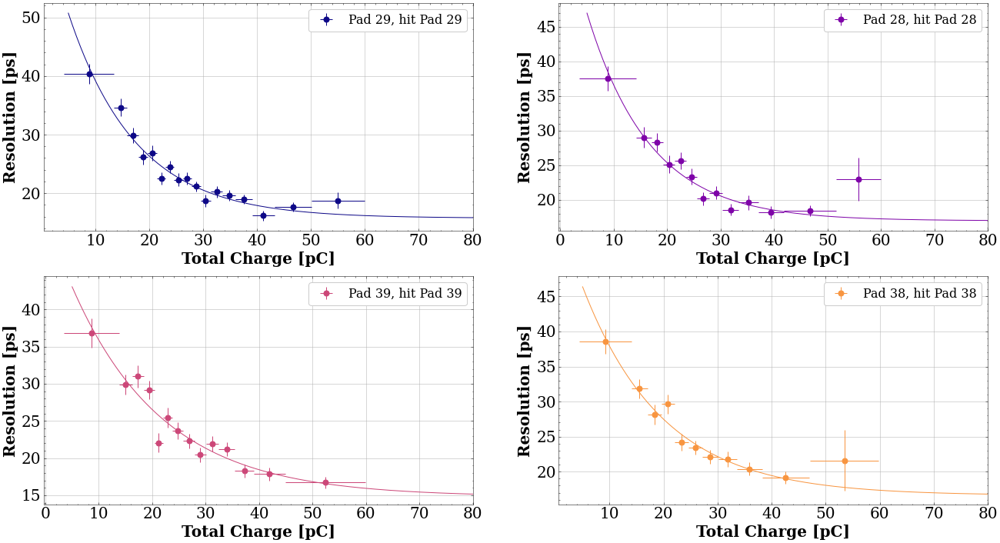

In [128]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(5, 80, 300)


axs[0].errorbar(xxsc55c1_qa[iistart:iistop], sdt5in5c1_qa[iistart:iistop], xerr=exsc55c1_qa[iistart:iistop], yerr=esdt5in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[4]}, hit {pnames[4]}')
axs[0].plot(a, expo2_np(a, spars5in5c1_qa), color=pcolors[0])

axs[1].errorbar(xxsc33c1_qa[iistart:iistop], sdt3in3c1_qa[iistart:iistop], xerr=exsc33c1_qa[iistart:iistop], yerr=esdt3in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].plot(a, expo2_np(a, spars3in3c1_qa), color=pcolors[1])

axs[2].errorbar(xxsc66c1_qa[iistart:iistop], sdt6in6c1_qa[iistart:iistop], xerr=exsc66c1_qa[iistart:iistop], yerr=esdt6in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[5]}, hit {pnames[5]}')
axs[2].plot(a, expo2_np(a, spars6in6c1_qa), color=pcolors[2])

axs[3].errorbar(xxsc44c1_qa[iistart:iistop], sdt4in4c1_qa[iistart:iistop], xerr=exsc44c1_qa[iistart:iistop], yerr=esdt4in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs[3].plot(a, expo2_np(a, spars4in4c1_qa), color=pcolors[3])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

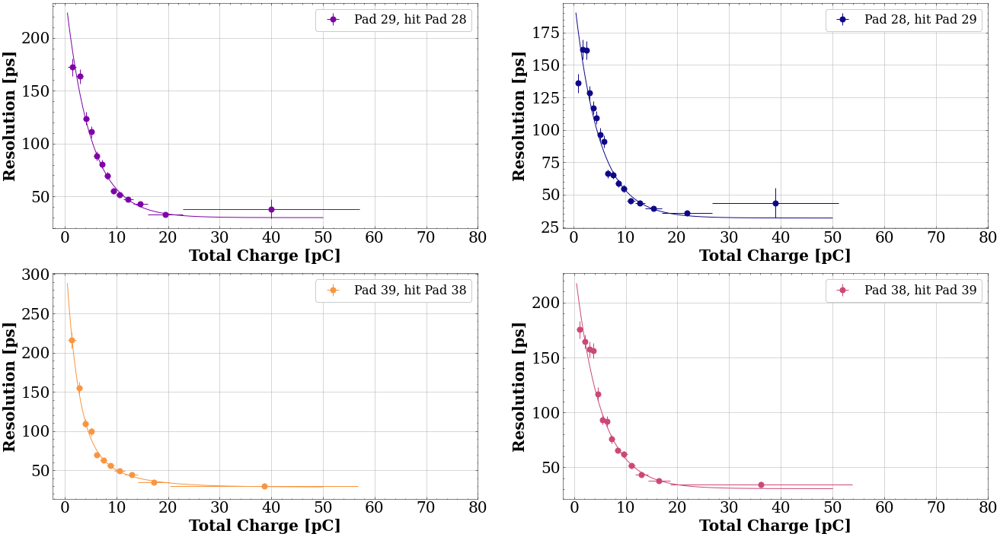

In [129]:
# left-right
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)

axs[0].errorbar(xxsc53c1_qa[iistart:iistop], sdt5in3c1_qa[iistart:iistop], xerr=exsc53c1_qa[iistart:iistop], yerr=esdt5in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[4]}, hit {pnames[2]}')
axs[0].plot(a, expo2_np(a, spars5in3c1_qa), color=pcolors[1])

axs[1].errorbar(xxsc35c1_qa[iistart:iistop], sdt3in5c1_qa[iistart:iistop], xerr=exsc35c1_qa[iistart:iistop], yerr=esdt3in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[2]}, hit {pnames[4]}')
axs[1].plot(a, expo2_np(a, spars3in5c1_qa), color=pcolors[0])

axs[2].errorbar(xxsc64c1_qa[iistart:iistop], sdt6in4c1_qa[iistart:iistop], xerr=exsc64c1_qa[iistart:iistop], yerr=esdt6in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[5]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, spars6in4c1_qa), color=pcolors[3])

axs[3].errorbar(xxsc46c1_qa[iistart:iistop], sdt4in6c1_qa[iistart:iistop], xerr=exsc46c1_qa[iistart:iistop], yerr=esdt4in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[3]}, hit {pnames[5]}')
axs[3].plot(a, expo2_np(a, spars4in6c1_qa), color=pcolors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()





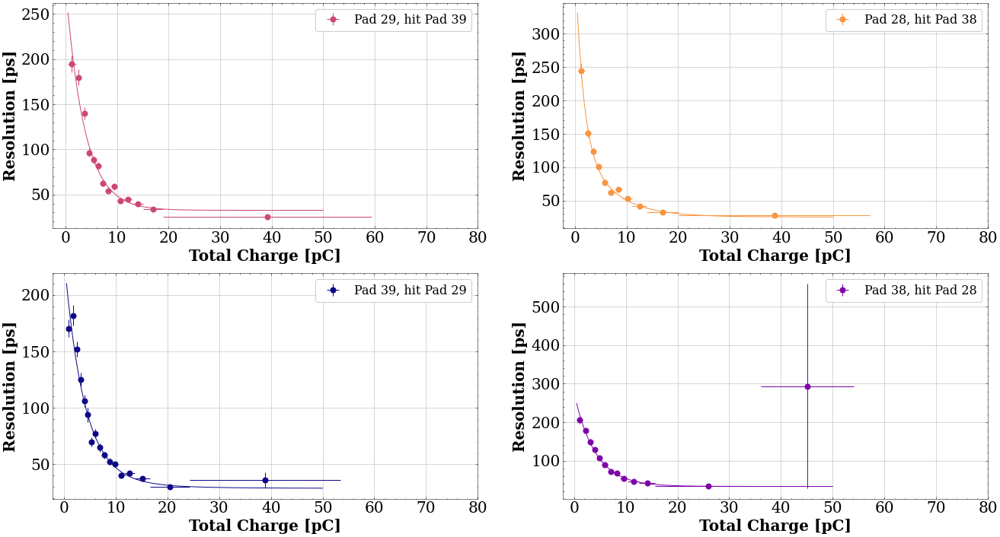

In [130]:
# up-down
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)
axs[0].errorbar(xxsc56c1_qa[iistart:iistop], sdt5in6c1_qa[iistart:iistop], xerr=exsc56c1_qa[iistart:iistop], yerr=esdt5in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[4]}, hit {pnames[5]}')
axs[0].plot(a, expo2_np(a, spars5in6c1_qa), color=pcolors[2])

axs[1].errorbar(xxsc34c1_qa[iistart:iistop], sdt3in4c1_qa[iistart:iistop], xerr=exsc34c1_qa[iistart:iistop], yerr=esdt3in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[1].plot(a, expo2_np(a, spars3in4c1_qa), color=pcolors[3])

axs[2].errorbar(xxsc65c1_qa[iistart:iistop], sdt6in5c1_qa[iistart:iistop], xerr=exsc65c1_qa[iistart:iistop], yerr=esdt6in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[5]}, hit {pnames[4]}')
axs[2].plot(a, expo2_np(a, spars6in5c1_qa), color=pcolors[0])

axs[3].errorbar(xxsc43c1_qa[iistart:iistop], sdt4in3c1_qa[iistart:iistop], xerr=exsc43c1_qa[iistart:iistop], yerr=esdt4in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, spars4in3c1_qa), color=pcolors[1])


for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 80)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()




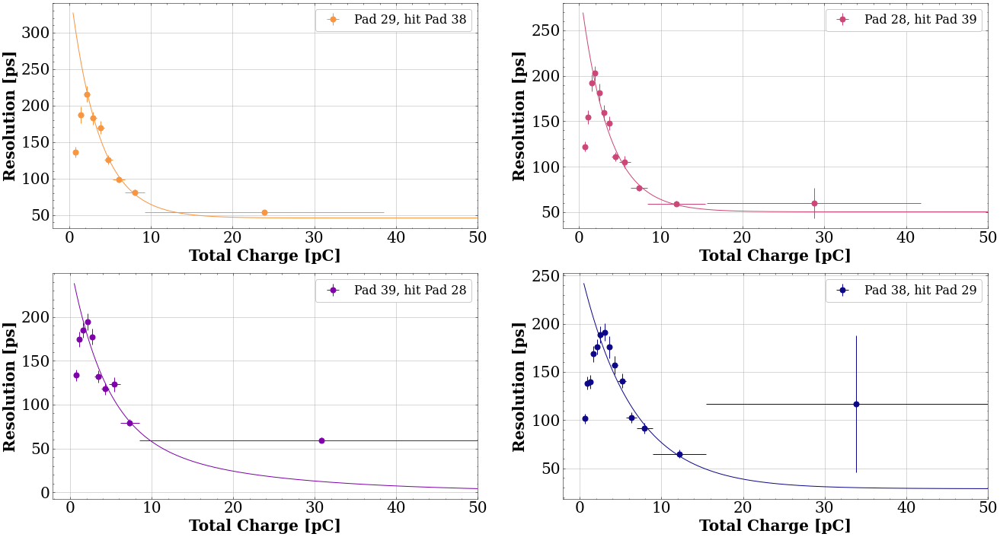

In [131]:
# diagonal
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)

axs[0].errorbar(xxsc54c1_qa[iistart:iistop], sdt5in4c1_qa[iistart:iistop], xerr=exsc54c1_qa[iistart:iistop], yerr=esdt5in4c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[3], label=f'{pnames[4]}, hit {pnames[3]}')
axs[0].plot(a, expo2_np(a, spars5in4c1_qa), color=pcolors[3])

axs[1].errorbar(xxsc36c1_qa[iistart:iistop], sdt3in6c1_qa[iistart:iistop], xerr=exsc36c1_qa[iistart:iistop], yerr=esdt3in6c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[2], label=f'{pnames[2]}, hit {pnames[5]}')
axs[1].plot(a, expo2_np(a, spars3in6c1_qa), color=pcolors[2])

axs[2].errorbar(xxsc63c1_qa[iistart:iistop], sdt6in3c1_qa[iistart:iistop], xerr=exsc63c1_qa[iistart:iistop], yerr=esdt6in3c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[1], label=f'{pnames[5]}, hit {pnames[2]}')
axs[2].plot(a, expo2_np(a, spars6in3c1_qa), color=pcolors[1])

axs[3].errorbar(xxsc45c1_qa[iistart:iistop], sdt4in5c1_qa[iistart:iistop], xerr=exsc45c1_qa[iistart:iistop], yerr=esdt4in5c1_qa[iistart:iistop], fmt='o', ms=7, color=pcolors[0], label=f'{pnames[3]}, hit {pnames[4]}')
axs[3].plot(a, expo2_np(a, spars4in5c1_qa), color=pcolors[0])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(None, 50)
#     axs[i].set_ylim(0, 1000)
#     axs[i].set_ylim(show_ranges[i][0], show_ranges[i][1])
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

## Right Cross

In [132]:
mmqall_in1 = max_q_c1 == 0
mmqall_in2 = max_q_c1 == 1
mmqall_in3 = max_q_c1 == 2
mmqall_in4 = max_q_c1 == 3



xyc2_pad1_qa = np.logical_and(np.logical_and(mmqall_in1, cross2_cut), cc1)
xyc2_pad2_qa = np.logical_and(np.logical_and(mmqall_in2, cross2_cut), cc2)
xyc2_pad3_qa = np.logical_and(np.logical_and(mmqall_in3, cross2_cut), cc3)
xyc2_pad4_qa = np.logical_and(np.logical_and(mmqall_in4, cross2_cut), cc4)

xyc2_pads_qa = [xyc2_pad1_qa,xyc2_pad2_qa,xyc2_pad3_qa,xyc2_pad4_qa,[],[]]

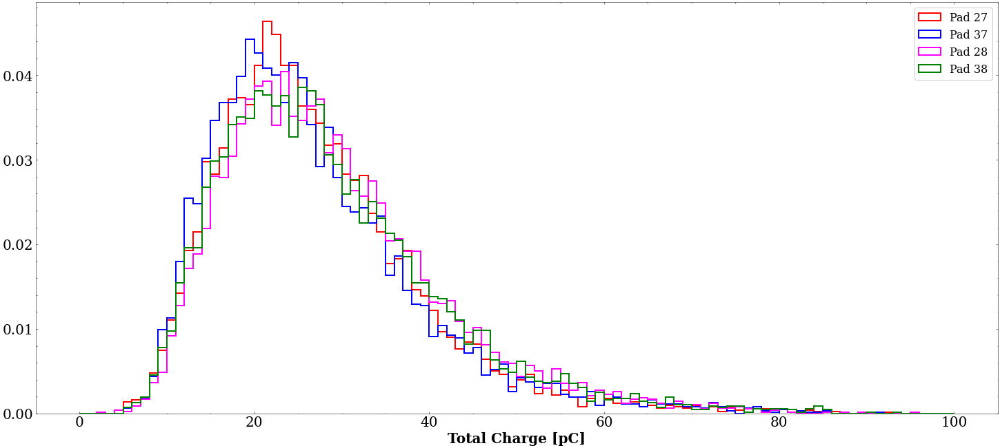

In [133]:
fig, axs = plt.subplots(figsize=(25, 11))

axs.hist(mm1_qall[xyc2_pad1_qa], bins=100, range=(0, 100), histtype='step', color=colors[0], lw=2, label=pnames[0], density=True)
axs.hist(mm2_qall[xyc2_pad2_qa], bins=100, range=(0, 100), histtype='step', color=colors[1], lw=2, label=pnames[1], density=True)
axs.hist(mm3_qall[xyc2_pad3_qa], bins=100, range=(0, 100), histtype='step', color=colors[2], lw=2, label=pnames[2], density=True)
axs.hist(mm4_qall[xyc2_pad4_qa], bins=100, range=(0, 100), histtype='step', color=colors[3], lw=2, label=pnames[3], density=True)

axs.legend()
# axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

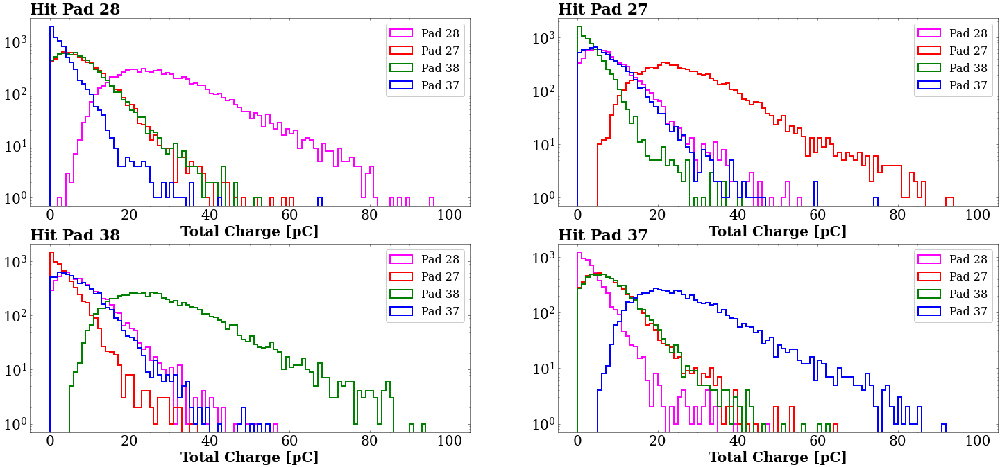

In [134]:
fig, axs = plt.subplots(2,2, figsize=(25, 11))
axs=axs.ravel()
qrange = 100

for i,j in enumerate(c2_order):
    axs[i].set_title(f'Hit {pnames[j]}', loc='left')
    axs[i].hist(mm3_qall[xyc2_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[2], lw=2, label=pnames[2])
    axs[i].hist(mm1_qall[xyc2_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[0], lw=2, label=pnames[0])
    axs[i].hist(mm4_qall[xyc2_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[3], lw=2, label=pnames[3])
    axs[i].hist(mm2_qall[xyc2_pads_qa[j]], bins=100, range=(0, qrange), histtype='step', color=colors[1], lw=2, label=pnames[1])




for i in range(4):
    axs[i].legend()
    axs[i].set_yscale('log')
    axs[i].set_xlabel("Total Charge [pC]")
plt.show()

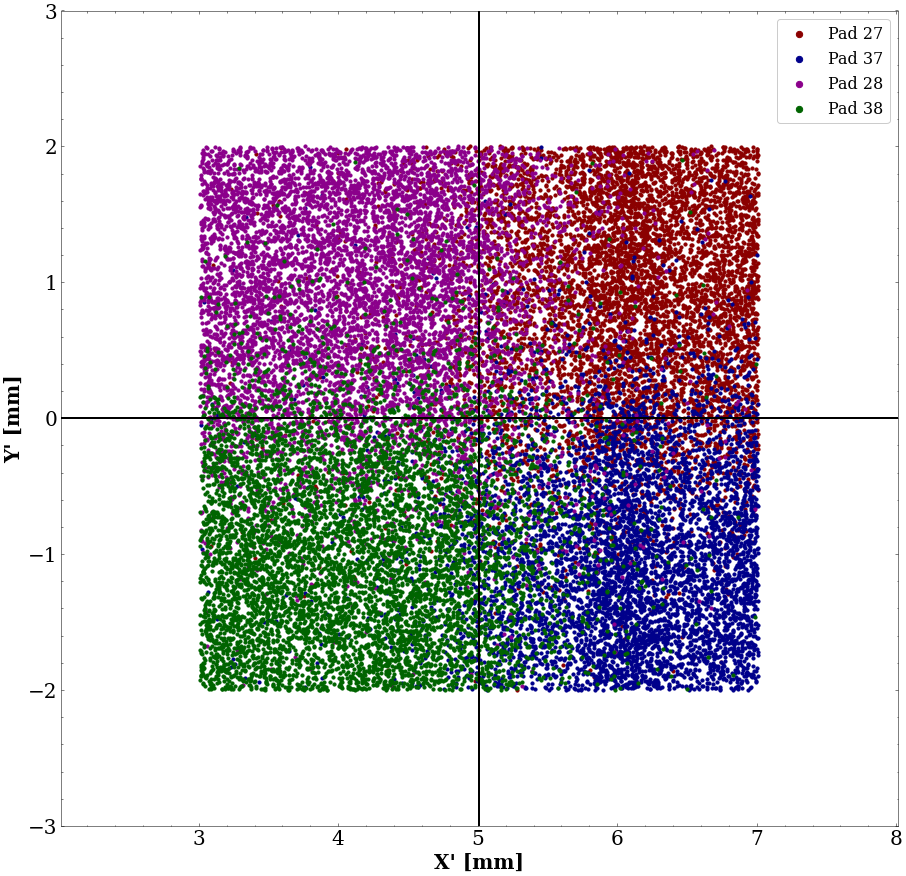

In [135]:
fig, axs = plt.subplots(figsize=(15, 15))

axs.scatter(x_s[xyc2_pad1_qa], y_s[xyc2_pad1_qa], s=10, color=f'dark{colors[0]}', label=f'{pnames[0]}')
axs.scatter(x_s[xyc2_pad2_qa], y_s[xyc2_pad2_qa], s=10, color=f'dark{colors[1]}', label=f'{pnames[1]}')
axs.scatter(x_s[xyc2_pad3_qa], y_s[xyc2_pad3_qa], s=10, color=f'dark{colors[2]}', label=f'{pnames[2]}')
axs.scatter(x_s[xyc2_pad4_qa], y_s[xyc2_pad4_qa], s=10, color=f'dark{colors[3]}', label=f'{pnames[3]}')



axs.scatter(cross2_s[1,0], cross2_s[1,1], s=1, color='black', marker='+')
axs.axvline(cross2_s[1,0], lw=2, color='black')
axs.axhline(cross2_s[1,1], lw=2, color='black')
# axs.axvline(0, lw=2, color='black')
# axs.axhline(0, lw=2, color='black')


axs.legend(loc=1, markerscale=2)
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
axs.set_xlim(cross2_s[1,0]-3,cross2_s[1,0]+3)
axs.set_ylim(cross2_s[1,1]-3,cross2_s[1,1]+3)
plt.show()

In [136]:
# print(tranges

# tranges_c2 = [
#  [-8500, -7500],
#  [-5000, -2000],
#  [-16500, -15000],
#  [-16500, -15000],
#  [-13650, -13500],
#  [-12850, -12650]
    
# ]

tranges_c2 = [
 [-10000, -6000],
 [-6000, -1000],
 [-18000, -14000],
 [-18000, -14000],
 [-15000, -11000],
 [-14000, -11000]
    
]

In [137]:

qlow = 0.5
qup = 60

nppe = 500


vl1in1c2_qa, vu1in1c2_qa, mdt1in1c2_qa, sdt1in1c2_qa, emdt1in1c2_qa, esdt1in1c2_qa = fff(mm1_qall[xyc2_pad1_qa], dt1[xyc2_pad1_qa], qlow, qup, nppe, False, trange=[tranges_c2[0][0], tranges_c2[0][1]])
vl2in1c2_qa, vu2in1c2_qa, mdt2in1c2_qa, sdt2in1c2_qa, emdt2in1c2_qa, esdt2in1c2_qa = fff(mm2_qall[xyc2_pad1_qa], dt2[xyc2_pad1_qa], qlow, qup, nppe, False, trange=[tranges_c2[1][0], tranges_c2[1][1]])
vl3in1c2_qa, vu3in1c2_qa, mdt3in1c2_qa, sdt3in1c2_qa, emdt3in1c2_qa, esdt3in1c2_qa = fff(mm3_qall[xyc2_pad1_qa], dt3[xyc2_pad1_qa], qlow, qup, nppe, False, trange=[tranges_c2[2][0], tranges_c2[2][1]])
vl4in1c2_qa, vu4in1c2_qa, mdt4in1c2_qa, sdt4in1c2_qa, emdt4in1c2_qa, esdt4in1c2_qa = fff(mm4_qall[xyc2_pad1_qa], dt4[xyc2_pad1_qa], qlow, qup, nppe, False, trange=[tranges_c2[3][0], tranges_c2[3][1]])

vl1in2c2_qa, vu1in2c2_qa, mdt1in2c2_qa, sdt1in2c2_qa, emdt1in2c2_qa, esdt1in2c2_qa = fff(mm1_qall[xyc2_pad2_qa], dt1[xyc2_pad2_qa], qlow, qup, nppe, False, trange=[tranges_c2[0][0], tranges_c2[0][1]])
vl2in2c2_qa, vu2in2c2_qa, mdt2in2c2_qa, sdt2in2c2_qa, emdt2in2c2_qa, esdt2in2c2_qa = fff(mm2_qall[xyc2_pad2_qa], dt2[xyc2_pad2_qa], qlow, qup, nppe, False, trange=[tranges_c2[1][0], tranges_c2[1][1]])
vl3in2c2_qa, vu3in2c2_qa, mdt3in2c2_qa, sdt3in2c2_qa, emdt3in2c2_qa, esdt3in2c2_qa = fff(mm3_qall[xyc2_pad2_qa], dt3[xyc2_pad2_qa], qlow, qup, nppe, False, trange=[tranges_c2[2][0], tranges_c2[2][1]])
vl4in2c2_qa, vu4in2c2_qa, mdt4in2c2_qa, sdt4in2c2_qa, emdt4in2c2_qa, esdt4in2c2_qa = fff(mm4_qall[xyc2_pad2_qa], dt4[xyc2_pad2_qa], qlow, qup, nppe, False, trange=[tranges_c2[3][0], tranges_c2[3][1]])

vl1in3c2_qa, vu1in3c2_qa, mdt1in3c2_qa, sdt1in3c2_qa, emdt1in3c2_qa, esdt1in3c2_qa = fff(mm1_qall[xyc2_pad3_qa], dt1[xyc2_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c2[0][0], tranges_c2[0][1]])
vl2in3c2_qa, vu2in3c2_qa, mdt2in3c2_qa, sdt2in3c2_qa, emdt2in3c2_qa, esdt2in3c2_qa = fff(mm2_qall[xyc2_pad3_qa], dt2[xyc2_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c2[1][0], tranges_c2[1][1]])
vl3in3c2_qa, vu3in3c2_qa, mdt3in3c2_qa, sdt3in3c2_qa, emdt3in3c2_qa, esdt3in3c2_qa = fff(mm3_qall[xyc2_pad3_qa], dt3[xyc2_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c2[2][0], tranges_c2[2][1]])
vl4in3c2_qa, vu4in3c2_qa, mdt4in3c2_qa, sdt4in3c2_qa, emdt4in3c2_qa, esdt4in3c2_qa = fff(mm4_qall[xyc2_pad3_qa], dt4[xyc2_pad3_qa], qlow, qup, nppe, False, trange=[tranges_c2[3][0], tranges_c2[3][1]])

vl1in4c2_qa, vu1in4c2_qa, mdt1in4c2_qa, sdt1in4c2_qa, emdt1in4c2_qa, esdt1in4c2_qa = fff(mm1_qall[xyc2_pad4_qa], dt1[xyc2_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c2[0][0], tranges_c2[0][1]])
vl2in4c2_qa, vu2in4c2_qa, mdt2in4c2_qa, sdt2in4c2_qa, emdt2in4c2_qa, esdt2in4c2_qa = fff(mm2_qall[xyc2_pad4_qa], dt2[xyc2_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c2[1][0], tranges_c2[1][1]])
vl3in4c2_qa, vu3in4c2_qa, mdt3in4c2_qa, sdt3in4c2_qa, emdt3in4c2_qa, esdt3in4c2_qa = fff(mm3_qall[xyc2_pad4_qa], dt3[xyc2_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c2[2][0], tranges_c2[2][1]])
vl4in4c2_qa, vu4in4c2_qa, mdt4in4c2_qa, sdt4in4c2_qa, emdt4in4c2_qa, esdt4in4c2_qa = fff(mm4_qall[xyc2_pad4_qa], dt4[xyc2_pad4_qa], qlow, qup, nppe, False, trange=[tranges_c2[3][0], tranges_c2[3][1]])

xxsc11c2_qa = (vl1in1c2_qa + vu1in1c2_qa)*0.5 
exsc11c2_qa = (vl1in1c2_qa - vu1in1c2_qa)*0.5 
xxsc21c2_qa = (vl2in1c2_qa + vu2in1c2_qa)*0.5 
exsc21c2_qa = (vl2in1c2_qa - vu2in1c2_qa)*0.5 
xxsc31c2_qa = (vl3in1c2_qa + vu3in1c2_qa)*0.5 
exsc31c2_qa = (vl3in1c2_qa - vu3in1c2_qa)*0.5 
xxsc41c2_qa = (vl4in1c2_qa + vu4in1c2_qa)*0.5 
exsc41c2_qa = (vl4in1c2_qa - vu4in1c2_qa)*0.5 

xxsc12c2_qa = (vl1in2c2_qa + vu1in2c2_qa)*0.5 
exsc12c2_qa = (vl1in2c2_qa - vu1in2c2_qa)*0.5 
xxsc22c2_qa = (vl2in2c2_qa + vu2in2c2_qa)*0.5 
exsc22c2_qa = (vl2in2c2_qa - vu2in2c2_qa)*0.5 
xxsc32c2_qa = (vl3in2c2_qa + vu3in2c2_qa)*0.5 
exsc32c2_qa = (vl3in2c2_qa - vu3in2c2_qa)*0.5 
xxsc42c2_qa = (vl4in2c2_qa + vu4in2c2_qa)*0.5 
exsc42c2_qa = (vl4in2c2_qa - vu4in2c2_qa)*0.5 

xxsc13c2_qa = (vl1in3c2_qa + vu1in3c2_qa)*0.5 
exsc13c2_qa = (vl1in3c2_qa - vu1in3c2_qa)*0.5 
xxsc23c2_qa = (vl2in3c2_qa + vu2in3c2_qa)*0.5 
exsc23c2_qa = (vl2in3c2_qa - vu2in3c2_qa)*0.5 
xxsc33c2_qa = (vl3in3c2_qa + vu3in3c2_qa)*0.5 
exsc33c2_qa = (vl3in3c2_qa - vu3in3c2_qa)*0.5 
xxsc43c2_qa = (vl4in3c2_qa + vu4in3c2_qa)*0.5 
exsc43c2_qa = (vl4in3c2_qa - vu4in3c2_qa)*0.5 

xxsc14c2_qa = (vl1in4c2_qa + vu1in4c2_qa)*0.5 
exsc14c2_qa = (vl1in4c2_qa - vu1in4c2_qa)*0.5 
xxsc24c2_qa = (vl2in4c2_qa + vu2in4c2_qa)*0.5 
exsc24c2_qa = (vl2in4c2_qa - vu2in4c2_qa)*0.5 
xxsc34c2_qa = (vl3in4c2_qa + vu3in4c2_qa)*0.5 
exsc34c2_qa = (vl3in4c2_qa - vu3in4c2_qa)*0.5 
xxsc44c2_qa = (vl4in4c2_qa + vu4in4c2_qa)*0.5 
exsc44c2_qa = (vl4in4c2_qa - vu4in4c2_qa)*0.5 


np.min(idt)=-8178.535399307776, np.max(idt)=-7719.17173023391, r1=-8154.655827196035, mm=-7961.895523696727, r2=-7769.135220197419
16.66678654520015, -7966.194525048399, 41.76954482958593, 
##################################################
np.min(idt)=-8090.860332884887, np.max(idt)=-7836.079973276668, r1=-8131.564267242236, mm=-7974.433761642197, r2=-7817.303256042158
15.82351264048696, -7974.936378849011, 35.0533523961518, 
##################################################
np.min(idt)=-8068.380983787733, np.max(idt)=-7825.207754691092, r1=-8105.648521317999, mm=-7979.516377490247, r2=-7853.384233662494
14.728477047906418, -7980.619295691535, 30.027159418142546, 
##################################################
np.min(idt)=-8099.8968115554535, np.max(idt)=-7841.191765428675, r1=-8112.4728464377995, mm=-7983.179449621826, r2=-7853.886052805853
16.138083914475935, -7985.365089110864, 29.540076617773558, 
##################################################
np.min(idt)=-8094.2515839655

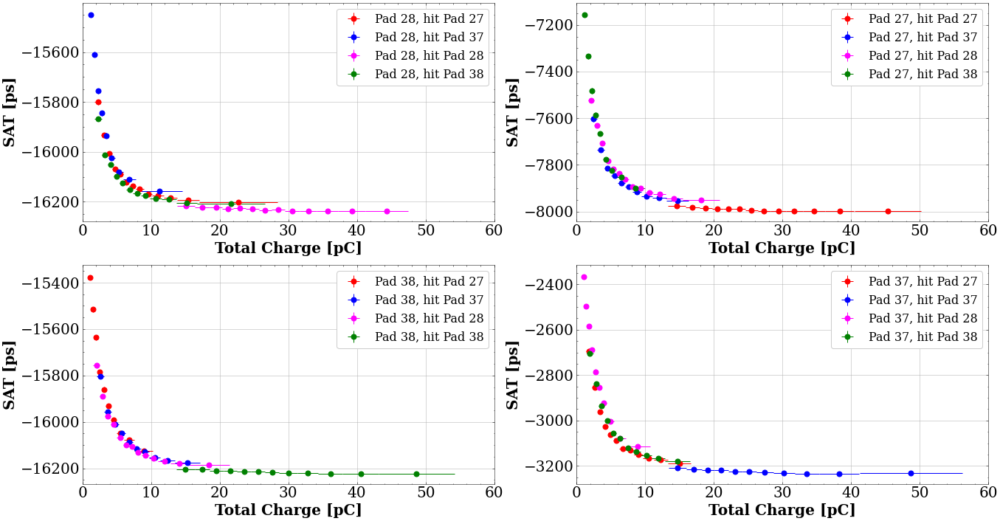

In [138]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxsc31c2_qa[iistart:iistop], mdt3in1c2_qa[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=emdt3in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs[0].errorbar(xxsc32c2_qa[iistart:iistop], mdt3in2c2_qa[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=emdt3in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs[0].errorbar(xxsc33c2_qa[iistart:iistop], mdt3in3c2_qa[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=emdt3in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs[0].errorbar(xxsc34c2_qa[iistart:iistop], mdt3in4c2_qa[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=emdt3in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')

axs[1].errorbar(xxsc11c2_qa[iistart:iistop], mdt1in1c2_qa[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=emdt1in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs[1].errorbar(xxsc12c2_qa[iistart:iistop], mdt1in2c2_qa[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=emdt1in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs[1].errorbar(xxsc13c2_qa[iistart:iistop], mdt1in3c2_qa[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=emdt1in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs[1].errorbar(xxsc14c2_qa[iistart:iistop], mdt1in4c2_qa[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=emdt1in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')

axs[2].errorbar(xxsc41c2_qa[iistart:iistop], mdt4in1c2_qa[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=emdt4in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs[2].errorbar(xxsc42c2_qa[iistart:iistop], mdt4in2c2_qa[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=emdt4in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs[2].errorbar(xxsc43c2_qa[iistart:iistop], mdt4in3c2_qa[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=emdt4in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')
axs[2].errorbar(xxsc44c2_qa[iistart:iistop], mdt4in4c2_qa[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=emdt4in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')

axs[3].errorbar(xxsc21c2_qa[iistart:iistop], mdt2in1c2_qa[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=emdt2in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs[3].errorbar(xxsc22c2_qa[iistart:iistop], mdt2in2c2_qa[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=emdt2in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')
axs[3].errorbar(xxsc23c2_qa[iistart:iistop], mdt2in3c2_qa[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=emdt2in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')
axs[3].errorbar(xxsc24c2_qa[iistart:iistop], mdt2in4c2_qa[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=emdt2in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, qup)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


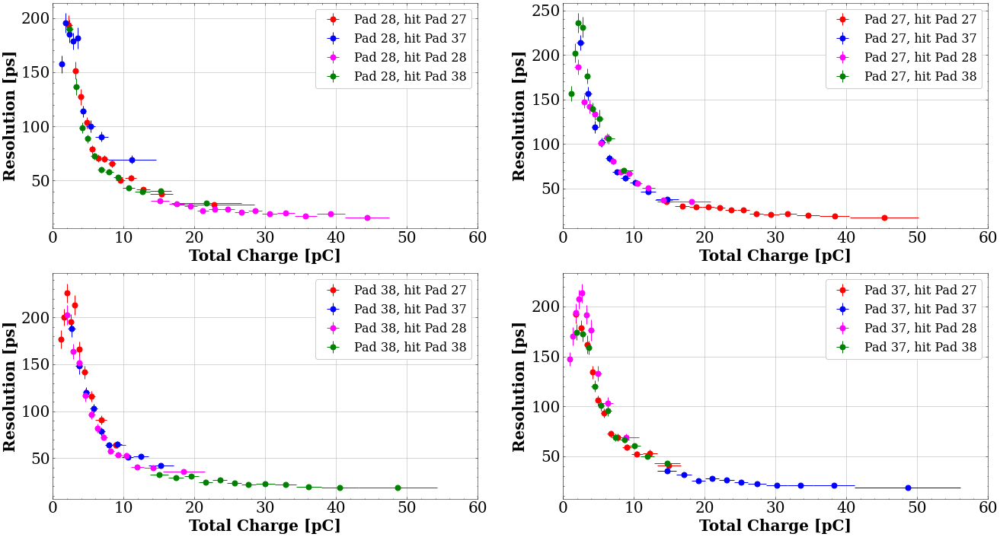

In [139]:
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxsc31c2_qa[iistart:iistop], sdt3in1c2_qa[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=esdt3in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs[0].errorbar(xxsc32c2_qa[iistart:iistop], sdt3in2c2_qa[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=esdt3in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs[0].errorbar(xxsc33c2_qa[iistart:iistop], sdt3in3c2_qa[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=esdt3in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs[0].errorbar(xxsc34c2_qa[iistart:iistop], sdt3in4c2_qa[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=esdt3in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')

axs[1].errorbar(xxsc11c2_qa[iistart:iistop], sdt1in1c2_qa[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=esdt1in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs[1].errorbar(xxsc12c2_qa[iistart:iistop], sdt1in2c2_qa[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=esdt1in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs[1].errorbar(xxsc13c2_qa[iistart:iistop], sdt1in3c2_qa[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=esdt1in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs[1].errorbar(xxsc14c2_qa[iistart:iistop], sdt1in4c2_qa[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=esdt1in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')

axs[2].errorbar(xxsc41c2_qa[iistart:iistop], sdt4in1c2_qa[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=esdt4in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs[2].errorbar(xxsc42c2_qa[iistart:iistop], sdt4in2c2_qa[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=esdt4in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs[2].errorbar(xxsc43c2_qa[iistart:iistop], sdt4in3c2_qa[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=esdt4in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')
axs[2].errorbar(xxsc44c2_qa[iistart:iistop], sdt4in4c2_qa[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=esdt4in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')

axs[3].errorbar(xxsc21c2_qa[iistart:iistop], sdt2in1c2_qa[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=esdt2in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs[3].errorbar(xxsc22c2_qa[iistart:iistop], sdt2in2c2_qa[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=esdt2in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')
axs[3].errorbar(xxsc23c2_qa[iistart:iistop], sdt2in3c2_qa[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=esdt2in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')
axs[3].errorbar(xxsc24c2_qa[iistart:iistop], sdt2in4c2_qa[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=esdt2in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


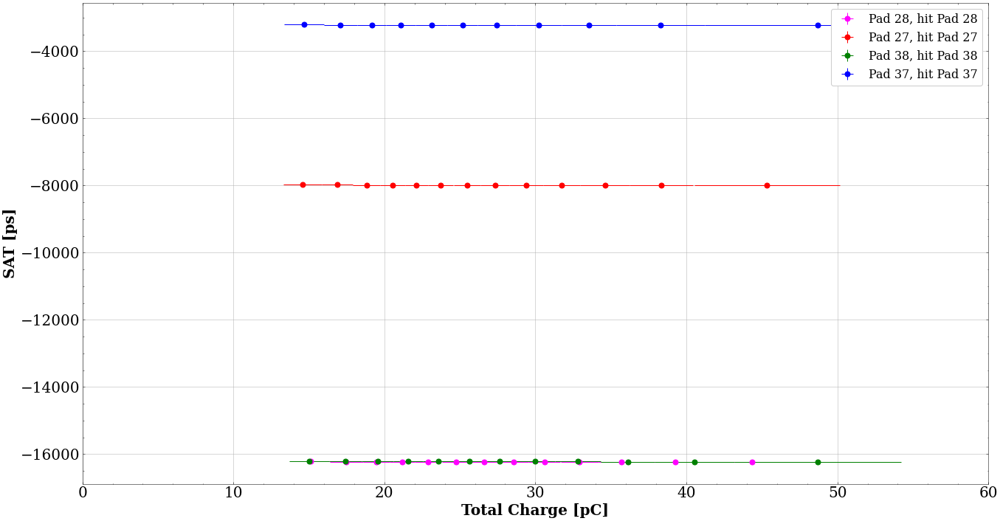

In [140]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

# same
axs.errorbar(xxsc33c2_qa[iistart:iistop], mdt3in3c2_qa[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=emdt3in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs.errorbar(xxsc11c2_qa[iistart:iistop], mdt1in1c2_qa[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=emdt1in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs.errorbar(xxsc44c2_qa[iistart:iistop], mdt4in4c2_qa[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=emdt4in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs.errorbar(xxsc22c2_qa[iistart:iistop], mdt2in2c2_qa[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=emdt2in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

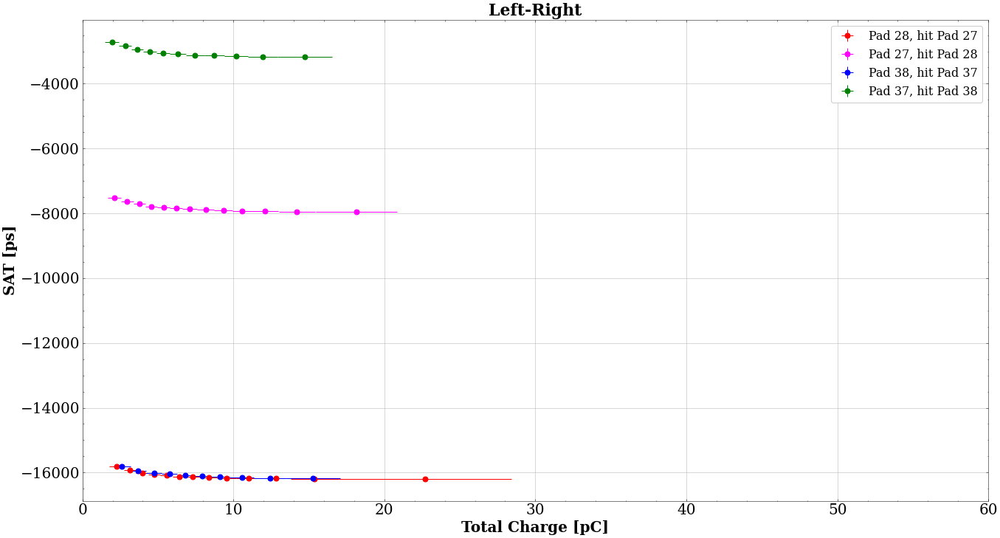

In [141]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

#left-right
axs.errorbar(xxsc31c2_qa[iistart:iistop], mdt3in1c2_qa[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=emdt3in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs.errorbar(xxsc13c2_qa[iistart:iistop], mdt1in3c2_qa[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=emdt1in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs.errorbar(xxsc42c2_qa[iistart:iistop], mdt4in2c2_qa[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=emdt4in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs.errorbar(xxsc24c2_qa[iistart:iistop], mdt2in4c2_qa[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=emdt2in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
axs.set_title('Left-Right')
# axs[0].set_xlim(0, 5)
plt.show()

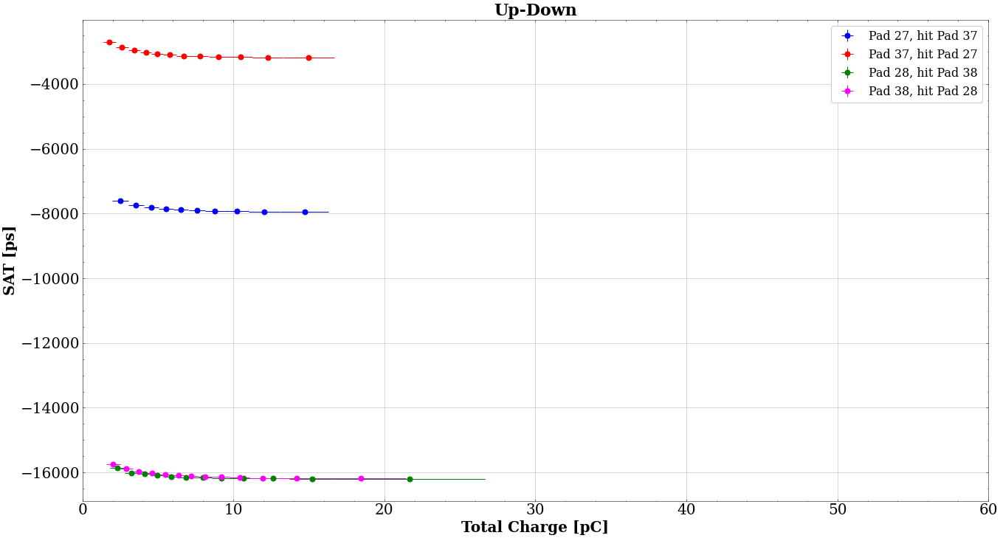

In [142]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc12c2_qa[iistart:iistop], mdt1in2c2_qa[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=emdt1in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs.errorbar(xxsc21c2_qa[iistart:iistop], mdt2in1c2_qa[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=emdt2in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs.errorbar(xxsc34c2_qa[iistart:iistop], mdt3in4c2_qa[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=emdt3in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs.errorbar(xxsc43c2_qa[iistart:iistop], mdt4in3c2_qa[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=emdt4in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
axs.set_title('Up-Down')

# axs[0].set_xlim(0, 5)
plt.show()

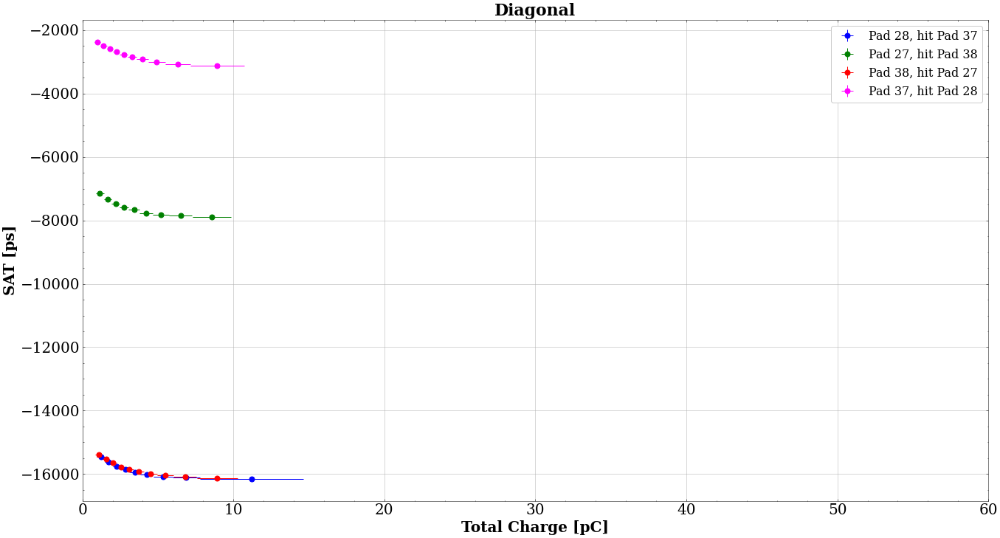

In [143]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc32c2_qa[iistart:iistop], mdt3in2c2_qa[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=emdt3in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs.errorbar(xxsc14c2_qa[iistart:iistop], mdt1in4c2_qa[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=emdt1in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')
axs.errorbar(xxsc41c2_qa[iistart:iistop], mdt4in1c2_qa[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=emdt4in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs.errorbar(xxsc23c2_qa[iistart:iistop], mdt2in3c2_qa[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=emdt2in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')

axs.set_title('Diagonal')
axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

## Q-Active: Correction for right cross 

Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 37.0516933941322293
Edm   = 1.83550621305802179e-06
Nfcn  = 363
Par_0	  = -0.32	 +/-  2
Par_1	  = -8.18215	 +/-  1.99875
Par_2	  = -0.0999675	 +/-  0.00781419
Par_3	  = 4.54835	 +/-  0.0973456
Par_4	  = -8000.21	 +/-  0.75274
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 114.114283738622689
Edm   = 1.66740197856477043e-07
Nfcn  = 395
Par_0	  = -0.0650975	 +/-  1.98866
Par_1	  = -12.0206	 +/-  2
Par_2	  = -0.417552	 +/-  0.00616183
Par_3	  = 6.96953	 +/-  0.0146164
Par_4	  = -3186.96	 +/-  1.03579
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 96.1680690962547686
Edm   = 6.03891723855716976e-06
Nfcn  = 418
Par_0	  = -0.403325	 +/-  0.00636364
Par_1	  = 6.91106	 +

Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 0 ] = -0.000607953
Warning in <Minuit2>: MnPosDef Added to diagonal of Error matrix a value 0.500609
Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 12020.8 > 0
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 2 ] = -2.96714e-06
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 3 ] = -0.000756301
Warning in <Minuit2>: MnPosDef Added to diagonal of Error matrix a value 0.500757
Warning in <Minuit2>: VariableMetricBuilder gdel = -2.13042e+07
Warning in <Minuit2>: VariableMetricBuilder No improvement in line search
Warning in <Minuit2>: VariableMetricBuilder Iterations finish without convergence; Edm 37183.6 Requested 2e-05
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 1 ] = -12.438

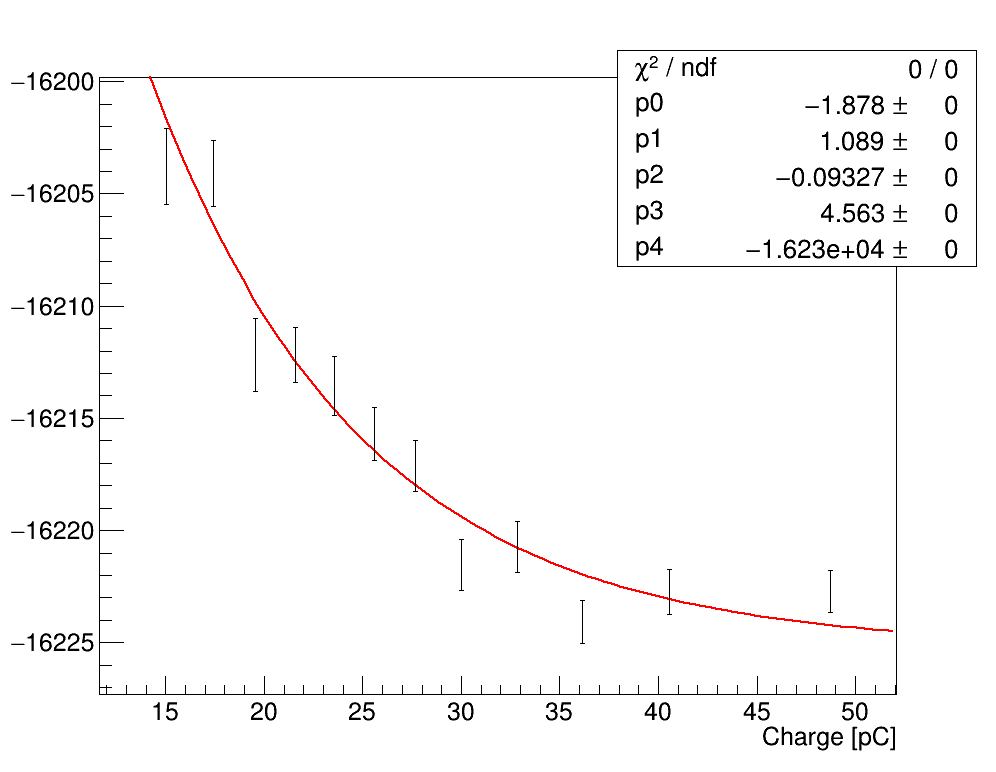

In [144]:
pars1in1c2_qa = sat_fit(xxsc11c2_qa, mdt1in1c2_qa, exsc11c2_qa, emdt1in1c2_qa, iistart=0, iistop=-1, xl=5., xu=60, pars=[-0.1, 1.0, -1, 0.5, 8000])
pars2in1c2_qa = sat_fit(xxsc21c2_qa, mdt2in1c2_qa, exsc11c2_qa, emdt2in1c2_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
pars3in1c2_qa = sat_fit(xxsc31c2_qa, mdt3in1c2_qa, exsc11c2_qa, emdt3in1c2_qa, iistart=0, iistop=None, xl=0.5, xu=50, pars=[-0.1,10.0,-1,0.5,40])
pars4in1c2_qa = sat_fit(xxsc41c2_qa, mdt4in1c2_qa, exsc11c2_qa, emdt4in1c2_qa, iistart=0, iistop=None, xl=0.5, xu=15, pars=[-0.1,1.0,-1,0.5,40])

pars1in2c2_qa = sat_fit(xxsc12c2_qa, mdt1in2c2_qa, exsc12c2_qa, emdt1in2c2_qa, iistart=0, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
pars2in2c2_qa = sat_fit(xxsc22c2_qa, mdt2in2c2_qa, exsc22c2_qa, emdt2in2c2_qa, iistart=1, iistop=-2, xl=5., xu=60, pars=[-0.1,2.0,-1,0.5,40])
pars3in2c2_qa = sat_fit(xxsc32c2_qa, mdt3in2c2_qa, exsc32c2_qa, emdt3in2c2_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,10.0,-1,0.5,40])
pars4in2c2_qa = sat_fit(xxsc42c2_qa, mdt4in2c2_qa, exsc42c2_qa, emdt4in2c2_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])

pars1in3c2_qa = sat_fit(xxsc13c2_qa, mdt1in3c2_qa, exsc13c2_qa, emdt1in3c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
pars2in3c2_qa = sat_fit(xxsc23c2_qa, mdt2in3c2_qa, exsc23c2_qa, emdt2in3c2_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars3in3c2_qa = sat_fit(xxsc33c2_qa, mdt3in3c2_qa, exsc33c2_qa, emdt3in3c2_qa, iistart=1, iistop=-1, xl=0.5, xu=60, pars=[-0.1,1.0,-1,0.5,40])
pars4in3c2_qa = sat_fit(xxsc43c2_qa, mdt4in3c2_qa, exsc43c2_qa, emdt4in3c2_qa, iistart=0, iistop=None, xl=0.5, xu=50, pars=[-0.1,5.0,-1,0.5,40])

pars1in4c2_qa = sat_fit(xxsc14c2_qa, mdt1in4c2_qa, exsc14c2_qa, emdt1in4c2_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,10.0,-1,0.5,40])
pars2in4c2_qa = sat_fit(xxsc24c2_qa, mdt2in4c2_qa, exsc24c2_qa, emdt2in4c2_qa, iistart=0, iistop=None, xl=0.5, xu=20, pars=[-0.1,1.0,-1,0.5,40])
pars3in4c2_qa = sat_fit(xxsc34c2_qa, mdt3in4c2_qa, exsc34c2_qa, emdt3in4c2_qa, iistart=0, iistop=None, xl=0.5, xu=50, pars=[-0.1,5.0,-1,0.5,40])
pars4in4c2_qa = sat_fit(xxsc44c2_qa, mdt4in4c2_qa, exsc44c2_qa, emdt4in4c2_qa, iistart=1, iistop=-1, xl=0.5, xu=60, pars=[-0.2,2.0,-1,0.5,40])


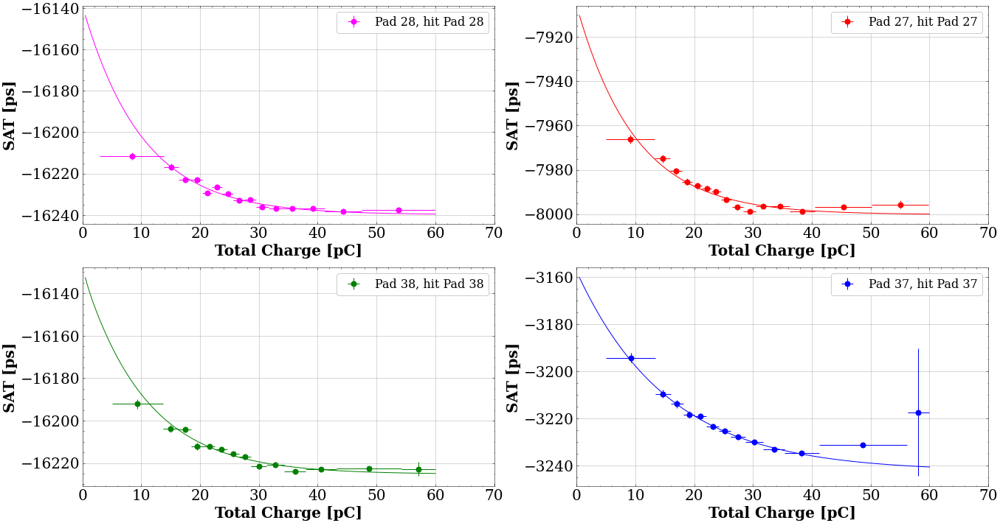

In [145]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

axs[0].errorbar(xxsc33c2_qa[iistart:iistop], mdt3in3c2_qa[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=emdt3in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs[0].plot(a, expo2_np(a, pars3in3c2_qa), color=colors[2])

axs[1].errorbar(xxsc11c2_qa[iistart:iistop], mdt1in1c2_qa[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=emdt1in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs[1].plot(a, expo2_np(a, pars1in1c2_qa), color=colors[0])

axs[2].errorbar(xxsc44c2_qa[iistart:iistop], mdt4in4c2_qa[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=emdt4in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, pars4in4c2_qa), color=colors[3])

axs[3].errorbar(xxsc22c2_qa[iistart:iistop], mdt2in2c2_qa[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=emdt2in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')
axs[3].plot(a, expo2_np(a, pars2in2c2_qa), color=colors[1])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


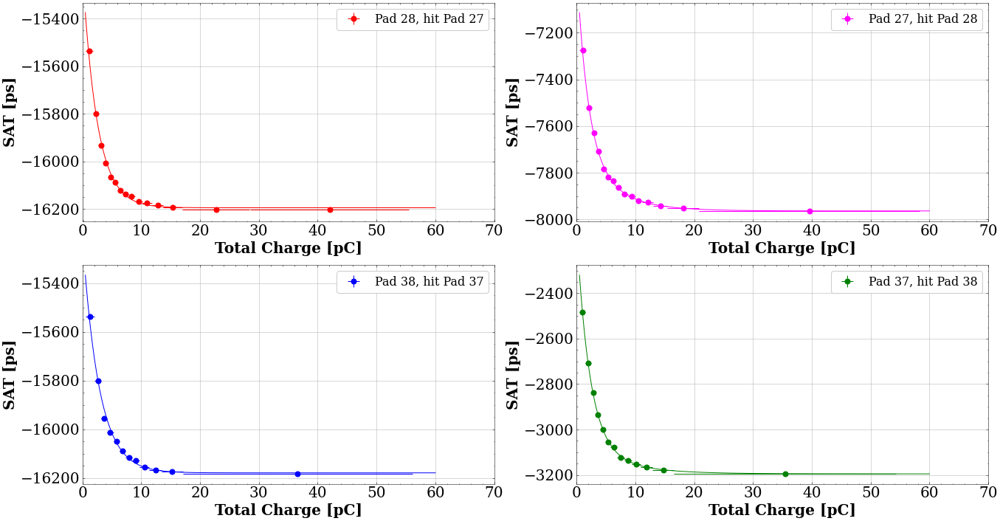

In [146]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

#left-right
axs[0].errorbar(xxsc31c2_qa[iistart:iistop], mdt3in1c2_qa[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=emdt3in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs[0].plot(a, expo2_np(a, pars3in1c2_qa), color=colors[0])

axs[1].errorbar(xxsc13c2_qa[iistart:iistop], mdt1in3c2_qa[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=emdt1in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs[1].plot(a, expo2_np(a, pars1in3c2_qa), color=colors[2])

axs[2].errorbar(xxsc42c2_qa[iistart:iistop], mdt4in2c2_qa[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=emdt4in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs[2].plot(a, expo2_np(a, pars4in2c2_qa), color=colors[1])

axs[3].errorbar(xxsc24c2_qa[iistart:iistop], mdt2in4c2_qa[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=emdt2in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')
axs[3].plot(a, expo2_np(a, pars2in4c2_qa), color=colors[3])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)
plt.show()


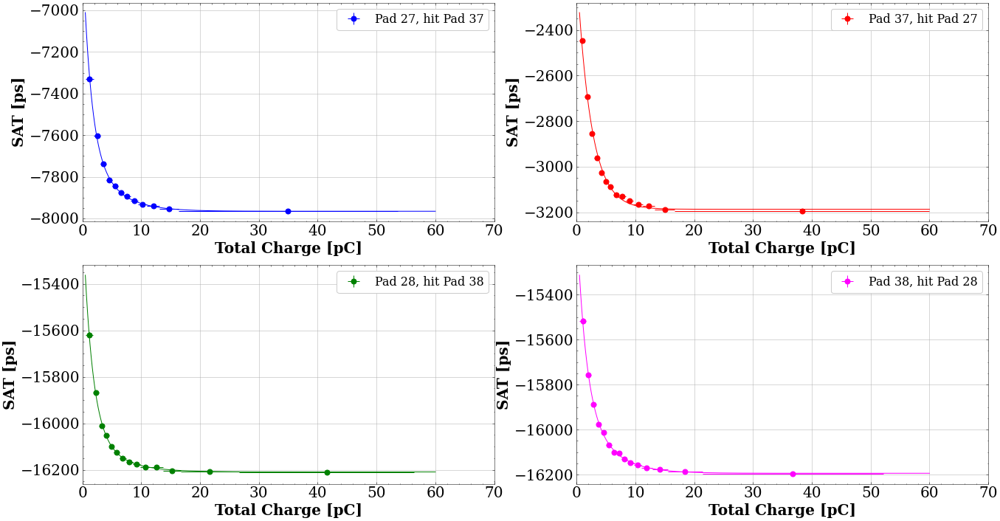

In [147]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

axs[0].errorbar(xxsc12c2_qa[iistart:iistop], mdt1in2c2_qa[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=emdt1in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs[0].plot(a, expo2_np(a, pars1in2c2_qa), color=colors[1])

axs[1].errorbar(xxsc21c2_qa[iistart:iistop], mdt2in1c2_qa[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=emdt2in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs[1].plot(a, expo2_np(a, pars2in1c2_qa), color=colors[0])

axs[2].errorbar(xxsc34c2_qa[iistart:iistop], mdt3in4c2_qa[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=emdt3in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, pars3in4c2_qa), color=colors[3])

axs[3].errorbar(xxsc43c2_qa[iistart:iistop], mdt4in3c2_qa[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=emdt4in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, pars4in3c2_qa), color=colors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)
plt.show()


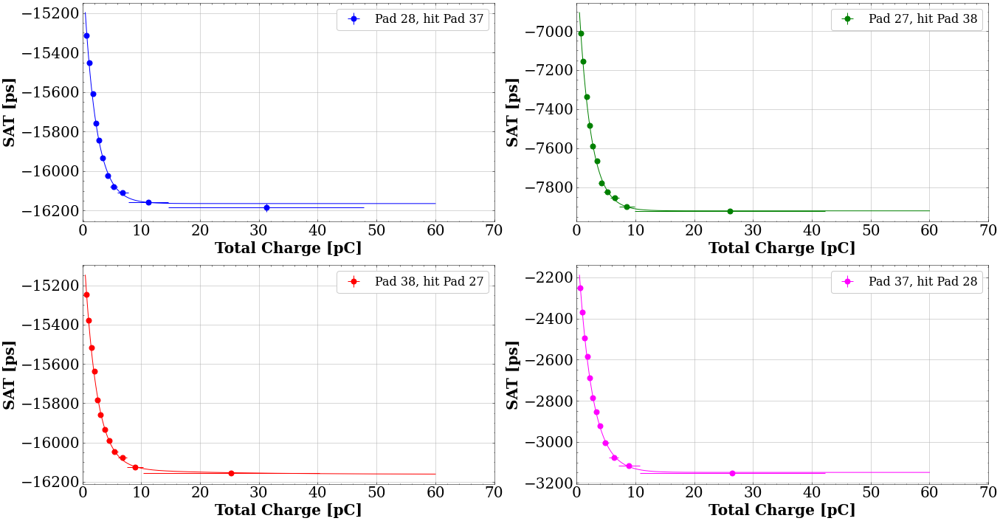

In [148]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

axs[0].errorbar(xxsc32c2_qa[iistart:iistop], mdt3in2c2_qa[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=emdt3in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs[0].plot(a, expo2_np(a, pars3in2c2_qa), color=colors[1])

axs[1].errorbar(xxsc14c2_qa[iistart:iistop], mdt1in4c2_qa[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=emdt1in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')
axs[1].plot(a, expo2_np(a, pars1in4c2_qa), color=colors[3])

axs[2].errorbar(xxsc41c2_qa[iistart:iistop], mdt4in1c2_qa[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=emdt4in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs[2].plot(a, expo2_np(a, pars4in1c2_qa), color=colors[0])

axs[3].errorbar(xxsc23c2_qa[iistart:iistop], mdt2in3c2_qa[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=emdt2in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, pars2in3c2_qa), color=colors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)
plt.show()


In [149]:
qlow = 0.5
qup = 60

nppe = 500


_,_, mdt1in1c2_qa_cor, sdt1in1c2_qa_cor, emdt1in1c2_qa_cor, esdt1in1c2_qa_cor = fff(mm1_qall[xyc2_pad1_qa], dt1[xyc2_pad1_qa]-expo2_np(mm1_qall[xyc2_pad1_qa], pars1in1c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt2in1c2_qa_cor, sdt2in1c2_qa_cor, emdt2in1c2_qa_cor, esdt2in1c2_qa_cor = fff(mm2_qall[xyc2_pad1_qa], dt2[xyc2_pad1_qa]-expo2_np(mm2_qall[xyc2_pad1_qa], pars2in1c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt3in1c2_qa_cor, sdt3in1c2_qa_cor, emdt3in1c2_qa_cor, esdt3in1c2_qa_cor = fff(mm3_qall[xyc2_pad1_qa], dt3[xyc2_pad1_qa]-expo2_np(mm3_qall[xyc2_pad1_qa], pars3in1c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in1c2_qa_cor, sdt4in1c2_qa_cor, emdt4in1c2_qa_cor, esdt4in1c2_qa_cor = fff(mm4_qall[xyc2_pad1_qa], dt4[xyc2_pad1_qa]-expo2_np(mm4_qall[xyc2_pad1_qa], pars4in1c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt1in2c2_qa_cor, sdt1in2c2_qa_cor, emdt1in2c2_qa_cor, esdt1in2c2_qa_cor = fff(mm1_qall[xyc2_pad2_qa], dt1[xyc2_pad2_qa]-expo2_np(mm1_qall[xyc2_pad2_qa], pars1in2c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt2in2c2_qa_cor, sdt2in2c2_qa_cor, emdt2in2c2_qa_cor, esdt2in2c2_qa_cor = fff(mm2_qall[xyc2_pad2_qa], dt2[xyc2_pad2_qa]-expo2_np(mm2_qall[xyc2_pad2_qa], pars2in2c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt3in2c2_qa_cor, sdt3in2c2_qa_cor, emdt3in2c2_qa_cor, esdt3in2c2_qa_cor = fff(mm3_qall[xyc2_pad2_qa], dt3[xyc2_pad2_qa]-expo2_np(mm3_qall[xyc2_pad2_qa], pars3in2c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in2c2_qa_cor, sdt4in2c2_qa_cor, emdt4in2c2_qa_cor, esdt4in2c2_qa_cor = fff(mm4_qall[xyc2_pad2_qa], dt4[xyc2_pad2_qa]-expo2_np(mm4_qall[xyc2_pad2_qa], pars4in2c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt1in3c2_qa_cor, sdt1in3c2_qa_cor, emdt1in3c2_qa_cor, esdt1in3c2_qa_cor = fff(mm1_qall[xyc2_pad3_qa], dt1[xyc2_pad3_qa]-expo2_np(mm1_qall[xyc2_pad3_qa], pars1in3c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt2in3c2_qa_cor, sdt2in3c2_qa_cor, emdt2in3c2_qa_cor, esdt2in3c2_qa_cor = fff(mm2_qall[xyc2_pad3_qa], dt2[xyc2_pad3_qa]-expo2_np(mm2_qall[xyc2_pad3_qa], pars2in3c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt3in3c2_qa_cor, sdt3in3c2_qa_cor, emdt3in3c2_qa_cor, esdt3in3c2_qa_cor = fff(mm3_qall[xyc2_pad3_qa], dt3[xyc2_pad3_qa]-expo2_np(mm3_qall[xyc2_pad3_qa], pars3in3c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in3c2_qa_cor, sdt4in3c2_qa_cor, emdt4in3c2_qa_cor, esdt4in3c2_qa_cor = fff(mm4_qall[xyc2_pad3_qa], dt4[xyc2_pad3_qa]-expo2_np(mm4_qall[xyc2_pad3_qa], pars4in3c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])

_,_, mdt1in4c2_qa_cor, sdt1in4c2_qa_cor, emdt1in4c2_qa_cor, esdt1in4c2_qa_cor = fff(mm1_qall[xyc2_pad4_qa], dt1[xyc2_pad4_qa]-expo2_np(mm1_qall[xyc2_pad4_qa], pars1in4c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt2in4c2_qa_cor, sdt2in4c2_qa_cor, emdt2in4c2_qa_cor, esdt2in4c2_qa_cor = fff(mm2_qall[xyc2_pad4_qa], dt2[xyc2_pad4_qa]-expo2_np(mm2_qall[xyc2_pad4_qa], pars2in4c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt3in4c2_qa_cor, sdt3in4c2_qa_cor, emdt3in4c2_qa_cor, esdt3in4c2_qa_cor = fff(mm3_qall[xyc2_pad4_qa], dt3[xyc2_pad4_qa]-expo2_np(mm3_qall[xyc2_pad4_qa], pars3in4c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])
_,_, mdt4in4c2_qa_cor, sdt4in4c2_qa_cor, emdt4in4c2_qa_cor, esdt4in4c2_qa_cor = fff(mm4_qall[xyc2_pad4_qa], dt4[xyc2_pad4_qa]-expo2_np(mm4_qall[xyc2_pad4_qa], pars4in4c2_qa)*1e-3, qlow, qup, nppe, False, trange=[-5000,5000])


np.min(idt)=-211.7123480016989, np.max(idt)=255.74360853668665, r1=-185.00205580590776, mm=6.3344622462843425, r2=197.67098029847645
16.0330960203471, 1.0732911884525422, 41.341001909738395, 
##################################################
np.min(idt)=-113.57100167213474, np.max(idt)=143.1206951921409, r1=-152.4757950284856, mm=3.911471824518315, r2=160.29873867752224
15.382844073682213, 1.1193976577540499, 36.552121054950696, 
##################################################
np.min(idt)=-86.17704280426253, np.max(idt)=156.49559104621778, r1=-122.91405570439515, mm=3.2597376228789328, r2=129.43353095015303
14.862077340819402, 3.2760176910838776, 29.74816631294982, 
##################################################
np.min(idt)=-114.29543412226906, np.max(idt)=143.54445913290272, r1=-126.5997363245976, mm=2.5882783571461347, r2=131.77629303888986
16.429484675946306, 0.5531360592016027, 29.403608156852986, 
##################################################
np.min(idt)=-105.37454687

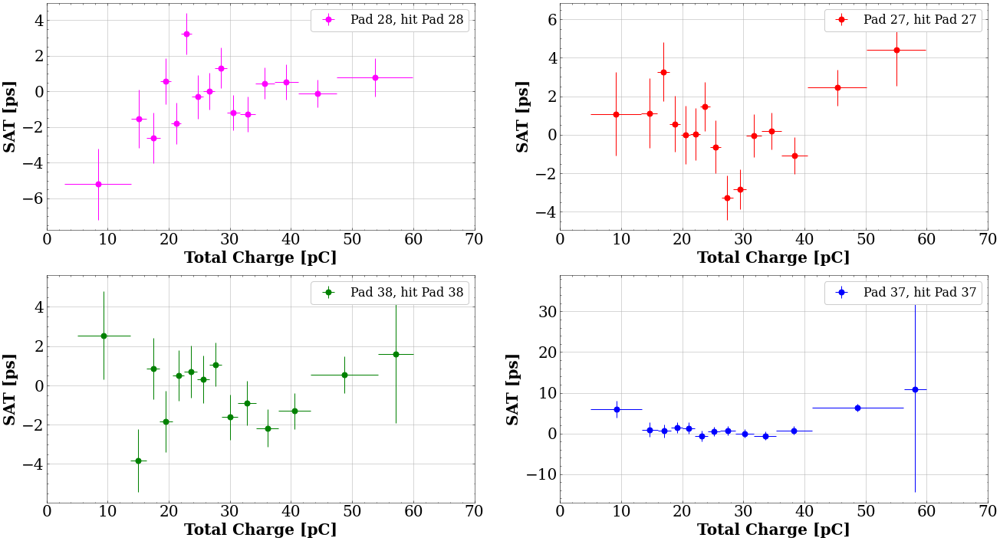

In [150]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

axs[0].errorbar(xxsc33c2_qa[iistart:iistop], mdt3in3c2_qa_cor[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=emdt3in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs[1].errorbar(xxsc11c2_qa[iistart:iistop], mdt1in1c2_qa_cor[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=emdt1in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs[2].errorbar(xxsc44c2_qa[iistart:iistop], mdt4in4c2_qa_cor[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=emdt4in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs[3].errorbar(xxsc22c2_qa[iistart:iistop], mdt2in2c2_qa_cor[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=emdt2in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


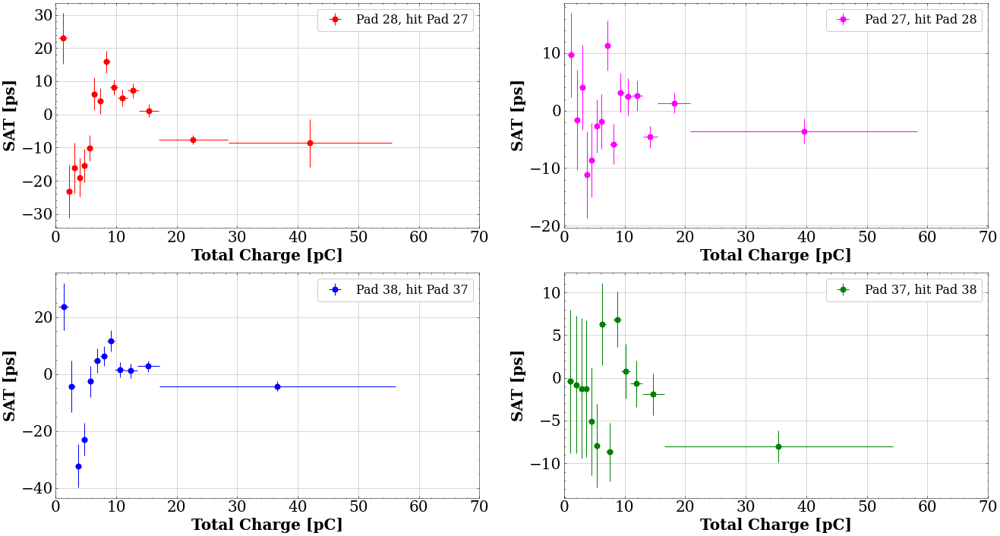

In [151]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

#left-right
axs[0].errorbar(xxsc31c2_qa[iistart:iistop], mdt3in1c2_qa_cor[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=emdt3in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs[1].errorbar(xxsc13c2_qa[iistart:iistop], mdt1in3c2_qa_cor[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=emdt1in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs[2].errorbar(xxsc42c2_qa[iistart:iistop], mdt4in2c2_qa_cor[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=emdt4in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs[3].errorbar(xxsc24c2_qa[iistart:iistop], mdt2in4c2_qa_cor[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=emdt2in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)
plt.show()


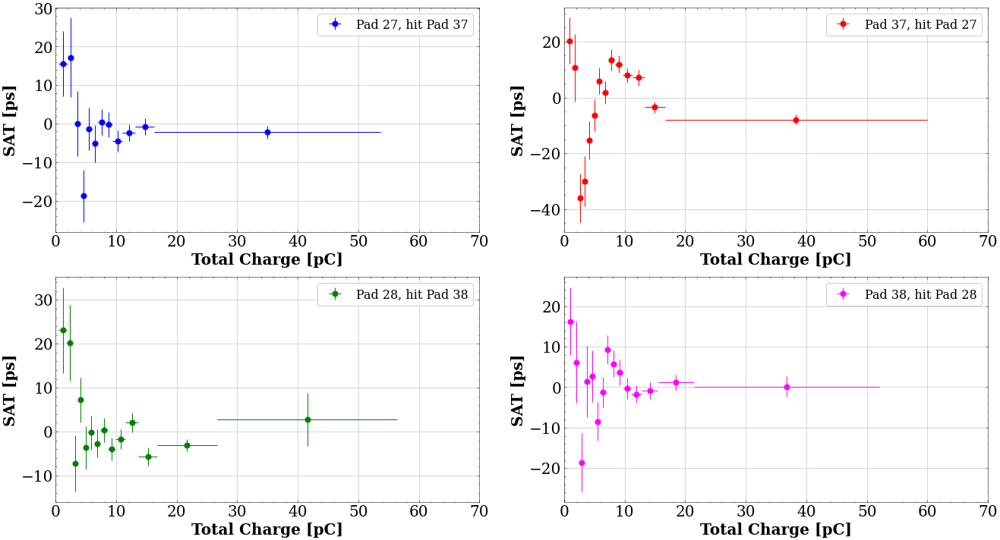

In [152]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()
#up-down
axs[0].errorbar(xxsc12c2_qa[iistart:iistop], mdt1in2c2_qa_cor[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=emdt1in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs[1].errorbar(xxsc21c2_qa[iistart:iistop], mdt2in1c2_qa_cor[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=emdt2in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs[2].errorbar(xxsc34c2_qa[iistart:iistop], mdt3in4c2_qa_cor[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=emdt3in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[3].errorbar(xxsc43c2_qa[iistart:iistop], mdt4in3c2_qa_cor[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=emdt4in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)
plt.show()


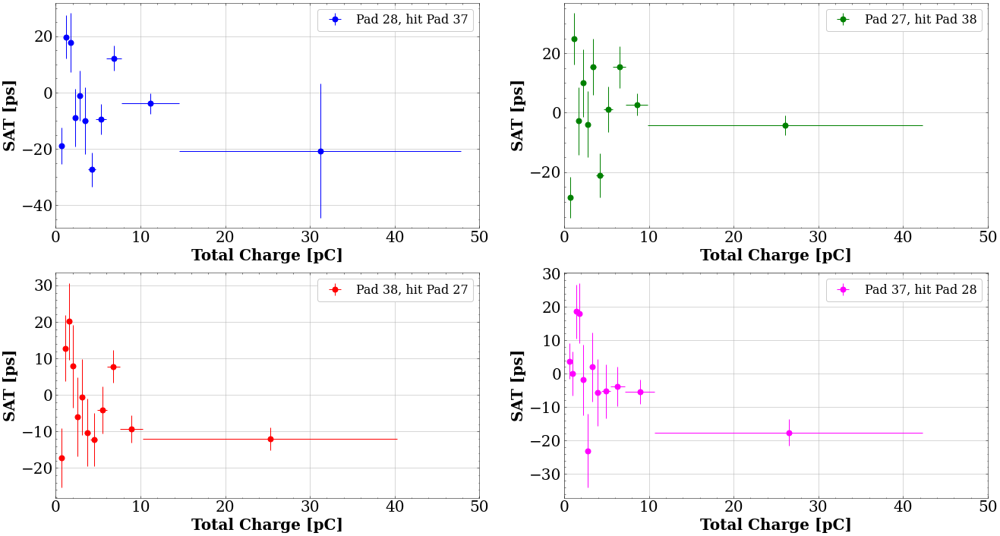

In [153]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()
#diagonal
axs[0].errorbar(xxsc32c2_qa[iistart:iistop], mdt3in2c2_qa_cor[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=emdt3in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs[1].errorbar(xxsc14c2_qa[iistart:iistop], mdt1in4c2_qa_cor[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=emdt1in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')
axs[2].errorbar(xxsc41c2_qa[iistart:iistop], mdt4in1c2_qa_cor[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=emdt4in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs[3].errorbar(xxsc23c2_qa[iistart:iistop], mdt2in3c2_qa_cor[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=emdt2in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 50)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)
plt.show()


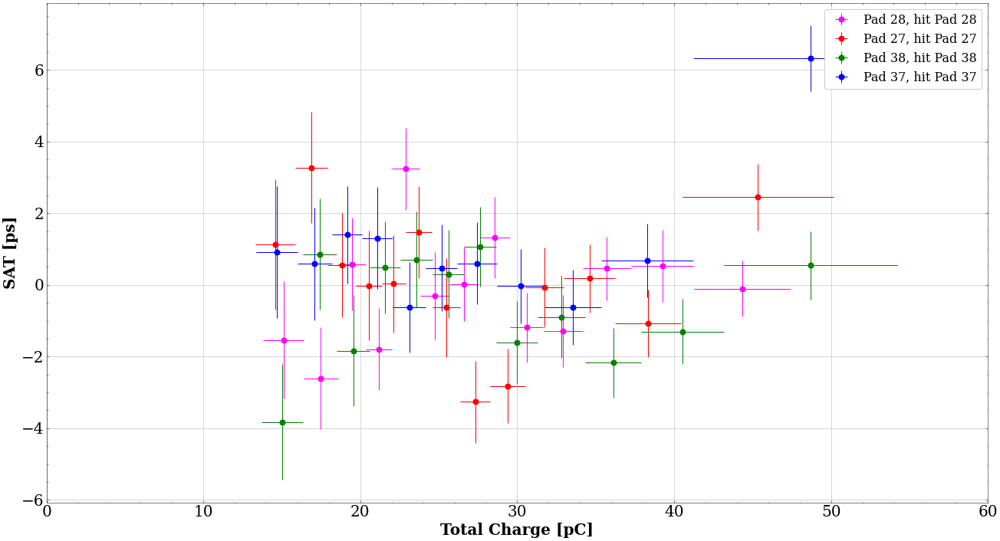

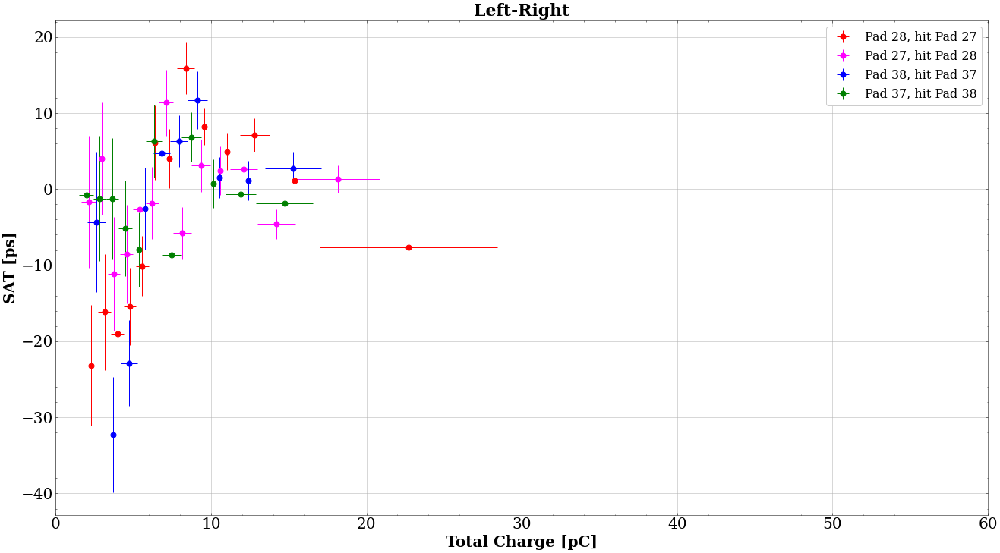

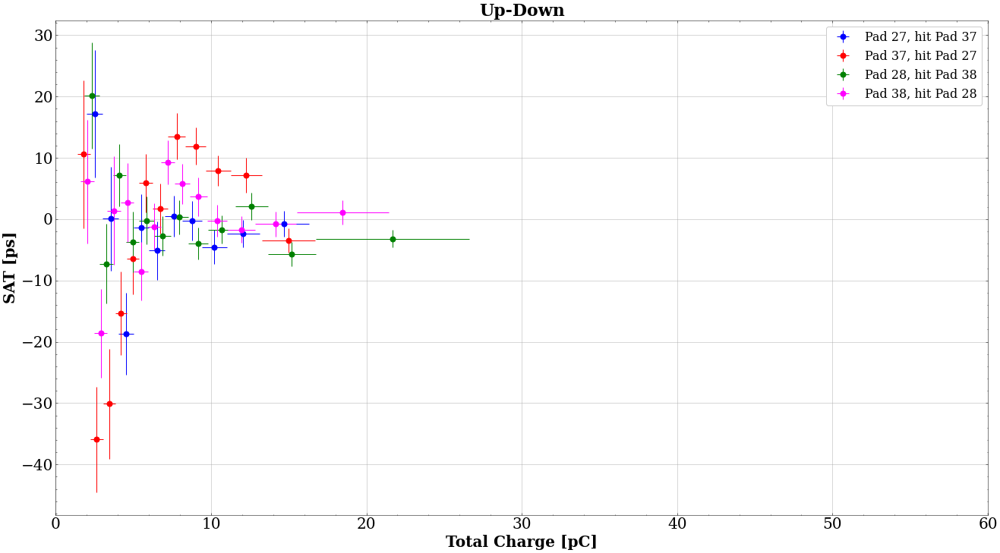

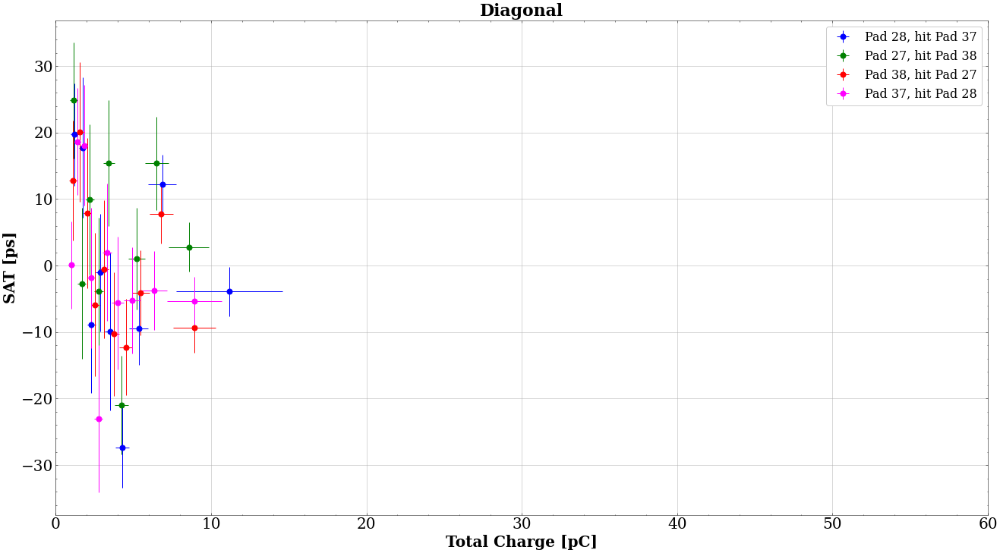

In [154]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

# same
axs.errorbar(xxsc33c2_qa[iistart:iistop], mdt3in3c2_qa_cor[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=emdt3in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs.errorbar(xxsc11c2_qa[iistart:iistop], mdt1in1c2_qa_cor[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=emdt1in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs.errorbar(xxsc44c2_qa[iistart:iistop], mdt4in4c2_qa_cor[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=emdt4in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs.errorbar(xxsc22c2_qa[iistart:iistop], mdt2in2c2_qa_cor[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=emdt2in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

#left-right
axs.errorbar(xxsc31c2_qa[iistart:iistop], mdt3in1c2_qa_cor[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=emdt3in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs.errorbar(xxsc13c2_qa[iistart:iistop], mdt1in3c2_qa_cor[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=emdt1in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs.errorbar(xxsc42c2_qa[iistart:iistop], mdt4in2c2_qa_cor[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=emdt4in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs.errorbar(xxsc24c2_qa[iistart:iistop], mdt2in4c2_qa_cor[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=emdt2in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
axs.set_title('Left-Right')
# axs[0].set_xlim(0, 5)
plt.show()

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc12c2_qa[iistart:iistop], mdt1in2c2_qa_cor[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=emdt1in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs.errorbar(xxsc21c2_qa[iistart:iistop], mdt2in1c2_qa_cor[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=emdt2in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs.errorbar(xxsc34c2_qa[iistart:iistop], mdt3in4c2_qa_cor[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=emdt3in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs.errorbar(xxsc43c2_qa[iistart:iistop], mdt4in3c2_qa_cor[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=emdt4in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
axs.set_title('Up-Down')

# axs[0].set_xlim(0, 5)
plt.show()

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc32c2_qa[iistart:iistop], mdt3in2c2_qa_cor[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=emdt3in2c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs.errorbar(xxsc14c2_qa[iistart:iistop], mdt1in4c2_qa_cor[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=emdt1in4c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')
axs.errorbar(xxsc41c2_qa[iistart:iistop], mdt4in1c2_qa_cor[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=emdt4in1c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs.errorbar(xxsc23c2_qa[iistart:iistop], mdt2in3c2_qa_cor[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=emdt2in3c2_qa_cor[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')

axs.set_title('Diagonal')
axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


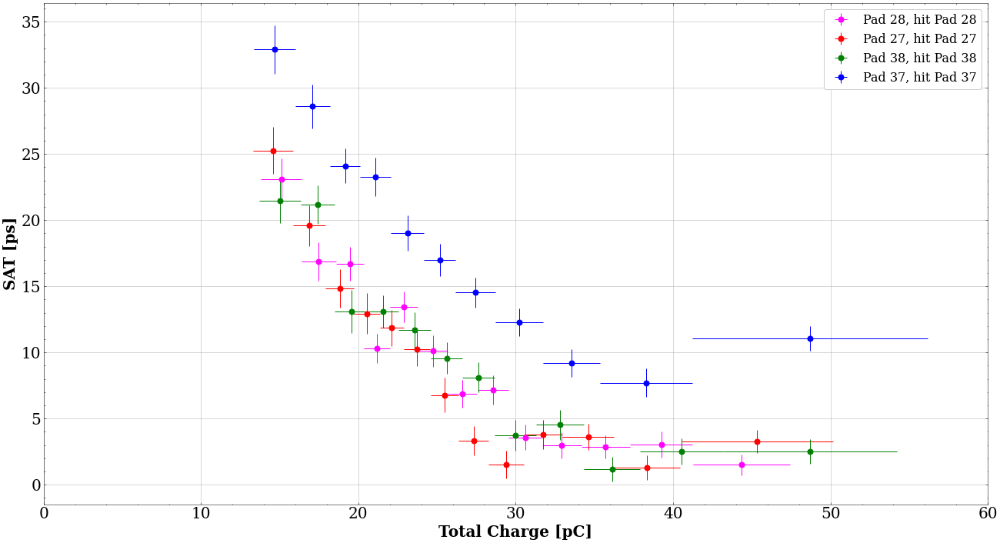

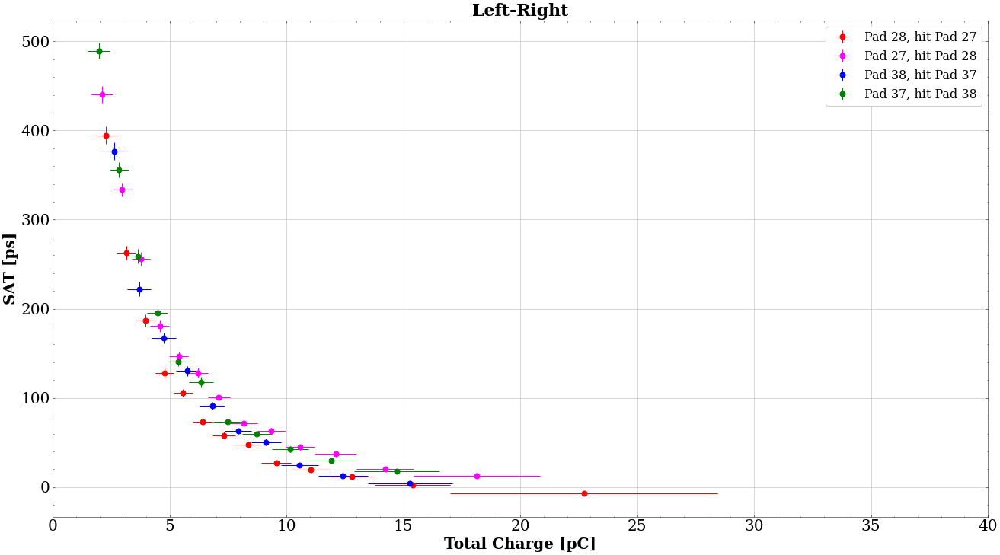

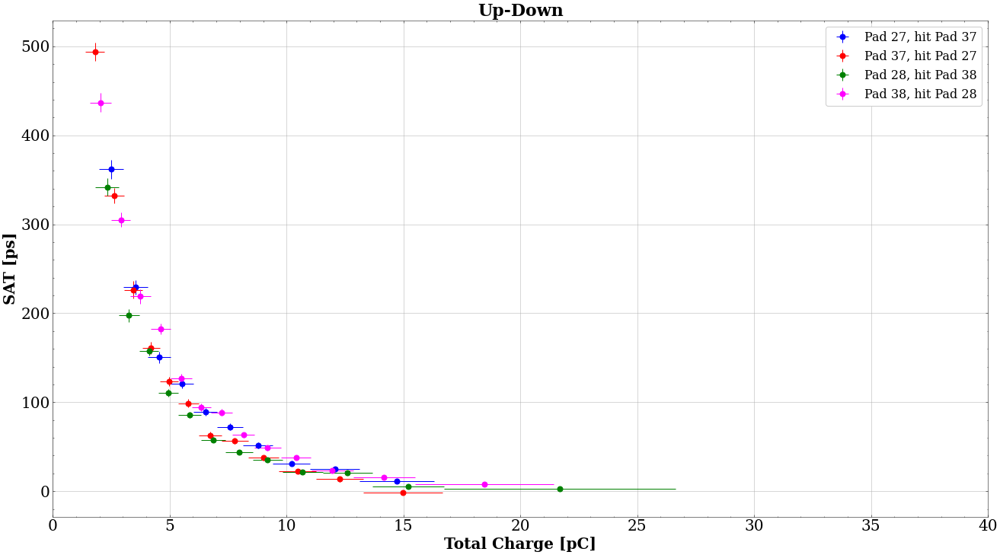

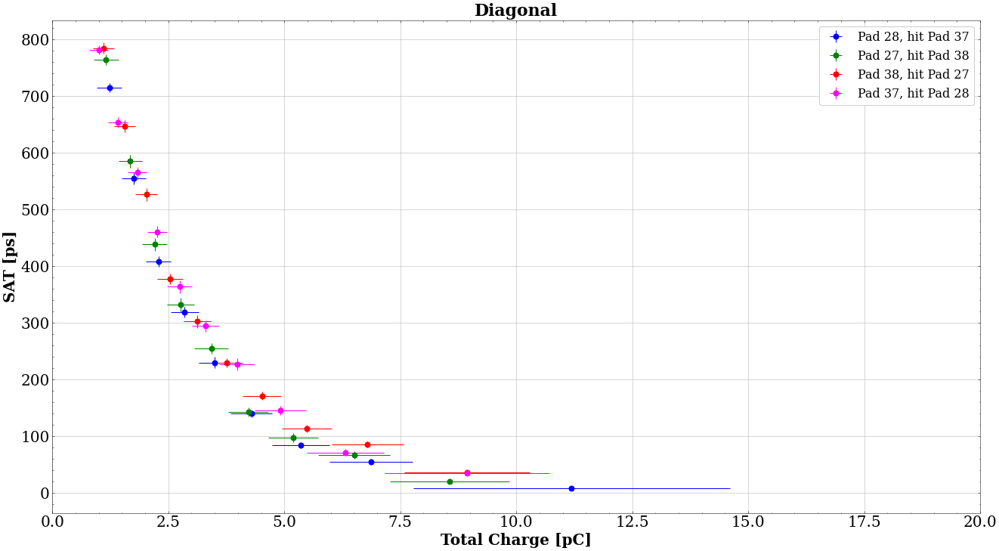

In [155]:

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

# same
axs.errorbar(xxsc33c2_qa[iistart:iistop], mdt3in3c2_qa[iistart:iistop]-pars3in3c2_qa[4], xerr=exsc33c2_qa[iistart:iistop], yerr=emdt3in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs.errorbar(xxsc11c2_qa[iistart:iistop], mdt1in1c2_qa[iistart:iistop]-pars1in1c2_qa[4], xerr=exsc11c2_qa[iistart:iistop], yerr=emdt1in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs.errorbar(xxsc44c2_qa[iistart:iistop], mdt4in4c2_qa[iistart:iistop]-pars4in4c2_qa[4], xerr=exsc44c2_qa[iistart:iistop], yerr=emdt4in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs.errorbar(xxsc22c2_qa[iistart:iistop], mdt2in2c2_qa[iistart:iistop]-pars2in2c2_qa[4], xerr=exsc22c2_qa[iistart:iistop], yerr=emdt2in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)

axs.set_xlim(0, 60)
plt.show()

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

#left-right
axs.errorbar(xxsc31c2_qa[iistart:iistop], mdt3in1c2_qa[iistart:iistop]-pars3in1c2_qa[4], xerr=exsc31c2_qa[iistart:iistop], yerr=emdt3in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs.errorbar(xxsc13c2_qa[iistart:iistop], mdt1in3c2_qa[iistart:iistop]-pars1in3c2_qa[4], xerr=exsc13c2_qa[iistart:iistop], yerr=emdt1in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs.errorbar(xxsc42c2_qa[iistart:iistop], mdt4in2c2_qa[iistart:iistop]-pars4in2c2_qa[4], xerr=exsc42c2_qa[iistart:iistop], yerr=emdt4in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs.errorbar(xxsc24c2_qa[iistart:iistop], mdt2in4c2_qa[iistart:iistop]-pars2in4c2_qa[4], xerr=exsc24c2_qa[iistart:iistop], yerr=emdt2in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
axs.set_title('Left-Right')
axs.set_xlim(0, 40)
plt.show()

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc12c2_qa[iistart:iistop], mdt1in2c2_qa[iistart:iistop]-pars1in2c2_qa[4], xerr=exsc12c2_qa[iistart:iistop], yerr=emdt1in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs.errorbar(xxsc21c2_qa[iistart:iistop], mdt2in1c2_qa[iistart:iistop]-pars2in1c2_qa[4], xerr=exsc21c2_qa[iistart:iistop], yerr=emdt2in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs.errorbar(xxsc34c2_qa[iistart:iistop], mdt3in4c2_qa[iistart:iistop]-pars3in4c2_qa[4], xerr=exsc34c2_qa[iistart:iistop], yerr=emdt3in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs.errorbar(xxsc43c2_qa[iistart:iistop], mdt4in3c2_qa[iistart:iistop]-pars4in3c2_qa[4], xerr=exsc43c2_qa[iistart:iistop], yerr=emdt4in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')

axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)
axs.set_title('Up-Down')

axs.set_xlim(0, 40)
plt.show()

fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1


axs.errorbar(xxsc32c2_qa[iistart:iistop], mdt3in2c2_qa[iistart:iistop]-pars3in2c2_qa[4], xerr=exsc32c2_qa[iistart:iistop], yerr=emdt3in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs.errorbar(xxsc14c2_qa[iistart:iistop], mdt1in4c2_qa[iistart:iistop]-pars1in4c2_qa[4], xerr=exsc14c2_qa[iistart:iistop], yerr=emdt1in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')
axs.errorbar(xxsc41c2_qa[iistart:iistop], mdt4in1c2_qa[iistart:iistop]-pars4in1c2_qa[4], xerr=exsc41c2_qa[iistart:iistop], yerr=emdt4in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs.errorbar(xxsc23c2_qa[iistart:iistop], mdt2in3c2_qa[iistart:iistop]-pars2in3c2_qa[4], xerr=exsc23c2_qa[iistart:iistop], yerr=emdt2in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')

axs.set_title('Diagonal')
axs.grid()
axs.set_xlim(0, qup)
#     axs[i].set_ylim(0, 100)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('SAT [ps]')
axs.legend(loc=1)

axs.set_xlim(0, 20)
plt.show()


Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 12.6377594885759734
Edm   = 2.56066561518179381e-06
Nfcn  = 420
Par_0	  = -0.0662591	 +/-  0.89187
Par_1	  = -2.51705	 +/-  212.739
Par_2	  = -0.0652732	 +/-  0.00612349
Par_3	  = 3.90186	 +/-  0.296577
Par_4	  = 15.0974	 +/-  0.873493
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 1
FVAL  = 17.9311806378630934
Edm   = 3.78375556195560662e-06
Nfcn  = 2956
Par_0	  = -0.0024825	 +/-  0.00142646
Par_1	  = 4.52081	 +/-  0.114312
Par_2	  = -0.288157	 +/-  0.0202795
Par_3	  = 5.64847	 +/-  0.0574594
Par_4	  = -51.3237	 +/-  10.4541
Minuit2Minimizer: Minimize with max-calls 100000 convergence for edm < 0.01 strategy 1
Minuit2Minimizer : Valid minimum - status = 0
FVAL  = 18.0062198905347586
Edm   = 4.97954211577918214e-06
Nfcn  = 634
Par_0	  = -0.119546	 +/-  0.0442226
Pa

Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 204.881 > 0
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.00253628
Warning in <Minuit2>: VariableMetricBuilder gdel = -1081.76
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.0299015
Warning in <Minuit2>: Minuit2Minimizer::Minimize Covar was made pos def
Warning in <Minuit2>: MnPosDef Matrix forced pos-def by adding to diagonal 0.00364555
Warning in <Minuit2>: Minuit2Minimizer::Minimize Covar was made pos def
Warning in <Minuit2>: DavidonErrorUpdator delgam < 0 : first derivatives increasing along search line
Warning in <Minuit2>: VariableMetricBuilder Matrix not pos.def, gdel = 2.3742e+10 > 0
Warning in <Minuit2>: MnPosDef non-positive diagonal element in covariance matrix[ 2 ] = -5.36109e-14
Warning in <Minuit2>: MnPosDef Added to diagonal of Error matrix

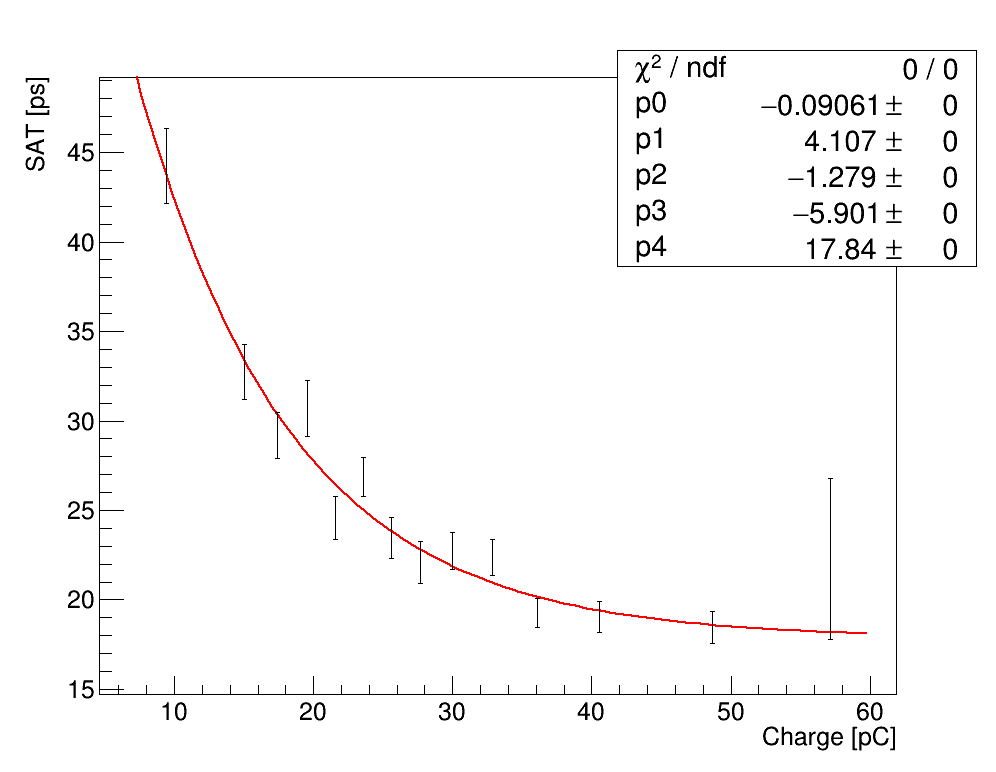

In [156]:
spars1in1c2_qa = sat_fit(xxsc11c2_qa, sdt1in1c2_qa, exsc11c2_qa, esdt1in1c2_qa, iistart=0, iistop=None, xl=5.0, xu=60, pars=[-0.1,2.0,-1,0.5,40])
spars2in1c2_qa = sat_fit(xxsc21c2_qa, sdt2in1c2_qa, exsc11c2_qa, esdt2in1c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
spars3in1c2_qa = sat_fit(xxsc31c2_qa, sdt3in1c2_qa, exsc11c2_qa, esdt3in1c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
spars4in1c2_qa = sat_fit(xxsc41c2_qa, sdt4in1c2_qa, exsc11c2_qa, esdt4in1c2_qa, iistart=2, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,10])

spars1in2c2_qa = sat_fit(xxsc12c2_qa, sdt1in2c2_qa, exsc12c2_qa, esdt1in2c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
spars2in2c2_qa = sat_fit(xxsc22c2_qa, sdt2in2c2_qa, exsc22c2_qa, esdt2in2c2_qa, iistart=0, iistop=-1, xl=0.5, xu=60, pars=[-0.1,5.0,-1,0.5,40])
spars3in2c2_qa = sat_fit(xxsc32c2_qa, sdt3in2c2_qa, exsc32c2_qa, esdt3in2c2_qa, iistart=1, iistop=-1, xl=0.5, xu=40, pars=[-0.1,0.5,-1,0.5,40])
spars4in2c2_qa = sat_fit(xxsc42c2_qa, sdt4in2c2_qa, exsc42c2_qa, esdt4in2c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])

spars1in3c2_qa = sat_fit(xxsc13c2_qa, sdt1in3c2_qa, exsc13c2_qa, esdt1in3c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,1.0,-1,0.5,40])
spars2in3c2_qa = sat_fit(xxsc23c2_qa, sdt2in3c2_qa, exsc23c2_qa, esdt2in3c2_qa, iistart=3, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
spars3in3c2_qa = sat_fit(xxsc33c2_qa, sdt3in3c2_qa, exsc33c2_qa, esdt3in3c2_qa, iistart=0, iistop=None, xl=5.0, xu=60, pars=[-0.1,2.0,-1,0.5,40])
spars4in3c2_qa = sat_fit(xxsc43c2_qa, sdt4in3c2_qa, exsc43c2_qa, esdt4in3c2_qa, iistart=1, iistop=None, xl=0.5, xu=50, pars=[-0.1,1.0,-1,0.5,40])

spars1in4c2_qa = sat_fit(xxsc14c2_qa, sdt1in4c2_qa, exsc14c2_qa, esdt1in4c2_qa, iistart=3, iistop=None, xl=0.5, xu=40, pars=[-0.1,2.0,-1,0.5,40])
spars2in4c2_qa = sat_fit(xxsc24c2_qa, sdt2in4c2_qa, exsc24c2_qa, esdt2in4c2_qa, iistart=1, iistop=None, xl=0.5, xu=40, pars=[-0.1,3.0,-1,0.5,40])
spars3in4c2_qa = sat_fit(xxsc34c2_qa, sdt3in4c2_qa, exsc34c2_qa, esdt3in4c2_qa, iistart=1, iistop=None, xl=0.5, xu=50, pars=[-0.1,1.0,-1,0.5,40])
spars4in4c2_qa = sat_fit(xxsc44c2_qa, sdt4in4c2_qa, exsc44c2_qa, esdt4in4c2_qa, iistart=0, iistop=None, xl=0.5, xu=60, pars=[-0.1,3.0,-1,0.5,40])

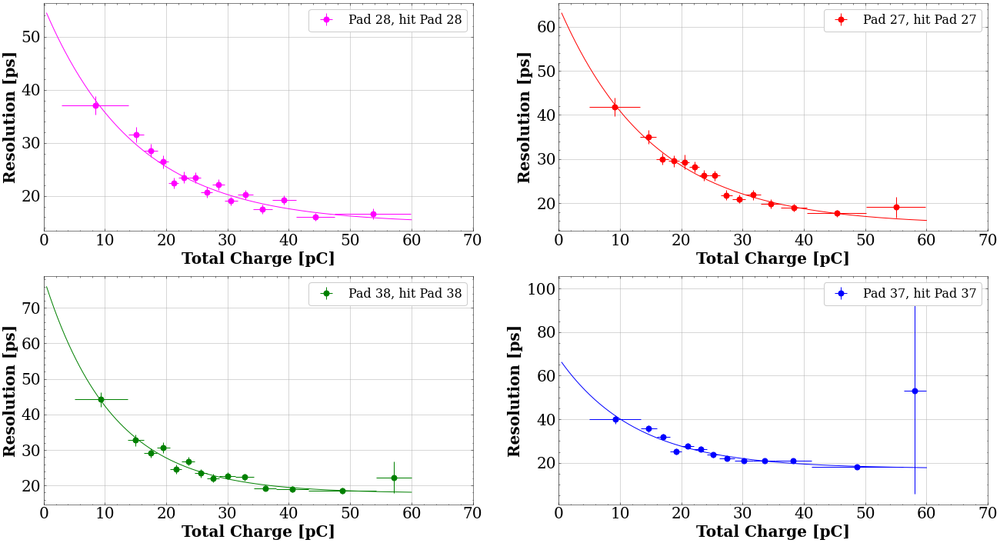

In [157]:
#same
fig, axs = plt.subplots(2, 2, figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

axs[0].errorbar(xxsc33c2_qa[iistart:iistop], sdt3in3c2_qa[iistart:iistop], xerr=exsc33c2_qa[iistart:iistop], yerr=esdt3in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}, hit {pnames[2]}')
axs[0].plot(a, expo2_np(a, spars3in3c2_qa), color=colors[2])

axs[1].errorbar(xxsc11c2_qa[iistart:iistop], sdt1in1c2_qa[iistart:iistop], xerr=exsc11c2_qa[iistart:iistop], yerr=esdt1in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}, hit {pnames[0]}')
axs[1].plot(a, expo2_np(a, spars1in1c2_qa), color=colors[0])

axs[2].errorbar(xxsc44c2_qa[iistart:iistop], sdt4in4c2_qa[iistart:iistop], xerr=exsc44c2_qa[iistart:iistop], yerr=esdt4in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, spars4in4c2_qa), color=colors[3])

axs[3].errorbar(xxsc22c2_qa[iistart:iistop], sdt2in2c2_qa[iistart:iistop], xerr=exsc22c2_qa[iistart:iistop], yerr=esdt2in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}, hit {pnames[1]}')
axs[3].plot(a, expo2_np(a, spars2in2c2_qa), color=colors[1])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


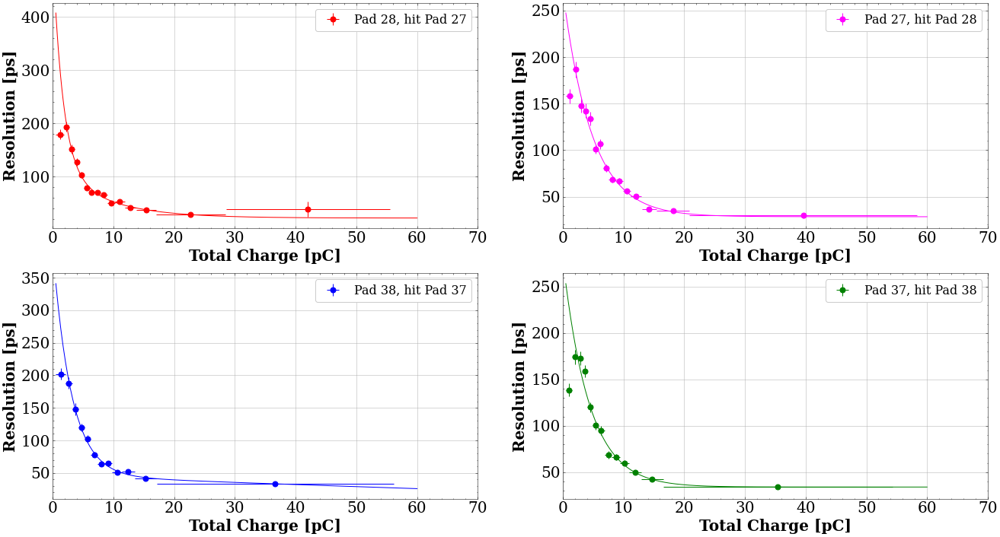

In [158]:
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

#left-right
axs[0].errorbar(xxsc31c2_qa[iistart:iistop], sdt3in1c2_qa[iistart:iistop], xerr=exsc31c2_qa[iistart:iistop], yerr=esdt3in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[2]}, hit {pnames[0]}')
axs[0].plot(a, expo2_np(a, spars3in1c2_qa), color=colors[0])

axs[1].errorbar(xxsc13c2_qa[iistart:iistop], sdt1in3c2_qa[iistart:iistop], xerr=exsc13c2_qa[iistart:iistop], yerr=esdt1in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[0]}, hit {pnames[2]}')
axs[1].plot(a, expo2_np(a, spars1in3c2_qa), color=colors[2])

axs[2].errorbar(xxsc42c2_qa[iistart:iistop], sdt4in2c2_qa[iistart:iistop], xerr=exsc42c2_qa[iistart:iistop], yerr=esdt4in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[3]}, hit {pnames[1]}')
axs[2].plot(a, expo2_np(a, spars4in2c2_qa), color=colors[1])

axs[3].errorbar(xxsc24c2_qa[iistart:iistop], sdt2in4c2_qa[iistart:iistop], xerr=exsc24c2_qa[iistart:iistop], yerr=esdt2in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[1]}, hit {pnames[3]}')
axs[3].plot(a, expo2_np(a, spars2in4c2_qa), color=colors[3])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)
plt.show()


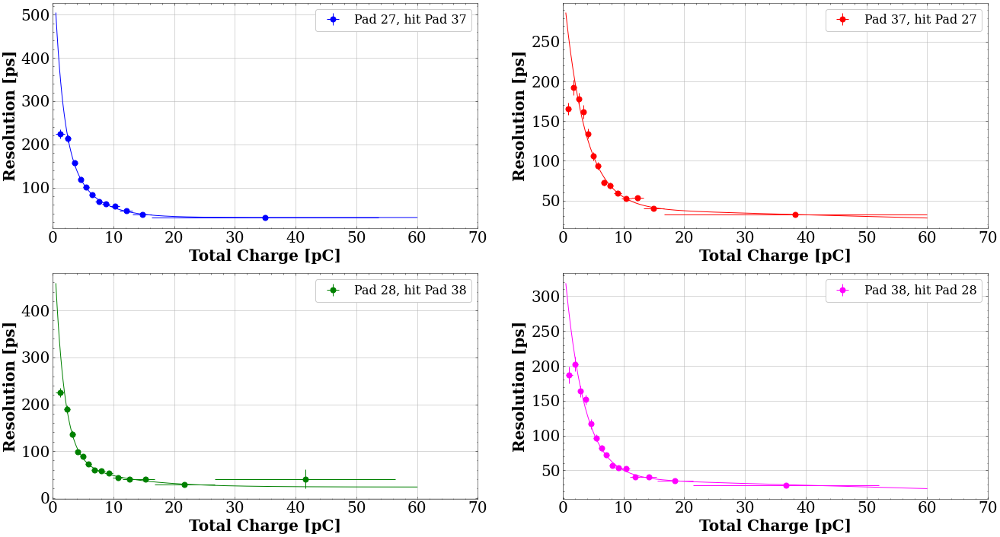

In [159]:
# up-down
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 60, 300)

axs[0].errorbar(xxsc12c2_qa[iistart:iistop], sdt1in2c2_qa[iistart:iistop], xerr=exsc12c2_qa[iistart:iistop], yerr=esdt1in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[0]}, hit {pnames[1]}')
axs[0].plot(a, expo2_np(a, spars1in2c2_qa), color=colors[1])

axs[1].errorbar(xxsc21c2_qa[iistart:iistop], sdt2in1c2_qa[iistart:iistop], xerr=exsc21c2_qa[iistart:iistop], yerr=esdt2in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[1]}, hit {pnames[0]}')
axs[1].plot(a, expo2_np(a, spars2in1c2_qa), color=colors[0])

axs[2].errorbar(xxsc34c2_qa[iistart:iistop], sdt3in4c2_qa[iistart:iistop], xerr=exsc34c2_qa[iistart:iistop], yerr=esdt3in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[2]}, hit {pnames[3]}')
axs[2].plot(a, expo2_np(a, spars3in4c2_qa), color=colors[3])

axs[3].errorbar(xxsc43c2_qa[iistart:iistop], sdt4in3c2_qa[iistart:iistop], xerr=exsc43c2_qa[iistart:iistop], yerr=esdt4in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[3]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, spars4in3c2_qa), color=colors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)
plt.show()


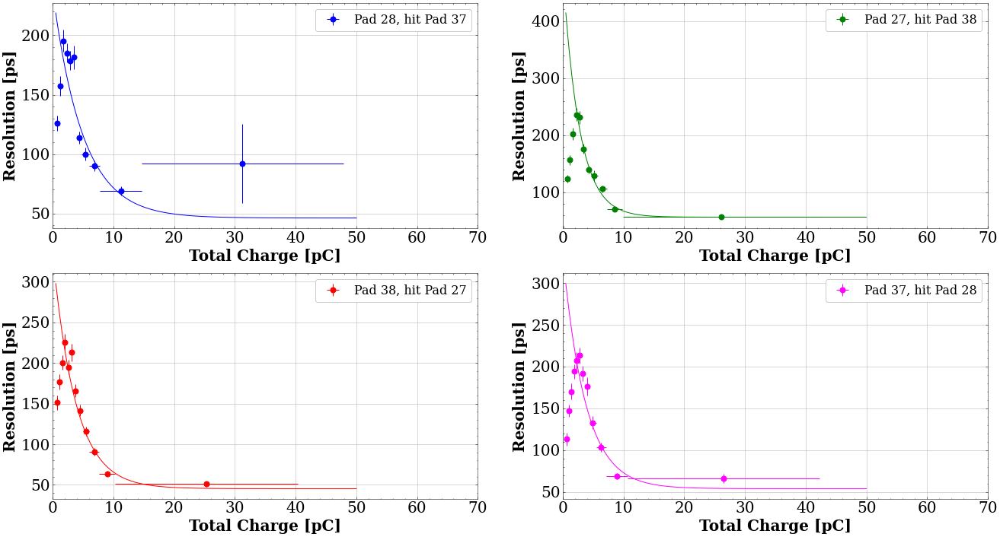

In [160]:
# diagonal
fig, axs = plt.subplots(2,2,figsize=(22, 12))
iistart, iistop = 0, None
axs = axs.ravel()

a = np.linspace(0.5, 50, 300)

axs[0].errorbar(xxsc32c2_qa[iistart:iistop], sdt3in2c2_qa[iistart:iistop], xerr=exsc32c2_qa[iistart:iistop], yerr=esdt3in2c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[2]}, hit {pnames[1]}')
axs[0].plot(a, expo2_np(a, spars3in2c2_qa), color=colors[1])

axs[1].errorbar(xxsc14c2_qa[iistart:iistop], sdt1in4c2_qa[iistart:iistop], xerr=exsc14c2_qa[iistart:iistop], yerr=esdt1in4c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[0]}, hit {pnames[3]}')
axs[1].plot(a, expo2_np(a, spars1in4c2_qa), color=colors[3])

axs[2].errorbar(xxsc41c2_qa[iistart:iistop], sdt4in1c2_qa[iistart:iistop], xerr=exsc41c2_qa[iistart:iistop], yerr=esdt4in1c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[3]}, hit {pnames[0]}')
axs[2].plot(a, expo2_np(a, spars4in1c2_qa), color=colors[0])

axs[3].errorbar(xxsc23c2_qa[iistart:iistop], sdt2in3c2_qa[iistart:iistop], xerr=exsc23c2_qa[iistart:iistop], yerr=esdt2in3c2_qa[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[1]}, hit {pnames[2]}')
axs[3].plot(a, expo2_np(a, spars2in3c2_qa), color=colors[2])

for i in range(4):
    axs[i].grid()
    axs[i].set_xlim(0, 70)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)
plt.show()


# Whole Pad

In [161]:
distance_wxy = 4.82

xy_wpad1 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][0]) < distance_wxy, np.abs(y_s-centers_s[1][0]) < distance_wxy), mm_cuts[0])
xy_wpad2 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][1]) < distance_wxy, np.abs(y_s-centers_s[1][1]) < distance_wxy), mm_cuts[1])
xy_wpad3 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][2]) < distance_wxy, np.abs(y_s-centers_s[1][2]) < distance_wxy), mm_cuts[2])
xy_wpad4 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][3]) < distance_wxy, np.abs(y_s-centers_s[1][3]) < distance_wxy), mm_cuts[3])
xy_wpad5 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][4]) < distance_wxy, np.abs(y_s-centers_s[1][4]) < distance_wxy), mm_cuts[4])
xy_wpad6 = np.logical_and(np.logical_and(np.abs(x_s-centers_s[0][5]) < distance_wxy, np.abs(y_s-centers_s[1][5]) < distance_wxy), mm_cuts[5])

xy_wpads = [ xy_wpad1, xy_wpad2, xy_wpad3, xy_wpad4, xy_wpad5, xy_wpad6 ]

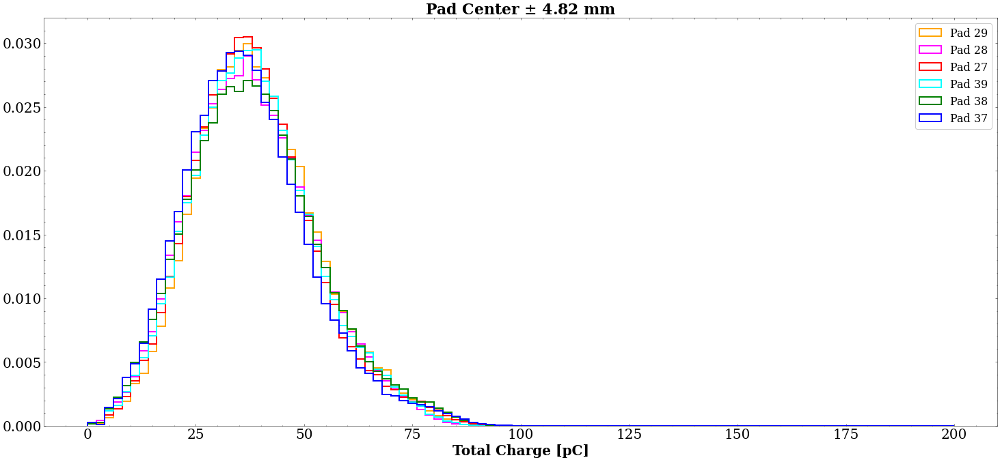

In [162]:
fig, axs = plt.subplots(figsize=(25, 11))
qrange = 200

for i,j in enumerate(pad_order):
    axs.hist(mm_qalls[j][xy_wpads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[j], lw=2, label=pnames[j], density=True)

axs.set_title(f'Pad Center $\pm$ {distance_wxy} mm')
axs.legend()
# axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

In [163]:

qlow = 0.5
qup = 100

nppe = 1000


vl1w, vu1w, mdt1w, sdt1w, emdt1w, esdt1w = fff(mm1_qall[xy_wpad1], dt1[xy_wpad1], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2w, vu2w, mdt2w, sdt2w, emdt2w, esdt2w = fff(mm2_qall[xy_wpad2], dt2[xy_wpad2], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3w, vu3w, mdt3w, sdt3w, emdt3w, esdt3w = fff(mm3_qall[xy_wpad3], dt3[xy_wpad3], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4w, vu4w, mdt4w, sdt4w, emdt4w, esdt4w = fff(mm4_qall[xy_wpad4], dt4[xy_wpad4], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5w, vu5w, mdt5w, sdt5w, emdt5w, esdt5w = fff(mm5_qall[xy_wpad5], dt5[xy_wpad5], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6w, vu6w, mdt6w, sdt6w, emdt6w, esdt6w = fff(mm6_qall[xy_wpad6], dt6[xy_wpad6], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


xxs1w = (vl1w+vu1w)*0.5
exs1w = (vl1w-vu1w)*0.5

xxs2w = (vl2w+vu2w)*0.5
exs2w = (vl2w-vu2w)*0.5

xxs3w = (vl3w+vu3w)*0.5
exs3w = (vl3w-vu3w)*0.5

xxs4w = (vl4w+vu4w)*0.5
exs4w = (vl4w-vu4w)*0.5

xxs5w = (vl5w+vu5w)*0.5
exs5w = (vl5w-vu5w)*0.5

xxs6w = (vl6w+vu6w)*0.5
exs6w = (vl6w-vu6w)*0.5


np.min(idt)=-8148.112092397185, np.max(idt)=-7162.355999006394, r1=-8209.932568948812, mm=-7934.898930415814, r2=-7659.865291882815
37.116169424256604, -7943.16134979081, 52.75043603388634, 
##################################################
np.min(idt)=-8095.163782437481, np.max(idt)=-7738.141101773579, r1=-8140.190006067339, mm=-7966.583444939731, r2=-7792.976883812123
33.75904221093372, -7969.477691642604, 38.00277747375774, 
##################################################
np.min(idt)=-8082.462362722879, np.max(idt)=-7687.081008914618, r1=-8131.273881982422, mm=-7977.049046249656, r2=-7822.824210516891
36.328071799118725, -7980.775468710346, 31.722213023725725, 
##################################################
np.min(idt)=-8124.800565985141, np.max(idt)=-7811.362432006177, r1=-8116.05177142057, mm=-7982.174378728745, r2=-7848.29698603692
32.659380920203375, -7984.103601896334, 30.908606695077644, 
##################################################
np.min(idt)=-8099.896811555453

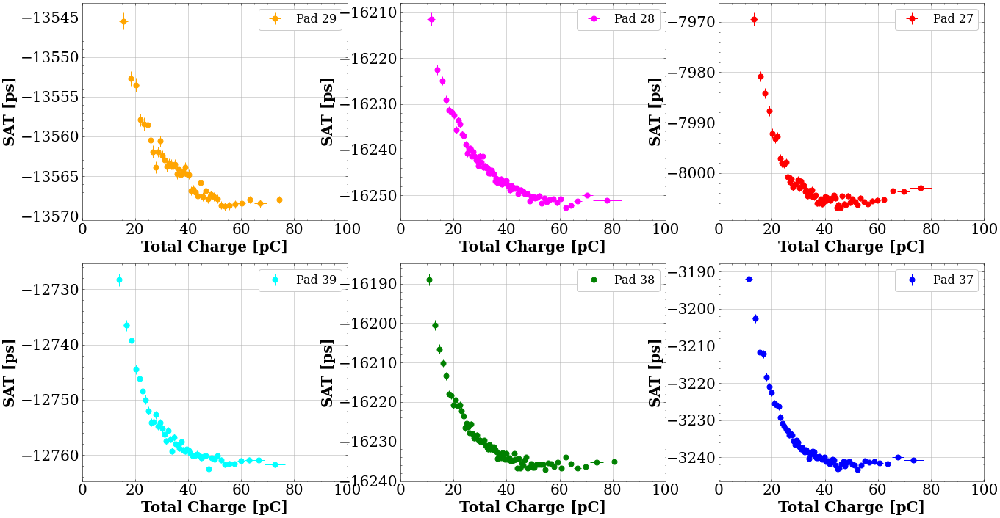

In [164]:
fig, axs = plt.subplots(2, 3, figsize=(22, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxs5w[iistart:iistop], mdt5w[iistart:iistop], xerr=exs5w[iistart:iistop], yerr=emdt5w[iistart:iistop], fmt='o', ms=7, color=colors[4], label=f'{pnames[4]}')
axs[1].errorbar(xxs3w[iistart:iistop], mdt3w[iistart:iistop], xerr=exs3w[iistart:iistop], yerr=emdt3w[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}')
axs[2].errorbar(xxs1w[iistart:iistop], mdt1w[iistart:iistop], xerr=exs1w[iistart:iistop], yerr=emdt1w[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}')
axs[3].errorbar(xxs6w[iistart:iistop], mdt6w[iistart:iistop], xerr=exs6w[iistart:iistop], yerr=emdt6w[iistart:iistop], fmt='o', ms=7, color=colors[5], label=f'{pnames[5]}')
axs[4].errorbar(xxs4w[iistart:iistop], mdt4w[iistart:iistop], xerr=exs4w[iistart:iistop], yerr=emdt4w[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}')
axs[5].errorbar(xxs2w[iistart:iistop], mdt2w[iistart:iistop], xerr=exs2w[iistart:iistop], yerr=emdt2w[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}')



for i in range(NPADS):
    axs[i].grid()
    axs[i].set_xlim(0, qup)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


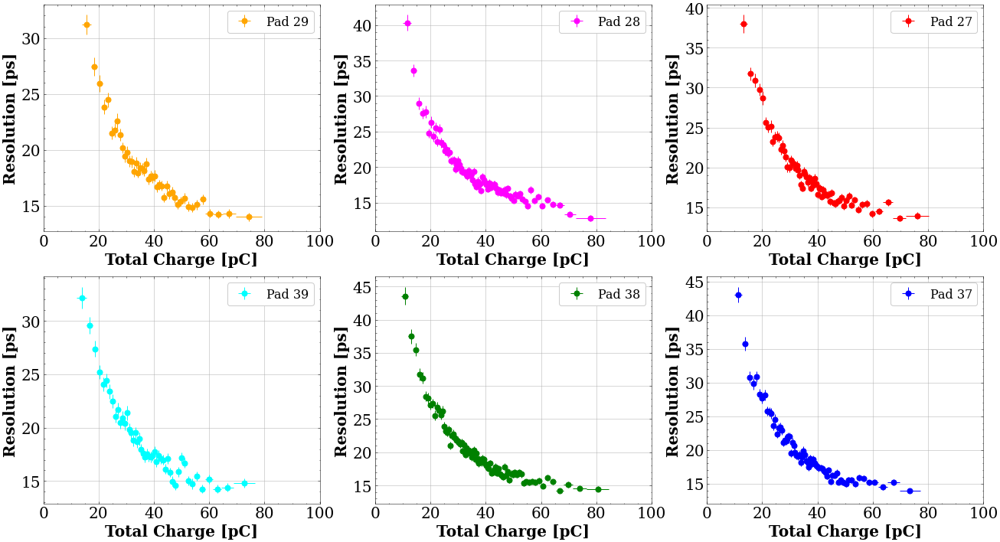

In [165]:
fig, axs = plt.subplots(2, 3, figsize=(22, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxs5w[iistart:iistop], sdt5w[iistart:iistop], xerr=exs5w[iistart:iistop], yerr=esdt5w[iistart:iistop], fmt='o', ms=7, color=colors[4], label=f'{pnames[4]}')
axs[1].errorbar(xxs3w[iistart:iistop], sdt3w[iistart:iistop], xerr=exs3w[iistart:iistop], yerr=esdt3w[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}')
axs[2].errorbar(xxs1w[iistart:iistop], sdt1w[iistart:iistop], xerr=exs1w[iistart:iistop], yerr=esdt1w[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}')
axs[3].errorbar(xxs6w[iistart:iistop], sdt6w[iistart:iistop], xerr=exs6w[iistart:iistop], yerr=esdt6w[iistart:iistop], fmt='o', ms=7, color=colors[5], label=f'{pnames[5]}')
axs[4].errorbar(xxs4w[iistart:iistop], sdt4w[iistart:iistop], xerr=exs4w[iistart:iistop], yerr=esdt4w[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}')
axs[5].errorbar(xxs2w[iistart:iistop], sdt2w[iistart:iistop], xerr=exs2w[iistart:iistop], yerr=esdt2w[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}')



for i in range(NPADS):
    axs[i].grid()
    axs[i].set_xlim(0, qup)
    axs[i].set_xlabel('Total Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


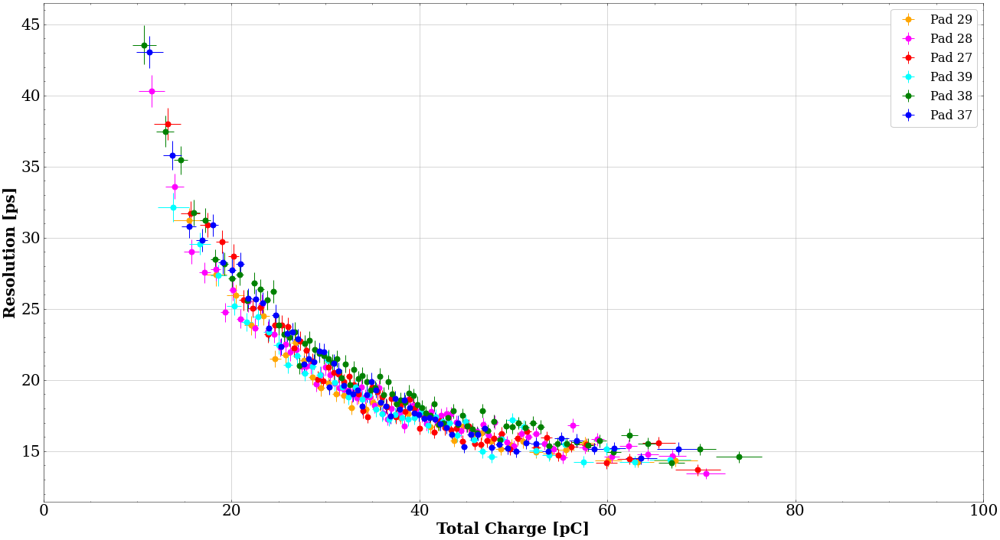

In [166]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -2

axs.errorbar(xxs5w[iistart:iistop], sdt5w[iistart:iistop], xerr=exs5w[iistart:iistop], yerr=esdt5w[iistart:iistop], fmt='o', ms=7, color=colors[4], label=f'{pnames[4]}')
axs.errorbar(xxs3w[iistart:iistop], sdt3w[iistart:iistop], xerr=exs3w[iistart:iistop], yerr=esdt3w[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]}')
axs.errorbar(xxs1w[iistart:iistop], sdt1w[iistart:iistop], xerr=exs1w[iistart:iistop], yerr=esdt1w[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]}')
axs.errorbar(xxs6w[iistart:iistop], sdt6w[iistart:iistop], xerr=exs6w[iistart:iistop], yerr=esdt6w[iistart:iistop], fmt='o', ms=7, color=colors[5], label=f'{pnames[5]}')
axs.errorbar(xxs4w[iistart:iistop], sdt4w[iistart:iistop], xerr=exs4w[iistart:iistop], yerr=esdt4w[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]}')
axs.errorbar(xxs2w[iistart:iistop], sdt2w[iistart:iistop], xerr=exs2w[iistart:iistop], yerr=esdt2w[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]}')



axs.grid()
axs.set_xlim(0, qup)
axs.set_xlabel('Total Charge [pC]')
axs.set_ylabel('Resolution [ps]')
axs.legend(loc=1)

plt.show()


# Pad centers

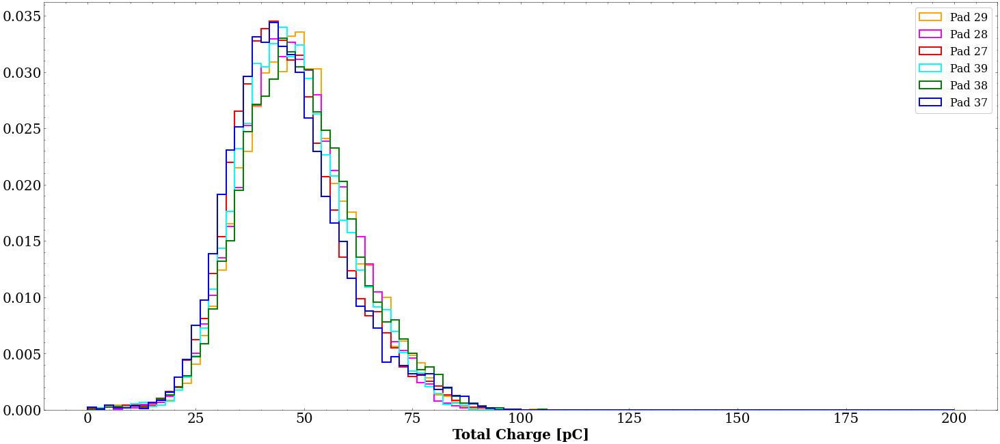

In [167]:
fig, axs = plt.subplots(figsize=(25, 11))
qrange = 200

for i,j in enumerate(pad_order):
    axs.hist(mm_qalls[j][xy_pads[j]], bins=100, range=(0, qrange), histtype='step', color=colors[j], lw=2, label=pnames[j], density=True)

axs.legend()
# axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

In [168]:
qlow = .5
qup = 100

nppe = 500


vl1, vu1, mdt1, sdt1, emdt1, esdt1 = fff(mm1_qall[xy_pad1], dt1[xy_pad1], qlow, qup, nppe, False, trange=[tranges[0][0], tranges[0][1]])
vl2, vu2, mdt2, sdt2, emdt2, esdt2 = fff(mm2_qall[xy_pad2], dt2[xy_pad2], qlow, qup, nppe, False, trange=[tranges[1][0], tranges[1][1]])
vl3, vu3, mdt3, sdt3, emdt3, esdt3 = fff(mm3_qall[xy_pad3], dt3[xy_pad3], qlow, qup, nppe, False, trange=[tranges[2][0], tranges[2][1]])
vl4, vu4, mdt4, sdt4, emdt4, esdt4 = fff(mm4_qall[xy_pad4], dt4[xy_pad4], qlow, qup, nppe, False, trange=[tranges[3][0], tranges[3][1]])
vl5, vu5, mdt5, sdt5, emdt5, esdt5 = fff(mm5_qall[xy_pad5], dt5[xy_pad5], qlow, qup, nppe, False, trange=[tranges[4][0], tranges[4][1]])
vl6, vu6, mdt6, sdt6, emdt6, esdt6 = fff(mm6_qall[xy_pad6], dt6[xy_pad6], qlow, qup, nppe, False, trange=[tranges[5][0], tranges[5][1]])


xxs1 = (vl1+vu1)*0.5
exs1 = (vl1-vu1)*0.5

xxs2 = (vl2+vu2)*0.5
exs2 = (vl2-vu2)*0.5

xxs3 = (vl3+vu3)*0.5
exs3 = (vl3-vu3)*0.5

xxs4 = (vl4+vu4)*0.5
exs4 = (vl4-vu4)*0.5

xxs5 = (vl5+vu5)*0.5
exs5 = (vl5-vu5)*0.5

xxs6 = (vl6+vu6)*0.5
exs6 = (vl6-vu6)*0.5


np.min(idt)=-8070.933584820154, np.max(idt)=-7803.660827235035, r1=-8136.24023889335, mm=-7996.8935804364755, r2=-7857.546921979601
18.563072365136293, -8002.594071250876, 26.279579114759695, 
##################################################
np.min(idt)=-8082.888700578082, np.max(idt)=-7931.567206855845, r1=-8091.924516616068, mm=-8009.393707939878, r2=-7926.862899263689
15.177339520664338, -8011.2775332316, 19.806946244174995, 
##################################################
np.min(idt)=-8059.04653925711, np.max(idt)=-7936.552402628706, r1=-8086.04532172896, mm=-8009.338253119529, r2=-7932.631184510099
14.32664517941618, -8008.679964301779, 17.542010043576937, 
##################################################
np.min(idt)=-8091.509400827135, np.max(idt)=-7920.403939399193, r1=-8085.93158105132, mm=-8008.862119267147, r2=-7931.792657482974
15.014009114329474, -8008.915685084107, 18.885768011545117, 
##################################################
np.min(idt)=-8064.536635119424

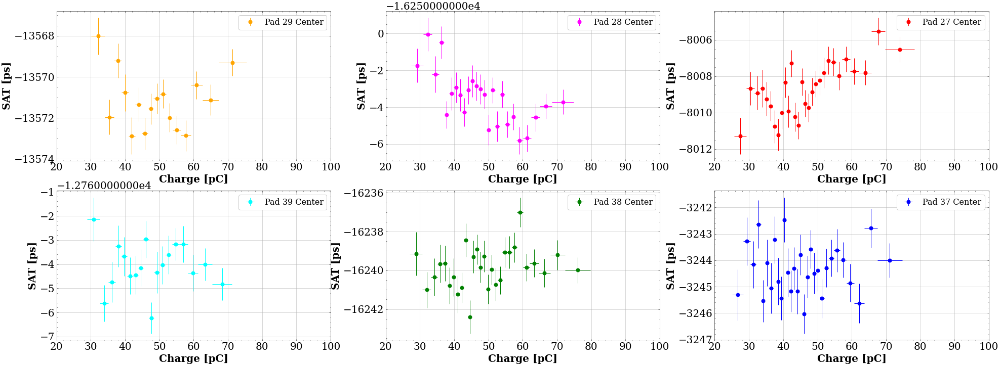

In [169]:
fig, axs = plt.subplots(2, 3, figsize=(33, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxs5[iistart:iistop], mdt5[iistart:iistop], xerr=exs5[iistart:iistop], yerr=emdt5[iistart:iistop], fmt='o', ms=7, color=colors[4], label=f'{pnames[4]} Center')
axs[1].errorbar(xxs3[iistart:iistop], mdt3[iistart:iistop], xerr=exs3[iistart:iistop], yerr=emdt3[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]} Center')
axs[2].errorbar(xxs1[iistart:iistop], mdt1[iistart:iistop], xerr=exs1[iistart:iistop], yerr=emdt1[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]} Center')
axs[3].errorbar(xxs6[iistart:iistop], mdt6[iistart:iistop], xerr=exs6[iistart:iistop], yerr=emdt6[iistart:iistop], fmt='o', ms=7, color=colors[5], label=f'{pnames[5]} Center')
axs[4].errorbar(xxs4[iistart:iistop], mdt4[iistart:iistop], xerr=exs4[iistart:iistop], yerr=emdt4[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]} Center')
axs[5].errorbar(xxs2[iistart:iistop], mdt2[iistart:iistop], xerr=exs2[iistart:iistop], yerr=emdt2[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]} Center')



for i in range(NPADS):
    axs[i].grid()
    axs[i].set_xlim(20, qup)
    axs[i].set_xlabel('Charge [pC]')
    axs[i].set_ylabel('SAT [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


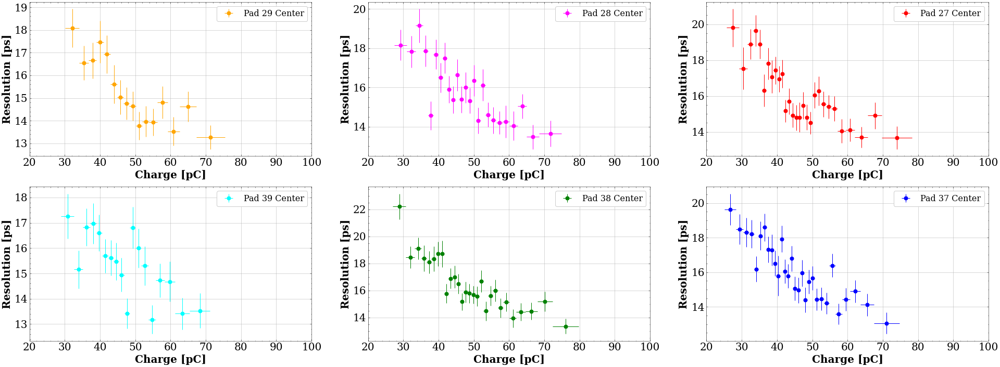

In [170]:
fig, axs = plt.subplots(2, 3, figsize=(33, 12))
iistart, iistop = 1, -1
axs = axs.ravel()
axs[0].errorbar(xxs5[iistart:iistop], sdt5[iistart:iistop], xerr=exs5[iistart:iistop], yerr=esdt5[iistart:iistop], fmt='o', ms=7, color=colors[4], label=f'{pnames[4]} Center')
axs[1].errorbar(xxs3[iistart:iistop], sdt3[iistart:iistop], xerr=exs3[iistart:iistop], yerr=esdt3[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]} Center')
axs[2].errorbar(xxs1[iistart:iistop], sdt1[iistart:iistop], xerr=exs1[iistart:iistop], yerr=esdt1[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]} Center')
axs[3].errorbar(xxs6[iistart:iistop], sdt6[iistart:iistop], xerr=exs6[iistart:iistop], yerr=esdt6[iistart:iistop], fmt='o', ms=7, color=colors[5], label=f'{pnames[5]} Center')
axs[4].errorbar(xxs4[iistart:iistop], sdt4[iistart:iistop], xerr=exs4[iistart:iistop], yerr=esdt4[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]} Center')
axs[5].errorbar(xxs2[iistart:iistop], sdt2[iistart:iistop], xerr=exs2[iistart:iistop], yerr=esdt2[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]} Center')



for i in range(NPADS):
    axs[i].grid()
    axs[i].set_xlim(20, qup)
    axs[i].set_xlabel('Charge [pC]')
    axs[i].set_ylabel('Resolution [ps]')
    axs[i].legend(loc=1)

# axs[0].set_xlim(0, 5)
plt.show()


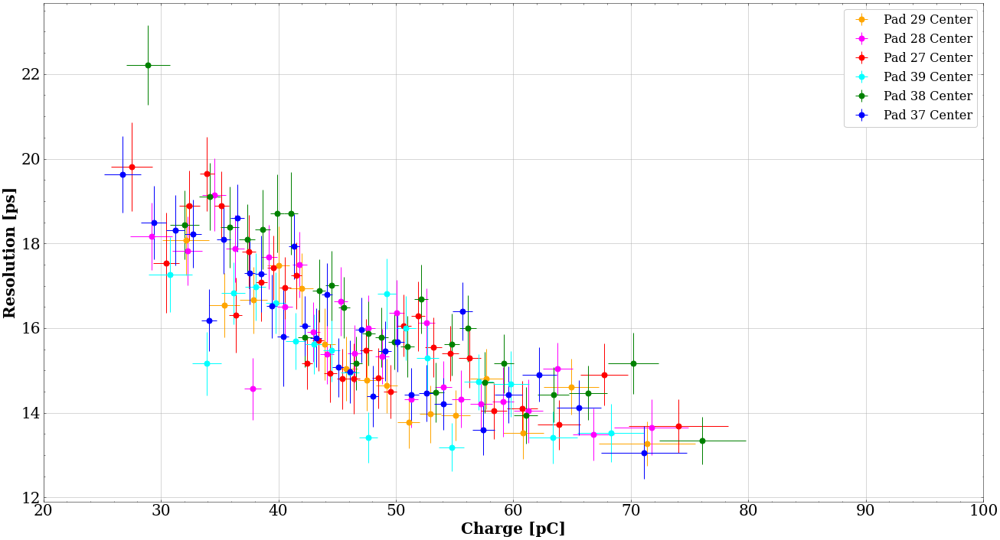

In [171]:
fig, axs = plt.subplots(figsize=(22, 12))
iistart, iistop = 1, -1

axs.errorbar(xxs5[iistart:iistop], sdt5[iistart:iistop], xerr=exs5[iistart:iistop], yerr=esdt5[iistart:iistop], fmt='o', ms=7, color=colors[4], label=f'{pnames[4]} Center')
axs.errorbar(xxs3[iistart:iistop], sdt3[iistart:iistop], xerr=exs3[iistart:iistop], yerr=esdt3[iistart:iistop], fmt='o', ms=7, color=colors[2], label=f'{pnames[2]} Center')
axs.errorbar(xxs1[iistart:iistop], sdt1[iistart:iistop], xerr=exs1[iistart:iistop], yerr=esdt1[iistart:iistop], fmt='o', ms=7, color=colors[0], label=f'{pnames[0]} Center')
axs.errorbar(xxs6[iistart:iistop], sdt6[iistart:iistop], xerr=exs6[iistart:iistop], yerr=esdt6[iistart:iistop], fmt='o', ms=7, color=colors[5], label=f'{pnames[5]} Center')
axs.errorbar(xxs4[iistart:iistop], sdt4[iistart:iistop], xerr=exs4[iistart:iistop], yerr=esdt4[iistart:iistop], fmt='o', ms=7, color=colors[3], label=f'{pnames[3]} Center')
axs.errorbar(xxs2[iistart:iistop], sdt2[iistart:iistop], xerr=exs2[iistart:iistop], yerr=esdt2[iistart:iistop], fmt='o', ms=7, color=colors[1], label=f'{pnames[1]} Center')



axs.grid()
axs.set_xlim(20, qup)
axs.set_xlabel('Charge [pC]')
axs.set_ylabel('Resolution [ps]')
axs.legend(loc=1)

plt.show()


In [172]:
pad_order

[4, 2, 0, 5, 3, 1]

In [173]:
mm_qall_c1 = mm5_qall[cross1_cut] + mm3_qall[cross1_cut] + mm6_qall[cross1_cut] + mm4_qall[cross1_cut]
mm_qall_c2 = mm3_qall[cross2_cut] + mm1_qall[cross2_cut] + mm4_qall[cross2_cut] + mm2_qall[cross2_cut]

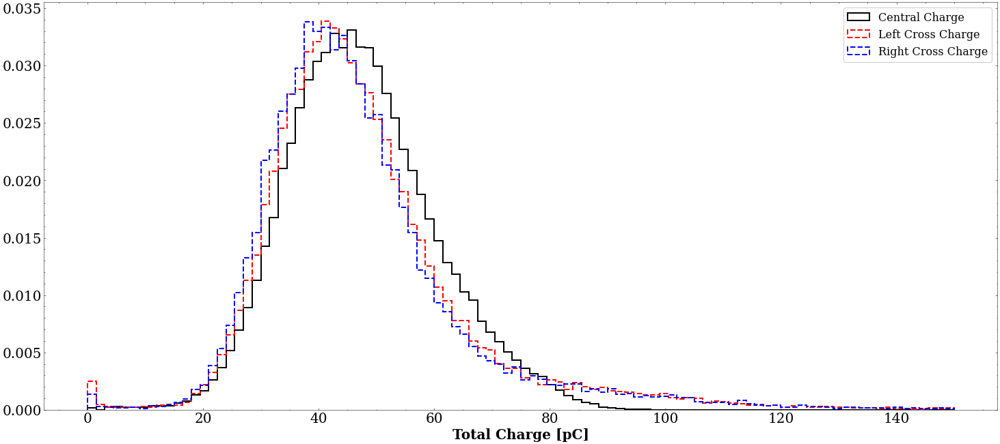

In [174]:
fig, axs = plt.subplots(figsize=(25, 11))
qrange = 150


axs.hist(np.concatenate([mm_qalls[j][xy_pads[j]] for j in pad_order]), bins=100, range=(0, qrange), histtype='step', color='black', lw=2, label='Central Charge', density=True)
axs.hist(mm_qall_c1, bins=100, range=(0, qrange), histtype='step', ls='--', color='red', lw=2, label='Left Cross Charge', density=True)
axs.hist(mm_qall_c2, bins=100, range=(0, qrange), histtype='step', ls='--', color='blue', lw=2, label='Right Cross Charge', density=True)

axs.legend()
# axs.set_yscale('log')
axs.set_xlabel("Total Charge [pC]")
plt.show()

In [175]:
tranges_xx = [
 [-8500, -7500],
 [-5000, -2000],
 [-16500, -15000],
 [-16500, -15000],
 [-13700, -12500],
 [-13000, -12000]
    
]
hmean_sat = np.zeros((6, 10, 10))
hmean_rms = np.zeros((6, 10, 10))
htemps1 = []
htemps2 = []
htemps3 = []
htemps4 = []
htemps5 = []
htemps6 = []

htemps = [htemps1,htemps2,htemps3,htemps4,htemps5,htemps6]

for ip,jp in enumerate(pad_order):
    xbins = np.linspace(centers_s[0][jp]-5, centers_s[0][jp]+5, 11)
    ybins = np.linspace(centers_s[1][jp]-5, centers_s[1][jp]+5, 11)
    
    for j in range(1, 11):
        for i in range(1,11):
    
            xybin_cut = np.where(np.logical_and((x_s > xbins[i-1])*(x_s < xbins[i]), (y_s > ybins[j-1])*(y_s < ybins[j])))
#             qq_cut = mm_qalls[ip][xybin_cut]>3
        #             qq_in_bin = mm1_qall[box_cut][xybin_cut]
            dt_in_bin = 1e3*mm_dts[jp][xybin_cut]
            hxtemp = ROOT.TH1D(f'htemp{jp}_{i}_{j}', '', 100, tranges_xx[jp][0], tranges_xx[jp][1])

            #             hxtemp.FillN(qq_in_bin.size, qq_in_bin, 0)
            hxtemp.FillN(dt_in_bin.size, dt_in_bin, 0)
            hxtemp.Fit('gaus', 'Q')
            rsf = hxtemp.Fit('gaus', 'SQ')
            if rsf.Get():
                hmean_sat[jp,i-1,j-1] = rsf.Parameter(1)
                hmean_rms[jp,i-1,j-1] = rsf.Parameter(2) 
            
            htemps[jp].append(hxtemp)
#     break

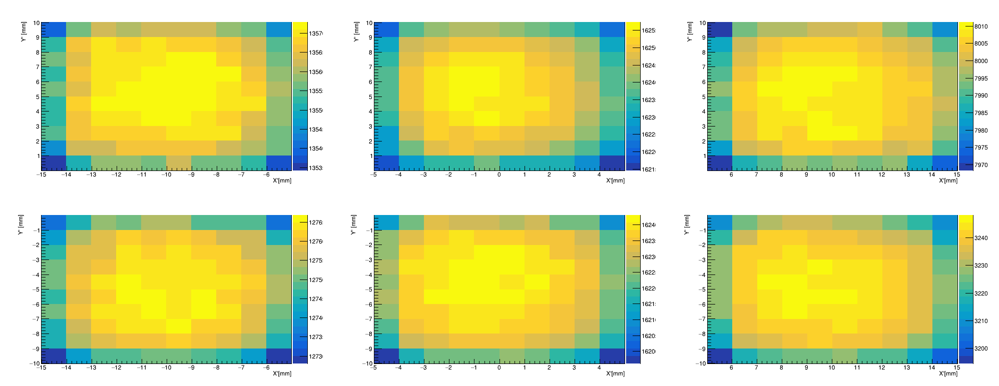

In [176]:
%jsroot off
ROOT.gStyle.SetOptStat(0)
c = ROOT.TCanvas('cs', '', 2000, 800)

hxys_mm_mean = [None]*NPADS

for i in pad_order:
   
    hhxy = ROOT.TH2D(f'hhmean{i}_dt', '; X\'[mm]; Y\' [mm]', 10, centers_s[0][i]-5, centers_s[0][i]+5, 10, centers_s[1][i]-5, centers_s[1][i]+5)
    for j in range(1, 11):
        for k in range(1,11):
            idxx = j + 12*k
            hhxy.SetBinContent(idxx, -hmean_sat[i,j-1,10-k])
#             break
    hxys_mm_mean[i] = hhxy

    
c.Divide(3,2)
for i,j in enumerate(pad_order):
    c.cd(i+1)
#     hxys_mm_mean[j].Draw('lego2z')
    hxys_mm_mean[j].Draw('colz')
    
# hxys_mm_mean[0].Draw('colz') 
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cs


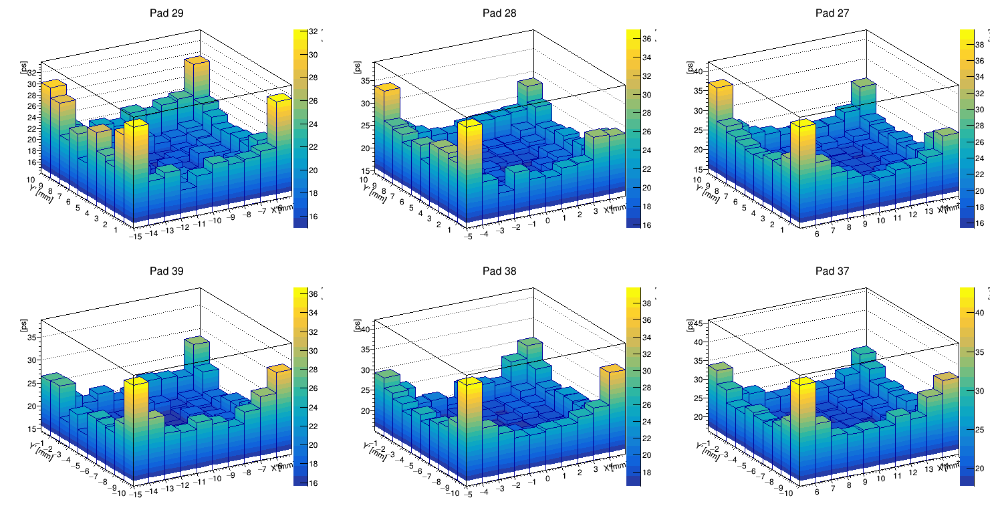

In [177]:
%jsroot off
ROOT.gStyle.SetOptStat(0)
c = ROOT.TCanvas('cs', '', 1500, 800)

hxys_mm_mean = [None]*NPADS

for i in pad_order:
   
    hhxy = ROOT.TH2D(f'hhmean{i}_rms', f'{pnames[i]}; X\'[mm]; Y\' [mm]; [ps]', 10, centers_s[0][i]-5, centers_s[0][i]+5, 10, centers_s[1][i]-5, centers_s[1][i]+5)
    for j in range(1, 11):
        for k in range(1,11):
            idxx = j + 12*k
            hhxy.SetBinContent(idxx, hmean_rms[i,j-1,10-k])
#             break
    hxys_mm_mean[i] = hhxy



c.Divide(3,2)
for i,j in enumerate(pad_order):
    c.cd(i+1)
    hxys_mm_mean[j].Draw('lego2z')
#     hxys_mm_mean[j].Draw('colz')
    
# hxys_mm_mean[0].Draw('colz') 
c.Draw()

In [178]:
inq1 = np.asarray(mm1_qall > 1.0, dtype=np.int32)
inq2 = np.asarray(mm2_qall > 1.0, dtype=np.int32)
inq3 = np.asarray(mm3_qall > 1.0, dtype=np.int32)
inq4 = np.asarray(mm4_qall > 1.0, dtype=np.int32)
inq5 = np.asarray(mm5_qall > 1.0, dtype=np.int32)
inq6 = np.asarray(mm6_qall > 1.0, dtype=np.int32)

inqbs = [inq1,inq2,inq3,inq4,inq5,inq6]

inqs = np.sum((inq1,inq2,inq3,inq4,inq5,inq6), axis=0)

In [179]:
n_active_pads_id = np.zeros((NPADS+1, len(inqs)), dtype=np.bool8)
n_active_pads = np.zeros(NPADS+1, dtype=np.int32)

for i in range(NPADS+1):
    n_active_pads_id[i,:] = inqs == i
    n_active_pads[i] = np.count_nonzero(inqs == i)

In [180]:
n_active_pads

array([ 16587, 115312, 187155, 119257,  70555,   8814,   1123],
      dtype=int32)

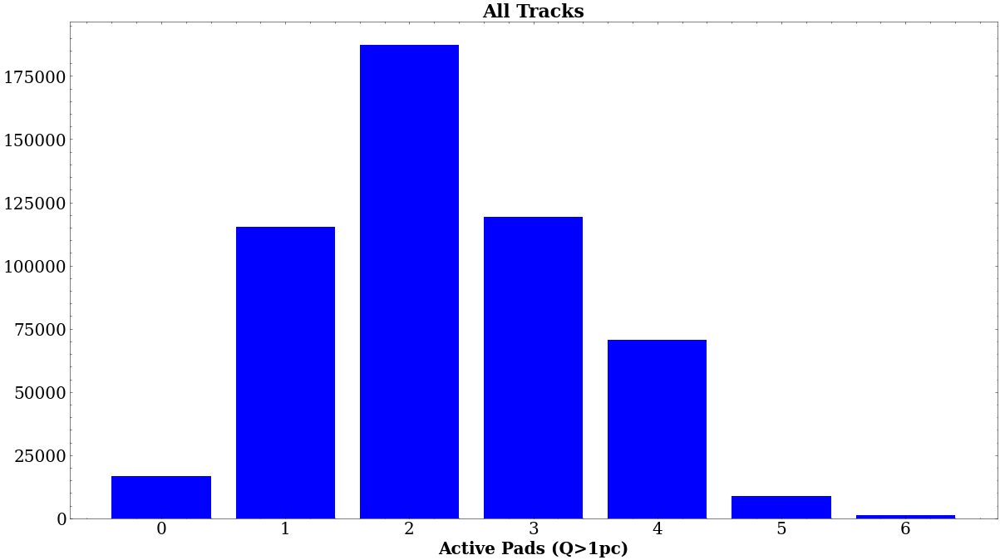

In [181]:
nns = np.arange(0,7)
# nns = np.arange(-0.5, 7.5, 1)
fig, axs = plt.subplots(figsize=(20, 11))
# axs.hist(nns[:-1], nns, weights=n_active_pads)

axs.bar(nns, n_active_pads, color='blue')

axs.set_title('All Tracks')
axs.set_xlabel('Active Pads (Q>1pc)')

plt.show()

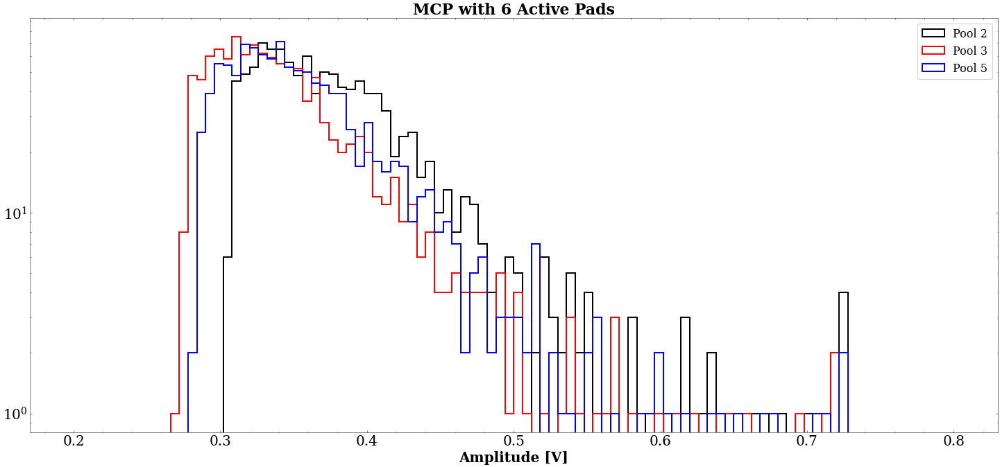

In [182]:
jj = 6
fig, axs = plt.subplots(figsize=(25, 11))
axs.hist(mcp1_v[n_active_pads_id[jj]], bins=100, range=(0.2, 0.8), histtype='step', color='black', lw=2, label='Pool 2')
axs.hist(mcp2_v[n_active_pads_id[jj]], bins=100, range=(0.2, 0.8), histtype='step', color='red', lw=2, label='Pool 3')
axs.hist(mcp3_v[n_active_pads_id[jj]], bins=100, range=(0.2, 0.8), histtype='step', color='blue', lw=2, label='Pool 5')
axs.set_yscale('log')
axs.set_xlabel('Amplitude [V]')
axs.set_title(f'MCP with {jj} Active Pads')
axs.legend()
plt.show()

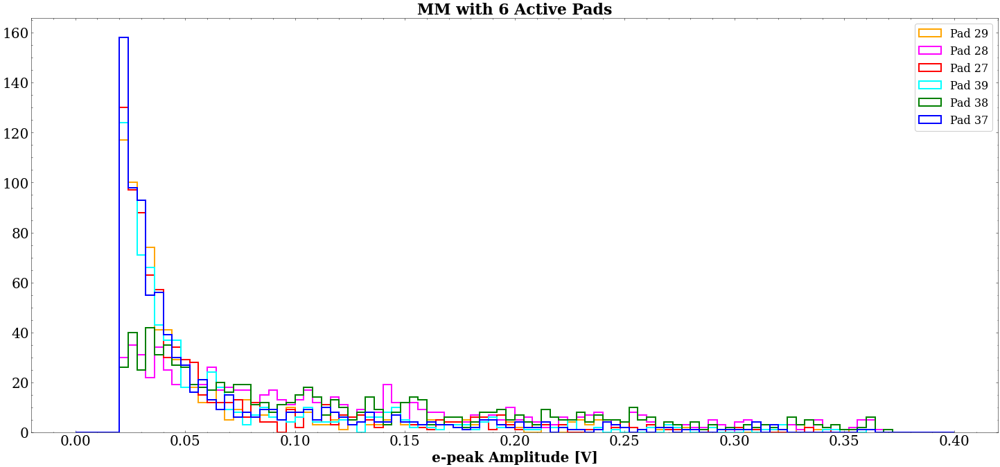

In [183]:
fig, axs = plt.subplots(figsize=(25, 11))
for i,j in enumerate(pad_order):
    axs.hist(mm_vs[j][mm_mcp_cuts[j]*n_active_pads_id[jj]], bins=100, range=(0, .4), histtype='step', color=colors[j], lw=2, label=pnames[j])

axs.legend()
# axs.set_yscale('log')
axs.set_title(f'MM with {jj} Active Pads')
axs.set_xlabel("e-peak Amplitude [V]")
plt.show()

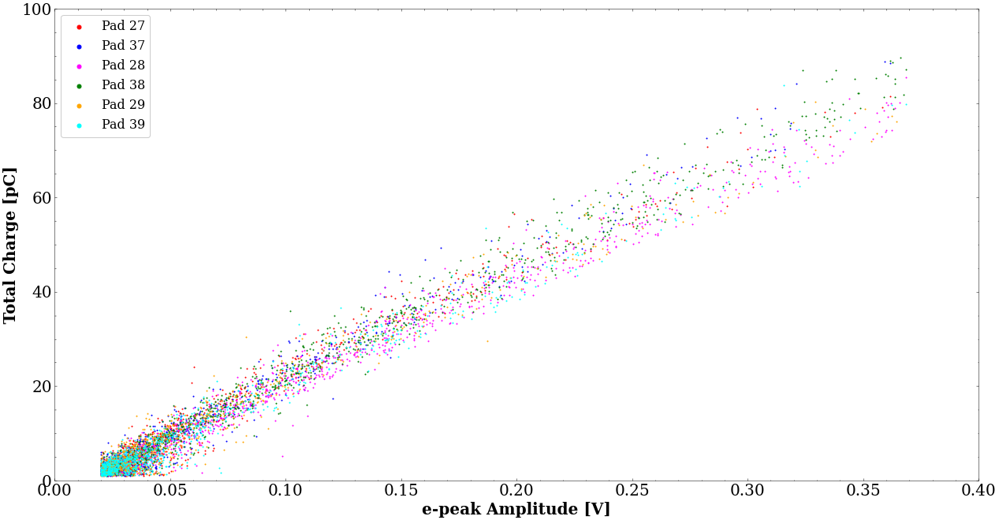

In [184]:
fig, axs = plt.subplots(figsize=(21, 11))
for i in range(NPADS):
#     axs.scatter(mm_vs[i][n_active_pads_id[jj]], mm_qalls[i][n_active_pads_id[jj]], s=1, color=colors[i], label=pnames[i])
    axs.scatter(mm_vs[i][mm_cuts[i]*n_active_pads_id[jj]], mm_qalls[i][mm_cuts[i]*n_active_pads_id[jj]], s=1, color=colors[i], label=pnames[i])

axs.set_xlabel('e-peak Amplitude [V]')
axs.set_ylabel('Total Charge [pC]')

axs.set_xlim(0, 0.4)
axs.set_ylim(0, 100)
axs.legend(loc=2, markerscale=5)
plt.show()

In [185]:
for i in range(NPADS):
    print(np.where(mm_vs[i][n_active_pads_id[jj]] > 0.05)[0].size)

333
317
836
783
326
324


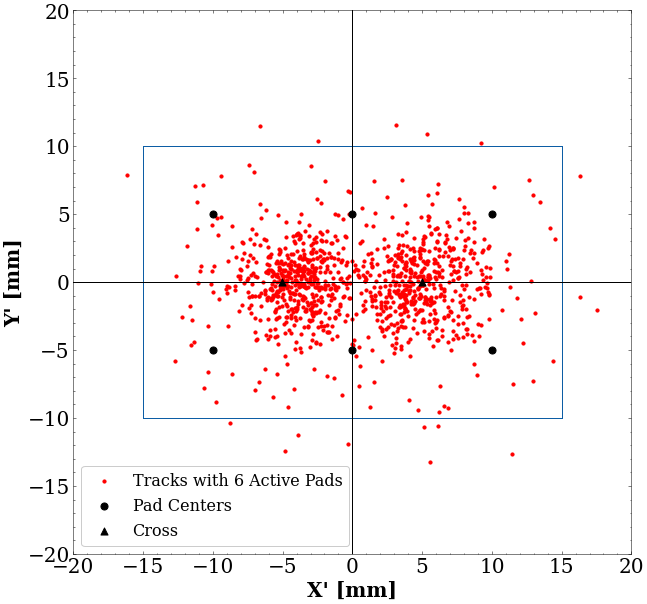

In [186]:
fig, axs = plt.subplots(figsize=(10, 10))

axs.scatter(x_s[n_active_pads_id[jj]], y_s[n_active_pads_id[jj]], s=10, color='red', label=f'Tracks with 6 Active Pads')
# for i,j in enumerate(pad_order):
#     axs.scatter(x_s[xy_pads[j]], y_s[xy_pads[j]], s=0.2, color=colors[j], label=f'{pnames[j]}')

# for i in range(NPADS):
#     axs.scatter(centers_s[0][i], centers_s[1][i], color='black', s=50, label='Pad Centers')
axs.scatter(centers_s[0], centers_s[1], color='black', s=50, label='Pad Centers')
axs.scatter(0, 0, color='black', s=100, marker='+')

axs.scatter(cross2_s[0,0], cross2_s[0,1], color='black', s=50, marker='^', label='Cross')
axs.scatter(cross2_s[1,0], cross2_s[1,1], color='black', s=50, marker='^')


axs.axvline(centers_s[0][5]-5, ymin=0.25, ymax=0.75)
axs.axhline(centers_s[1][5]-5, xmin=0.125, xmax=0.875)

axs.axvline(centers_s[0][0]+5, ymin=0.25, ymax=0.75)
axs.axhline(centers_s[1][0]+5, xmin=0.125, xmax=0.875)

axs.axhline(0, lw=1, color='black')
axs.axvline(0, lw=1, color='black')

axs.set_xlim(-20, 20)
axs.set_ylim(-20, 20)
axs.legend(loc=3, markerscale=1)
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
plt.show()

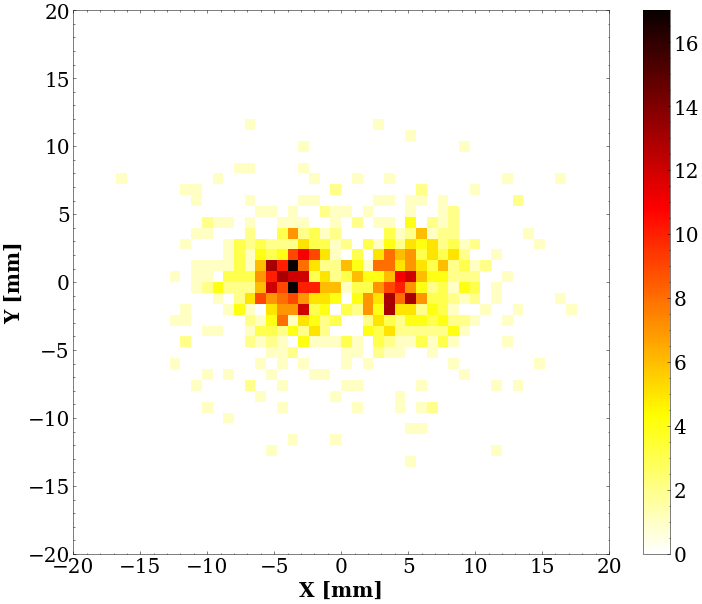

In [187]:
heatmap, yedges, xedges = np.histogram2d(y_s[n_active_pads_id[jj]], x_s[n_active_pads_id[jj]], range=[[-20,20],[-20,20]], bins=(50, 50))

fig, axs = plt.subplots(figsize=(12, 10))
axs.set_xlabel('X [mm]')
axs.set_ylabel('Y [mm]')
c = axs.pcolormesh(xedges, yedges, heatmap, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs)
plt.show()

In [188]:
np.std(centers_s[0][0:3]),np.std(centers_s[1][0:3])

(4.723473370724867, 4.723473225927405)

In [189]:
np.std(centers_s[0][3:6]),np.std(centers_s[1][3:6])

(4.723473370724871, 4.723473225927403)

In [190]:
class pos_fun():
    def __init__(self, xdata, ydata, sigmax, sigmay, qs):
        self.xdata = xdata
        self.ydata = ydata
        self.sigmax = sigmax
        self.sigmay = sigmay
        self.qs = qs/np.sum(qs)
    def __call__(self, params):
        xx,yy = params[0], params[1]
#         res = np.sum(np.square(self.qs*(self.xdata - xx)/self.sigmax)) + np.sum(np.square(self.qs*(self.ydata - yy)/self.sigmay))
        res = np.sum(np.square(self.qs*(self.xdata - xx)/0.2)) + np.sum(np.square(self.qs*(self.ydata - yy)/0.2))
        return res



In [191]:
m = 100000
# xs_pred = np.zeros(m)
# ys_pred = np.zeros(m)
xs_pred = np.empty(m)
ys_pred = np.empty(m)

xs_pred.fill(-11111)
ys_pred.fill(-11111)

for ij in range(m):
#     initial_guess = [x_s[ij],y_s[ij]]
    if np.all(mm_qall_vec[ij] > 0.0001):
        initial_guess = [0.0,0.0]
        boundaries = [(-15.,15.),(-10.,10.)]
        pf = pos_fun(centers_s[0],centers_s[1],np.std(centers_s[0][3:6]),np.std(centers_s[1][3:6]), mm_qall_vec[ij])
        result = minimize(pf, initial_guess, method='L-BFGS-B', bounds=boundaries)
    #     print(result)
    #     print(initial_guess, ',', result.x)
        xs_pred[ij] = result.x[0]
        ys_pred[ij] = result.x[1]
        

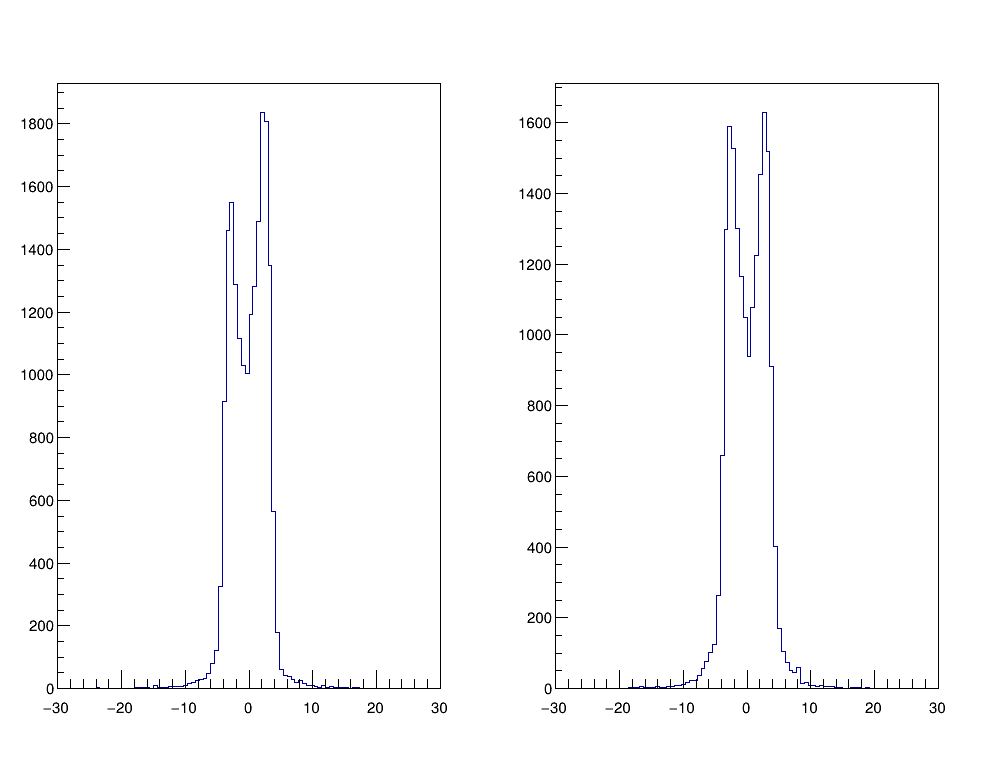

In [192]:
vv_xy = np.where(xs_pred > -11111)[0]

c = ROOT.TCanvas('cxxyy', '', 1000, 800)
c.Divide(2,1)

hxx1 = ROOT.TH1D("hxx1",'', 100, -30, 30)
# hxx1.FillN(m, xs_pred-x_s[0:m], 0, 1)
hxx1.FillN(len(vv_xy), xs_pred[vv_xy]-x_s[vv_xy], 0, 1)

hyy1 = ROOT.TH1D("hyy1",'', 100, -30, 30)
# hyy1.FillN(m, ys_pred-y_s[0:m], 0, 1)
hyy1.FillN(len(vv_xy), (ys_pred[vv_xy]-y_s[vv_xy]), 0, 1)

c.cd(1)
hxx1.Draw()
c.cd(2)
hyy1.Draw()

c.Draw()

In [193]:
def find_min_dist(ix,iy):
    dists = np.zeros(NPADS)
    for i in range(NPADS):
        dists[i] = np.sqrt(np.square(ix-centers_s[0][i]) + np.square(iy-centers_s[1][i]))
    return np.argmin(dists)
# find_min_dist(x_s, y_s)
vf = np.vectorize(find_min_dist)
# vf2 = np.frompyfunc(find_min_dist, 2, 1)

In [194]:
max_q_pad_ids = np.argmax(mm_qall_vec, axis=1)

In [195]:
for i,j in enumerate(np.where(n_active_pads_id[jj])[0]):
    if find_min_dist(x_s[j], y_s[j]) != max_q_pad_ids[j] and np.all([mm_cuts[ii][j] for ii in range(NPADS)]):
        print('V:', mm_v_vec[j])
        print('Q:', mm_qall_vec[j])
        print(np.sum(mm_qall_vec[j][c1_order]), np.sum(mm_qall_vec[j][c2_order]))
        print('Track :', pnames[find_min_dist(x_s[j], y_s[j])])
        print('Max Q :', pnames[max_q_pad_ids[j]])
        print(50*'#')
    
        if i > 100:
            break
    
    
    

V: [0.03345527 0.03111069 0.13402442 0.14501493 0.02672909 0.02063331]
Q: [11.58838102  6.89964499 27.90870034 34.93599462  3.86368212  3.35137143]
70.05974850776198 81.33272096318989
Track : Pad 28
Max Q : Pad 38
##################################################
V: [0.03541366 0.03852906 0.30536353 0.33402897 0.04400691 0.27575349]
Q: [ 1.93534258  6.74010839 65.61041439 84.537811    2.02244149 55.78641081]
207.95707770056288 158.82367636581358
Track : Pad 28
Max Q : Pad 38
##################################################
V: [0.05043618 0.0344401  0.32038994 0.21845088 0.03325559 0.03515019]
Q: [ 8.69453888  3.30169653 67.37664426 55.23519215  2.56706536  4.02424162]
129.20314338682437 134.60807181287007
Track : Pad 38
Max Q : Pad 28
##################################################
V: [0.14585831 0.03590153 0.09586995 0.03423076 0.12846365 0.04875514]
Q: [36.08200689  6.28863659 18.60475242  4.62502361 29.7438283   9.5978514 ]
62.57145573871317 65.60041951351357
Track : Pad 29
Ma

In [196]:
jj = 6

In [197]:
np.all([mm_cuts[i] for i in range(NPADS)], axis=0)

array([False, False, False, ..., False, False, False])

In [198]:
vfs = vf(x_s[n_active_pads_id[jj]],y_s[n_active_pads_id[jj]])

In [199]:
vfs.size

1123

In [200]:
mall_cuts = np.all([mm_cuts[i] for i in range(NPADS)], axis=0)[n_active_pads_id[jj]]
mall_cuts.size

1123

In [201]:
missed_tracks_mask = vfs != max_q_pad_ids[n_active_pads_id[jj]]
missed_tracks = np.where(vfs != max_q_pad_ids[n_active_pads_id[jj]])[0]

In [202]:
missed_tracks_cut_mask = (vfs != max_q_pad_ids[n_active_pads_id[jj]])*mall_cuts


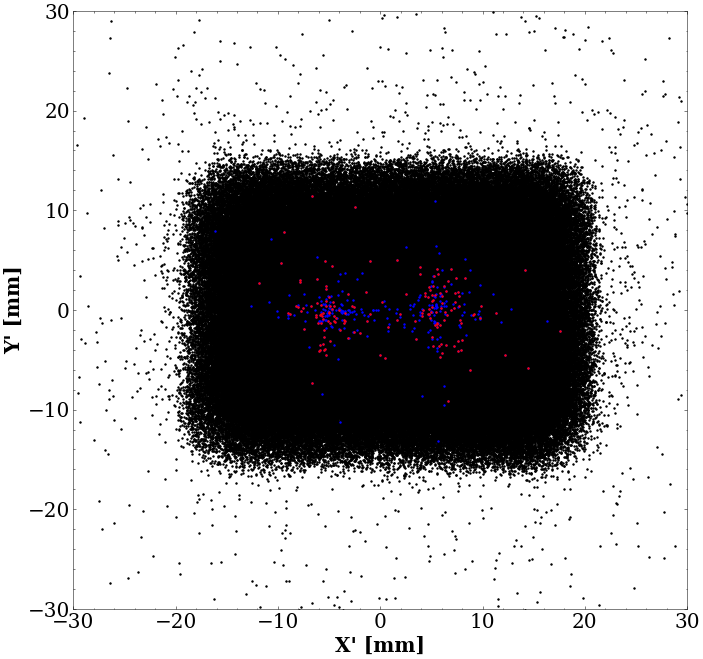

In [203]:
fig, axs = plt.subplots(figsize=(11, 11))
axs.scatter(x_s, y_s, s=2, color='black', label='All tracks')
axs.scatter(x_s[n_active_pads_id[jj]][missed_tracks], y_s[n_active_pads_id[jj]][missed_tracks], s=2, color='blue', label='tracks')
axs.scatter(x_s[n_active_pads_id[jj]][missed_tracks_cut_mask], y_s[n_active_pads_id[jj]][missed_tracks_cut_mask], s=2, color='red', label='tracks')

axs.set_xlim(-30, 30)
axs.set_ylim(-30, 30)
# axs.legend(loc=3, markerscale=5)
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
plt.show()

In [204]:
for i,j in enumerate(missed_tracks):
    print('V:', mm_v_vec[j])
    print('Q:', mm_qall_vec[j])
    print(np.sum(mm_qall_vec[j][c1_order]), np.sum(mm_qall_vec[j][c2_order]))
    print('Track :', pnames[find_min_dist(x_s[j], y_s[j])])
    print('Max Q :', pnames[max_q_pad_ids[j]])
    print(50*'#')
    
    if i > 30:
        break
    
    
    

V: [0.22353853 0.0121961  0.01731239 0.01088028 0.00772405 0.00805205]
Q: [57.73621583  0.1143445   1.64591663 -0.75685472 -0.30240377  0.1420753 ]
0.7287334404214136 58.73962224460775
Track : Pad 27
Max Q : Pad 27
##################################################
V: [0.00531747 0.0053996  0.00369375 0.00495274 0.00428198 0.00408053]
Q: [ 0.          0.         -0.2793185   0.          0.         -0.19356727]
-0.47288576984944897 -0.2793185018556865
Track : Pad 27
Max Q : Pad 27
##################################################
V: [0.00511679 0.00508535 0.00408519 0.00489823 0.00426986 0.00431432]
Q: [0.         0.26122745 0.13790482 0.         0.08233832 0.56773453]
0.7879776727737106 0.39913226982511846
Track : Pad 27
Max Q : Pad 39
##################################################
V: [0.00455418 0.0045105  0.00422145 0.00506953 0.00466323 0.00479746]
Q: [ 0.          0.          0.09021127 -0.36001477  0.          0.        ]
-0.2698034920755391 -0.2698034920755391
Track : Pad 27

# Quad Selection

## Quad Selection based on Charge

In [205]:
pad_center_box_cut = (x_s>centers_s[0][5])*(x_s<centers_s[0][1])*(y_s>centers_s[1][1])*(y_s<centers_s[1][0])

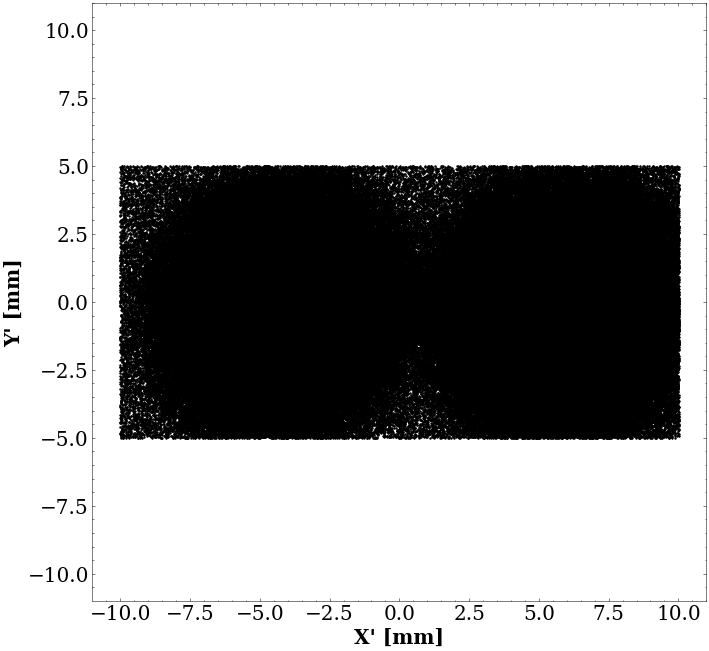

In [206]:
fig, axs = plt.subplots(figsize=(11, 11))
axs.scatter(x_s[pad_center_box_cut], y_s[pad_center_box_cut], s=2, color='black', label='All tracks')
axs.set_xlim(-11, 11)
axs.set_ylim(-11, 11)
# axs.legend(loc=3, markerscale=5)
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
plt.show()

In [207]:
# %%time
# c1_qs = np.zeros(N)
# c2_qs = np.zeros(N)
# for i in range(N):
#     c1_qs[i] = np.sum(mm_qall_vec[i][c1_order][np.where(mm_qall_vec[i][c1_order] > 1)])    
#     c2_qs[i] = np.sum(mm_qall_vec[i][c2_order][np.where(mm_qall_vec[i][c2_order] > 1)])

In [208]:
from numba import njit, jit

In [209]:
@njit
def pppp(N, qqq, order):
    c_qs = np.zeros(N)
    for i in range(N):
        c_qs[i] = np.sum(qqq[i][order][np.where(qqq[i][order] > 1)])
    return c_qs

In [210]:
%%time
c1_qs = pppp(N, mm_qall_vec, c1_order)
c2_qs = pppp(N, mm_qall_vec, c2_order)

CPU times: user 2.38 s, sys: 115 ms, total: 2.5 s
Wall time: 2.83 s


In [211]:
c1_active = c1_qs > c2_qs
c2_active = c1_qs < c2_qs

## Quad Selection based on Track

In [212]:
c1_active_x = x_s < 0
c2_active_x = x_s > 0

In [213]:
weird_events = c1_active != c1_active_x

In [214]:
for i,ww in enumerate(mm_qall_vec[weird_events]):
#     print(ww[c1_order], ww[c2_order], x_s[weird_events][i], y_s[weird_events][i])
    print(f'c1q={c1_qs[weird_events][i]:4.5f}, c2q={c2_qs[weird_events][i]:4.5f} , x={x_s[weird_events][i]:4.5f}, y={y_s[weird_events][i]:4.5f}')
    if i > 10:
        break

c1q=0.00000, c2q=0.00000 , x=-8.24187, y=-0.63046
c1q=3.52513, c2q=0.00000 , x=14.04537, y=12.70038
c1q=4.66259, c2q=0.00000 , x=15.38944, y=13.54375
c1q=2.59356, c2q=2.54013 , x=17.18009, y=9.00461
c1q=1.12689, c2q=0.00000 , x=16.48717, y=12.68518
c1q=1.52380, c2q=0.00000 , x=17.73881, y=11.01271
c1q=1.25493, c2q=0.00000 , x=17.95258, y=10.93469
c1q=28.95180, c2q=28.72878 , x=14.81576, y=6.42249
c1q=1.98778, c2q=0.00000 , x=20.21191, y=7.24665
c1q=44.20540, c2q=17.63180 , x=15.66641, y=5.19578
c1q=1.81591, c2q=0.00000 , x=18.57750, y=1.96163
c1q=1.49558, c2q=0.00000 , x=19.54837, y=8.64617


In [215]:
weird_events_c1 = c1_active[pad_center_box_cut] != c1_active_x[pad_center_box_cut]
weird_events_c2 = c2_active[pad_center_box_cut] != c2_active_x[pad_center_box_cut]

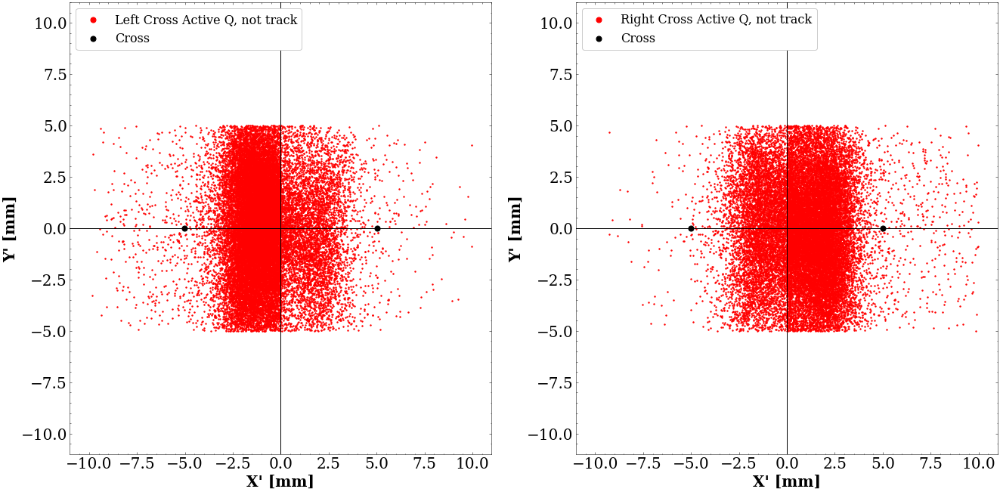

In [216]:
fig, axs = plt.subplots(1, 2, figsize=(22, 11))
axs[0].scatter(x_s[pad_center_box_cut][weird_events_c1], y_s[pad_center_box_cut][weird_events_c1], s=2, color='red', label='Left Cross Active Q, not track')
axs[1].scatter(x_s[pad_center_box_cut][weird_events_c2], y_s[pad_center_box_cut][weird_events_c2], s=2, color='red', label='Right Cross Active Q, not track')


for i in range(2):
    axs[i].axhline(0, lw=1, color='black')
    axs[i].axvline(0, lw=1, color='black')
    axs[i].scatter(0, 0, color='black', s=100, marker='+')
    axs[i].scatter(cross2_s[0,0], cross2_s[0,1], color='black', s=50, marker='o', label='Cross')
    axs[i].scatter(cross2_s[1,0], cross2_s[1,1], color='black', s=50, marker='o')


    axs[i].set_xlim(-11, 11)
    axs[i].set_ylim(-11, 11)
    leg = axs[i].legend(loc=2, markerscale=5)
    leg.legendHandles[1].set_sizes([50])
    
    axs[i].set_xlabel('X\' [mm]')
    axs[i].set_ylabel('Y\' [mm]')
plt.show()

In [217]:
# ns = N
ns = np.count_nonzero(pad_center_box_cut)
which_cross = np.zeros(ns, dtype=np.int16)
which_cross.fill(-1)
max_q_pad_ids = np.argmax(mm_qall_vec, axis=1)
right_cross_mask_all = np.logical_or(max_q_pad_ids == 0, max_q_pad_ids == 1)
left_cross_mask_all = np.logical_or(max_q_pad_ids == 4, max_q_pad_ids == 5)
mid_mask_all = np.logical_or(max_q_pad_ids == 2, max_q_pad_ids == 3)

max_q_pad_ids = np.argmax(mm_qall_vec[pad_center_box_cut], axis=1)
right_cross_mask = np.logical_or(max_q_pad_ids == 0, max_q_pad_ids == 1)
left_cross_mask = np.logical_or(max_q_pad_ids == 4, max_q_pad_ids == 5)
mid_mask = np.logical_or(max_q_pad_ids == 2, max_q_pad_ids == 3)

which_cross[mid_mask] = 0
which_cross[left_cross_mask] = 1
which_cross[right_cross_mask] = 2



# which_cross[mid_mask*pad_center_box_cut] = 0
# which_cross[left_cross_mask*pad_center_box_cut] = 1
# which_cross[right_cross_mask*pad_center_box_cut] = 2

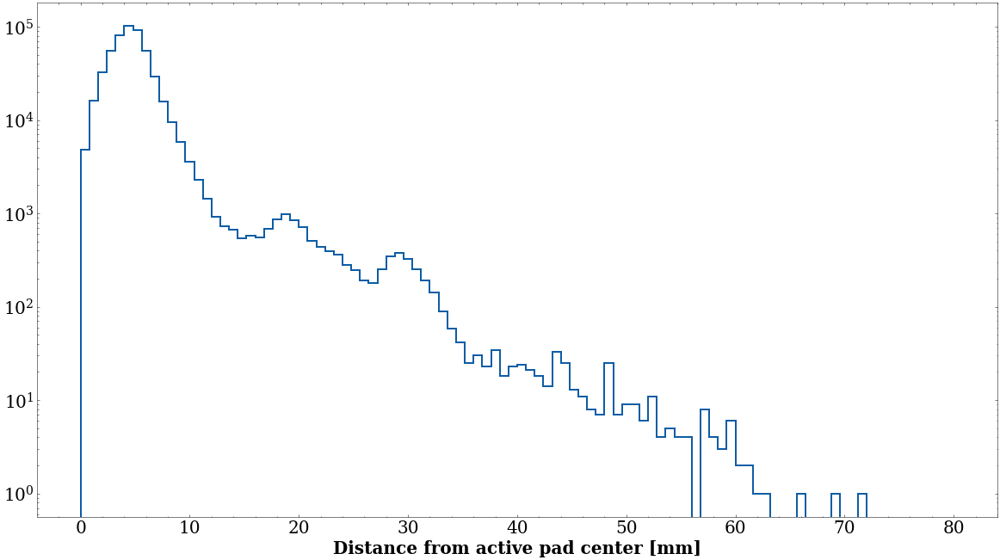

In [218]:
max_q_pad_ids = np.argmax(mm_qall_vec, axis=1)
dist = np.sqrt(np.square(x_s-centers_s[0][max_q_pad_ids]) + np.square(y_s-centers_s[1][max_q_pad_ids]))
fig, axs = plt.subplots(figsize=(20, 11))
axs.hist(dist, bins=100, range=(0,80), histtype='step', lw=2)
axs.set_yscale('log')
axs.set_xlabel('Distance from active pad center [mm]')
plt.show()

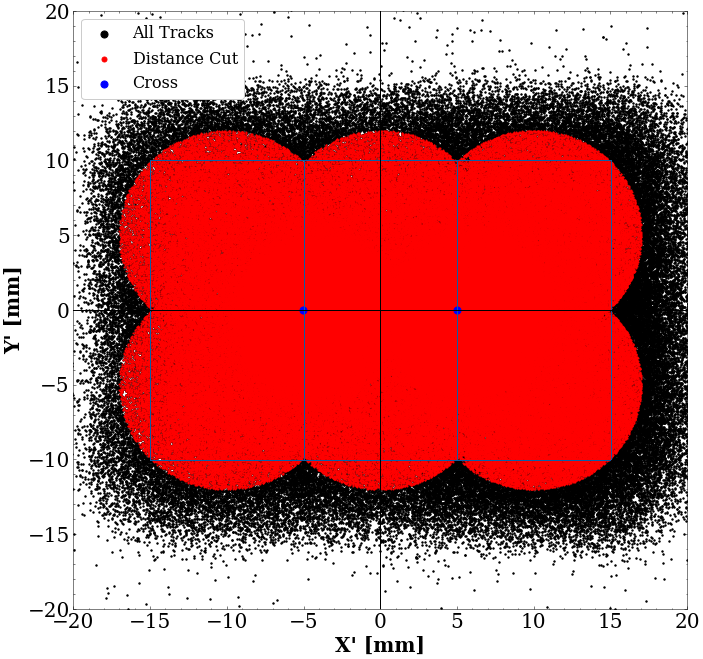

In [219]:
dist_cut = dist < 7
fig, axs = plt.subplots(figsize=(11, 11))
axs.scatter(x_s, y_s, s=2, color='black', label='All Tracks')
axs.scatter(x_s[dist_cut], y_s[dist_cut], s=1, color='red', label='Distance Cut')

axs.axvline(centers_s[0][5]-5, ymin=0.25, ymax=0.75)
axs.axhline(centers_s[1][5]-5, xmin=0.125, xmax=0.875)

axs.axvline(centers_s[0][0]+5, ymin=0.25, ymax=0.75)
axs.axhline(centers_s[1][0]+5, xmin=0.125, xmax=0.875)

axs.axvline(centers_s[0][2]+5, ymin=0.25, ymax=0.75)
axs.axvline(centers_s[0][2]-5, ymin=0.25, ymax=0.75)

axs.axhline(0, lw=1, color='black')
axs.axvline(0, lw=1, color='black')
axs.scatter(0, 0, color='black', s=100, marker='+')
axs.scatter(cross2_s[0,0], cross2_s[0,1], color='blue', s=50, marker='o', label='Cross')
axs.scatter(cross2_s[1,0], cross2_s[1,1], color='blue', s=50, marker='o')


axs.set_xlim(-20, 20)
axs.set_ylim(-20, 20)
leg = axs.legend(loc=2, markerscale=5)
leg.legendHandles[-1].set_sizes([50])

axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
plt.show()

In [220]:
ns = np.count_nonzero(pad_center_box_cut)

which_cross_xy = np.zeros(ns, dtype=np.int16)
which_cross_xy.fill(-1)
right_cross_xy_mask = (np.abs(x_s[pad_center_box_cut] - cross2_s[0][0]) < 2.5) * (np.abs(y_s[pad_center_box_cut] - cross2_s[0][1]) < 2.5)
left_cross_xy_mask = (np.abs(x_s[pad_center_box_cut] - cross2_s[1][0]) < 2.5) * (np.abs(y_s[pad_center_box_cut] - cross2_s[1][1]) < 2.5)
mid_xy_mask = (np.abs(x_s[pad_center_box_cut]) < 2.5)*(np.abs(y_s[pad_center_box_cut]) < 2.5)

which_cross_xy[mid_xy_mask] = 0
which_cross_xy[left_cross_xy_mask] = 1
which_cross_xy[right_cross_xy_mask] = 2

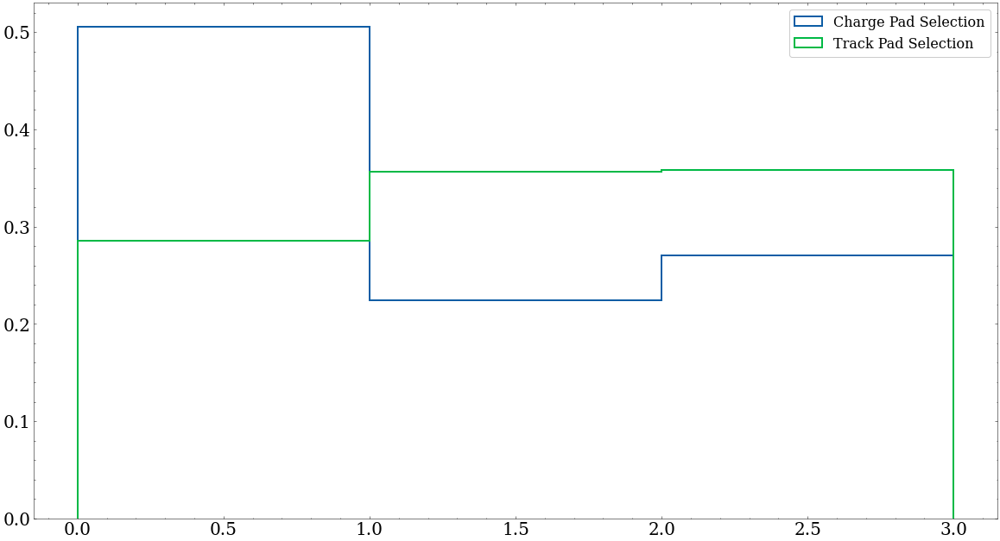

In [221]:
fig, axs = plt.subplots(figsize=(20, 11))
# axs.bar([0,1,2], [np.count_nonzero(which_cross==0),np.count_nonzero(which_cross==1),np.count_nonzero(which_cross==2)], width=0.4, color='blue', label='Charge Pad Selection')
# axs.bar([0,1,2], [np.count_nonzero(which_cross_xy==0),np.count_nonzero(which_cross_xy==1),np.count_nonzero(which_cross_xy==2)], width=0.4, color='red', label='Track Pad Selection', alpha=0.5)

cbins = [0,1,2,3]
aa = [np.count_nonzero(which_cross==0),np.count_nonzero(which_cross==1),np.count_nonzero(which_cross==2)]
axs.hist(cbins[:-1], cbins, weights=aa, histtype='step', lw=2, label='Charge Pad Selection', density=True)

aa = [np.count_nonzero(which_cross_xy==0),np.count_nonzero(which_cross_xy==1),np.count_nonzero(which_cross_xy==2)]
axs.hist(cbins[:-1], cbins, weights=aa, histtype='step', lw=2, label='Track Pad Selection', density=True)

axs.legend(loc=1)
plt.show()

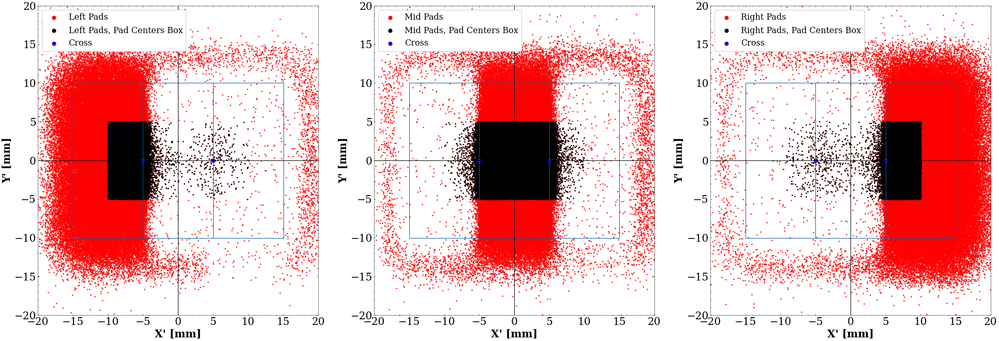

In [222]:
fig, axs = plt.subplots(1, 3, figsize=(33, 11))
axs[0].scatter(x_s[left_cross_mask_all], y_s[left_cross_mask_all], s=2, color='red', label='Left Pads')
axs[1].scatter(x_s[mid_mask_all], y_s[mid_mask_all], s=2, color='red', label='Mid Pads')
axs[2].scatter(x_s[right_cross_mask_all], y_s[right_cross_mask_all], s=2, color='red', label='Right Pads')

# axs[0].scatter(x_s[left_cross_mask*pad_center_box_cut], y_s[left_cross_mask*pad_center_box_cut], s=1, color='black', label='Left Pads, Pad Centers Box')
# axs[1].scatter(x_s[mid_mask*pad_center_box_cut], y_s[mid_mask*pad_center_box_cut], s=1, color='black', label='Mid Pads, Pad Centers Box')
# axs[2].scatter(x_s[right_cross_mask*pad_center_box_cut], y_s[right_cross_mask*pad_center_box_cut], s=1, color='black', label='Right Pads, Pad Centers Box')

axs[0].scatter(x_s[pad_center_box_cut][left_cross_mask], y_s[pad_center_box_cut][left_cross_mask], s=2, color='black', label='Left Pads, Pad Centers Box')
axs[1].scatter(x_s[pad_center_box_cut][mid_mask], y_s[pad_center_box_cut][mid_mask], s=2, color='black', label='Mid Pads, Pad Centers Box')
axs[2].scatter(x_s[pad_center_box_cut][right_cross_mask], y_s[pad_center_box_cut][right_cross_mask], s=2, color='black', label='Right Pads, Pad Centers Box')
for i in range(3):
    axs[i].axvline(centers_s[0][5]-5, ymin=0.25, ymax=0.75)
    axs[i].axhline(centers_s[1][5]-5, xmin=0.125, xmax=0.875)

    axs[i].axvline(centers_s[0][0]+5, ymin=0.25, ymax=0.75)
    axs[i].axhline(centers_s[1][0]+5, xmin=0.125, xmax=0.875)
    
    axs[i].axvline(centers_s[0][2]+5, ymin=0.25, ymax=0.75)
    axs[i].axvline(centers_s[0][2]-5, ymin=0.25, ymax=0.75)

for i in range(3):
    axs[i].axhline(0, lw=1, color='black')
    axs[i].axvline(0, lw=1, color='black')
    axs[i].scatter(0, 0, color='black', s=100, marker='+')
    axs[i].scatter(cross2_s[0,0], cross2_s[0,1], color='blue', s=50, marker='o', label='Cross')
    axs[i].scatter(cross2_s[1,0], cross2_s[1,1], color='blue', s=50, marker='o')


    axs[i].set_xlim(-20, 20)
    axs[i].set_ylim(-20, 20)
    leg = axs[i].legend(loc=2, markerscale=5)
    leg.legendHandles[-1].set_sizes([50])
    
    axs[i].set_xlabel('X\' [mm]')
    axs[i].set_ylabel('Y\' [mm]')
plt.show()

In [223]:
# fig, axs = plt.subplots(1, 3, figsize=(33, 11))
# # axs[0].scatter(x_s[left_cross_xy_mask], y_s[left_cross_xy_mask], s=2, color='red', label='Left Pads')
# # axs[1].scatter(x_s[mid_xy_mask], y_s[mid_xy_mask], s=2, color='red', label='Mid Pads')
# # axs[2].scatter(x_s[right_cross_xy_mask], y_s[right_cross_xy_mask], s=2, color='red', label='Right Pads')

# axs[0].scatter(x_s[left_cross_xy_mask*pad_center_box_cut], y_s[left_cross_xy_mask*pad_center_box_cut], s=1, color='black', label='Left Pads, Pad Centers Box')
# axs[1].scatter(x_s[mid_xy_mask*pad_center_box_cut], y_s[mid_xy_mask*pad_center_box_cut], s=1, color='black', label='Mid Pads, Pad Centers Box')
# axs[2].scatter(x_s[right_cross_xy_mask*pad_center_box_cut], y_s[right_cross_xy_mask*pad_center_box_cut], s=1, color='black', label='Right Pads, Pad Centers Box')


# for i in range(3):
#     axs[i].axhline(0, lw=1, color='black')
#     axs[i].axvline(0, lw=1, color='black')
#     axs[i].scatter(0, 0, color='black', s=100, marker='+')
#     axs[i].scatter(cross2_s[0,0], cross2_s[0,1], color='blue', s=50, marker='o', label='Cross')
#     axs[i].scatter(cross2_s[1,0], cross2_s[1,1], color='blue', s=50, marker='o')


#     axs[i].set_xlim(-10, 10)
#     axs[i].set_ylim(-10, 10)
#     leg = axs[i].legend(loc=2, markerscale=5)
#     leg.legendHandles[-1].set_sizes([50])
    
#     axs[i].set_xlabel('X\' [mm]')
#     axs[i].set_ylabel('Y\' [mm]')
# plt.show()

In [224]:
# aa = [np.count_nonzero(which_cross==0),np.count_nonzero(which_cross==1),np.count_nonzero(which_cross==2)]
# aa = [np.count_nonzero(which_cross_xy==0),np.count_nonzero(which_cross_xy==1),np.count_nonzero(which_cross_xy==2)]
mm_qall_vec[pad_center_box_cut]

for i in range(100):
    if which_cross_xy[i] != which_cross[i] and np.logical_and(which_cross_xy[i]>=0, which_cross[i]>=0):
        if np.max(mm_v_vec[pad_center_box_cut][i]) < 0.37:
            print((which_cross_xy[i], which_cross[i]))
            print((x_s[pad_center_box_cut][i], y_s[pad_center_box_cut][i]))
            print(mm_qall_vec[pad_center_box_cut][i])
            print(mm_v_vec[pad_center_box_cut][i])
            print(100*'#')

(1, 2)
(6.573615960122235, 1.9262306980028172)
[48.79127388  4.72881706  0.19820916  0.16239833  0.07042095 -0.15592063]
[0.22318588 0.02883969 0.01375962 0.01108624 0.00966294 0.00825859]
####################################################################################################
(1, 2)
(7.2277196509416965, 1.475554958695312)
[27.46878643  8.95164653  4.57088061  0.3652668   0.36147923  0.        ]
[0.12086909 0.04405136 0.02884875 0.00874458 0.00742182 0.00521712]
####################################################################################################
(0, 2)
(-1.8987562883794276, -0.7325402184819614)
[ 3.78856954e+01  2.48624514e+01  1.90401903e-01  6.69465355e-01
 -5.74772680e-03  3.49211713e-01]
[0.15632323 0.1065076  0.01226371 0.01163574 0.00971649 0.00713006]
####################################################################################################
(1, 2)
(5.862026324842765, -1.1991325145154836)
[14.46099521 20.6650905   0.56235064  0.26681797  0.08

In [225]:
# dt3c = np.zeros(N)
# dt4c = np.zeros(N)
# dt5c = np.zeros(N)
# dt6c = np.zeros(N)

# dt3c[xyc1_pad3_qa] = 1e3*dt3[xyc1_pad3_qa]-expo2_np(mm3_qall[xyc1_pad3_qa], pars3in3c1_qa)
# dt4c[xyc1_pad3_qa] = 1e3*dt4[xyc1_pad3_qa]-expo2_np(mm4_qall[xyc1_pad3_qa], pars4in3c1_qa)
# dt5c[xyc1_pad3_qa] = 1e3*dt5[xyc1_pad3_qa]-expo2_np(mm5_qall[xyc1_pad3_qa], pars5in3c1_qa)
# dt6c[xyc1_pad3_qa] = 1e3*dt6[xyc1_pad3_qa]-expo2_np(mm6_qall[xyc1_pad3_qa], pars6in3c1_qa)

# dt3c[xyc1_pad4_qa] = 1e3*dt3[xyc1_pad4_qa]-expo2_np(mm3_qall[xyc1_pad4_qa], pars3in4c1_qa)
# dt4c[xyc1_pad4_qa] = 1e3*dt4[xyc1_pad4_qa]-expo2_np(mm4_qall[xyc1_pad4_qa], pars4in4c1_qa)
# dt5c[xyc1_pad4_qa] = 1e3*dt5[xyc1_pad4_qa]-expo2_np(mm5_qall[xyc1_pad4_qa], pars5in4c1_qa)
# dt6c[xyc1_pad4_qa] = 1e3*dt6[xyc1_pad4_qa]-expo2_np(mm6_qall[xyc1_pad4_qa], pars6in4c1_qa)

# dt3c[xyc1_pad5_qa] = 1e3*dt3[xyc1_pad5_qa]-expo2_np(mm3_qall[xyc1_pad5_qa], pars3in5c1_qa)
# dt4c[xyc1_pad5_qa] = 1e3*dt4[xyc1_pad5_qa]-expo2_np(mm4_qall[xyc1_pad5_qa], pars4in5c1_qa)
# dt5c[xyc1_pad5_qa] = 1e3*dt5[xyc1_pad5_qa]-expo2_np(mm5_qall[xyc1_pad5_qa], pars5in5c1_qa)
# dt6c[xyc1_pad5_qa] = 1e3*dt6[xyc1_pad5_qa]-expo2_np(mm6_qall[xyc1_pad5_qa], pars6in5c1_qa)

# dt3c[xyc1_pad6_qa] = 1e3*dt3[xyc1_pad6_qa]-expo2_np(mm3_qall[xyc1_pad6_qa], pars3in6c1_qa)
# dt4c[xyc1_pad6_qa] = 1e3*dt4[xyc1_pad6_qa]-expo2_np(mm4_qall[xyc1_pad6_qa], pars4in6c1_qa)
# dt5c[xyc1_pad6_qa] = 1e3*dt5[xyc1_pad6_qa]-expo2_np(mm5_qall[xyc1_pad6_qa], pars5in6c1_qa)
# dt6c[xyc1_pad6_qa] = 1e3*dt6[xyc1_pad6_qa]-expo2_np(mm6_qall[xyc1_pad6_qa], pars6in6c1_qa)

dt1c = np.zeros((N, 2))
dt2c = np.zeros((N, 2))
dt3c = np.zeros((N, 2))
dt4c = np.zeros((N, 2))
dt5c = np.zeros((N, 2))
dt6c = np.zeros((N, 2))

dt3c[xyc1_pad3_qa, 0] = 1e3*dt3[xyc1_pad3_qa]-expo2_np(mm3_qall[xyc1_pad3_qa], pars3in3c1_qa)
dt3c[xyc1_pad3_qa, 1] = expo2_np(mm3_qall[xyc1_pad3_qa], spars3in3c1_qa)
dt4c[xyc1_pad3_qa, 0] = 1e3*dt4[xyc1_pad3_qa]-expo2_np(mm4_qall[xyc1_pad3_qa], pars4in3c1_qa)
dt4c[xyc1_pad3_qa, 1] = expo2_np(mm4_qall[xyc1_pad3_qa], spars4in3c1_qa)
dt5c[xyc1_pad3_qa, 0] = 1e3*dt5[xyc1_pad3_qa]-expo2_np(mm5_qall[xyc1_pad3_qa], pars5in3c1_qa)
dt5c[xyc1_pad3_qa, 1] = expo2_np(mm5_qall[xyc1_pad3_qa], spars5in3c1_qa)
dt6c[xyc1_pad3_qa, 0] = 1e3*dt6[xyc1_pad3_qa]-expo2_np(mm6_qall[xyc1_pad3_qa], pars6in3c1_qa)
dt6c[xyc1_pad3_qa, 1] = expo2_np(mm6_qall[xyc1_pad3_qa], spars6in3c1_qa)

dt3c[xyc1_pad4_qa, 0] = 1e3*dt3[xyc1_pad4_qa]-expo2_np(mm3_qall[xyc1_pad4_qa], pars3in4c1_qa)
dt3c[xyc1_pad4_qa, 1] = expo2_np(mm3_qall[xyc1_pad4_qa], spars3in4c1_qa)
dt4c[xyc1_pad4_qa, 0] = 1e3*dt4[xyc1_pad4_qa]-expo2_np(mm4_qall[xyc1_pad4_qa], pars4in4c1_qa)
dt4c[xyc1_pad4_qa, 1] = expo2_np(mm4_qall[xyc1_pad4_qa], spars4in4c1_qa)
dt5c[xyc1_pad4_qa, 0] = 1e3*dt5[xyc1_pad4_qa]-expo2_np(mm5_qall[xyc1_pad4_qa], pars5in4c1_qa)
dt5c[xyc1_pad4_qa, 1] = expo2_np(mm5_qall[xyc1_pad4_qa], spars5in4c1_qa)
dt6c[xyc1_pad4_qa, 0] = 1e3*dt6[xyc1_pad4_qa]-expo2_np(mm6_qall[xyc1_pad4_qa], pars6in4c1_qa)
dt6c[xyc1_pad4_qa, 1] = expo2_np(mm6_qall[xyc1_pad4_qa], spars6in4c1_qa)

dt3c[xyc1_pad5_qa, 0] = 1e3*dt3[xyc1_pad5_qa]-expo2_np(mm3_qall[xyc1_pad5_qa], pars3in5c1_qa)
dt3c[xyc1_pad5_qa, 1] = expo2_np(mm3_qall[xyc1_pad5_qa], spars3in5c1_qa)
dt4c[xyc1_pad5_qa, 0] = 1e3*dt4[xyc1_pad5_qa]-expo2_np(mm4_qall[xyc1_pad5_qa], pars4in5c1_qa)
dt4c[xyc1_pad5_qa, 1] = expo2_np(mm4_qall[xyc1_pad5_qa], spars4in5c1_qa)
dt5c[xyc1_pad5_qa, 0] = 1e3*dt5[xyc1_pad5_qa]-expo2_np(mm5_qall[xyc1_pad5_qa], pars5in5c1_qa)
dt5c[xyc1_pad5_qa, 1] = expo2_np(mm5_qall[xyc1_pad5_qa], spars5in5c1_qa)
dt6c[xyc1_pad5_qa, 0] = 1e3*dt6[xyc1_pad5_qa]-expo2_np(mm6_qall[xyc1_pad5_qa], pars6in5c1_qa)
dt6c[xyc1_pad5_qa, 1] = expo2_np(mm6_qall[xyc1_pad5_qa], spars6in5c1_qa)

dt3c[xyc1_pad6_qa, 0] = 1e3*dt3[xyc1_pad6_qa]-expo2_np(mm3_qall[xyc1_pad6_qa], pars3in6c1_qa)
dt3c[xyc1_pad6_qa, 1] = expo2_np(mm3_qall[xyc1_pad6_qa], spars3in6c1_qa)
dt4c[xyc1_pad6_qa, 0] = 1e3*dt4[xyc1_pad6_qa]-expo2_np(mm4_qall[xyc1_pad6_qa], pars4in6c1_qa)
dt4c[xyc1_pad6_qa, 1] = expo2_np(mm4_qall[xyc1_pad6_qa], spars4in6c1_qa)
dt5c[xyc1_pad6_qa, 0] = 1e3*dt5[xyc1_pad6_qa]-expo2_np(mm5_qall[xyc1_pad6_qa], pars5in6c1_qa)
dt5c[xyc1_pad6_qa, 1] = expo2_np(mm5_qall[xyc1_pad6_qa], spars5in6c1_qa)
dt6c[xyc1_pad6_qa, 0] = 1e3*dt6[xyc1_pad6_qa]-expo2_np(mm6_qall[xyc1_pad6_qa], pars6in6c1_qa)
dt6c[xyc1_pad6_qa, 1] = expo2_np(mm6_qall[xyc1_pad6_qa], spars6in6c1_qa)


In [226]:
class share_fun():
    def __init__(self, times, resols):
        self.times = times
        self.resols = resols
    def __call__(self, params):
        test = params[0]
        res = np.sum( np.square( test - self.times ) / np.square( self.resols ) )
        return res



In [227]:
# temp = np.zeros(N)
temp = []

for t3,t4,t5,t6 in zip(dt3c[xyc1_pad3_qa],dt4c[xyc1_pad3_qa],dt5c[xyc1_pad3_qa],dt6c[xyc1_pad3_qa]):
    ts = np.array((t3[0],t4[0],t5[0],t6[0]))
    sts = np.array((t3[1],t4[1],t5[1],t6[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t3[0]]
#     boundaries = [(-15.,15.),(-10.,10.)]
    result = minimize(ff, initial_guess)
    temp.append(result.x)
for t3,t4,t5,t6 in zip(dt3c[xyc1_pad4_qa],dt4c[xyc1_pad4_qa],dt5c[xyc1_pad4_qa],dt6c[xyc1_pad4_qa]):
    ts = np.array((t3[0],t4[0],t5[0],t6[0]))
    sts = np.array((t3[1],t4[1],t5[1],t6[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t4[0]]
#     boundaries = [(-15.,15.),(-10.,10.)]
    result = minimize(ff, initial_guess)
    temp.append(result.x)
for t3,t4,t5,t6 in zip(dt3c[xyc1_pad5_qa],dt4c[xyc1_pad5_qa],dt5c[xyc1_pad5_qa],dt6c[xyc1_pad5_qa]):
    ts = np.array((t3[0],t4[0],t5[0],t6[0]))
    sts = np.array((t3[1],t4[1],t5[1],t6[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t5[0]]
#     boundaries = [(-15.,15.),(-10.,10.)]
    result = minimize(ff, initial_guess)
    temp.append(result.x)
for t3,t4,t5,t6 in zip(dt3c[xyc1_pad6_qa],dt4c[xyc1_pad6_qa],dt5c[xyc1_pad6_qa],dt6c[xyc1_pad6_qa]):
    ts = np.array((t3[0],t4[0],t5[0],t6[0]))
    sts = np.array((t3[1],t4[1],t5[1],t6[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t6[0]]
#     boundaries = [(-15.,15.),(-10.,10.)]
    result = minimize(ff, initial_guess)
    temp.append(result.x)
temp = np.array(temp)

In [228]:
dt1c[xyc2_pad1_qa, 0] = 1e3*dt1[xyc2_pad1_qa]-expo2_np(mm1_qall[xyc2_pad1_qa], pars1in1c2_qa)
dt1c[xyc2_pad1_qa, 1] = expo2_np(mm1_qall[xyc2_pad1_qa], spars1in1c2_qa)
dt2c[xyc2_pad1_qa, 0] = 1e3*dt2[xyc2_pad1_qa]-expo2_np(mm2_qall[xyc2_pad1_qa], pars2in1c2_qa)
dt2c[xyc2_pad1_qa, 1] = expo2_np(mm2_qall[xyc2_pad1_qa], spars2in1c2_qa)
dt3c[xyc2_pad1_qa, 0] = 1e3*dt3[xyc2_pad1_qa]-expo2_np(mm3_qall[xyc2_pad1_qa], pars3in1c2_qa)
dt3c[xyc2_pad1_qa, 1] = expo2_np(mm3_qall[xyc2_pad1_qa], spars3in1c2_qa)
dt4c[xyc2_pad1_qa, 0] = 1e3*dt4[xyc2_pad1_qa]-expo2_np(mm4_qall[xyc2_pad1_qa], pars4in1c2_qa)
dt4c[xyc2_pad1_qa, 1] = expo2_np(mm4_qall[xyc2_pad1_qa], spars4in1c2_qa)

dt1c[xyc2_pad2_qa, 0] = 1e3*dt1[xyc2_pad2_qa]-expo2_np(mm1_qall[xyc2_pad2_qa], pars1in2c2_qa)
dt1c[xyc2_pad2_qa, 1] = expo2_np(mm1_qall[xyc2_pad2_qa], spars1in2c2_qa)
dt2c[xyc2_pad2_qa, 0] = 1e3*dt2[xyc2_pad2_qa]-expo2_np(mm2_qall[xyc2_pad2_qa], pars2in2c2_qa)
dt2c[xyc2_pad2_qa, 1] = expo2_np(mm2_qall[xyc2_pad2_qa], spars2in2c2_qa)
dt3c[xyc2_pad2_qa, 0] = 1e3*dt3[xyc2_pad2_qa]-expo2_np(mm3_qall[xyc2_pad2_qa], pars3in2c2_qa)
dt3c[xyc2_pad2_qa, 1] = expo2_np(mm3_qall[xyc2_pad2_qa], spars3in2c2_qa)
dt4c[xyc2_pad2_qa, 0] = 1e3*dt4[xyc2_pad2_qa]-expo2_np(mm4_qall[xyc2_pad2_qa], pars4in2c2_qa)
dt4c[xyc2_pad2_qa, 1] = expo2_np(mm4_qall[xyc2_pad2_qa], spars4in2c2_qa)

dt1c[xyc2_pad3_qa, 0] = 1e3*dt1[xyc2_pad3_qa]-expo2_np(mm1_qall[xyc2_pad3_qa], pars1in3c2_qa)
dt1c[xyc2_pad3_qa, 1] = expo2_np(mm1_qall[xyc2_pad3_qa], spars1in3c2_qa)
dt2c[xyc2_pad3_qa, 0] = 1e3*dt2[xyc2_pad3_qa]-expo2_np(mm2_qall[xyc2_pad3_qa], pars2in3c2_qa)
dt2c[xyc2_pad3_qa, 1] = expo2_np(mm2_qall[xyc2_pad3_qa], spars2in3c2_qa)
dt3c[xyc2_pad3_qa, 0] = 1e3*dt3[xyc2_pad3_qa]-expo2_np(mm3_qall[xyc2_pad3_qa], pars3in3c2_qa)
dt3c[xyc2_pad3_qa, 1] = expo2_np(mm3_qall[xyc2_pad3_qa], spars3in3c2_qa)
dt4c[xyc2_pad3_qa, 0] = 1e3*dt4[xyc2_pad3_qa]-expo2_np(mm4_qall[xyc2_pad3_qa], pars4in3c2_qa)
dt4c[xyc2_pad3_qa, 1] = expo2_np(mm4_qall[xyc2_pad3_qa], spars4in3c2_qa)

dt1c[xyc2_pad4_qa, 0] = 1e3*dt1[xyc2_pad4_qa]-expo2_np(mm1_qall[xyc2_pad4_qa], pars1in4c2_qa)
dt1c[xyc2_pad4_qa, 1] = expo2_np(mm1_qall[xyc2_pad4_qa], spars1in4c2_qa)
dt2c[xyc2_pad4_qa, 0] = 1e3*dt2[xyc2_pad4_qa]-expo2_np(mm2_qall[xyc2_pad4_qa], pars2in4c2_qa)
dt2c[xyc2_pad4_qa, 1] = expo2_np(mm2_qall[xyc2_pad4_qa], spars2in4c2_qa)
dt3c[xyc2_pad4_qa, 0] = 1e3*dt3[xyc2_pad4_qa]-expo2_np(mm3_qall[xyc2_pad4_qa], pars3in4c2_qa)
dt3c[xyc2_pad4_qa, 1] = expo2_np(mm3_qall[xyc2_pad4_qa], spars3in4c2_qa)
dt4c[xyc2_pad4_qa, 0] = 1e3*dt4[xyc2_pad4_qa]-expo2_np(mm4_qall[xyc2_pad4_qa], pars4in4c2_qa)
dt4c[xyc2_pad4_qa, 1] = expo2_np(mm4_qall[xyc2_pad4_qa], spars4in4c2_qa)


/tmp/ipykernel_519/3663641821.py:12: RuntimeWarning: overflow encountered in exp
  return np.exp(pars[0]*x + pars[1]) + np.exp(pars[2]*x + pars[3]) + pars[4]


In [229]:
temp2 = []

# boundaries = [(-15.,15.),(-10.,10.)]
for t1,t2,t3,t4 in zip(dt1c[xyc2_pad1_qa],dt2c[xyc2_pad1_qa],dt3c[xyc2_pad1_qa],dt4c[xyc2_pad1_qa]):
    ts = np.array((t1[0],t2[0],t3[0],t4[0]))
    sts = np.array((t1[1],t2[1],t3[1],t4[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t1[0]]
    result = minimize(ff, initial_guess)
    temp2.append(result.x)
for t1,t2,t3,t4 in zip(dt1c[xyc2_pad2_qa],dt2c[xyc2_pad2_qa],dt3c[xyc2_pad2_qa],dt4c[xyc2_pad2_qa]):
    ts = np.array((t1[0],t2[0],t3[0],t4[0]))
    sts = np.array((t1[1],t2[1],t3[1],t4[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t2[0]]
    result = minimize(ff, initial_guess)
    temp2.append(result.x)
for t1,t2,t3,t4 in zip(dt1c[xyc2_pad3_qa],dt2c[xyc2_pad3_qa],dt3c[xyc2_pad3_qa],dt4c[xyc2_pad3_qa]):
    ts = np.array((t1[0],t2[0],t3[0],t4[0]))
    sts = np.array((t1[1],t2[1],t3[1],t4[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t3[0]]
    result = minimize(ff, initial_guess)
    temp2.append(result.x)
for t1,t2,t3,t4 in zip(dt1c[xyc2_pad4_qa],dt2c[xyc2_pad4_qa],dt3c[xyc2_pad4_qa],dt4c[xyc2_pad4_qa]):
    ts = np.array((t1[0],t2[0],t3[0],t4[0]))
    sts = np.array((t1[1],t2[1],t3[1],t4[1]))
    ff = share_fun(ts, sts)
    
    initial_guess = [t4[0]]
    result = minimize(ff, initial_guess)
    temp2.append(result.x)
temp2 = np.array(temp2)


 FCN=415.791 FROM MIGRAD    STATUS=CONVERGED      68 CALLS          69 TOTAL
                     EDM=3.65719e-10    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     1.94139e+03   1.54414e+01   1.18906e-01   3.07600e-07
   2  Mean        -7.32996e-01   1.35885e-01   1.33369e-03   1.98508e-04
   3  Sigma        2.17751e+01   1.09973e-01   1.21582e-05   7.09140e-03
 FCN=362.97 FROM MIGRAD    STATUS=CONVERGED      65 CALLS          66 TOTAL
                     EDM=1.62609e-07    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     1.90132e+03   1.49429e+01   1.07942e-01  -4.37781e-05
   2  Mean        -2.15604e-01   1.39230e-01   1.28289e-03  -4.79021e-04
   3  Sigma        2.25971e+01   1

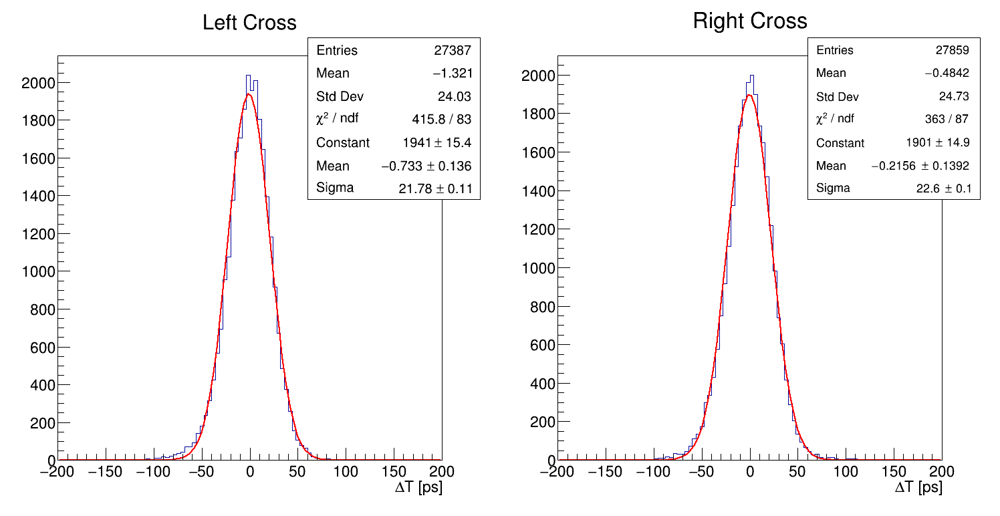

In [230]:
ROOT.gStyle.SetOptStat(1110)
c = ROOT.TCanvas('ccc2', '', 1500, 800)
c.Divide(2,1)

htc1 = ROOT.TH1D('htc1', 'Left Cross; #DeltaT [ps]', 100, -200, 200)
htc1.FillN(temp.size, temp, 0, 1)



htc2 = ROOT.TH1D('htc2', 'Right Cross; #DeltaT [ps]', 100, -200, 200)
htc2.FillN(temp2.size, temp2, 0, 1)


c.cd(1)
htc1.Draw()
htc1.Fit('gaus')
c.cd(2)
htc2.Draw()
htc2.Fit('gaus')
c.Draw()

In [231]:
# print(mm_qall_vec[:, c1_order][n_active_pads_id[1]*xyc1_pad3_qa])
# print(100*'-')
print(mm_qall_vec[n_active_pads_id[1]*xyc1_pad3_qa, 2:6])
# np.where(n_active_pads_id[1]*xyc1_pad3_qa)
for i in np.where(n_active_pads_id[1]*xyc1_pad3_qa)[0]:
    t3,t4,t5,t6 = dt3c[i], dt4c[i], dt5c[i], dt6c[i]
    ts = np.array((t3[0],t4[0],t5[0],t6[0]))
    sts = np.array((t3[1],t4[1],t5[1],t6[1]))
    qsq = np.array((mm_qall_vec[i,2],mm_qall_vec[i,3],mm_qall_vec[i,4],mm_qall_vec[i,5]))
    ts = np.where(qsq < 1.0, 0, ts)
    print(ts)

[[19.67564503  0.84309643  0.          0.6946742 ]
 [28.39630513  0.46825554  0.74495591  0.08458821]
 [29.51502996  0.50960952  0.42184711  0.25312098]
 [ 5.72067281  0.72363277  0.79359637  0.11876245]
 [46.45059714  0.58251293 -0.21124156 -0.16469605]]
[18.50812222  0.          0.          0.        ]
[10.24967555  0.          0.          0.        ]
[24.37384664  0.          0.          0.        ]
[-24.33837062   0.           0.           0.        ]
[-17.32861692   0.           0.           0.        ]


In [232]:
def calc_actives_tt_c1(nac = 0):
    temp_ac1 = []

    for i in np.where(n_active_pads_id[nac]*xyc1_pad3_qa)[0]:
        t3,t4,t5,t6 = dt3c[i], dt4c[i], dt5c[i], dt6c[i]
        ts = np.array((t3[0],t4[0],t5[0],t6[0]))
        sts = np.array((t3[1],t4[1],t5[1],t6[1]))
        qsq = np.array((mm_qall_vec[i,2],mm_qall_vec[i,3],mm_qall_vec[i,4],mm_qall_vec[i,5]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t3[0]]
        result = minimize(ff, initial_guess)
        temp_ac1.append(result.x)

    for i in np.where(n_active_pads_id[nac]*xyc1_pad4_qa)[0]:
        t3,t4,t5,t6 = dt3c[i], dt4c[i], dt5c[i], dt6c[i]
        ts = np.array((t3[0],t4[0],t5[0],t6[0]))
        sts = np.array((t3[1],t4[1],t5[1],t6[1]))
        qsq = np.array((mm_qall_vec[i,2],mm_qall_vec[i,3],mm_qall_vec[i,4],mm_qall_vec[i,5]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t4[0]]
        result = minimize(ff, initial_guess)
        temp_ac1.append(result.x)

    for i in np.where(n_active_pads_id[nac]*xyc1_pad5_qa)[0]:
        t3,t4,t5,t6 = dt3c[i], dt4c[i], dt5c[i], dt6c[i]
        ts = np.array((t3[0],t4[0],t5[0],t6[0]))
        sts = np.array((t3[1],t4[1],t5[1],t6[1]))
        qsq = np.array((mm_qall_vec[i,2],mm_qall_vec[i,3],mm_qall_vec[i,4],mm_qall_vec[i,5]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t5[0]]
        result = minimize(ff, initial_guess)
        temp_ac1.append(result.x)

    for i in np.where(n_active_pads_id[nac]*xyc1_pad6_qa)[0]:
        t3,t4,t5,t6 = dt3c[i], dt4c[i], dt5c[i], dt6c[i]
        ts = np.array((t3[0],t4[0],t5[0],t6[0]))
        sts = np.array((t3[1],t4[1],t5[1],t6[1]))
        qsq = np.array((mm_qall_vec[i,2],mm_qall_vec[i,3],mm_qall_vec[i,4],mm_qall_vec[i,5]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t6[0]]
        result = minimize(ff, initial_guess)
        temp_ac1.append(result.x)


    temp_ac1 = np.array(temp_ac1)
    return temp_ac1

def calc_actives_tt_c2(nac = 0):
    temp_ac2 = []

    for i in np.where(n_active_pads_id[nac]*xyc2_pad1_qa)[0]:
        t1,t2,t3,t4 = dt1c[i], dt2c[i], dt3c[i], dt4c[i]
        ts = np.array((t1[0],t2[0],t3[0],t4[0]))
        sts = np.array((t1[1],t2[1],t3[1],t4[1]))
        qsq = np.array((mm_qall_vec[i,0],mm_qall_vec[i,1],mm_qall_vec[i,2],mm_qall_vec[i,3]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t1[0]]
        result = minimize(ff, initial_guess)
        temp_ac2.append(result.x)

    for i in np.where(n_active_pads_id[nac]*xyc2_pad2_qa)[0]:
        t1,t2,t3,t4 = dt1c[i], dt2c[i], dt3c[i], dt4c[i]
        ts = np.array((t1[0],t2[0],t3[0],t4[0]))
        sts = np.array((t1[1],t2[1],t3[1],t4[1]))
        qsq = np.array((mm_qall_vec[i,0],mm_qall_vec[i,1],mm_qall_vec[i,2],mm_qall_vec[i,3]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t2[0]]
        result = minimize(ff, initial_guess)
        temp_ac2.append(result.x)
        

    for i in np.where(n_active_pads_id[nac]*xyc2_pad3_qa)[0]:
        t1,t2,t3,t4 = dt1c[i], dt2c[i], dt3c[i], dt4c[i]
        ts = np.array((t1[0],t2[0],t3[0],t4[0]))
        sts = np.array((t1[1],t2[1],t3[1],t4[1]))
        qsq = np.array((mm_qall_vec[i,0],mm_qall_vec[i,1],mm_qall_vec[i,2],mm_qall_vec[i,3]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t3[0]]
        result = minimize(ff, initial_guess)
        temp_ac2.append(result.x)
        

    for i in np.where(n_active_pads_id[nac]*xyc2_pad4_qa)[0]:
        t1,t2,t3,t4 = dt1c[i], dt2c[i], dt3c[i], dt4c[i]
        ts = np.array((t1[0],t2[0],t3[0],t4[0]))
        sts = np.array((t1[1],t2[1],t3[1],t4[1]))
        qsq = np.array((mm_qall_vec[i,0],mm_qall_vec[i,1],mm_qall_vec[i,2],mm_qall_vec[i,3]))
        ts = np.where(qsq < 1.0, 0, ts)
        ff = share_fun(ts, sts)

        initial_guess = [t4[0]]
        result = minimize(ff, initial_guess)
        temp_ac2.append(result.x)
        


    temp_ac2 = np.array(temp_ac2)
    return temp_ac2

In [233]:
t_ac1_c1 = calc_actives_tt_c1(1)
t_ac2_c1 = calc_actives_tt_c1(2)
t_ac3_c1 = calc_actives_tt_c1(3)
t_ac4_c1 = calc_actives_tt_c1(4)
t_ac5_c1 = calc_actives_tt_c1(5)
t_ac6_c1 = calc_actives_tt_c1(6)

t_ac_c1 = [t_ac1_c1, t_ac2_c1, t_ac3_c1, t_ac4_c1, t_ac5_c1, t_ac6_c1]

In [234]:
t_ac1_c2 = calc_actives_tt_c2(1)
t_ac2_c2 = calc_actives_tt_c2(2)
t_ac3_c2 = calc_actives_tt_c2(3)
t_ac4_c2 = calc_actives_tt_c2(4)
t_ac5_c2 = calc_actives_tt_c2(5)
t_ac6_c2 = calc_actives_tt_c2(6)

t_ac_c2 = [t_ac1_c2, t_ac2_c2, t_ac3_c2, t_ac4_c2, t_ac5_c2, t_ac6_c2]

 FCN=39.7038 FROM MIGRAD    STATUS=CONVERGED      65 CALLS          66 TOTAL
                     EDM=7.55664e-08    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     1.10561e+02   3.96934e+00   9.46911e-03  -8.69482e-06
   2  Mean        -6.94716e+00   5.26135e-01   1.63911e-03   5.96740e-05
   3  Sigma        1.91048e+01   4.42663e-01   1.74887e-05  -5.57729e-02
 FCN=136.735 FROM MIGRAD    STATUS=CONVERGED      68 CALLS          69 TOTAL
                     EDM=1.369e-11    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     6.51190e+02   9.37388e+00   4.15018e-02   2.37457e-07
   2  Mean        -3.35725e+00   2.23491e-01   1.26315e-03   2.17891e-05
   3  Sigma        1.98141e+01   1.

Warning in <TCanvas::Constructor>: Deleting canvas with same name: ccc2


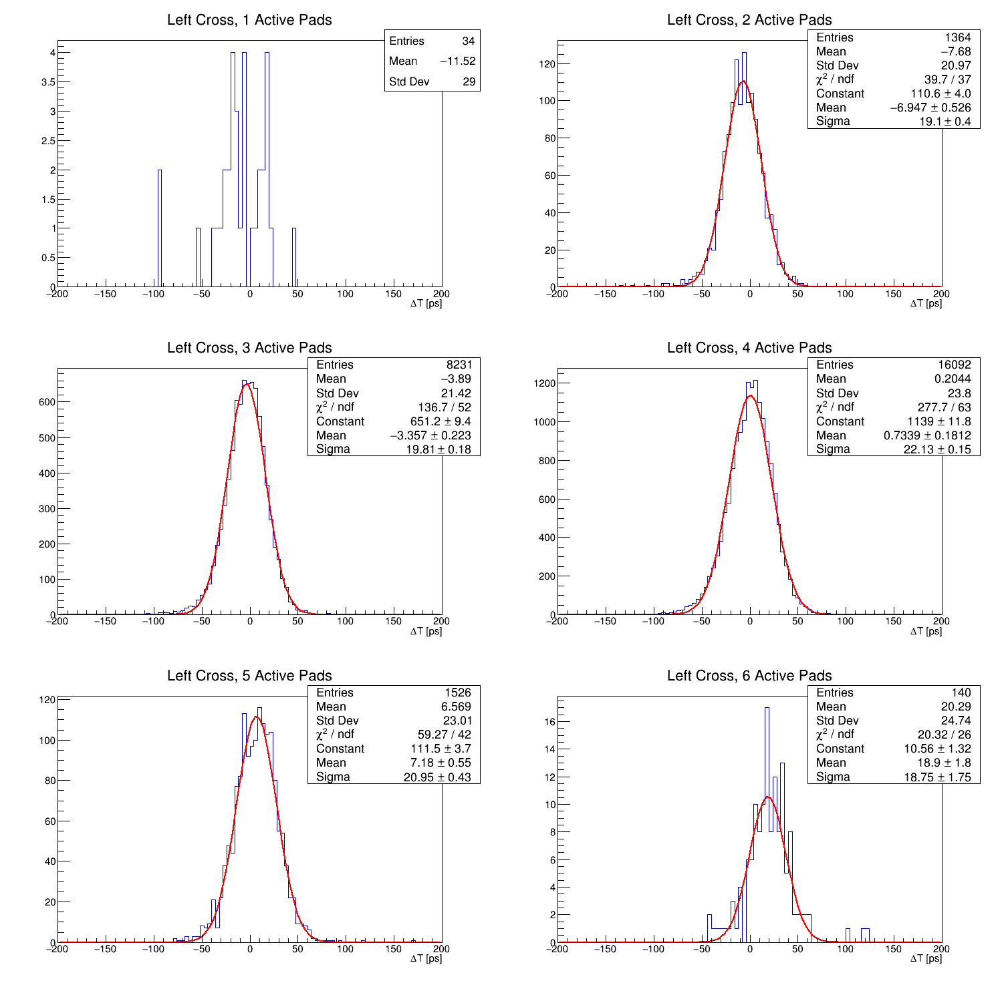

In [235]:
ROOT.gStyle.SetOptStat(1110)
c = ROOT.TCanvas('ccc2', '', 1500, 1500)
c.Divide(2,3)

htca1 = []
for i in range(1,7):
    htca1_temp = ROOT.TH1D(f'htca{i}', f'Left Cross, {i} Active Pads; #DeltaT [ps]', 100, -200, 200)
    htca1_temp.FillN(t_ac_c1[i-1].size, t_ac_c1[i-1], 0, 1)
    htca1.append(htca1_temp)

for i in range(1,7):
    c.cd(i)
    htca1[i-1].Draw()
    if i > 1:
        htca1[i-1].Fit('gaus')

c.Draw()

 FCN=48.2892 FROM MIGRAD    STATUS=CONVERGED      65 CALLS          66 TOTAL
                     EDM=7.97477e-10    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     1.10646e+02   3.93751e+00   1.02414e-02   1.05773e-06
   2  Mean        -7.09390e+00   5.42340e-01   1.84461e-03   3.34345e-05
   3  Sigma        1.98117e+01   4.64370e-01   1.94686e-05  -4.06143e-03
 FCN=115.44 FROM MIGRAD    STATUS=CONVERGED      58 CALLS          59 TOTAL
                     EDM=2.46013e-07    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     6.17481e+02   8.69854e+00   3.60073e-02  -5.28220e-05
   2  Mean        -4.18082e+00   2.37731e-01   1.23051e-03  -2.55105e-03
   3  Sigma        2.10999e+01   1

Warning in <TCanvas::Constructor>: Deleting canvas with same name: ccc2
Warning in <TROOT::Append>: Replacing existing TH1: htca1 (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: htca2 (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: htca3 (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: htca4 (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: htca5 (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: htca6 (Potential memory leak).


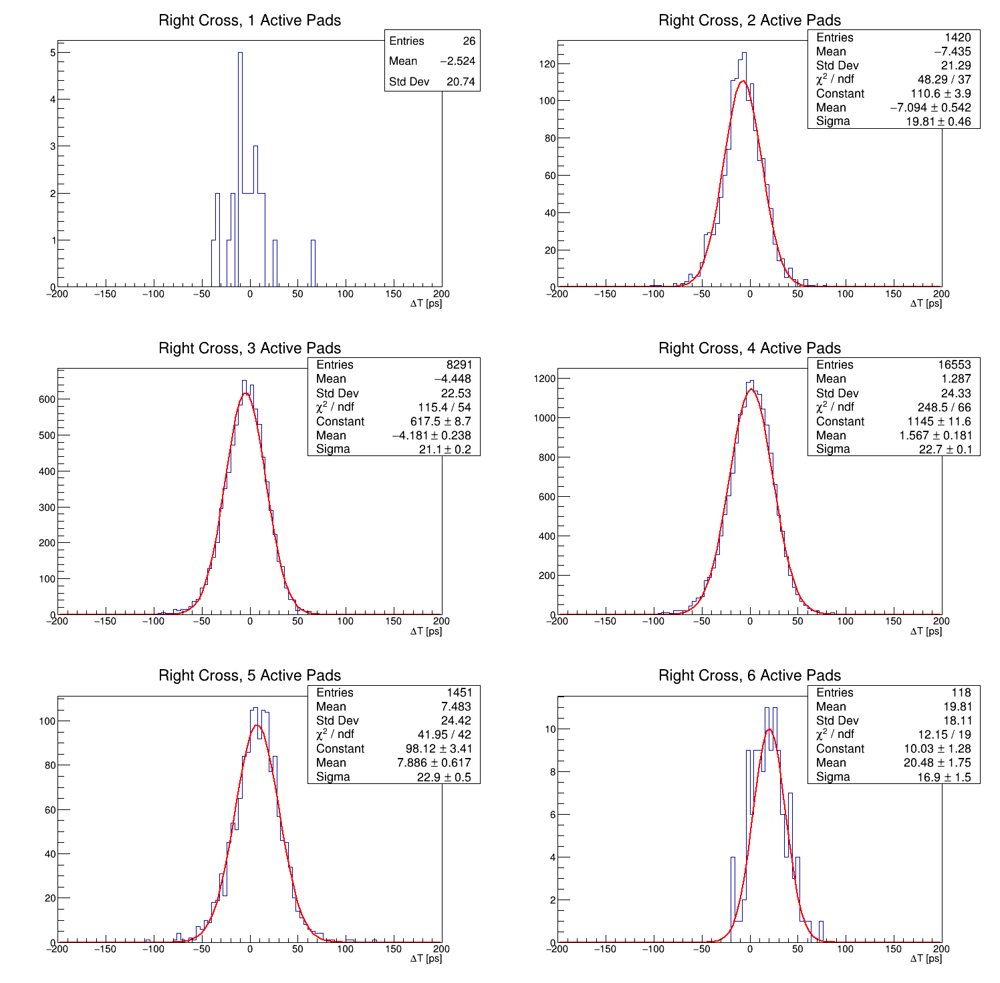

In [236]:
ROOT.gStyle.SetOptStat(1110)
c = ROOT.TCanvas('ccc2', '', 1500, 1500)
c.Divide(2,3)

htca2 = []
for i in range(1,7):
    htca2_temp = ROOT.TH1D(f'htca{i}', f'Right Cross, {i} Active Pads; #DeltaT [ps]', 100, -200, 200)
    htca2_temp.FillN(t_ac_c2[i-1].size, t_ac_c2[i-1], 0, 1)
    htca2.append(htca2_temp)

for i in range(1,7):
    c.cd(i)
    htca2[i-1].Draw()
    if i > 1:
        htca2[i-1].Fit('gaus')

c.Draw()

 FCN=371.939 FROM MIGRAD    STATUS=CONVERGED      70 CALLS          71 TOTAL
                     EDM=2.45305e-11    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     1.99225e+03   1.56913e+01   1.14376e-01   9.67698e-08
   2  Mean        -5.07740e-01   1.33432e-01   1.24059e-03   5.04798e-05
   3  Sigma        2.16091e+01   1.07960e-01   1.15706e-05   2.48511e-03
 FCN=326.07 FROM MIGRAD    STATUS=CONVERGED      65 CALLS          66 TOTAL
                     EDM=1.39862e-09    STRATEGY= 1      ERROR MATRIX ACCURATE 
  EXT PARAMETER                                   STEP         FIRST   
  NO.   NAME      VALUE            ERROR          SIZE      DERIVATIVE 
   1  Constant     1.94603e+03   1.51372e+01   1.03627e-01  -3.37162e-06
   2  Mean        -2.51127e-01   1.37489e-01   1.20082e-03  -1.99840e-04
   3  Sigma        2.25503e+01   1

Warning in <TCanvas::Constructor>: Deleting canvas with same name: ccc2


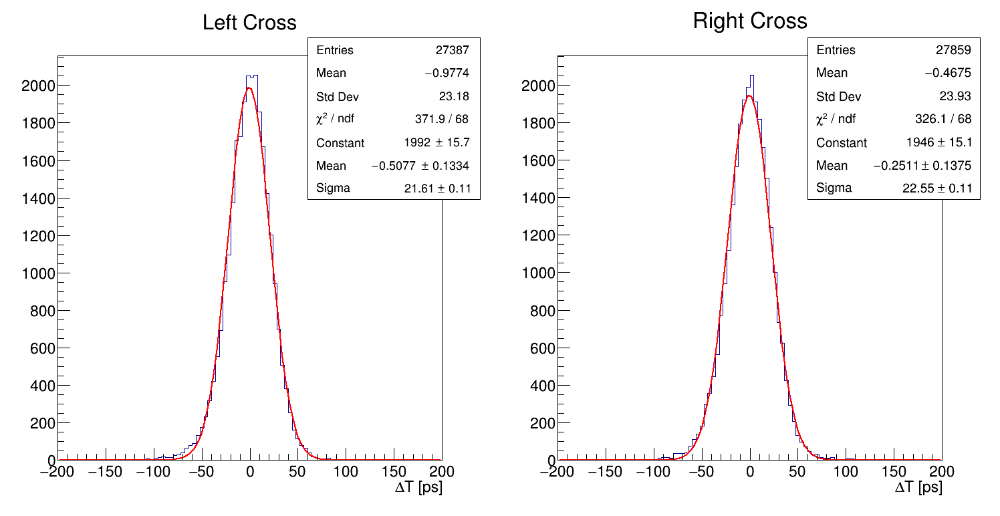

In [237]:
ROOT.gStyle.SetOptStat(1110)
c = ROOT.TCanvas('ccc2', '', 1500, 800)
c.Divide(2)
htcaa1 = ROOT.TH1D('htcaa1', 'Left Cross; #DeltaT [ps]', 100, -200, 200)
for i in range(1,7):
    htcaa1.FillN(t_ac_c1[i-1].size, t_ac_c1[i-1], 0, 1)

htcaa2 = ROOT.TH1D('htcaa2', 'Right Cross; #DeltaT [ps]', 100, -200, 200)
for i in range(1,7):
    htcaa2.FillN(t_ac_c2[i-1].size, t_ac_c2[i-1], 0, 1)

c.cd(1)
htcaa1.Draw()
htcaa1.Fit('gaus')
c.cd(2)
htcaa2.Draw()
htcaa2.Fit('gaus')
c.Draw()

# Position templates

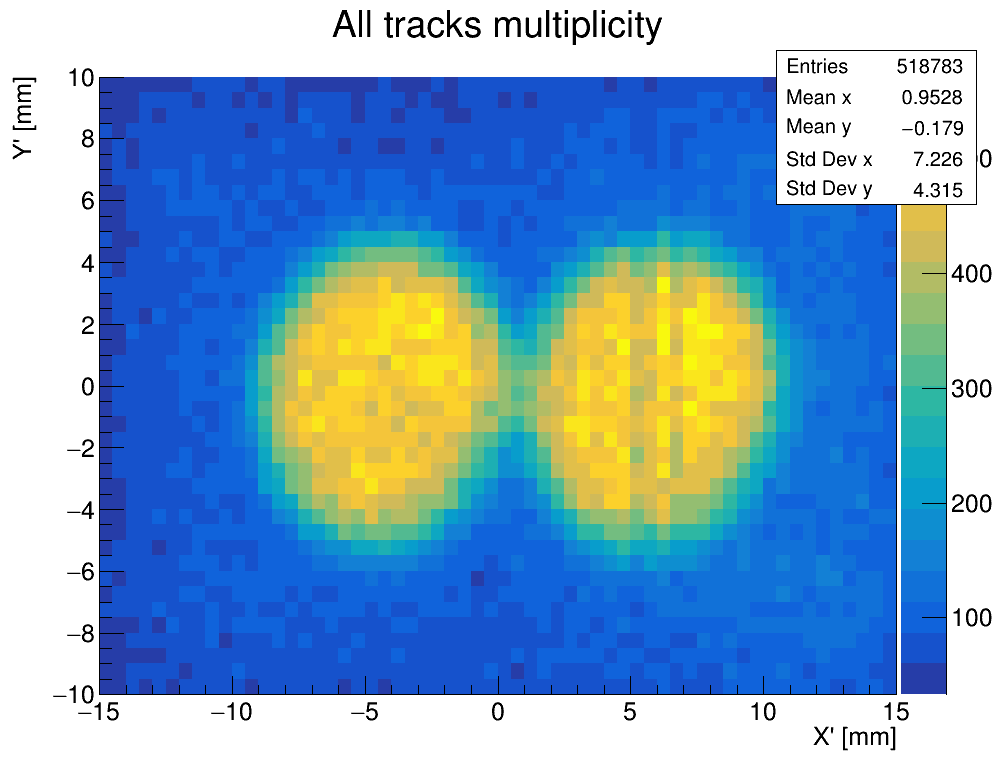

In [238]:
%jsroot off
c = ROOT.TCanvas('cc', '', 1000, 800)
# xystrks = ROOT.TH2D("xystrks",'All tracks multiplicity',300,-15,15,200,-10,10)
xystrks = ROOT.TH2D("xystrks",'All tracks multiplicity',60,-15,15,40,-10,10)

xystrks.GetXaxis().SetTitle("X\' [mm]")
xystrks.GetYaxis().SetTitle("Y\' [mm]")

n = len(xy[:,1][mcp_basic_cut])
xystrks.FillN(n,x_s[mcp_basic_cut],y_s[mcp_basic_cut], 0, 1)
xystrks.Draw('colz')
c.Draw()

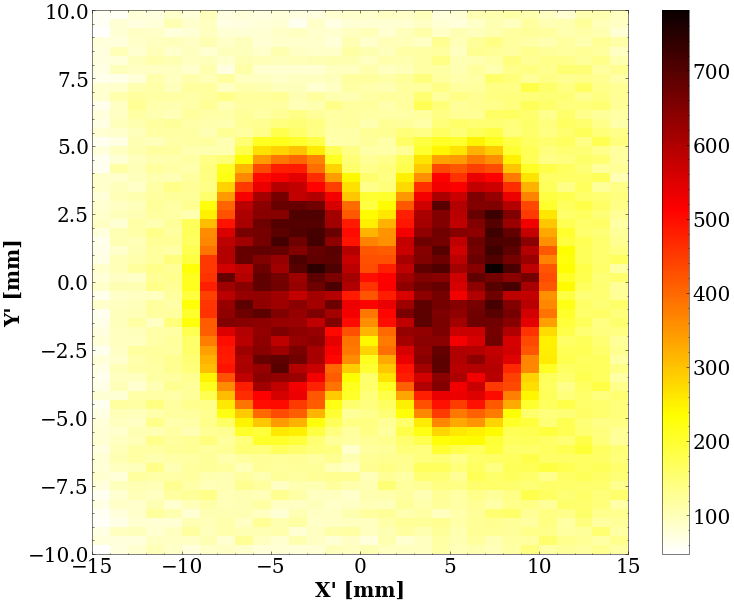

In [239]:
shist_tracks, yedges, xedges = np.histogram2d(y_s[mcp_basic_cut], x_s[mcp_basic_cut], range=[[-10,10],[-15,15]], bins=[60,30])

# shist_tracks = np.where(shist_tracks<15, 0, shist_tracks)

fig, axs = plt.subplots(figsize=(12, 10))
axs.set_xlabel('X\' [mm]')
axs.set_ylabel('Y\' [mm]')
c = axs.pcolormesh(xedges, yedges, shist_tracks, cmap='hot_r', rasterized=True)
fig.colorbar(c, ax=axs)
plt.show()

In [240]:
hmean_q = []
hmean_q2 = []

for i in range(NPADS):
    n = len(mcp1_v[mm_basic_cut[i]])
    xtemp = x_s[mm_basic_cut[i]]
    ytemp = y_s[mm_basic_cut[i]]
    w = mm_qalls[i][mm_basic_cut[i]]

    h1 = ROOT.TH2D(f'hmeanq{i}',f'{pnames[i]} q', 60,-15,15,40,-10,10)
    h1.GetXaxis().SetTitle("X\' [mm]")
    h1.GetYaxis().SetTitle("Y\' [mm]")

    h1.FillN(n,xtemp,ytemp,w)
    h1.Divide(xystrks)
    ht = h1.Clone()
#     ht.SetName(f'pad{pnames[i]}_hist')
#     ht.SetTitle(f'{pnames[i]}')
    for j in range(ht.GetNbinsX()+1):
        for k in range(ht.GetNbinsY()+1):
            if ht.GetBinContent(j,k)<2.:
                ht.SetBinContent(j,k,0)
    
    hmean_q.append(ht)
    
    h2 = ROOT.TH2D(f'hmeanqq{i}',f'{pnames[i]} qq', 60,-15,15,40,-10,10)
    h2.GetXaxis().SetTitle("X\' [mm]")
    h2.GetYaxis().SetTitle("Y\' [mm]")

    h2.FillN(n,xtemp,ytemp,w*w)
    h2.Divide(xystrks)
    ht = h2.Clone()
#     ht.SetName(f'pad{pnames[i]}_hist')
#     ht.SetTitle(f'{pnames[i]}')
    for j in range(ht.GetNbinsX()+1):
        for k in range(ht.GetNbinsY()+1):
            if ht.GetBinContent(j,k)<2.:
                ht.SetBinContent(j,k,0)
    
    hmean_q2.append(ht)
    
    


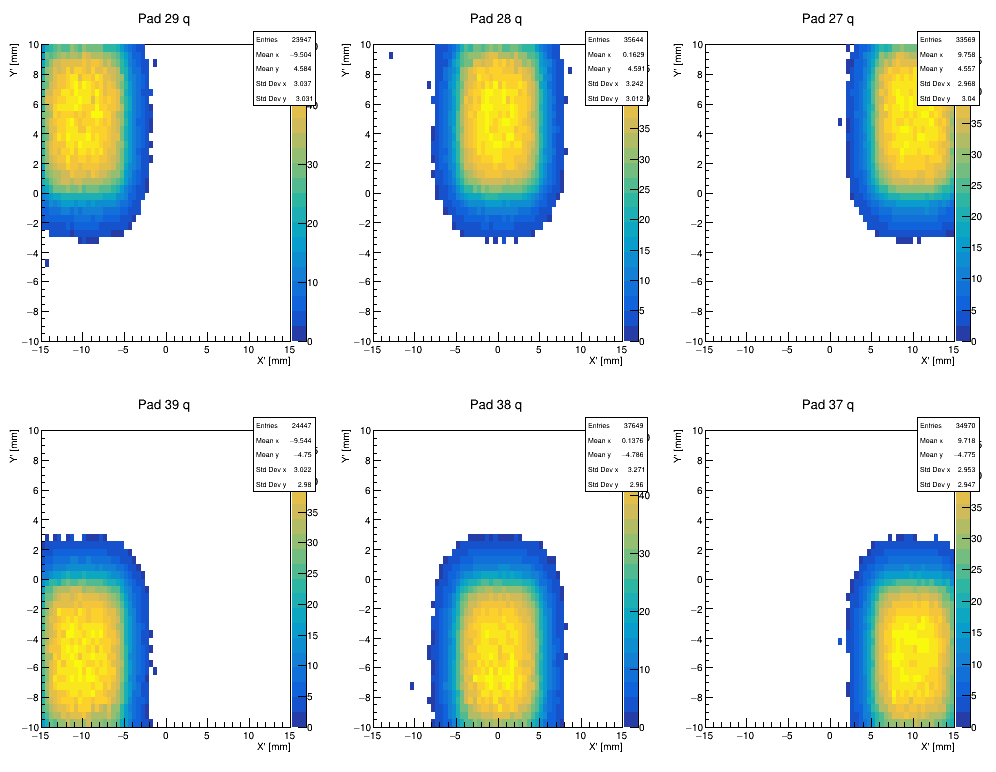

In [241]:
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(3,2)

for i,j in enumerate(pad_order):
    c.cd(i+1)
    hmean_q[j].Draw('colz')
c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cc


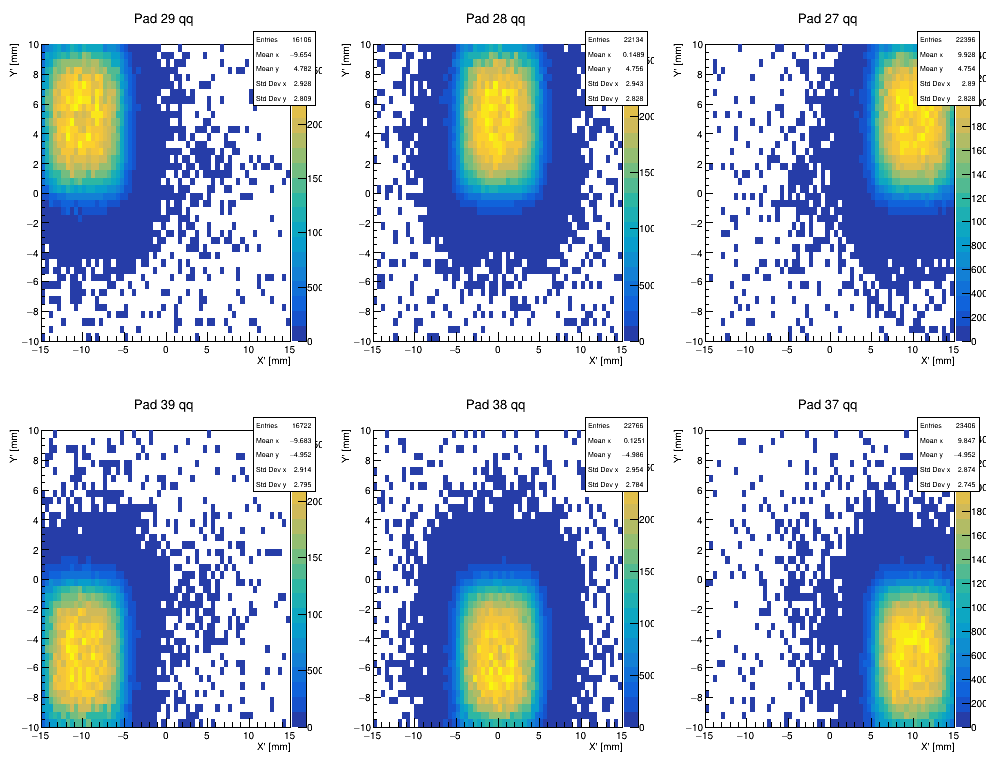

In [242]:
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(3,2)

for i,j in enumerate(pad_order):
    c.cd(i+1)
    hmean_q2[j].Draw('colz')
c.Draw()

In [243]:
hsigma_q = []


for i in range(NPADS):
    h1 = ROOT.TH2D(f'hsigmaq{i}',f'{pnames[i]} sq', 60,-15,15,40,-10,10)
    h1.GetXaxis().SetTitle("X\' [mm]")
    h1.GetYaxis().SetTitle("Y\' [mm]")

    for j in range(h1.GetNbinsX()+1):
        for k in range(h1.GetNbinsY()+1):
            h1.SetBinContent(j,k, hmean_q2[i].GetBinContent(j,k) - hmean_q[i].GetBinContent(j,k)**2)
    
    hsigma_q.append(h1)

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cc


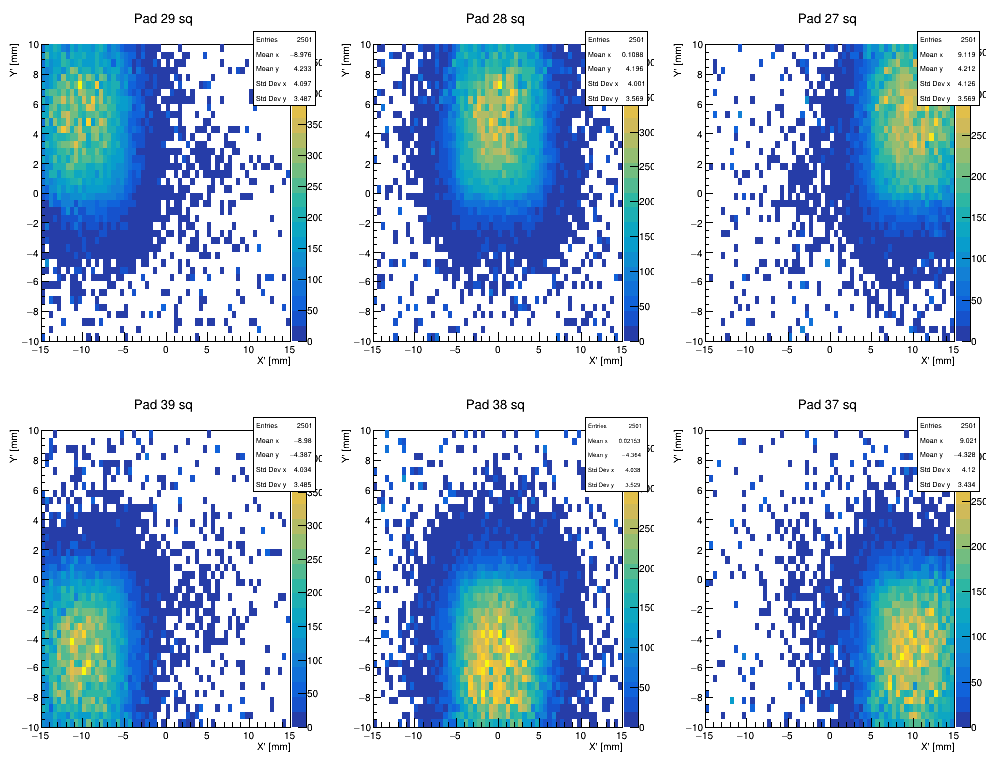

In [244]:
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(3,2)

for i,j in enumerate(pad_order):
    c.cd(i+1)
    hsigma_q[j].Draw('colz')
c.Draw()

In [245]:
print(c1_order.reshape(2,2))
list(permutations(c1_order, 2))

[[4 2]
 [5 3]]


[(4, 2),
 (4, 5),
 (4, 3),
 (2, 4),
 (2, 5),
 (2, 3),
 (5, 4),
 (5, 2),
 (5, 3),
 (3, 4),
 (3, 2),
 (3, 5)]

In [246]:

# xtemp = x_s[mm_basic_cut[2]*mm_basic_cut[5]]
# ytemp = y_s[mm_basic_cut[2]*mm_basic_cut[5]]
# w = mm_qalls[2][mm_basic_cut[2]*mm_basic_cut[5]]*mm_qalls[5][mm_basic_cut[2]*mm_basic_cut[5]]
# # w = mm_qalls[2]*mm_qalls[5]

# hq_12 = ROOT.TH2D(f'hq_12',f'hq_12', 60,-15,15,40,-10,10)
# hq_12.GetXaxis().SetTitle("X\' [mm]")
# hq_12.GetYaxis().SetTitle("Y\' [mm]")

# hq_12.FillN(w.size,xtemp,ytemp,w)
# # hq_12.FillN(w.size,x_s,y_s,w)
# hq_12.Divide(xystrks)

# hcors_12 = ROOT.TH2D(f'hcors_12',f'hcors_12', 60,-15,15,40,-10,10)
# hcors_12.GetXaxis().SetTitle("X\' [mm]")
# hcors_12.GetYaxis().SetTitle("Y\' [mm]")



# for j in range(hcors_12.GetNbinsX()+1):
#     for k in range(hcors_12.GetNbinsY()+1):
#         hcors_12.SetBinContent(j,k, hq_12.GetBinContent(j,k) - hmean_q[2].GetBinContent(j,k)*hmean_q[5].GetBinContent(j,k))

# # for j in range(hcors_12.GetNbinsX()+1):
# #     for k in range(hcors_12.GetNbinsY()+1):
# #         if xystrks.GetBinContent(j,k) < 20:
# #             hcors_12.SetBinContent(j,k,0)


# # for j in range(hcors_12.GetNbinsX()+1):
# #     for k in range(hcors_12.GetNbinsY()+1):
# #         if np.abs(hcors_12.GetBinContent(j,k)) > 500:
# #             hcors_12.SetBinContent(j,k,0)

In [247]:
cors_dict = {}
for i,j in list(permutations(c1_order, 2)):
    xtemp = x_s[mm_basic_cut[i]*mm_basic_cut[j]]
    ytemp = y_s[mm_basic_cut[i]*mm_basic_cut[j]]
    w = mm_qalls[i][mm_basic_cut[i]*mm_basic_cut[j]]*mm_qalls[j][mm_basic_cut[i]*mm_basic_cut[j]]
#     w = mm_qalls[i]*mm_qalls[j]
# # for j in range(hcors_12.GetNbinsX()+1):
# #     for k in range(hcors_12.GetNbinsY()+1):
# #         if np.abs(hcors_12.GetBinContent(j,k)) > 500:
# #             hcors_12.SetBinContent(j,k,0)
    hq_12 = ROOT.TH2D(f'hq_{i}{j}',f'hq_{i}{j}', 60,-15,15,40,-10,10)
    hq_12.GetXaxis().SetTitle("X\' [mm]")
    hq_12.GetYaxis().SetTitle("Y\' [mm]")

    hq_12.FillN(w.size,xtemp,ytemp,w)
#     hq_12.FillN(w.size,x_s,y_s,w)
    hq_12.Divide(xystrks)

    hcors_12 = ROOT.TH2D(f'hcors_{i}{j}',f'hcors_{i}{j}', 60,-15,15,40,-10,10)
    hcors_12.GetXaxis().SetTitle("X\' [mm]")
    hcors_12.GetYaxis().SetTitle("Y\' [mm]")



    for jb in range(hcors_12.GetNbinsX()+1):
        for kb in range(hcors_12.GetNbinsY()+1):
            hcors_12.SetBinContent(jb,kb, hq_12.GetBinContent(jb,kb) - hmean_q[i].GetBinContent(jb,kb)*hmean_q[j].GetBinContent(jb,kb))
    
    for jb in range(hcors_12.GetNbinsX()+1):
        for kb in range(hcors_12.GetNbinsY()+1):
            if np.abs(hcors_12.GetBinContent(jb,kb)) > 500:
                hcors_12.SetBinContent(jb,kb,0)

    cors_dict[i,j] = hcors_12

In [248]:
cors_dict

{(4, 2): <cppyy.gbl.TH2D object at 0x35535770>,
 (4, 5): <cppyy.gbl.TH2D object at 0x29e6ea30>,
 (4, 3): <cppyy.gbl.TH2D object at 0x3558ce30>,
 (2, 4): <cppyy.gbl.TH2D object at 0x35c52c00>,
 (2, 5): <cppyy.gbl.TH2D object at 0x3a984490>,
 (2, 3): <cppyy.gbl.TH2D object at 0x3add18e0>,
 (5, 4): <cppyy.gbl.TH2D object at 0x35d63880>,
 (5, 2): <cppyy.gbl.TH2D object at 0x35b44790>,
 (5, 3): <cppyy.gbl.TH2D object at 0x2377cd80>,
 (3, 4): <cppyy.gbl.TH2D object at 0x3541eb00>,
 (3, 2): <cppyy.gbl.TH2D object at 0x355edb00>,
 (3, 5): <cppyy.gbl.TH2D object at 0x3db5a4b0>}

In [249]:
# %jsroot off
# c = ROOT.TCanvas('cc','', 1000, 800)

# hcors_12.Draw('colz')
# # hcors_12.Draw('lego2z')

# c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cc


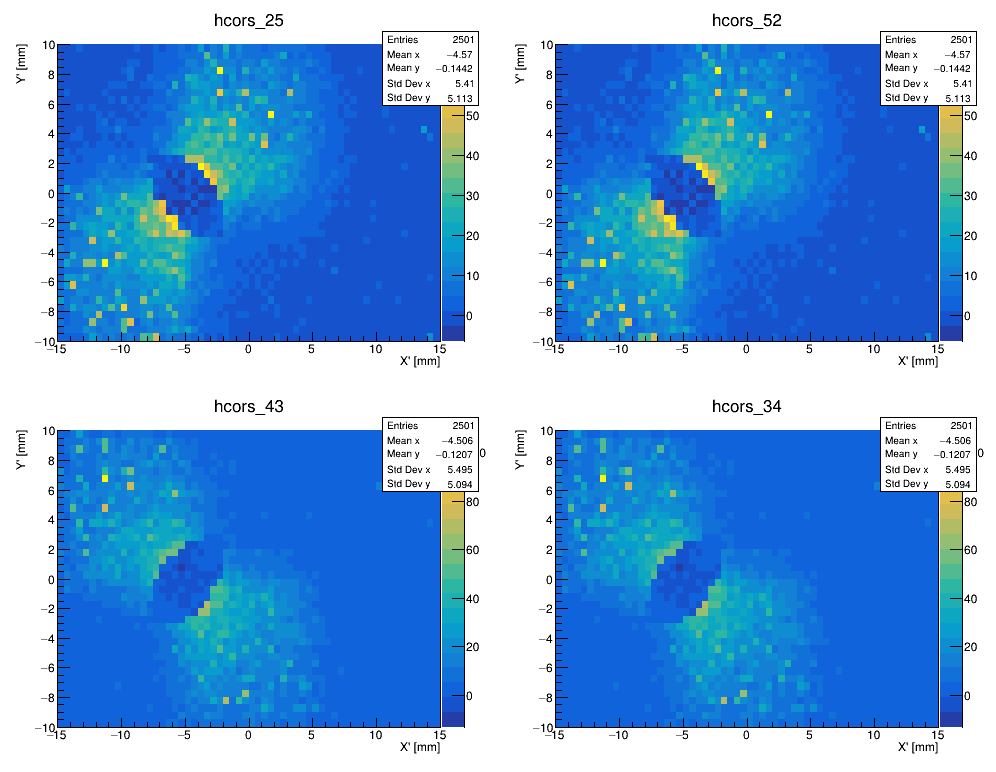

In [250]:

%jsroot off
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(2,2)

c.cd(1)
cors_dict[2,5].Draw('colz')
c.cd(2)
cors_dict[5,2].Draw('colz')

c.cd(3)
cors_dict[4,3].Draw('colz')
c.cd(4)
cors_dict[3,4].Draw('colz')

c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cc


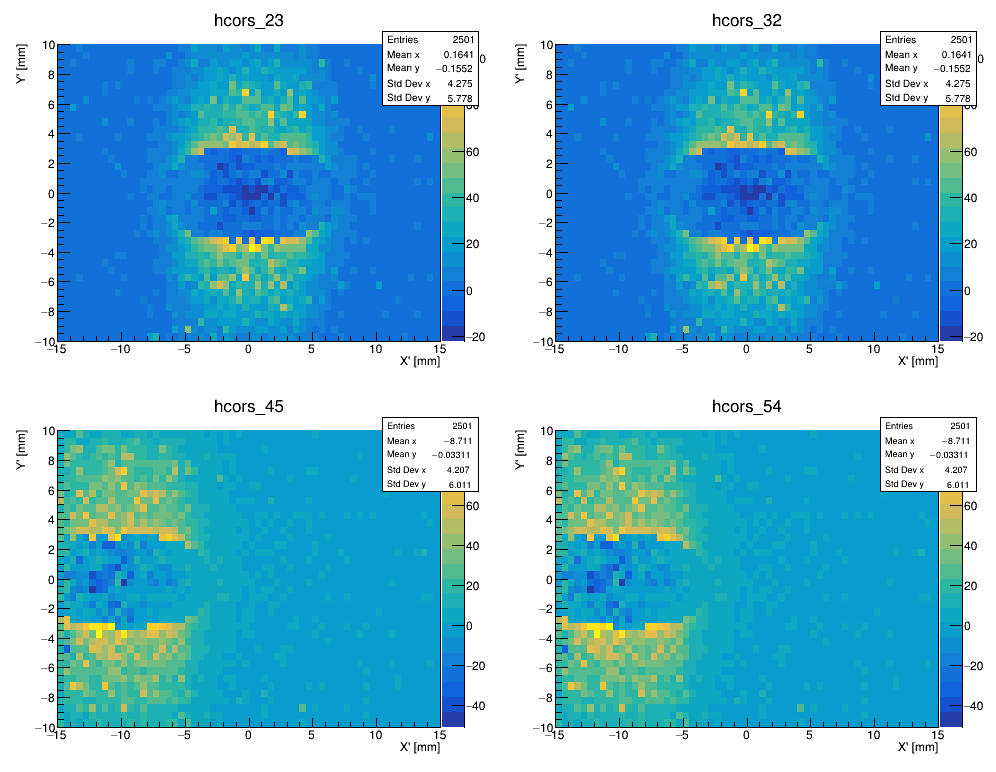

In [251]:

%jsroot off
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(2,2)

c.cd(1)
cors_dict[2,3].Draw('colz')
c.cd(2)
cors_dict[3,2].Draw('colz')

c.cd(3)
cors_dict[4,5].Draw('colz')
c.cd(4)
cors_dict[5,4].Draw('colz')

c.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: cc


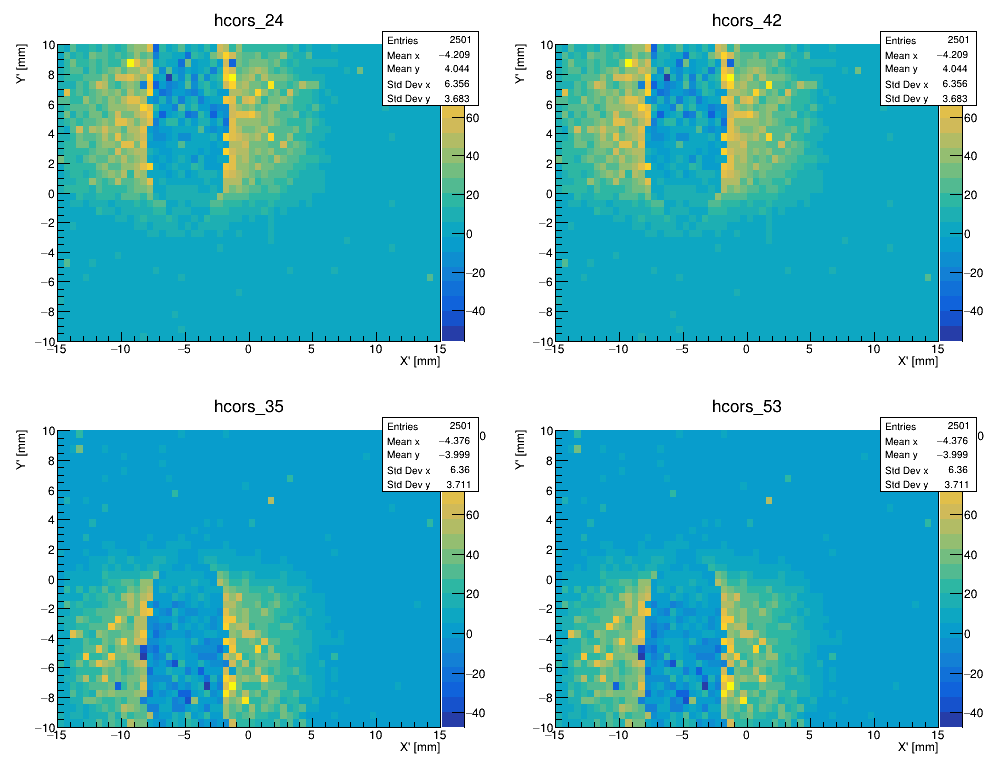

In [252]:

%jsroot off
c = ROOT.TCanvas('cc','', 1000, 800)
c.Divide(2,2)

c.cd(1)
cors_dict[2,4].Draw('colz')
c.cd(2)
cors_dict[4,2].Draw('colz')

c.cd(3)
cors_dict[3,5].Draw('colz')
c.cd(4)
cors_dict[5,3].Draw('colz')

c.Draw()